# Contents
* [Introduction](#Introduction)
* [Imports and configuration](#Imports-and-configuration)
* [Data loading](#Data-loading)
* [Setup](#Setup)
* [Score models](#Score-models)
* [Results](#Results)
* [Discussion](#Discussion)

# Introduction

This notebook examines the efficacy of LOF scores as features.

# Imports and configuration

In [1]:
from time import time

notebook_begin_time = time()

# set random seeds

from os import environ
from random import seed as random_seed
from numpy.random import seed as np_seed
from tensorflow.random import set_seed


def reset_seeds(seed: int) -> None:
    """Utility function for resetting random seeds"""
    environ["PYTHONHASHSEED"] = str(seed)
    random_seed(seed)
    np_seed(seed)
    set_seed(seed)


reset_seeds(SEED := 2021)
del environ
del random_seed
del np_seed
del set_seed
del reset_seeds

In [2]:
# extensions
%load_ext autotime
%load_ext lab_black
%load_ext nb_black

In [3]:
# core
import numpy as np
import pandas as pd

# utility
from collections import namedtuple
from gc import collect as gc_collect
from itertools import combinations
from os.path import isdir
from tqdm.notebook import tqdm

# typing
from typing import Any, Callable, Dict, List

# faster pandas & sklearn
import swifter
from sklearnex import patch_sklearn

patch_sklearn()
del patch_sklearn

# metrics
from imblearn.metrics import geometric_mean_score
from sklearn.metrics import (
    accuracy_score,
    balanced_accuracy_score,
    f1_score,
    roc_auc_score,
)

# other sklearn
from sklearn.calibration import CalibratedClassifierCV
from sklearn.linear_model import (
    LogisticRegression,
    LogisticRegressionCV,
    RidgeClassifier,
    RidgeClassifierCV,
    SGDClassifier,
)
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler
from sklearn.svm import LinearSVC, SVC

# scipy
from scipy.stats import loguniform, uniform

# visualization
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_context("notebook")
%matplotlib inline

# display outputs w/o print calls
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"
del InteractiveShell

# hide warnings
import warnings

warnings.filterwarnings("ignore")
del warnings

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


time: 3.75 s


In [4]:
# Location of cross validation data
FRILL_FEATHERS_FOLDER = "../10.0-mic-prepare_train-test_splits_on_full_data"

# Location where this notebook will output
DATA_OUT_FOLDER = "."

_ = gc_collect()

time: 117 ms


# Setup

In this section, we define some structures to keep track of models and scores.

In [5]:
GaussianNB_models = {
    "GaussianNB": lambda: GaussianNB(),
    "GaussianNB_acc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=RandomizedSearchCV(
            estimator=GaussianNB(),
            param_distributions={"var_smoothing": np.logspace(-1, -11, num=100)},
            n_iter=50,
            scoring="accuracy",
            n_jobs=-1,
            verbose=2,
            random_state=SEED,
        ),
        method="isotonic",
    ),
    "GaussianNB_balacc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=RandomizedSearchCV(
            estimator=GaussianNB(),
            param_distributions={"var_smoothing": np.logspace(-1, -11, num=100)},
            n_iter=50,
            scoring="balanced_accuracy",
            n_jobs=-1,
            verbose=2,
            random_state=SEED,
        ),
        method="isotonic",
    ),
    "GaussianNB_f1_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=RandomizedSearchCV(
            estimator=GaussianNB(),
            param_distributions={"var_smoothing": np.logspace(-1, -11, num=100)},
            n_iter=50,
            scoring="f1_weighted",
            n_jobs=-1,
            verbose=2,
            random_state=SEED,
        ),
        method="isotonic",
    ),
    "GaussianNB_auroc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=RandomizedSearchCV(
            estimator=GaussianNB(),
            param_distributions={"var_smoothing": np.logspace(-1, -11, num=100)},
            n_iter=50,
            scoring="roc_auc_ovo_weighted",
            n_jobs=-1,
            verbose=2,
            random_state=SEED,
        ),
        method="isotonic",
    ),
    "GaussianNB_acc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=RandomizedSearchCV(
            estimator=GaussianNB(),
            param_distributions={"var_smoothing": np.logspace(-1, -11, num=100)},
            n_iter=50,
            scoring="accuracy",
            n_jobs=-1,
            verbose=2,
            random_state=SEED,
        ),
        method="sigmoid",
    ),
    "GaussianNB_balacc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=RandomizedSearchCV(
            estimator=GaussianNB(),
            param_distributions={"var_smoothing": np.logspace(-1, -11, num=100)},
            n_iter=50,
            scoring="balanced_accuracy",
            n_jobs=-1,
            verbose=2,
            random_state=SEED,
        ),
        method="sigmoid",
    ),
    "GaussianNB_f1_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=RandomizedSearchCV(
            estimator=GaussianNB(),
            param_distributions={"var_smoothing": np.logspace(-1, -11, num=100)},
            n_iter=50,
            scoring="f1_weighted",
            n_jobs=-1,
            verbose=2,
            random_state=SEED,
        ),
        method="sigmoid",
    ),
    "GaussianNB_auroc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=RandomizedSearchCV(
            estimator=GaussianNB(),
            param_distributions={"var_smoothing": np.logspace(-1, -11, num=100)},
            n_iter=50,
            scoring="roc_auc_ovo_weighted",
            n_jobs=-1,
            verbose=2,
            random_state=SEED,
        ),
        method="sigmoid",
    ),
}
LinearSVC_models = {
    "LinearSVC": lambda: LinearSVC(dual=False, random_state=SEED),
    "LinearSVC_iso-calib": lambda: CalibratedClassifierCV(
        LinearSVC(dual=False, random_state=SEED), method="isotonic"
    ),
    "LinearSVC_sig-calib": lambda: CalibratedClassifierCV(
        LinearSVC(dual=False, random_state=SEED), method="sigmoid"
    ),
    "LinearSVC_acc": lambda: GridSearchCV(
        estimator=LinearSVC(dual=False, random_state=SEED),
        param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
        scoring="accuracy",
        n_jobs=-1,
        verbose=2,
    ),
    "LinearSVC_balacc": lambda: GridSearchCV(
        estimator=LinearSVC(dual=False, random_state=SEED),
        param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
        scoring="balanced_accuracy",
        n_jobs=-1,
        verbose=2,
    ),
    "LinearSVC_f1": lambda: GridSearchCV(
        estimator=LinearSVC(dual=False, random_state=SEED),
        param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
        scoring="f1_weighted",
        n_jobs=-1,
        verbose=2,
    ),
    "LinearSVC_acc_iso-calib": lambda: CalibratedClassifierCV(
        GridSearchCV(
            estimator=LinearSVC(dual=False, random_state=SEED),
            param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
            scoring="accuracy",
            n_jobs=-1,
            verbose=2,
        ),
        method="isotonic",
    ),
    "LinearSVC_balacc_iso-calib": lambda: CalibratedClassifierCV(
        GridSearchCV(
            estimator=LinearSVC(dual=False, random_state=SEED),
            param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
            scoring="balanced_accuracy",
            n_jobs=-1,
            verbose=2,
        ),
        method="isotonic",
    ),
    "LinearSVC_f1_iso-calib": lambda: CalibratedClassifierCV(
        GridSearchCV(
            estimator=LinearSVC(dual=False, random_state=SEED),
            param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
            scoring="f1_weighted",
            n_jobs=-1,
            verbose=2,
        ),
        method="isotonic",
    ),
    "LinearSVC_acc_sig-calib": lambda: CalibratedClassifierCV(
        GridSearchCV(
            estimator=LinearSVC(dual=False, random_state=SEED),
            param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
            scoring="accuracy",
            n_jobs=-1,
            verbose=2,
        ),
        method="sigmoid",
    ),
    "LinearSVC_balacc_sig-calib": lambda: CalibratedClassifierCV(
        GridSearchCV(
            estimator=LinearSVC(dual=False, random_state=SEED),
            param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
            scoring="balanced_accuracy",
            n_jobs=-1,
            verbose=2,
        ),
        method="sigmoid",
    ),
    "LinearSVC_f1_sig-calib": lambda: CalibratedClassifierCV(
        GridSearchCV(
            estimator=LinearSVC(dual=False, random_state=SEED),
            param_grid={"C": [0.1, 1.0, 10.0], "class_weight": ["balanced", None]},
            scoring="f1_weighted",
            n_jobs=-1,
            verbose=2,
        ),
        method="sigmoid",
    ),
}

_ = gc_collect()

time: 126 ms


In [6]:
LogReg_models_1 = {
    "LogReg": lambda: LogisticRegression(max_iter=500, n_jobs=-1, random_state=SEED),
    "LogReg_acc": lambda: RandomizedSearchCV(
        estimator=LogisticRegression(
            max_iter=300, n_jobs=-1, class_weight=None, random_state=SEED
        ),
        n_iter=50,
        param_distributions={"C": loguniform(0.0001, 1000)},
        scoring="accuracy",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "LogReg_balacc": lambda: RandomizedSearchCV(
        estimator=LogisticRegression(
            max_iter=300, n_jobs=-1, class_weight="balanced", random_state=SEED
        ),
        n_iter=50,
        param_distributions={"C": loguniform(0.0001, 1000)},
        scoring="balanced_accuracy",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "LogReg_f1": lambda: RandomizedSearchCV(
        estimator=LogisticRegression(max_iter=300, n_jobs=-1, random_state=SEED),
        n_iter=50,
        param_distributions=[
            {
                "C": loguniform(0.0001, 1000),
                "class_weight": ["balanced", None],
            },
        ],
        scoring="f1_weighted",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "LogReg_auroc": lambda: RandomizedSearchCV(
        estimator=LogisticRegression(max_iter=300, n_jobs=-1, random_state=SEED),
        n_iter=50,
        param_distributions=[
            {
                "C": loguniform(0.0001, 1000),
                "class_weight": ["balanced", None],
            },
        ],
        scoring="roc_auc_ovo_weighted",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
}
LogReg_models_iso = {
    "LogReg_acc-iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=LogReg_models_1["LogReg_acc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "LogReg_balacc-iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=LogReg_models_1["LogReg_balacc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "LogReg_f1-iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=LogReg_models_1["LogReg_f1"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "LogReg_auroc-iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=LogReg_models_1["LogReg_auroc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
}
LogReg_models_sig = {
    "LogReg_acc-sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=LogReg_models_1["LogReg_acc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "LogReg_balacc-sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=LogReg_models_1["LogReg_balacc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "LogReg_f1-sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=LogReg_models_1["LogReg_f1"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "LogReg_auroc-sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=LogReg_models_1["LogReg_auroc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
}

_ = gc_collect()

time: 132 ms


In [7]:
Ridge_models_1 = {
    "Ridge": lambda: RidgeClassifier(),
    "Ridge_acc": lambda: RidgeClassifierCV(scoring="accuracy", class_weight=None),
    "Ridge_balacc": lambda: RidgeClassifierCV(
        scoring="balanced_accuracy", class_weight="balanced"
    ),
    "Ridge_f1": lambda: GridSearchCV(
        estimator=RidgeClassifierCV(scoring="f1_weighted"),
        param_grid={"class_weight": ["balanced", None]},
        scoring="f1_weighted",
    ),
}
Ridge_models_2 = {
    "Ridge_acc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=Ridge_models_1["Ridge_acc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "Ridge_balacc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=Ridge_models_1["Ridge_balacc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "Ridge_f1_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=Ridge_models_1["Ridge_f1"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "Ridge_acc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=Ridge_models_1["Ridge_acc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "Ridge_balacc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=Ridge_models_1["Ridge_balacc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "Ridge_f1_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=Ridge_models_1["Ridge_f1"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
}
SGD_models_1 = {
    "SGD": lambda: SGDClassifier(verbose=1, n_jobs=-1, random_state=SEED),
    "SGD_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGDClassifier(verbose=1, n_jobs=-1, random_state=SEED),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGDClassifier(verbose=1, n_jobs=-1, random_state=SEED),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_acc": lambda: RandomizedSearchCV(
        estimator=SGDClassifier(
            verbose=1, n_jobs=-1, random_state=SEED, class_weight=None
        ),
        param_distributions={
            "loss": ["hinge", "log", "modified_huber"],
            "alpha": loguniform(0.000001, 10.0),
        },
        n_iter=50,
        scoring="accuracy",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "SGD_balacc": lambda: RandomizedSearchCV(
        estimator=SGDClassifier(
            verbose=1, n_jobs=-1, random_state=SEED, class_weight="balanced"
        ),
        param_distributions={
            "loss": ["hinge", "log", "modified_huber"],
            "alpha": loguniform(0.000001, 10.0),
        },
        n_iter=25,
        scoring="balanced_accuracy",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "SGD_f1": lambda: RandomizedSearchCV(
        estimator=SGDClassifier(verbose=1, n_jobs=-1, random_state=SEED),
        param_distributions={
            "loss": ["hinge", "log", "modified_huber"],
            "alpha": loguniform(0.000001, 10.0),
            "class_weight": ["balanced", None],
        },
        n_iter=25,
        scoring="f1_weighted",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "SGD_auroc": lambda: RandomizedSearchCV(
        estimator=SGDClassifier(verbose=1, n_jobs=-1, random_state=SEED),
        param_distributions={
            "loss": ["hinge", "log", "modified_huber"],
            "alpha": loguniform(0.000001, 10.0),
            "class_weight": ["balanced", None],
        },
        n_iter=25,
        scoring="roc_auc_ovo_weighted",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
}
SGD_models_2 = {
    "SGD_acc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGD_models_1["SGD_acc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_balacc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGD_models_1["SGD_balacc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_f1_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGD_models_1["SGD_f1"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_auroc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGD_models_1["SGD_auroc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_acc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGD_models_1["SGD_acc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_balacc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGD_models_1["SGD_balacc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_f1_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGD_models_1["SGD_f1"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SGD_auroc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SGD_models_1["SGD_auroc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
}
SVC_models_1 = {
    "SVC": lambda: SVC(random_state=SEED),
    "SVC_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC(random_state=SEED),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC(random_state=SEED),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_acc": lambda: RandomizedSearchCV(
        estimator=SVC(class_weight=None, random_state=SEED),
        param_distributions={
            "C": loguniform(0.01, 100.0),
            "kernel": ["poly", "rbf", "sigmoid"],
        },
        n_iter=20,
        scoring="accuracy",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "SVC_balacc": lambda: RandomizedSearchCV(
        estimator=SVC(class_weight="balanced", random_state=SEED),
        param_distributions={
            "C": loguniform(0.01, 100.0),
            "kernel": ["poly", "rbf", "sigmoid"],
        },
        n_iter=20,
        scoring="balanced_accuracy",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "SVC_f1": lambda: RandomizedSearchCV(
        estimator=SVC(random_state=SEED),
        param_distributions={
            "C": loguniform(0.01, 100.0),
            "kernel": ["poly", "rbf", "sigmoid"],
            "class_weight": ["balanced", None],
        },
        n_iter=20,
        scoring="f1_weighted",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
    "SVC_auroc": lambda: RandomizedSearchCV(
        estimator=SVC(probability=True, random_state=SEED),
        param_distributions={
            "C": loguniform(0.01, 100.0),
            "kernel": ["poly", "rbf", "sigmoid"],
            "class_weight": ["balanced", None],
        },
        n_iter=20,
        scoring="roc_auc_ovo_weighted",
        n_jobs=-1,
        verbose=2,
        random_state=SEED,
    ),
}
SVC_models_2 = {
    "SVC_acc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC_models_1["SVC_acc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_balacc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC_models_1["SVC_balacc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_f1_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC_models_1["SVC_f1"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_auroc_iso-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC_models_1["SVC_auroc"](),
        method="isotonic",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_acc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC_models_1["SVC_acc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_balacc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC_models_1["SVC_balacc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_f1_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC_models_1["SVC_f1"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
    "SVC_auroc_sig-calib": lambda: CalibratedClassifierCV(
        base_estimator=SVC_models_1["SVC_auroc"](),
        method="sigmoid",
        cv=3,
        n_jobs=-1,
        ensemble=False,
    ),
}

MODELS = {
    **GaussianNB_models,
    **LinearSVC_models,
    **LogReg_models_1,
    **LogReg_models_iso,
    **LogReg_models_sig,
    **Ridge_models_1,
    **Ridge_models_2,
    **SGD_models_1,
    **SGD_models_2,
    **SVC_models_1,
    **SVC_models_2,
}

_ = gc_collect()

time: 127 ms


In [8]:
METRICS = (
    "accuracy",
    "adjusted_balanced_accuracy",
    "f1",
    "geometric_mean",
    "roc_auc",
    "fit_time",
    "predict_time",
)

# to be cast to pd.DataFrame
make_results = lambda: {
    key: [] for key in {"model_name", "case", "preprocessing", *METRICS}
}
results_ = make_results()

AvgScores = namedtuple("AvgScores", METRICS)


def store_result(
    where: Dict[str, List],
    model_name: str,
    case: str,
    preprocessing: str,
    avg_scores: AvgScores,
) -> None:
    "Appends a model's scores and fit/predict times to the results dict."
    for attribute, value in {
        "model_name": model_name,
        "case": case,
        "preprocessing": preprocessing,
        **avg_scores._asdict(),
    }.items():
        where[attribute].append(value)


def create_results_df(results_dict: Dict[str, List]) -> pd.DataFrame:
    """Create a results dataframe from the results dictionary"""
    df = (
        pd.DataFrame(results_dict)
        .sort_values(by=["preprocessing", "model_name"], ascending=True)
        .sort_values(by=["fit_time", "predict_time"], ascending=True)
        .sort_values(
            by=[
                "accuracy",
                "adjusted_balanced_accuracy",
                "geometric_mean",
                "f1",
                "roc_auc",
            ],
            ascending=False,
        )
        .sort_values(by=["case"], ascending=True)
        .reset_index(drop=True)
    )[
        [  # selection order
            "model_name",
            "case",
            "preprocessing",
            "accuracy",
            "adjusted_balanced_accuracy",
            "f1",
            "geometric_mean",
            "roc_auc",
            "fit_time",
            "predict_time",
        ]
    ]
    df.loc[:, "case"] = df.loc[:, "case"].astype("category")
    df.loc[:, "preprocessing"] = df.loc[:, "preprocessing"].astype("category")
    return df


ALL_CASES = {"ternary"}
LOF_K = ["10", "20", "30"]

_ = gc_collect()

time: 128 ms


In [9]:
predictions_ = {key: [] for key in {"model", "case", "preprocessing", "fold", "y_pred"}}

Prediction = namedtuple("Prediction", predictions_.keys())


def store_prediction(where: Dict[str, List], prediction: Prediction) -> None:
    "Records the y_pred of a classifier on a fold"
    for k, v in prediction._asdict().items():
        where[k].append(v)


_ = gc_collect()

time: 124 ms


In [10]:
def print_and_append(to_append: Any, append_to: List[Any]) -> List[Any]:
    """Given an object and a list, pass the object to print() and then append it to the list, which is returned"""
    print(to_append)
    append_to.append(to_append)
    return append_to


def prep_y_pred(label: int) -> np.ndarray:
    """Prepares labels for AUROC scoring"""
    _ = [0, 0, 0]
    _[label] = 1
    return np.asarray(_, dtype=np.float64)


def format_preprocessing_str(sets: List[str]) -> str:
    """Helper function for recording string info of features"""
    return "+".join(sorted(sets))


def evaluate_model(
    model_base: str,
    case: str,
    preprocessing: List[str],
    track_fold_time: bool = True,
) -> AvgScores:
    """Evaluate a model with cross validation on prepared folds."""
    preprocessing_string: str = format_preprocessing_str(preprocessing)
    (
        fit_times,
        predict_times,
        accuracy,
        adjusted_balanced_accuracy,
        f1,
        geometric_mean,
        roc_auc,
    ) = ([] for _ in range(7))
    fold_num = 0
    while isdir(prefix := f"{FRILL_FEATHERS_FOLDER}/cv_{fold_num}"):
        if track_fold_time:
            fold_begin = time()

        # subset data
        lof_cols: List[str] = []
        scaling_needed = False
        if lda_bool := "LDA" in preprocessing:
            preprocessing.remove("LDA")
            scaling_needed = True if len(preprocessing) > 0 else False
        if "LOF-PCA" in preprocessing:
            lof_cols.extend(["LOF-PCA_neg", "LOF-PCA_neu", "LOF-PCA_pos"])
            preprocessing.remove("LOF-PCA")
        lof_cols.extend(
            [
                f"LOF_{valence}_{lof_set}"
                for lof_set in preprocessing
                for valence in ("neg", "neu", "pos")
            ]
        )

        def read_feather_cv(filename: str, columns: List[str] = None) -> pd.DataFrame:
            """Helper function for reading data"""
            return pd.read_feather(f"{prefix}/{filename}.feather", columns=columns)

        if scaling_needed:
            # read data just in time
            X_train = pd.concat(
                [
                    read_feather_cv("X_train_LDA"),
                    read_feather_cv("X_train_LOF_scores", columns=lof_cols),
                ],
                axis="columns",
            )
            _ = gc_collect()
            scaler = StandardScaler().fit(X_train)
            X_train = scaler.transform(X_train)
        elif lda_bool:
            X_train = read_feather_cv("X_train_LDA").values
        else:
            X_train = read_feather_cv("X_train_LOF_scores", columns=lof_cols).values

        # initialize model
        model = MODELS[model_base]()

        # fit
        begin = time()
        model.fit(X_train, read_feather_cv("y_train_untransformed").iloc[:, 0])
        end = time()
        del X_train
        _ = gc_collect()
        fit_times.append(end - begin)
        print(f"fitted {model_base} in {end - begin:.2f} s")

        try:
            print("best score: ", model.best_score_)
            print(model.best_params_)
        except AttributeError:
            pass

        # load test data
        if scaling_needed:
            X_test = scaler.transform(
                pd.concat(
                    [
                        read_feather_cv("X_test_LDA"),
                        read_feather_cv("X_test_LOF_scores", columns=lof_cols),
                    ],
                    axis="columns",
                )
            )
            del scaler
        elif lda_bool:
            X_test = read_feather_cv("X_test_LDA").values
        else:
            X_test = read_feather_cv("X_test_LOF_scores", columns=lof_cols).values
        del lda_bool
        del lof_cols
        del scaling_needed
        _ = gc_collect()

        # predict
        begin = time()
        predicted = model.predict(X_test)
        end = time()
        try:
            proba_predict = model.predict_proba(X_test)
        except AttributeError:
            # some classifiers do not support .predict_proba
            proba_predict = np.stack(pd.Series(predicted).swifter.apply(prep_y_pred))
        del X_test
        del model
        _ = gc_collect()
        predict_times.append(end - begin)
        print(f"predicted in {end - begin:.2f} s")
        del end
        del begin
        _ = gc_collect()
        store_prediction(
            where=predictions_,
            prediction=Prediction(
                model=model_base,
                case=case,
                preprocessing=preprocessing_string,
                fold=fold_num,
                y_pred=proba_predict,
            ),
        )

        # score
        score_params = {
            "y_true": read_feather_cv("y_test_untransformed").iloc[:, 0],
            "y_pred": predicted,
        }
        del read_feather_cv
        _ = gc_collect()
        print("accuracy: ", end="")
        accuracy = print_and_append(
            to_append=accuracy_score(**score_params), append_to=accuracy
        )
        print("adjusted balanced accuracy: ", end="")
        adjusted_balanced_accuracy = print_and_append(
            to_append=balanced_accuracy_score(**score_params, adjusted=True),
            append_to=adjusted_balanced_accuracy,
        )
        print("f1: ", end="")
        f1 = print_and_append(
            to_append=f1_score(**score_params, average="weighted"), append_to=f1
        )
        print("geometric mean: ", end="")
        geometric_mean = print_and_append(
            to_append=geometric_mean_score(**score_params), append_to=geometric_mean
        )
        print("roc auc: ", end="")
        roc_auc = print_and_append(
            to_append=roc_auc_score(
                y_true=score_params["y_true"],
                y_score=proba_predict,
                average="weighted",
                multi_class="ovo",
            ),
            append_to=roc_auc,
        )
        del score_params
        del predicted
        del proba_predict
        _ = gc_collect()

        if track_fold_time:
            print(
                f"{model_base} fold {fold_num + 1} completed in {time() - fold_begin:.2f} s"
            )
            del fold_begin
            _ = gc_collect()

        fold_num += 1

    return AvgScores(
        *[
            np.mean(_)
            for _ in (
                accuracy,
                adjusted_balanced_accuracy,
                f1,
                geometric_mean,
                roc_auc,
                fit_times,
                predict_times,
            )
        ]
    )


case = "ternary"

_ = gc_collect()

time: 123 ms


# Score models

In [11]:
def score_models(models: Dict[str, Callable]) -> None:
    """Score the models in the given dictionary"""
    for model in tqdm(models):
        for preprocessing in (
            ["LDA"],
            ["LOF-PCA"],
            ["LDA", "LOF-PCA"],
            *[[lof_k] for lof_k in LOF_K],
            *[list(_) for _ in combinations(LOF_K + ["LDA"], 2)],
            *[list(_) for _ in combinations(LOF_K + ["LDA"], 3)],
            LOF_K + ["LDA"],
        ):
            print(f"evaluating {model}...")
            eval_begin = time()
            store_result(
                where=results_,
                model_name=model,
                case="ternary",
                preprocessing=format_preprocessing_str(preprocessing),
                avg_scores=evaluate_model(
                    model_base=model, case="ternary", preprocessing=preprocessing
                ),
            )
            print(f"stored {model} in {time() - eval_begin:.2f} s")
            del eval_begin
            _ = gc_collect()


_ = gc_collect()

time: 119 ms


In [10]:
score_models(GaussianNB_models)
_ = create_results_df(results_)
_
_.to_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_GaussianNB.feather")
del _
_ = gc_collect()

  0%|          | 0/9 [00:00<?, ?it/s]

evaluating GaussianNB...
fitted GaussianNB in 0.31 s
predicted in 0.00 s
accuracy: 0.6388024307099451
adjusted balanced accuracy: 0.3078084321636786
f1: 0.6201531933432604
geometric mean: 0.49464781544620634
roc auc: 0.7569917058749666
GaussianNB fold 1 completed in 1.06 s
fitted GaussianNB in 0.03 s
predicted in 0.01 s
accuracy: 0.5307185005206525
adjusted balanced accuracy: 0.22142072923922562
f1: 0.5078529127892283
geometric mean: 0.35903527858574724
roc auc: 0.6900866348445028
GaussianNB fold 2 completed in 0.78 s
fitted GaussianNB in 0.03 s
predicted in 0.01 s
accuracy: 0.494073192194213
adjusted balanced accuracy: 0.18294585186478898
f1: 0.48143330081824837
geometric mean: 0.37394179495507246
roc auc: 0.6534664966422746
GaussianNB fold 3 completed in 0.81 s
fitted GaussianNB in 0.02 s
predicted in 0.01 s
accuracy: 0.5218869528261794
adjusted balanced accuracy: 0.20865415697202125
f1: 0.5196504513901267
geometric mean: 0.4426999892792684
roc auc: 0.6574947953914203
GaussianNB fold

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
0,GaussianNB_auroc_sig-calib,ternary,LDA,0.564367,0.156268,0.515977,0.330388,0.680554,15.389846,0.043460
1,GaussianNB_acc_sig-calib,ternary,20,0.552863,0.081721,0.469514,0.214757,0.653007,6.700911,0.020946
2,GaussianNB_balacc_sig-calib,ternary,30,0.552613,0.076224,0.464582,0.201098,0.654317,7.004349,0.024223
3,GaussianNB_f1_sig-calib,ternary,30,0.552610,0.076265,0.464624,0.201290,0.654310,7.420188,0.017712
4,GaussianNB_balacc_sig-calib,ternary,20,0.552583,0.081326,0.469225,0.214855,0.652815,7.025097,0.020994
...,...,...,...,...,...,...,...,...,...,...
148,GaussianNB_auroc_iso-calib,ternary,10+30+LDA,0.555370,0.185847,0.525205,0.365979,0.687810,11.930851,0.039848
149,GaussianNB_f1_iso-calib,ternary,10+30+LDA,0.555353,0.183853,0.524634,0.364344,0.687548,9.065604,0.043169
150,GaussianNB_balacc_iso-calib,ternary,10+20+LDA,0.555333,0.188800,0.526189,0.369549,0.684897,9.197410,0.050005
151,GaussianNB_acc_sig-calib,ternary,10+30,0.556006,0.103411,0.486832,0.252990,0.658426,7.913932,0.022062


time: 2h 2min 35s


In [10]:
score_models(LinearSVC_models)
_ = create_results_df(results_)
_
_.to_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_LinearSVC.feather")
del _
_ = gc_collect()

  0%|          | 0/12 [00:00<?, ?it/s]

evaluating LinearSVC...
fitted LinearSVC in 0.42 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 155045.00it/s]


predicted in 0.02 s
accuracy: 0.637616718541574
adjusted balanced accuracy: 0.3026694505385763
f1: 0.6169134274123971
geometric mean: 0.48458557979562794
roc auc: 0.6483656733991998
LinearSVC fold 1 completed in 1.34 s
fitted LinearSVC in 0.65 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 160059.21it/s]


predicted in 0.00 s
accuracy: 0.5784449843804235
adjusted balanced accuracy: 0.09920686496396584
f1: 0.5036801790497859
geometric mean: 0.2111586938481075
roc auc: 0.5479392537944897
LinearSVC fold 2 completed in 1.57 s
fitted LinearSVC in 0.59 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 205528.35it/s]


predicted in 0.00 s
accuracy: 0.5495626067601843
adjusted balanced accuracy: 0.11705637039527829
f1: 0.48343031612639625
geometric mean: 0.23246879209921475
roc auc: 0.5610341848516934
LinearSVC fold 3 completed in 1.44 s
fitted LinearSVC in 0.38 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 196206.71it/s]


predicted in 0.00 s
accuracy: 0.5660085770583008
adjusted balanced accuracy: 0.154170256310722
f1: 0.5180329040680952
geometric mean: 0.3076075801650233
roc auc: 0.5775422364104466
LinearSVC fold 4 completed in 1.29 s
fitted LinearSVC in 0.56 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 308155.53it/s]


predicted in 0.00 s
accuracy: 0.4997580450036293
adjusted balanced accuracy: 0.11491637085694588
f1: 0.44789488242093267
geometric mean: 0.2839683189349646
roc auc: 0.5589864064437281
LinearSVC fold 5 completed in 1.39 s
stored LinearSVC in 7.62 s
evaluating LinearSVC...
fitted LinearSVC in 0.10 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 162577.02it/s]


predicted in 0.00 s
accuracy: 0.5769230769230769
adjusted balanced accuracy: 0.10341809977768547
f1: 0.5023346439621832
geometric mean: 0.1715960603902373
roc auc: 0.5544970178299997
LinearSVC fold 1 completed in 1.02 s
fitted LinearSVC in 0.67 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 167005.25it/s]


predicted in 0.00 s
accuracy: 0.5784449843804235
adjusted balanced accuracy: 0.09920686496396584
f1: 0.5036801790497859
geometric mean: 0.2111586938481075
roc auc: 0.5479392537944897
LinearSVC fold 2 completed in 1.52 s
fitted LinearSVC in 0.53 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 169472.59it/s]


predicted in 0.00 s
accuracy: 0.5495626067601843
adjusted balanced accuracy: 0.11705637039527829
f1: 0.48343031612639625
geometric mean: 0.23246879209921475
roc auc: 0.5610341848516934
LinearSVC fold 3 completed in 1.48 s
fitted LinearSVC in 0.48 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 163820.91it/s]


predicted in 0.00 s
accuracy: 0.5660085770583008
adjusted balanced accuracy: 0.154170256310722
f1: 0.5180329040680952
geometric mean: 0.3076075801650233
roc auc: 0.5775422364104466
LinearSVC fold 4 completed in 1.44 s
fitted LinearSVC in 0.59 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 185762.79it/s]


predicted in 0.00 s
accuracy: 0.4997580450036293
adjusted balanced accuracy: 0.11491637085694588
f1: 0.44789488242093267
geometric mean: 0.2839683189349646
roc auc: 0.5589864064437281
LinearSVC fold 5 completed in 1.48 s
stored LinearSVC in 7.56 s
evaluating LinearSVC...
fitted LinearSVC in 0.20 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 170814.26it/s]


predicted in 0.00 s
accuracy: 0.649325626204239
adjusted balanced accuracy: 0.3185643205351037
f1: 0.6262216684009249
geometric mean: 0.48900550019260125
roc auc: 0.6568583547161507
LinearSVC fold 1 completed in 1.21 s
fitted LinearSVC in 0.64 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 187788.12it/s]


predicted in 0.00 s
accuracy: 0.5784449843804235
adjusted balanced accuracy: 0.09920686496396584
f1: 0.5036801790497859
geometric mean: 0.2111586938481075
roc auc: 0.5479392537944897
LinearSVC fold 2 completed in 1.49 s
fitted LinearSVC in 0.59 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 149404.92it/s]


predicted in 0.00 s
accuracy: 0.5495626067601843
adjusted balanced accuracy: 0.11705637039527829
f1: 0.48343031612639625
geometric mean: 0.23246879209921475
roc auc: 0.5610341848516934
LinearSVC fold 3 completed in 1.57 s
fitted LinearSVC in 0.52 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 140815.17it/s]


predicted in 0.00 s
accuracy: 0.5660085770583008
adjusted balanced accuracy: 0.154170256310722
f1: 0.5180329040680952
geometric mean: 0.3076075801650233
roc auc: 0.5775422364104466
LinearSVC fold 4 completed in 1.51 s
fitted LinearSVC in 0.57 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 182182.81it/s]


predicted in 0.00 s
accuracy: 0.4997580450036293
adjusted balanced accuracy: 0.11491637085694588
f1: 0.44789488242093267
geometric mean: 0.2839683189349646
roc auc: 0.5589864064437281
LinearSVC fold 5 completed in 1.46 s
stored LinearSVC in 7.82 s
evaluating LinearSVC...
fitted LinearSVC in 0.15 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 203765.62it/s]


predicted in 0.00 s
accuracy: 0.5744034385652883
adjusted balanced accuracy: 0.10430289409259398
f1: 0.5035943229954007
geometric mean: 0.19279951540432594
roc auc: 0.5549278700157415
LinearSVC fold 1 completed in 1.01 s
fitted LinearSVC in 0.15 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 216131.24it/s]


predicted in 0.00 s
accuracy: 0.5752342936480389
adjusted balanced accuracy: 0.08351019866843722
f1: 0.49474582022929087
geometric mean: 0.1959106323712413
roc auc: 0.5405575136850166
LinearSVC fold 2 completed in 0.99 s
fitted LinearSVC in 0.13 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 178500.09it/s]


predicted in 0.00 s
accuracy: 0.5364666908225063
adjusted balanced accuracy: 0.09233609936978042
f1: 0.46570778047028977
geometric mean: 0.21999998902476206
roc auc: 0.5478203820713812
LinearSVC fold 3 completed in 1.05 s
fitted LinearSVC in 0.11 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 169568.01it/s]


predicted in 0.00 s
accuracy: 0.5554997488699146
adjusted balanced accuracy: 0.1303757836095486
f1: 0.503735037046547
geometric mean: 0.2913608056832294
roc auc: 0.565862785589553
LinearSVC fold 4 completed in 1.08 s
fitted LinearSVC in 0.14 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 168790.29it/s]


predicted in 0.00 s
accuracy: 0.49413259133801113
adjusted balanced accuracy: 0.10196312767172043
f1: 0.4365196556698091
geometric mean: 0.27131935255305034
roc auc: 0.5524793847914103
LinearSVC fold 5 completed in 1.04 s
stored LinearSVC in 5.75 s
evaluating LinearSVC...
fitted LinearSVC in 0.13 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 195515.88it/s]


predicted in 0.00 s
accuracy: 0.5798873573440048
adjusted balanced accuracy: 0.10352715341377296
f1: 0.5033170105446769
geometric mean: 0.16757406314858425
roc auc: 0.5546677482335111
LinearSVC fold 1 completed in 1.00 s
fitted LinearSVC in 0.16 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 193534.17it/s]


predicted in 0.00 s
accuracy: 0.5791391877820201
adjusted balanced accuracy: 0.08613955905895425
f1: 0.4955519693083922
geometric mean: 0.18068232368638765
roc auc: 0.5416960213523649
LinearSVC fold 2 completed in 1.00 s
fitted LinearSVC in 0.13 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 199667.24it/s]


predicted in 0.00 s
accuracy: 0.5396242041513536
adjusted balanced accuracy: 0.0919767609764759
f1: 0.46598294690289804
geometric mean: 0.19782048316885184
roc auc: 0.5486193559673961
LinearSVC fold 3 completed in 1.04 s
fitted LinearSVC in 0.12 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 162445.23it/s]


predicted in 0.00 s
accuracy: 0.5576246957462427
adjusted balanced accuracy: 0.12230774631675813
f1: 0.49958743405127026
geometric mean: 0.26411148749988184
roc auc: 0.5618053832259164
LinearSVC fold 4 completed in 1.09 s
fitted LinearSVC in 0.12 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 151007.18it/s]


predicted in 0.00 s
accuracy: 0.49993951125090735
adjusted balanced accuracy: 0.1042735491103912
f1: 0.43667023988835535
geometric mean: 0.25415787035075826
roc auc: 0.5537567100732878
LinearSVC fold 5 completed in 1.05 s
stored LinearSVC in 5.78 s
evaluating LinearSVC...
fitted LinearSVC in 0.13 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 165051.87it/s]


predicted in 0.00 s
accuracy: 0.5734400474284868
adjusted balanced accuracy: 0.0862999948826008
f1: 0.4937885799573774
geometric mean: 0.1433621451353997
roc auc: 0.5464186424968169
LinearSVC fold 1 completed in 1.01 s
fitted LinearSVC in 0.15 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 208565.95it/s]


predicted in 0.00 s
accuracy: 0.5793127386324193
adjusted balanced accuracy: 0.08228362201465465
f1: 0.4922805762508708
geometric mean: 0.15812289181998765
roc auc: 0.5401323098951885
LinearSVC fold 2 completed in 1.00 s
fitted LinearSVC in 0.12 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 174371.17it/s]


predicted in 0.00 s
accuracy: 0.541073554531808
adjusted balanced accuracy: 0.0908135048729191
f1: 0.46563307276892557
geometric mean: 0.18663635748222038
roc auc: 0.5482203496692779
LinearSVC fold 3 completed in 1.03 s
fitted LinearSVC in 0.11 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 180863.54it/s]


predicted in 0.00 s
accuracy: 0.5581655913147626
adjusted balanced accuracy: 0.11608587326614316
f1: 0.49686157459825725
geometric mean: 0.25325912703687276
roc auc: 0.5587914752161544
LinearSVC fold 4 completed in 1.08 s
fitted LinearSVC in 0.14 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 189820.87it/s]


predicted in 0.00 s
accuracy: 0.5020566174691508
adjusted balanced accuracy: 0.10373866740548458
f1: 0.43522841048999744
geometric mean: 0.24115724121611265
roc auc: 0.5536209553734023
LinearSVC fold 5 completed in 1.02 s
stored LinearSVC in 5.72 s
evaluating LinearSVC...
fitted LinearSVC in 0.26 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 169825.57it/s]


predicted in 0.00 s
accuracy: 0.5758855787757522
adjusted balanced accuracy: 0.11143991041314254
f1: 0.5059545492676821
geometric mean: 0.18836680316421997
roc auc: 0.558650990780011
LinearSVC fold 1 completed in 1.13 s
fitted LinearSVC in 0.31 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 180846.33it/s]


predicted in 0.00 s
accuracy: 0.5800069420340159
adjusted balanced accuracy: 0.09782833370495538
f1: 0.5032517727858278
geometric mean: 0.20727790739185986
roc auc: 0.5474362820083225
LinearSVC fold 2 completed in 1.14 s
fitted LinearSVC in 0.27 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 200611.41it/s]


predicted in 0.00 s
accuracy: 0.5450075055644702
adjusted balanced accuracy: 0.10935600044381642
f1: 0.4778572029976248
geometric mean: 0.2274633813493174
roc auc: 0.5570388649531269
LinearSVC fold 3 completed in 1.18 s
fitted LinearSVC in 0.22 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 188507.31it/s]


predicted in 0.00 s
accuracy: 0.56353591160221
adjusted balanced accuracy: 0.15006884071796445
f1: 0.5154444346051882
geometric mean: 0.3061083847586346
roc auc: 0.5756129117446376
LinearSVC fold 4 completed in 1.17 s
fitted LinearSVC in 0.29 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 181871.25it/s]


predicted in 0.00 s
accuracy: 0.4981248487781273
adjusted balanced accuracy: 0.1116348964813162
f1: 0.4450296547643321
geometric mean: 0.2820766815159337
roc auc: 0.5571924536197546
LinearSVC fold 5 completed in 1.18 s
stored LinearSVC in 6.40 s
evaluating LinearSVC...
fitted LinearSVC in 0.28 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 178081.74it/s]


predicted in 0.00 s
accuracy: 0.5761078998073218
adjusted balanced accuracy: 0.11406799471267128
f1: 0.5069752690551386
geometric mean: 0.19137323222345806
roc auc: 0.559969793920023
LinearSVC fold 1 completed in 1.15 s
fitted LinearSVC in 0.32 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 223538.96it/s]


predicted in 0.00 s
accuracy: 0.5791391877820201
adjusted balanced accuracy: 0.0981545883979301
f1: 0.5027964874039434
geometric mean: 0.20297515310086583
roc auc: 0.5475120429501432
LinearSVC fold 2 completed in 1.16 s
fitted LinearSVC in 0.25 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 147182.60it/s]


predicted in 0.00 s
accuracy: 0.5488379315699571
adjusted balanced accuracy: 0.11544146982282923
f1: 0.48217204493071514
geometric mean: 0.2297069085157705
roc auc: 0.560151735781409
LinearSVC fold 3 completed in 1.18 s
fitted LinearSVC in 0.21 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 160748.01it/s]


predicted in 0.00 s
accuracy: 0.5664722018313179
adjusted balanced accuracy: 0.1535640354881247
f1: 0.517754577226306
geometric mean: 0.3044984033403076
roc auc: 0.5773881185813935
LinearSVC fold 4 completed in 1.19 s
fitted LinearSVC in 0.29 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 195453.44it/s]


predicted in 0.00 s
accuracy: 0.5001209774981853
adjusted balanced accuracy: 0.11471732861505822
f1: 0.4476507333825681
geometric mean: 0.28119327090380764
roc auc: 0.558967132923237
LinearSVC fold 5 completed in 1.16 s
stored LinearSVC in 6.42 s
evaluating LinearSVC...
fitted LinearSVC in 0.18 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 205756.07it/s]


predicted in 0.00 s
accuracy: 0.6525863346672596
adjusted balanced accuracy: 0.32758149946621085
f1: 0.6311466878062889
geometric mean: 0.4992902576915099
roc auc: 0.6613385345066883
LinearSVC fold 1 completed in 1.18 s
fitted LinearSVC in 0.15 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 158822.22it/s]


predicted in 0.00 s
accuracy: 0.5752342936480389
adjusted balanced accuracy: 0.08351019866843722
f1: 0.49474582022929087
geometric mean: 0.1959106323712413
roc auc: 0.5405575136850166
LinearSVC fold 2 completed in 1.03 s
fitted LinearSVC in 0.14 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 197973.01it/s]


predicted in 0.00 s
accuracy: 0.5364666908225063
adjusted balanced accuracy: 0.09233609936978042
f1: 0.46570778047028977
geometric mean: 0.21999998902476206
roc auc: 0.5478203820713812
LinearSVC fold 3 completed in 1.04 s
fitted LinearSVC in 0.11 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 184564.75it/s]


predicted in 0.00 s
accuracy: 0.5554997488699146
adjusted balanced accuracy: 0.1303757836095486
f1: 0.503735037046547
geometric mean: 0.2913608056832294
roc auc: 0.565862785589553
LinearSVC fold 4 completed in 1.08 s
fitted LinearSVC in 0.14 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 141244.33it/s]


predicted in 0.00 s
accuracy: 0.49413259133801113
adjusted balanced accuracy: 0.10196312767172043
f1: 0.4365196556698091
geometric mean: 0.27131935255305034
roc auc: 0.5524793847914103
LinearSVC fold 5 completed in 1.05 s
stored LinearSVC in 5.94 s
evaluating LinearSVC...
fitted LinearSVC in 0.34 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 178030.20it/s]


predicted in 0.00 s
accuracy: 0.5809989625018527
adjusted balanced accuracy: 0.10933250777958896
f1: 0.5065733472023355
geometric mean: 0.17925481790882045
roc auc: 0.5577854823098509
LinearSVC fold 1 completed in 1.19 s
fitted LinearSVC in 0.32 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 211542.61it/s]


predicted in 0.00 s
accuracy: 0.5782714335300243
adjusted balanced accuracy: 0.08766793948432404
f1: 0.4961675511184827
geometric mean: 0.18137322579618614
roc auc: 0.5423695204361638
LinearSVC fold 2 completed in 1.16 s
fitted LinearSVC in 0.29 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 177825.53it/s]


predicted in 0.00 s
accuracy: 0.545783943268285
adjusted balanced accuracy: 0.10275620938768786
f1: 0.47341471563805787
geometric mean: 0.20640096470091177
roc auc: 0.5539001865042733
LinearSVC fold 3 completed in 1.20 s
fitted LinearSVC in 0.24 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 190040.11it/s]


predicted in 0.00 s
accuracy: 0.562067766487656
adjusted balanced accuracy: 0.13057745484678351
f1: 0.5040002739447504
geometric mean: 0.2648407929837082
roc auc: 0.5658460114625041
LinearSVC fold 4 completed in 1.20 s
fitted LinearSVC in 0.33 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 211217.69it/s]


predicted in 0.00 s
accuracy: 0.502359061214614
adjusted balanced accuracy: 0.11197999653337402
f1: 0.4439051477982323
geometric mean: 0.26596790759803546
roc auc: 0.5575862200402916
LinearSVC fold 5 completed in 1.20 s
stored LinearSVC in 6.54 s
evaluating LinearSVC...
fitted LinearSVC in 0.20 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 230408.23it/s]


predicted in 0.00 s
accuracy: 0.6491033051726693
adjusted balanced accuracy: 0.31827992421188056
f1: 0.6258657633258765
geometric mean: 0.4882442219045828
roc auc: 0.6566172707848026
LinearSVC fold 1 completed in 1.20 s
fitted LinearSVC in 0.15 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 192640.20it/s]


predicted in 0.00 s
accuracy: 0.5791391877820201
adjusted balanced accuracy: 0.08613955905895425
f1: 0.4955519693083922
geometric mean: 0.18068232368638765
roc auc: 0.5416960213523649
LinearSVC fold 2 completed in 1.01 s
fitted LinearSVC in 0.13 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 163276.25it/s]


predicted in 0.00 s
accuracy: 0.5396242041513536
adjusted balanced accuracy: 0.0919767609764759
f1: 0.46598294690289804
geometric mean: 0.19782048316885184
roc auc: 0.5486193559673961
LinearSVC fold 3 completed in 1.06 s
fitted LinearSVC in 0.11 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 173096.60it/s]


predicted in 0.00 s
accuracy: 0.5576246957462427
adjusted balanced accuracy: 0.12230774631675813
f1: 0.49958743405127026
geometric mean: 0.26411148749988184
roc auc: 0.5618053832259164
LinearSVC fold 4 completed in 1.07 s
fitted LinearSVC in 0.14 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 166750.19it/s]


predicted in 0.00 s
accuracy: 0.49993951125090735
adjusted balanced accuracy: 0.1042735491103912
f1: 0.43667023988835535
geometric mean: 0.25415787035075826
roc auc: 0.5537567100732878
LinearSVC fold 5 completed in 1.05 s
stored LinearSVC in 5.97 s
evaluating LinearSVC...
fitted LinearSVC in 0.19 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 175549.19it/s]


predicted in 0.00 s
accuracy: 0.6446568845412776
adjusted balanced accuracy: 0.3127740860643439
f1: 0.6216049615184327
geometric mean: 0.4840717978874953
roc auc: 0.6540443560335523
LinearSVC fold 1 completed in 1.17 s
fitted LinearSVC in 0.13 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 212424.89it/s]


predicted in 0.00 s
accuracy: 0.5793127386324193
adjusted balanced accuracy: 0.08228362201465465
f1: 0.4922805762508708
geometric mean: 0.15812289181998765
roc auc: 0.5401323098951885
LinearSVC fold 2 completed in 0.98 s
fitted LinearSVC in 0.13 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 185338.81it/s]


predicted in 0.00 s
accuracy: 0.541073554531808
adjusted balanced accuracy: 0.0908135048729191
f1: 0.46563307276892557
geometric mean: 0.18663635748222038
roc auc: 0.5482203496692779
LinearSVC fold 3 completed in 1.04 s
fitted LinearSVC in 0.11 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 197370.67it/s]


predicted in 0.00 s
accuracy: 0.5581655913147626
adjusted balanced accuracy: 0.11608587326614316
f1: 0.49686157459825725
geometric mean: 0.25325912703687276
roc auc: 0.5587914752161544
LinearSVC fold 4 completed in 1.05 s
fitted LinearSVC in 0.12 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 164162.41it/s]


predicted in 0.00 s
accuracy: 0.5020566174691508
adjusted balanced accuracy: 0.10373866740548458
f1: 0.43522841048999744
geometric mean: 0.24115724121611265
roc auc: 0.5536209553734023
LinearSVC fold 5 completed in 1.02 s
stored LinearSVC in 5.87 s
evaluating LinearSVC...
fitted LinearSVC in 0.44 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 182240.67it/s]


predicted in 0.00 s
accuracy: 0.5776641470283089
adjusted balanced accuracy: 0.1171363915151216
f1: 0.5086719232382079
geometric mean: 0.19504656588151956
roc auc: 0.5614551797479898
LinearSVC fold 1 completed in 1.28 s
fitted LinearSVC in 0.48 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 170719.61it/s]


predicted in 0.00 s
accuracy: 0.5785317598056231
adjusted balanced accuracy: 0.09928243932914117
f1: 0.5037399601550723
geometric mean: 0.2111707024180747
roc auc: 0.5479652001059818
LinearSVC fold 2 completed in 1.31 s
fitted LinearSVC in 0.40 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 165816.59it/s]


predicted in 0.00 s
accuracy: 0.5496143692737719
adjusted balanced accuracy: 0.11710598341373447
f1: 0.4834700773538724
geometric mean: 0.23247770680536686
roc auc: 0.561062967413296
LinearSVC fold 3 completed in 1.33 s
fitted LinearSVC in 0.38 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 183072.97it/s]


predicted in 0.00 s
accuracy: 0.5662017540470579
adjusted balanced accuracy: 0.15443140274405873
f1: 0.5182209641247387
geometric mean: 0.30771529194599284
roc auc: 0.5776971107121365
LinearSVC fold 4 completed in 1.32 s
fitted LinearSVC in 0.43 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 168290.10it/s]


predicted in 0.00 s
accuracy: 0.4997580450036293
adjusted balanced accuracy: 0.11491070339009722
f1: 0.447860733591584
geometric mean: 0.28416290686783646
roc auc: 0.558976248733739
LinearSVC fold 5 completed in 1.31 s
stored LinearSVC in 7.15 s
evaluating LinearSVC...
fitted LinearSVC in 0.31 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 192790.66it/s]


predicted in 0.00 s
accuracy: 0.651993478583074
adjusted balanced accuracy: 0.3256040892243263
f1: 0.6301494253962928
geometric mean: 0.4969124618558898
roc auc: 0.6603949203921121
LinearSVC fold 1 completed in 1.29 s
fitted LinearSVC in 0.27 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 169855.11it/s]


predicted in 0.00 s
accuracy: 0.5800069420340159
adjusted balanced accuracy: 0.09782833370495538
f1: 0.5032517727858278
geometric mean: 0.20727790739185986
roc auc: 0.5474362820083225
LinearSVC fold 2 completed in 1.13 s
fitted LinearSVC in 0.24 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 203025.11it/s]


predicted in 0.00 s
accuracy: 0.5450075055644702
adjusted balanced accuracy: 0.10935600044381642
f1: 0.4778572029976248
geometric mean: 0.2274633813493174
roc auc: 0.5570388649531269
LinearSVC fold 3 completed in 1.14 s
fitted LinearSVC in 0.23 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 181195.30it/s]


predicted in 0.00 s
accuracy: 0.56353591160221
adjusted balanced accuracy: 0.15006884071796445
f1: 0.5154444346051882
geometric mean: 0.3061083847586346
roc auc: 0.5756129117446376
LinearSVC fold 4 completed in 1.20 s
fitted LinearSVC in 0.29 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 164337.88it/s]


predicted in 0.00 s
accuracy: 0.4981248487781273
adjusted balanced accuracy: 0.1116348964813162
f1: 0.4450296547643321
geometric mean: 0.2820766815159337
roc auc: 0.5571924536197546
LinearSVC fold 5 completed in 1.18 s
stored LinearSVC in 6.53 s
evaluating LinearSVC...
fitted LinearSVC in 0.29 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 178145.08it/s]


predicted in 0.00 s
accuracy: 0.6522157996146436
adjusted balanced accuracy: 0.3255799321060226
f1: 0.6301819261066232
geometric mean: 0.4963712546414494
roc auc: 0.6604279475920266
LinearSVC fold 1 completed in 1.29 s
fitted LinearSVC in 0.29 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 125204.73it/s]


predicted in 0.00 s
accuracy: 0.5791391877820201
adjusted balanced accuracy: 0.0981545883979301
f1: 0.5027964874039434
geometric mean: 0.20297515310086583
roc auc: 0.5475120429501432
LinearSVC fold 2 completed in 1.16 s
fitted LinearSVC in 0.25 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 172338.84it/s]


predicted in 0.00 s
accuracy: 0.5488379315699571
adjusted balanced accuracy: 0.11544146982282923
f1: 0.48217204493071514
geometric mean: 0.2297069085157705
roc auc: 0.560151735781409
LinearSVC fold 3 completed in 1.16 s
fitted LinearSVC in 0.21 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 173176.68it/s]


predicted in 0.00 s
accuracy: 0.5664722018313179
adjusted balanced accuracy: 0.1535640354881247
f1: 0.517754577226306
geometric mean: 0.3044984033403076
roc auc: 0.5773881185813935
LinearSVC fold 4 completed in 1.17 s
fitted LinearSVC in 0.28 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 213130.29it/s]


predicted in 0.00 s
accuracy: 0.5001209774981853
adjusted balanced accuracy: 0.11471732861505822
f1: 0.4476507333825681
geometric mean: 0.28119327090380764
roc auc: 0.558967132923237
LinearSVC fold 5 completed in 1.16 s
stored LinearSVC in 6.51 s
evaluating LinearSVC...
fitted LinearSVC in 0.31 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 217054.09it/s]


predicted in 0.00 s
accuracy: 0.6518452645620275
adjusted balanced accuracy: 0.3199003577538748
f1: 0.6281853897785441
geometric mean: 0.4895350581983145
roc auc: 0.6573867942141393
LinearSVC fold 1 completed in 1.31 s
fitted LinearSVC in 0.33 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 180344.98it/s]


predicted in 0.00 s
accuracy: 0.5782714335300243
adjusted balanced accuracy: 0.08766793948432404
f1: 0.4961675511184827
geometric mean: 0.18137322579618614
roc auc: 0.5423695204361638
LinearSVC fold 2 completed in 1.16 s
fitted LinearSVC in 0.29 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 153709.70it/s]


predicted in 0.00 s
accuracy: 0.545783943268285
adjusted balanced accuracy: 0.10275620938768786
f1: 0.47341471563805787
geometric mean: 0.20640096470091177
roc auc: 0.5539001865042733
LinearSVC fold 3 completed in 1.22 s
fitted LinearSVC in 0.23 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 172023.06it/s]


predicted in 0.00 s
accuracy: 0.562067766487656
adjusted balanced accuracy: 0.13057745484678351
f1: 0.5040002739447504
geometric mean: 0.2648407929837082
roc auc: 0.5658460114625041
LinearSVC fold 4 completed in 1.20 s
fitted LinearSVC in 0.32 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 156095.76it/s]


predicted in 0.00 s
accuracy: 0.502359061214614
adjusted balanced accuracy: 0.11197999653337402
f1: 0.4439051477982323
geometric mean: 0.26596790759803546
roc auc: 0.5575862200402916
LinearSVC fold 5 completed in 1.21 s
stored LinearSVC in 6.66 s
evaluating LinearSVC...
fitted LinearSVC in 0.42 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 182105.81it/s]


predicted in 0.00 s
accuracy: 0.6522899066251667
adjusted balanced accuracy: 0.32540137645383843
f1: 0.6302880121295723
geometric mean: 0.4964649722112645
roc auc: 0.6603574869271845
LinearSVC fold 1 completed in 1.45 s
fitted LinearSVC in 0.48 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 180203.11it/s]


predicted in 0.00 s
accuracy: 0.5785317598056231
adjusted balanced accuracy: 0.09928243932914117
f1: 0.5037399601550723
geometric mean: 0.2111707024180747
roc auc: 0.5479652001059818
LinearSVC fold 2 completed in 1.34 s
fitted LinearSVC in 0.42 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 167399.91it/s]


predicted in 0.00 s
accuracy: 0.5496143692737719
adjusted balanced accuracy: 0.11710598341373447
f1: 0.4834700773538724
geometric mean: 0.23247770680536686
roc auc: 0.561062967413296
LinearSVC fold 3 completed in 1.33 s
fitted LinearSVC in 0.39 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 177297.15it/s]


predicted in 0.00 s
accuracy: 0.5662017540470579
adjusted balanced accuracy: 0.15443140274405873
f1: 0.5182209641247387
geometric mean: 0.30771529194599284
roc auc: 0.5776971107121365
LinearSVC fold 4 completed in 1.34 s
fitted LinearSVC in 0.41 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 194927.61it/s]


predicted in 0.00 s
accuracy: 0.4997580450036293
adjusted balanced accuracy: 0.11491070339009722
f1: 0.447860733591584
geometric mean: 0.28416290686783646
roc auc: 0.558976248733739
LinearSVC fold 5 completed in 1.27 s
stored LinearSVC in 7.31 s
evaluating LinearSVC_iso-calib...
fitted LinearSVC_iso-calib in 0.43 s
predicted in 0.03 s
accuracy: 0.6359863643100637
adjusted balanced accuracy: 0.3153162508745417
f1: 0.6186070315299477
geometric mean: 0.4978780317372877
roc auc: 0.7547400928393699
LinearSVC_iso-calib fold 1 completed in 1.27 s
fitted LinearSVC_iso-calib in 2.52 s
predicted in 0.02 s
accuracy: 0.5619576535925026
adjusted balanced accuracy: 0.15755557477716367
f1: 0.5309195232410733
geometric mean: 0.3594766678766047
roc auc: 0.6935498950756351
LinearSVC_iso-calib fold 2 completed in 3.37 s
fitted LinearSVC_iso-calib in 2.32 s
predicted in 0.04 s
accuracy: 0.5366737408768569
adjusted balanced accuracy: 0.16540224482204224
f1: 0.5102486485730731
geometric mean: 0.359672344254

Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 196842.54it/s]


predicted in 0.00 s
accuracy: 0.637616718541574
adjusted balanced accuracy: 0.3026694505385763
f1: 0.6169134274123971
geometric mean: 0.48458557979562794
roc auc: 0.6483656733991998
LinearSVC_acc fold 1 completed in 5.23 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.59 s
best score:  0.6158067849709765
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 146351.77it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_acc fold 2 completed in 7.48 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.00 s
best score:  0.6577772262469785
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 172846.89it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_acc fold 3 completed in 6.94 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 5.43 s
best score:  0.6224182943529021
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 194064.73it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_acc fold 4 completed in 6.39 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.21 s
best score:  0.674124181144973
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 170504.02it/s]


predicted in 0.00 s
accuracy: 0.501996128720058
adjusted balanced accuracy: 0.18910482731232783
f1: 0.48968978342904246
geometric mean: 0.4148715498612564
roc auc: 0.5959387849605629
LinearSVC_acc fold 5 completed in 7.11 s
stored LinearSVC_acc in 33.75 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.80 s
best score:  0.6130099620782851
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 206927.34it/s]


predicted in 0.00 s
accuracy: 0.5385356454720617
adjusted balanced accuracy: 0.17244833847836785
f1: 0.5156722129769554
geometric mean: 0.343524196302754
roc auc: 0.5867157627719451
LinearSVC_acc fold 1 completed in 2.66 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.64 s
best score:  0.6158067849709765
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 230679.31it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_acc fold 2 completed in 7.48 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.01 s
best score:  0.6577772262469785
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 161734.11it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_acc fold 3 completed in 6.96 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 5.43 s
best score:  0.6224182943529021
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 179106.01it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_acc fold 4 completed in 6.39 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.21 s
best score:  0.674124181144973
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 192591.97it/s]


predicted in 0.00 s
accuracy: 0.501996128720058
adjusted balanced accuracy: 0.18910482731232783
f1: 0.48968978342904246
geometric mean: 0.4148715498612564
roc auc: 0.5959387849605629
LinearSVC_acc fold 5 completed in 7.10 s
stored LinearSVC_acc in 31.20 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.32 s
best score:  0.7226902021933077
{'C': 1.0, 'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 182770.32it/s]


predicted in 0.00 s
accuracy: 0.649325626204239
adjusted balanced accuracy: 0.3185643205351037
f1: 0.6262216684009249
geometric mean: 0.48900550019260125
roc auc: 0.6568583547161507
LinearSVC_acc fold 1 completed in 3.31 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.62 s
best score:  0.6158067849709765
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 199459.25it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_acc fold 2 completed in 7.49 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.01 s
best score:  0.6577772262469785
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 151603.15it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_acc fold 3 completed in 6.96 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 5.40 s
best score:  0.6224182943529021
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 176539.74it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_acc fold 4 completed in 6.37 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 6.22 s
best score:  0.674124181144973
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 182893.99it/s]


predicted in 0.00 s
accuracy: 0.501996128720058
adjusted balanced accuracy: 0.18910482731232783
f1: 0.48968978342904246
geometric mean: 0.4148715498612564
roc auc: 0.5959387849605629
LinearSVC_acc fold 5 completed in 7.12 s
stored LinearSVC_acc in 31.88 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.04 s
best score:  0.610975924640521
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 191242.85it/s]


predicted in 0.00 s
accuracy: 0.5174892544834742
adjusted balanced accuracy: 0.1649221983212298
f1: 0.5071711445290213
geometric mean: 0.37239405652088997
roc auc: 0.582610871202669
LinearSVC_acc fold 1 completed in 2.91 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.08 s
best score:  0.6107953564093929
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 222139.72it/s]


predicted in 0.00 s
accuracy: 0.5498090940645609
adjusted balanced accuracy: 0.19001600549787692
f1: 0.5379746590723209
geometric mean: 0.42044721685090297
roc auc: 0.5909422703671832
LinearSVC_acc fold 2 completed in 2.95 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.75 s
best score:  0.646269791593601
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 156550.51it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.193925586977115
f1: 0.5157435081293987
geometric mean: 0.4111787120284273
roc auc: 0.5987953077377506
LinearSVC_acc fold 3 completed in 2.68 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.64 s
best score:  0.614253208268707
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 199244.16it/s]


predicted in 0.00 s
accuracy: 0.5198006413476026
adjusted balanced accuracy: 0.20460183725302206
f1: 0.5159889405969915
geometric mean: 0.4354029554313045
roc auc: 0.6005241927914242
LinearSVC_acc fold 4 completed in 2.59 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.82 s
best score:  0.6714896041013956
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 197511.13it/s]


predicted in 0.00 s
accuracy: 0.49588676506169854
adjusted balanced accuracy: 0.1812284489669671
f1: 0.48548720538288304
geometric mean: 0.4148988071715083
roc auc: 0.5920591815786502
LinearSVC_acc fold 5 completed in 2.71 s
stored LinearSVC_acc in 14.47 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.98 s
best score:  0.6020077184673458
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 214276.56it/s]


predicted in 0.00 s
accuracy: 0.5403142137246183
adjusted balanced accuracy: 0.1722350762364885
f1: 0.516568427941081
geometric mean: 0.3426040292851855
roc auc: 0.5866961714460717
LinearSVC_acc fold 1 completed in 2.85 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.06 s
best score:  0.6018094389789115
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 194682.39it/s]


predicted in 0.00 s
accuracy: 0.5472058313085734
adjusted balanced accuracy: 0.1496004039170726
f1: 0.5212021677434252
geometric mean: 0.36125889890209995
roc auc: 0.5703949737273797
LinearSVC_acc fold 2 completed in 2.93 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.86 s
best score:  0.6406643267280379
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 192167.11it/s]


predicted in 0.00 s
accuracy: 0.526321238159325
adjusted balanced accuracy: 0.17514997904041044
f1: 0.508582128373145
geometric mean: 0.3747587120265689
roc auc: 0.5905409050997652
LinearSVC_acc fold 3 completed in 2.76 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.62 s
best score:  0.5993524411653036
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 189886.20it/s]


predicted in 0.00 s
accuracy: 0.5289185952169377
adjusted balanced accuracy: 0.19636820846702766
f1: 0.5198935759950505
geometric mean: 0.4168705410665235
roc auc: 0.5972202882845853
LinearSVC_acc fold 4 completed in 2.60 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.79 s
best score:  0.6562090572486471
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 199211.76it/s]


predicted in 0.00 s
accuracy: 0.5035688361964674
adjusted balanced accuracy: 0.17525161461016722
f1: 0.4841147334828482
geometric mean: 0.3863295908880193
roc auc: 0.5890816234796898
LinearSVC_acc fold 5 completed in 2.68 s
stored LinearSVC_acc in 14.47 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.01 s
best score:  0.5892447069465703
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 143743.35it/s]


predicted in 0.00 s
accuracy: 0.5413517118719431
adjusted balanced accuracy: 0.1586902925395142
f1: 0.5085849494129838
geometric mean: 0.29848073559103344
roc auc: 0.5801981354006491
LinearSVC_acc fold 1 completed in 2.88 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.09 s
best score:  0.5898060358337456
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 207924.46it/s]


predicted in 0.00 s
accuracy: 0.547292606733773
adjusted balanced accuracy: 0.13509875326267995
f1: 0.5130970458143527
geometric mean: 0.3269676473830801
roc auc: 0.5631802175233562
LinearSVC_acc fold 2 completed in 2.93 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.87 s
best score:  0.6293494108018903
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 185284.57it/s]


predicted in 0.00 s
accuracy: 0.5227496247217764
adjusted balanced accuracy: 0.15659633670483983
f1: 0.4989463019744696
geometric mean: 0.3357030441209256
roc auc: 0.5815016950863585
LinearSVC_acc fold 3 completed in 2.79 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.62 s
best score:  0.5868173714497761
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 205890.60it/s]


predicted in 0.00 s
accuracy: 0.5303481049337403
adjusted balanced accuracy: 0.186203383136055
f1: 0.517945805161251
geometric mean: 0.4000089174694965
roc auc: 0.5922899281938407
LinearSVC_acc fold 4 completed in 2.56 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.86 s
best score:  0.6355739105667901
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 172894.14it/s]


predicted in 0.00 s
accuracy: 0.49987902250181465
adjusted balanced accuracy: 0.16116991531533373
f1: 0.47509350959543634
geometric mean: 0.3576314316106518
roc auc: 0.5823938034070317
LinearSVC_acc fold 5 completed in 2.76 s
stored LinearSVC_acc in 14.51 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.32 s
best score:  0.6162722911170115
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 171000.57it/s]


predicted in 0.00 s
accuracy: 0.5221579961464354
adjusted balanced accuracy: 0.16661297917745457
f1: 0.50809134428072
geometric mean: 0.3602234722089309
roc auc: 0.5836902684911768
LinearSVC_acc fold 1 completed in 4.21 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.37 s
best score:  0.6158067513971887
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 141295.34it/s]


predicted in 0.00 s
accuracy: 0.5511975008677542
adjusted balanced accuracy: 0.19839887811375287
f1: 0.5409608075114171
geometric mean: 0.42935280657221725
roc auc: 0.5950243275702235
LinearSVC_acc fold 2 completed in 4.26 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.95 s
best score:  0.6548707390832446
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 163478.84it/s]


predicted in 0.00 s
accuracy: 0.526631813240851
adjusted balanced accuracy: 0.19506693227240915
f1: 0.5159025134161085
geometric mean: 0.4112640866610065
roc auc: 0.5996784620467857
LinearSVC_acc fold 3 completed in 3.88 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.84 s
best score:  0.6202496857803423
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 175693.47it/s]


predicted in 0.00 s
accuracy: 0.5240891704980103
adjusted balanced accuracy: 0.20901886504349895
f1: 0.5197065919636965
geometric mean: 0.43627136112466863
roc auc: 0.6028658911756939
LinearSVC_acc fold 4 completed in 3.80 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.26 s
best score:  0.6743235545428653
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 129159.12it/s]


predicted in 0.00 s
accuracy: 0.49860875877086863
adjusted balanced accuracy: 0.18607793108551285
f1: 0.487763270208293
geometric mean: 0.41672202087720406
roc auc: 0.5944083966210099
LinearSVC_acc fold 5 completed in 4.35 s
stored LinearSVC_acc in 21.13 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.46 s
best score:  0.618729313139251
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 210766.38it/s]


predicted in 0.00 s
accuracy: 0.5270490588409663
adjusted balanced accuracy: 0.17126134462682638
f1: 0.5105237618047543
geometric mean: 0.35605604837704385
roc auc: 0.5859270888563206
LinearSVC_acc fold 1 completed in 4.34 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.46 s
best score:  0.6160194051193046
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 222347.16it/s]


predicted in 0.00 s
accuracy: 0.5538875390489414
adjusted balanced accuracy: 0.20078658010302375
f1: 0.5424067273366362
geometric mean: 0.42775234131359585
roc auc: 0.5960152370878221
LinearSVC_acc fold 2 completed in 4.32 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.04 s
best score:  0.6588153112568806
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 171937.68it/s]


predicted in 0.00 s
accuracy: 0.5315492520316787
adjusted balanced accuracy: 0.19910195843445622
f1: 0.5194914750003656
geometric mean: 0.41138620889543454
roc auc: 0.601566321581121
LinearSVC_acc fold 3 completed in 3.97 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.74 s
best score:  0.6230425634618036
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 175910.12it/s]


predicted in 0.00 s
accuracy: 0.5270640961248696
adjusted balanced accuracy: 0.2124802448545384
f1: 0.5222687742250165
geometric mean: 0.43717592569718133
roc auc: 0.6047077341818092
LinearSVC_acc fold 4 completed in 3.72 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.08 s
best score:  0.6738251210481344
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 186869.17it/s]


predicted in 0.00 s
accuracy: 0.500181466247278
adjusted balanced accuracy: 0.1857968566893429
f1: 0.48787013964925097
geometric mean: 0.412377469613072
roc auc: 0.5943530120797078
LinearSVC_acc fold 5 completed in 3.97 s
stored LinearSVC_acc in 20.93 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.22 s
best score:  0.7265532212737182
{'C': 1.0, 'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 222070.27it/s]


predicted in 0.00 s
accuracy: 0.6525863346672596
adjusted balanced accuracy: 0.32758149946621085
f1: 0.6311466878062889
geometric mean: 0.4992902576915099
roc auc: 0.6613385345066883
LinearSVC_acc fold 1 completed in 3.23 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.07 s
best score:  0.6107953564093929
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 138364.14it/s]


predicted in 0.00 s
accuracy: 0.5498090940645609
adjusted balanced accuracy: 0.19001600549787692
f1: 0.5379746590723209
geometric mean: 0.42044721685090297
roc auc: 0.5909422703671832
LinearSVC_acc fold 2 completed in 2.94 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.80 s
best score:  0.646269791593601
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 163126.04it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.193925586977115
f1: 0.5157435081293987
geometric mean: 0.4111787120284273
roc auc: 0.5987953077377506
LinearSVC_acc fold 3 completed in 2.71 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.64 s
best score:  0.614253208268707
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 155195.36it/s]


predicted in 0.00 s
accuracy: 0.5198006413476026
adjusted balanced accuracy: 0.20460183725302206
f1: 0.5159889405969915
geometric mean: 0.4354029554313045
roc auc: 0.6005241927914242
LinearSVC_acc fold 4 completed in 2.64 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.80 s
best score:  0.6714896041013956
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 215459.44it/s]


predicted in 0.00 s
accuracy: 0.49588676506169854
adjusted balanced accuracy: 0.1812284489669671
f1: 0.48548720538288304
geometric mean: 0.4148988071715083
roc auc: 0.5920591815786502
LinearSVC_acc fold 5 completed in 2.68 s
stored LinearSVC_acc in 14.83 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.73 s
best score:  0.6028812047445588
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 180739.78it/s]


predicted in 0.00 s
accuracy: 0.5444642063139173
adjusted balanced accuracy: 0.17562904495088918
f1: 0.5190344568537697
geometric mean: 0.3390299662655913
roc auc: 0.5888129164746244
LinearSVC_acc fold 1 completed in 4.62 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.72 s
best score:  0.6021416242212261
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 160329.98it/s]


predicted in 0.00 s
accuracy: 0.5451232211037834
adjusted balanced accuracy: 0.1530872817281844
f1: 0.5210856602830796
geometric mean: 0.36629044131946104
roc auc: 0.5718892929824769
LinearSVC_acc fold 2 completed in 4.59 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.33 s
best score:  0.645053619998522
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 174542.82it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.17679465858730692
f1: 0.5091280371133952
geometric mean: 0.37809009781192054
roc auc: 0.591046856453152
LinearSVC_acc fold 3 completed in 4.24 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.99 s
best score:  0.6053981257634666
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 178114.25it/s]


predicted in 0.00 s
accuracy: 0.5284163350461692
adjusted balanced accuracy: 0.19713100999041125
f1: 0.5191335968442915
geometric mean: 0.41570097066487094
roc auc: 0.5975191676827623
LinearSVC_acc fold 4 completed in 3.95 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.54 s
best score:  0.6543862147536315
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 185370.96it/s]


predicted in 0.00 s
accuracy: 0.5027824824582627
adjusted balanced accuracy: 0.17909654216902618
f1: 0.4858583006410366
geometric mean: 0.3964853771852523
roc auc: 0.5908181780957553
LinearSVC_acc fold 5 completed in 4.44 s
stored LinearSVC_acc in 22.47 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.37 s
best score:  0.7217892388699843
{'C': 0.1, 'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 194578.88it/s]


predicted in 0.00 s
accuracy: 0.6491033051726693
adjusted balanced accuracy: 0.3183964260749034
f1: 0.6258857300113945
geometric mean: 0.4883236906392382
roc auc: 0.6566692876622265
LinearSVC_acc fold 1 completed in 3.38 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.04 s
best score:  0.6018094389789115
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 196069.14it/s]


predicted in 0.00 s
accuracy: 0.5472058313085734
adjusted balanced accuracy: 0.1496004039170726
f1: 0.5212021677434252
geometric mean: 0.36125889890209995
roc auc: 0.5703949737273797
LinearSVC_acc fold 2 completed in 2.91 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.86 s
best score:  0.6406643267280379
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 161887.27it/s]


predicted in 0.00 s
accuracy: 0.526321238159325
adjusted balanced accuracy: 0.17514997904041044
f1: 0.508582128373145
geometric mean: 0.3747587120265689
roc auc: 0.5905409050997652
LinearSVC_acc fold 3 completed in 2.79 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.63 s
best score:  0.5993524411653036
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 161739.50it/s]


predicted in 0.00 s
accuracy: 0.5289185952169377
adjusted balanced accuracy: 0.19636820846702766
f1: 0.5198935759950505
geometric mean: 0.4168705410665235
roc auc: 0.5972202882845853
LinearSVC_acc fold 4 completed in 2.60 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.86 s
best score:  0.6562090572486471
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 206273.36it/s]


predicted in 0.00 s
accuracy: 0.5035688361964674
adjusted balanced accuracy: 0.17525161461016722
f1: 0.4841147334828482
geometric mean: 0.3863295908880193
roc auc: 0.5890816234796898
LinearSVC_acc fold 5 completed in 2.76 s
stored LinearSVC_acc in 15.06 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.27 s
best score:  0.7190319081623429
{'C': 0.1, 'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 162241.47it/s]


predicted in 0.00 s
accuracy: 0.644805098562324
adjusted balanced accuracy: 0.313017685029553
f1: 0.6217347700463666
geometric mean: 0.4842007355146594
roc auc: 0.6541551670956615
LinearSVC_acc fold 1 completed in 3.29 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.06 s
best score:  0.5898060358337456
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 191227.19it/s]


predicted in 0.00 s
accuracy: 0.547292606733773
adjusted balanced accuracy: 0.13509875326267995
f1: 0.5130970458143527
geometric mean: 0.3269676473830801
roc auc: 0.5631802175233562
LinearSVC_acc fold 2 completed in 2.92 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.82 s
best score:  0.6293494108018903
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 199757.32it/s]


predicted in 0.00 s
accuracy: 0.5227496247217764
adjusted balanced accuracy: 0.15659633670483983
f1: 0.4989463019744696
geometric mean: 0.3357030441209256
roc auc: 0.5815016950863585
LinearSVC_acc fold 3 completed in 2.73 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.66 s
best score:  0.5868173714497761
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 197028.94it/s]


predicted in 0.00 s
accuracy: 0.5303481049337403
adjusted balanced accuracy: 0.186203383136055
f1: 0.517945805161251
geometric mean: 0.4000089174694965
roc auc: 0.5922899281938407
LinearSVC_acc fold 4 completed in 2.62 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 1.84 s
best score:  0.6355739105667901
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 203896.89it/s]


predicted in 0.00 s
accuracy: 0.49987902250181465
adjusted balanced accuracy: 0.16116991531533373
f1: 0.47509350959543634
geometric mean: 0.3576314316106518
roc auc: 0.5823938034070317
LinearSVC_acc fold 5 completed in 2.75 s
stored LinearSVC_acc in 14.94 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 5.19 s
best score:  0.6186337313666506
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 165254.28it/s]


predicted in 0.00 s
accuracy: 0.5282347710093375
adjusted balanced accuracy: 0.17082275032702207
f1: 0.5105601864990273
geometric mean: 0.3522163605691175
roc auc: 0.5856955151261358
LinearSVC_acc fold 1 completed in 6.07 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 5.32 s
best score:  0.6158466617958169
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 148630.27it/s]


predicted in 0.00 s
accuracy: 0.551023950017355
adjusted balanced accuracy: 0.1966627731535887
f1: 0.5395598583532076
geometric mean: 0.42444879141712666
roc auc: 0.5936264711362204
LinearSVC_acc fold 2 completed in 6.19 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 4.65 s
best score:  0.6576437588968658
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 195748.17it/s]


predicted in 0.00 s
accuracy: 0.5332056524664838
adjusted balanced accuracy: 0.20238575122018254
f1: 0.5214942588918282
geometric mean: 0.41556152582527744
roc auc: 0.603038684811055
LinearSVC_acc fold 3 completed in 5.57 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 4.31 s
best score:  0.6225497314326315
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 164941.71it/s]


predicted in 0.00 s
accuracy: 0.5272572731136267
adjusted balanced accuracy: 0.21267669349274665
f1: 0.5224716366242084
geometric mean: 0.4370036726081449
roc auc: 0.6048639299747822
LinearSVC_acc fold 4 completed in 5.30 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 4.76 s
best score:  0.674124181144973
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 174394.33it/s]


predicted in 0.00 s
accuracy: 0.5022380837164288
adjusted balanced accuracy: 0.18939483015256944
f1: 0.4898819773084726
geometric mean: 0.41501024559923344
roc auc: 0.5960722879465713
LinearSVC_acc fold 5 completed in 5.67 s
stored LinearSVC_acc in 29.43 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.68 s
best score:  0.7251882096602593
{'C': 1.0, 'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 140927.96it/s]


predicted in 0.00 s
accuracy: 0.651993478583074
adjusted balanced accuracy: 0.3256040892243263
f1: 0.6301494253962928
geometric mean: 0.4969124618558898
roc auc: 0.6603949203921121
LinearSVC_acc fold 1 completed in 4.72 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.36 s
best score:  0.6158067513971887
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 209644.25it/s]


predicted in 0.00 s
accuracy: 0.5511975008677542
adjusted balanced accuracy: 0.19839887811375287
f1: 0.5409608075114171
geometric mean: 0.42935280657221725
roc auc: 0.5950243275702235
LinearSVC_acc fold 2 completed in 4.23 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.98 s
best score:  0.6548707390832446
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 158786.92it/s]


predicted in 0.00 s
accuracy: 0.526631813240851
adjusted balanced accuracy: 0.19506693227240915
f1: 0.5159025134161085
geometric mean: 0.4112640866610065
roc auc: 0.5996784620467857
LinearSVC_acc fold 3 completed in 3.92 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.86 s
best score:  0.6202496857803423
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 197439.59it/s]


predicted in 0.00 s
accuracy: 0.5240891704980103
adjusted balanced accuracy: 0.20901886504349895
f1: 0.5197065919636965
geometric mean: 0.43627136112466863
roc auc: 0.6028658911756939
LinearSVC_acc fold 4 completed in 3.83 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.08 s
best score:  0.6743235545428653
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 179419.45it/s]


predicted in 0.00 s
accuracy: 0.49860875877086863
adjusted balanced accuracy: 0.18607793108551285
f1: 0.487763270208293
geometric mean: 0.41672202087720406
roc auc: 0.5944083966210099
LinearSVC_acc fold 5 completed in 3.98 s
stored LinearSVC_acc in 21.29 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.68 s
best score:  0.7243418957704673
{'C': 0.1, 'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 167302.51it/s]


predicted in 0.00 s
accuracy: 0.6520675855935971
adjusted balanced accuracy: 0.32534088337942957
f1: 0.6300109161538465
geometric mean: 0.4961250472253278
roc auc: 0.6603022800134015
LinearSVC_acc fold 1 completed in 4.72 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.48 s
best score:  0.6160194051193046
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 160207.22it/s]


predicted in 0.00 s
accuracy: 0.5538875390489414
adjusted balanced accuracy: 0.20078658010302375
f1: 0.5424067273366362
geometric mean: 0.42775234131359585
roc auc: 0.5960152370878221
LinearSVC_acc fold 2 completed in 4.36 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.01 s
best score:  0.6588153112568806
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 173070.25it/s]


predicted in 0.00 s
accuracy: 0.5315492520316787
adjusted balanced accuracy: 0.19910195843445622
f1: 0.5194914750003656
geometric mean: 0.41138620889543454
roc auc: 0.601566321581121
LinearSVC_acc fold 3 completed in 3.95 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 2.74 s
best score:  0.6230425634618036
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 158801.76it/s]


predicted in 0.00 s
accuracy: 0.5270640961248696
adjusted balanced accuracy: 0.2124802448545384
f1: 0.5222687742250165
geometric mean: 0.43717592569718133
roc auc: 0.6047077341818092
LinearSVC_acc fold 4 completed in 3.74 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.10 s
best score:  0.6738251210481344
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 202294.95it/s]


predicted in 0.00 s
accuracy: 0.500181466247278
adjusted balanced accuracy: 0.1857968566893429
f1: 0.48787013964925097
geometric mean: 0.412377469613072
roc auc: 0.5943530120797078
LinearSVC_acc fold 5 completed in 3.99 s
stored LinearSVC_acc in 21.37 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.70 s
best score:  0.7219530902760716
{'C': 1.0, 'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 170730.79it/s]


predicted in 0.00 s
accuracy: 0.6518452645620275
adjusted balanced accuracy: 0.3199003577538748
f1: 0.6281853897785441
geometric mean: 0.4895350581983145
roc auc: 0.6573867942141393
LinearSVC_acc fold 1 completed in 4.73 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.75 s
best score:  0.6021416242212261
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 162625.82it/s]


predicted in 0.00 s
accuracy: 0.5451232211037834
adjusted balanced accuracy: 0.1530872817281844
f1: 0.5210856602830796
geometric mean: 0.36629044131946104
roc auc: 0.5718892929824769
LinearSVC_acc fold 2 completed in 4.62 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.35 s
best score:  0.645053619998522
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 177674.63it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.17679465858730692
f1: 0.5091280371133952
geometric mean: 0.37809009781192054
roc auc: 0.591046856453152
LinearSVC_acc fold 3 completed in 4.27 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.00 s
best score:  0.6053981257634666
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 198867.13it/s]


predicted in 0.00 s
accuracy: 0.5284163350461692
adjusted balanced accuracy: 0.19713100999041125
f1: 0.5191335968442915
geometric mean: 0.41570097066487094
roc auc: 0.5975191676827623
LinearSVC_acc fold 4 completed in 3.96 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 3.53 s
best score:  0.6543862147536315
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 189272.67it/s]


predicted in 0.00 s
accuracy: 0.5027824824582627
adjusted balanced accuracy: 0.17909654216902618
f1: 0.4858583006410366
geometric mean: 0.3964853771852523
roc auc: 0.5908181780957553
LinearSVC_acc fold 5 completed in 4.43 s
stored LinearSVC_acc in 22.63 s
evaluating LinearSVC_acc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 5.09 s
best score:  0.7240142833310534
{'C': 10.0, 'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 199388.91it/s]


predicted in 0.00 s
accuracy: 0.6522899066251667
adjusted balanced accuracy: 0.32540137645383843
f1: 0.6302880121295723
geometric mean: 0.4964649722112645
roc auc: 0.6603574869271845
LinearSVC_acc fold 1 completed in 6.11 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 5.28 s
best score:  0.6158466617958169
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 167984.98it/s]


predicted in 0.00 s
accuracy: 0.551023950017355
adjusted balanced accuracy: 0.1966627731535887
f1: 0.5395598583532076
geometric mean: 0.42444879141712666
roc auc: 0.5936264711362204
LinearSVC_acc fold 2 completed in 6.15 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 4.69 s
best score:  0.6576437588968658
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 191696.12it/s]


predicted in 0.00 s
accuracy: 0.5332056524664838
adjusted balanced accuracy: 0.20238575122018254
f1: 0.5214942588918282
geometric mean: 0.41556152582527744
roc auc: 0.603038684811055
LinearSVC_acc fold 3 completed in 5.62 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 4.37 s
best score:  0.6225497314326315
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 173804.38it/s]


predicted in 0.00 s
accuracy: 0.5272572731136267
adjusted balanced accuracy: 0.21267669349274665
f1: 0.5224716366242084
geometric mean: 0.4370036726081449
roc auc: 0.6048639299747822
LinearSVC_acc fold 4 completed in 5.34 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc in 4.83 s
best score:  0.674124181144973
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 182135.91it/s]


predicted in 0.00 s
accuracy: 0.5022380837164288
adjusted balanced accuracy: 0.18939483015256944
f1: 0.4898819773084726
geometric mean: 0.41501024559923344
roc auc: 0.5960722879465713
LinearSVC_acc fold 5 completed in 5.73 s
stored LinearSVC_acc in 29.60 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.11 s
best score:  0.6862037964209351
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 221571.25it/s]


predicted in 0.00 s
accuracy: 0.6178301467318809
adjusted balanced accuracy: 0.3454230398425663
f1: 0.6151019785280668
geometric mean: 0.5445919835700894
roc auc: 0.6675760248115894
LinearSVC_balacc fold 1 completed in 1.99 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.60 s
best score:  0.5504423924617241
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 149670.87it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_balacc fold 2 completed in 7.46 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.01 s
best score:  0.6034934575333086
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 223492.76it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_balacc fold 3 completed in 6.91 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 5.43 s
best score:  0.5563251923718877
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 183727.95it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_balacc fold 4 completed in 6.41 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.29 s
best score:  0.6159225493122706
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 175472.04it/s]


predicted in 0.00 s
accuracy: 0.499637067505444
adjusted balanced accuracy: 0.18664282961371859
f1: 0.4878007199725869
geometric mean: 0.4144043550167666
roc auc: 0.5946462478761642
LinearSVC_balacc fold 5 completed in 7.21 s
stored LinearSVC_balacc in 30.58 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.80 s
best score:  0.5558451959271502
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 153179.78it/s]


predicted in 0.00 s
accuracy: 0.5385356454720617
adjusted balanced accuracy: 0.17244833847836785
f1: 0.5156722129769554
geometric mean: 0.343524196302754
roc auc: 0.5867157627719451
LinearSVC_balacc fold 1 completed in 2.67 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.62 s
best score:  0.5504423924617241
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 185648.83it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_balacc fold 2 completed in 7.50 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.05 s
best score:  0.6034934575333086
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 174666.60it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_balacc fold 3 completed in 6.98 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 5.47 s
best score:  0.5563251923718877
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 171415.17it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_balacc fold 4 completed in 6.43 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.32 s
best score:  0.6159225493122706
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 168128.92it/s]


predicted in 0.00 s
accuracy: 0.499637067505444
adjusted balanced accuracy: 0.18664282961371859
f1: 0.4878007199725869
geometric mean: 0.4144043550167666
roc auc: 0.5946462478761642
LinearSVC_balacc fold 5 completed in 7.23 s
stored LinearSVC_balacc in 31.43 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.34 s
best score:  0.6975103357448074
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 149233.34it/s]


predicted in 0.00 s
accuracy: 0.6359122572995405
adjusted balanced accuracy: 0.37565456499295347
f1: 0.6326271226862326
geometric mean: 0.5646683753342383
roc auc: 0.6835963838922576
LinearSVC_balacc fold 1 completed in 3.38 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.63 s
best score:  0.5504423924617241
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 178394.73it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_balacc fold 2 completed in 7.49 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.01 s
best score:  0.6034934575333086
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 162745.00it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_balacc fold 3 completed in 6.95 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 5.47 s
best score:  0.5563251923718877
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 161594.33it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_balacc fold 4 completed in 6.46 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 6.32 s
best score:  0.6159225493122706
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 191228.01it/s]


predicted in 0.00 s
accuracy: 0.499637067505444
adjusted balanced accuracy: 0.18664282961371859
f1: 0.4878007199725869
geometric mean: 0.4144043550167666
roc auc: 0.5946462478761642
LinearSVC_balacc fold 5 completed in 7.22 s
stored LinearSVC_balacc in 32.13 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.04 s
best score:  0.5545897072388077
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 175091.92it/s]


predicted in 0.00 s
accuracy: 0.5174892544834742
adjusted balanced accuracy: 0.1649221983212298
f1: 0.5071711445290213
geometric mean: 0.37239405652088997
roc auc: 0.582610871202669
LinearSVC_balacc fold 1 completed in 2.91 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.05 s
best score:  0.5454934377157765
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 202189.25it/s]


predicted in 0.00 s
accuracy: 0.5498090940645609
adjusted balanced accuracy: 0.19001600549787692
f1: 0.5379746590723209
geometric mean: 0.42044721685090297
roc auc: 0.5909422703671832
LinearSVC_balacc fold 2 completed in 2.91 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.79 s
best score:  0.5916147411974908
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 173339.04it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.193925586977115
f1: 0.5157435081293987
geometric mean: 0.4111787120284273
roc auc: 0.5987953077377506
LinearSVC_balacc fold 3 completed in 2.71 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.67 s
best score:  0.5497697585061129
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 173072.04it/s]


predicted in 0.00 s
accuracy: 0.5198006413476026
adjusted balanced accuracy: 0.20460183725302206
f1: 0.5159889405969915
geometric mean: 0.4354029554313045
roc auc: 0.6005241927914242
LinearSVC_balacc fold 4 completed in 2.65 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.83 s
best score:  0.6154771504363421
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 144130.92it/s]


predicted in 0.00 s
accuracy: 0.49588676506169854
adjusted balanced accuracy: 0.1812284489669671
f1: 0.48548720538288304
geometric mean: 0.4148988071715083
roc auc: 0.5920591815786502
LinearSVC_balacc fold 5 completed in 2.75 s
stored LinearSVC_balacc in 14.55 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.02 s
best score:  0.5397787595196082
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 162032.92it/s]


predicted in 0.00 s
accuracy: 0.5403142137246183
adjusted balanced accuracy: 0.1722350762364885
f1: 0.516568427941081
geometric mean: 0.3426040292851855
roc auc: 0.5866961714460717
LinearSVC_balacc fold 1 completed in 2.89 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.06 s
best score:  0.5296972873351563
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 185961.68it/s]


predicted in 0.00 s
accuracy: 0.5472058313085734
adjusted balanced accuracy: 0.1496004039170726
f1: 0.5212021677434252
geometric mean: 0.36125889890209995
roc auc: 0.5703949737273797
LinearSVC_balacc fold 2 completed in 2.93 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.82 s
best score:  0.5807208947275112
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 199125.05it/s]


predicted in 0.00 s
accuracy: 0.526321238159325
adjusted balanced accuracy: 0.17514997904041044
f1: 0.508582128373145
geometric mean: 0.3747587120265689
roc auc: 0.5905409050997652
LinearSVC_balacc fold 3 completed in 2.74 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.68 s
best score:  0.5229707344025847
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 176881.46it/s]


predicted in 0.00 s
accuracy: 0.5289185952169377
adjusted balanced accuracy: 0.19636820846702766
f1: 0.5198935759950505
geometric mean: 0.4168705410665235
roc auc: 0.5972202882845853
LinearSVC_balacc fold 4 completed in 2.64 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.85 s
best score:  0.5887760143373381
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 153559.80it/s]


predicted in 0.00 s
accuracy: 0.5035688361964674
adjusted balanced accuracy: 0.17525161461016722
f1: 0.4841147334828482
geometric mean: 0.3863295908880193
roc auc: 0.5890816234796898
LinearSVC_balacc fold 5 completed in 2.76 s
stored LinearSVC_balacc in 14.58 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.03 s
best score:  0.5184440946027921
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 211849.55it/s]


predicted in 0.00 s
accuracy: 0.5413517118719431
adjusted balanced accuracy: 0.1586902925395142
f1: 0.5085849494129838
geometric mean: 0.29848073559103344
roc auc: 0.5801981354006491
LinearSVC_balacc fold 1 completed in 2.89 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.03 s
best score:  0.5110970889474133
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 173342.46it/s]


predicted in 0.00 s
accuracy: 0.547292606733773
adjusted balanced accuracy: 0.13509875326267995
f1: 0.5130970458143527
geometric mean: 0.3269676473830801
roc auc: 0.5631802175233562
LinearSVC_balacc fold 2 completed in 2.89 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.88 s
best score:  0.5632230653262245
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 178366.89it/s]


predicted in 0.00 s
accuracy: 0.5227496247217764
adjusted balanced accuracy: 0.15659633670483983
f1: 0.4989463019744696
geometric mean: 0.3357030441209256
roc auc: 0.5815016950863585
LinearSVC_balacc fold 3 completed in 2.80 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.70 s
best score:  0.5023241636955296
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 166224.68it/s]


predicted in 0.00 s
accuracy: 0.5303481049337403
adjusted balanced accuracy: 0.186203383136055
f1: 0.517945805161251
geometric mean: 0.4000089174694965
roc auc: 0.5922899281938407
LinearSVC_balacc fold 4 completed in 2.69 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.84 s
best score:  0.5569257870474587
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 141521.08it/s]


predicted in 0.00 s
accuracy: 0.49987902250181465
adjusted balanced accuracy: 0.16116991531533373
f1: 0.47509350959543634
geometric mean: 0.3576314316106518
roc auc: 0.5823938034070317
LinearSVC_balacc fold 5 completed in 2.76 s
stored LinearSVC_balacc in 14.65 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.35 s
best score:  0.5592099164812521
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 176481.40it/s]


predicted in 0.00 s
accuracy: 0.5221579961464354
adjusted balanced accuracy: 0.16661297917745457
f1: 0.50809134428072
geometric mean: 0.3602234722089309
roc auc: 0.5836902684911768
LinearSVC_balacc fold 1 completed in 4.24 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.42 s
best score:  0.5502437404033161
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 160886.06it/s]


predicted in 0.00 s
accuracy: 0.5511975008677542
adjusted balanced accuracy: 0.19839887811375287
f1: 0.5409608075114171
geometric mean: 0.42935280657221725
roc auc: 0.5950243275702235
LinearSVC_balacc fold 2 completed in 4.31 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.96 s
best score:  0.6004443223654236
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 167265.49it/s]


predicted in 0.00 s
accuracy: 0.526631813240851
adjusted balanced accuracy: 0.19506693227240915
f1: 0.5159025134161085
geometric mean: 0.4112640866610065
roc auc: 0.5996784620467857
LinearSVC_balacc fold 3 completed in 3.90 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.83 s
best score:  0.5539078497731686
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 187924.84it/s]


predicted in 0.00 s
accuracy: 0.5240891704980103
adjusted balanced accuracy: 0.20901886504349895
f1: 0.5197065919636965
geometric mean: 0.43627136112466863
roc auc: 0.6028658911756939
LinearSVC_balacc fold 4 completed in 3.80 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.09 s
best score:  0.6160537914625104
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 170091.63it/s]


predicted in 0.00 s
accuracy: 0.4981248487781273
adjusted balanced accuracy: 0.1853952444529394
f1: 0.4873018759564377
geometric mean: 0.41628076763934213
roc auc: 0.5940553595321953
LinearSVC_balacc fold 5 completed in 4.00 s
stored LinearSVC_balacc in 20.89 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.45 s
best score:  0.5615704352983337
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 164995.58it/s]


predicted in 0.00 s
accuracy: 0.5270490588409663
adjusted balanced accuracy: 0.17126134462682638
f1: 0.5105237618047543
geometric mean: 0.35605604837704385
roc auc: 0.5859270888563206
LinearSVC_balacc fold 1 completed in 4.32 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.46 s
best score:  0.5507389165593878
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 145881.79it/s]


predicted in 0.00 s
accuracy: 0.5537139881985421
adjusted balanced accuracy: 0.200635431372673
f1: 0.5422633140669008
geometric mean: 0.4276906610904893
roc auc: 0.5959081478585344
LinearSVC_balacc fold 2 completed in 4.33 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.91 s
best score:  0.6049883716633987
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 186179.01it/s]


predicted in 0.00 s
accuracy: 0.5315492520316787
adjusted balanced accuracy: 0.19910195843445622
f1: 0.5194914750003656
geometric mean: 0.41138620889543454
roc auc: 0.601566321581121
LinearSVC_balacc fold 3 completed in 3.82 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.80 s
best score:  0.5574521657577637
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 174466.08it/s]


predicted in 0.00 s
accuracy: 0.5270640961248696
adjusted balanced accuracy: 0.2124802448545384
f1: 0.5222687742250165
geometric mean: 0.43717592569718133
roc auc: 0.6047077341818092
LinearSVC_balacc fold 4 completed in 3.77 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.13 s
best score:  0.6154279635818686
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 146642.57it/s]


predicted in 0.00 s
accuracy: 0.49909266876360997
adjusted balanced accuracy: 0.18520715172471
f1: 0.4872963999047412
geometric mean: 0.4132857673245803
roc auc: 0.5940419375470148
LinearSVC_balacc fold 5 completed in 4.06 s
stored LinearSVC_balacc in 20.94 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.23 s
best score:  0.7013413638419485
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 195407.88it/s]


predicted in 0.00 s
accuracy: 0.6410256410256411
adjusted balanced accuracy: 0.3882091377024656
f1: 0.6385639845450378
geometric mean: 0.5751534675848927
roc auc: 0.6895937614798392
LinearSVC_balacc fold 1 completed in 3.24 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.04 s
best score:  0.5454934377157765
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 194020.48it/s]


predicted in 0.00 s
accuracy: 0.5498090940645609
adjusted balanced accuracy: 0.19001600549787692
f1: 0.5379746590723209
geometric mean: 0.42044721685090297
roc auc: 0.5909422703671832
LinearSVC_balacc fold 2 completed in 2.90 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.77 s
best score:  0.5916147411974908
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 162346.87it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.193925586977115
f1: 0.5157435081293987
geometric mean: 0.4111787120284273
roc auc: 0.5987953077377506
LinearSVC_balacc fold 3 completed in 2.71 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.64 s
best score:  0.5497697585061129
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 187038.99it/s]


predicted in 0.00 s
accuracy: 0.5198006413476026
adjusted balanced accuracy: 0.20460183725302206
f1: 0.5159889405969915
geometric mean: 0.4354029554313045
roc auc: 0.6005241927914242
LinearSVC_balacc fold 4 completed in 2.61 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.83 s
best score:  0.6154771504363421
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 145314.36it/s]


predicted in 0.00 s
accuracy: 0.49588676506169854
adjusted balanced accuracy: 0.1812284489669671
f1: 0.48548720538288304
geometric mean: 0.4148988071715083
roc auc: 0.5920591815786502
LinearSVC_balacc fold 5 completed in 2.74 s
stored LinearSVC_balacc in 14.83 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.77 s
best score:  0.5393933360724101
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 213513.47it/s]


predicted in 0.00 s
accuracy: 0.5444642063139173
adjusted balanced accuracy: 0.17562904495088918
f1: 0.5190344568537697
geometric mean: 0.3390299662655913
roc auc: 0.5888129164746244
LinearSVC_balacc fold 1 completed in 4.65 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.89 s
best score:  0.5296163449921065
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 119910.99it/s]


predicted in 0.00 s
accuracy: 0.5451232211037834
adjusted balanced accuracy: 0.1530872817281844
f1: 0.5210856602830796
geometric mean: 0.36629044131946104
roc auc: 0.5718892929824769
LinearSVC_balacc fold 2 completed in 4.91 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.39 s
best score:  0.5848638776607545
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 140153.76it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.17679465858730692
f1: 0.5091280371133952
geometric mean: 0.37809009781192054
roc auc: 0.591046856453152
LinearSVC_balacc fold 3 completed in 4.41 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.06 s
best score:  0.5294901119850228
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 140972.97it/s]


predicted in 0.00 s
accuracy: 0.5284163350461692
adjusted balanced accuracy: 0.19713100999041125
f1: 0.5191335968442915
geometric mean: 0.41570097066487094
roc auc: 0.5975191676827623
LinearSVC_balacc fold 4 completed in 4.08 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.55 s
best score:  0.5880133135789565
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 154163.06it/s]


predicted in 0.00 s
accuracy: 0.5019356399709654
adjusted balanced accuracy: 0.17825193094210803
f1: 0.48520087343585533
geometric mean: 0.3962567979812201
roc auc: 0.5903786643370846
LinearSVC_balacc fold 5 completed in 4.49 s
stored LinearSVC_balacc in 23.16 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.33 s
best score:  0.6960909426246275
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 169348.93it/s]


predicted in 0.00 s
accuracy: 0.6356158292574478
adjusted balanced accuracy: 0.3758845791951359
f1: 0.6322393034620172
geometric mean: 0.564577172974415
roc auc: 0.6833776406448304
LinearSVC_balacc fold 1 completed in 3.36 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.05 s
best score:  0.5296972873351563
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 198233.84it/s]


predicted in 0.00 s
accuracy: 0.5472058313085734
adjusted balanced accuracy: 0.1496004039170726
f1: 0.5212021677434252
geometric mean: 0.36125889890209995
roc auc: 0.5703949737273797
LinearSVC_balacc fold 2 completed in 2.90 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.90 s
best score:  0.5807208947275112
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 228216.84it/s]


predicted in 0.00 s
accuracy: 0.526321238159325
adjusted balanced accuracy: 0.17514997904041044
f1: 0.508582128373145
geometric mean: 0.3747587120265689
roc auc: 0.5905409050997652
LinearSVC_balacc fold 3 completed in 2.80 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.68 s
best score:  0.5229707344025847
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 156726.97it/s]


predicted in 0.00 s
accuracy: 0.5289185952169377
adjusted balanced accuracy: 0.19636820846702766
f1: 0.5198935759950505
geometric mean: 0.4168705410665235
roc auc: 0.5972202882845853
LinearSVC_balacc fold 4 completed in 2.68 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.85 s
best score:  0.5887760143373381
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 165513.12it/s]


predicted in 0.00 s
accuracy: 0.5035688361964674
adjusted balanced accuracy: 0.17525161461016722
f1: 0.4841147334828482
geometric mean: 0.3863295908880193
roc auc: 0.5890816234796898
LinearSVC_balacc fold 5 completed in 2.75 s
stored LinearSVC_balacc in 15.10 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.28 s
best score:  0.6927932649545683
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 179649.19it/s]


predicted in 0.00 s
accuracy: 0.6289461983103601
adjusted balanced accuracy: 0.36471872780736775
f1: 0.6255956369422886
geometric mean: 0.5560340008263551
roc auc: 0.678053402720158
LinearSVC_balacc fold 1 completed in 3.29 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.09 s
best score:  0.5110970889474133
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 175811.52it/s]


predicted in 0.00 s
accuracy: 0.547292606733773
adjusted balanced accuracy: 0.13509875326267995
f1: 0.5130970458143527
geometric mean: 0.3269676473830801
roc auc: 0.5631802175233562
LinearSVC_balacc fold 2 completed in 2.95 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.96 s
best score:  0.5632230653262245
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 165832.20it/s]


predicted in 0.00 s
accuracy: 0.5227496247217764
adjusted balanced accuracy: 0.15659633670483983
f1: 0.4989463019744696
geometric mean: 0.3357030441209256
roc auc: 0.5815016950863585
LinearSVC_balacc fold 3 completed in 2.90 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.64 s
best score:  0.5023241636955296
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 171038.70it/s]


predicted in 0.00 s
accuracy: 0.5303481049337403
adjusted balanced accuracy: 0.186203383136055
f1: 0.517945805161251
geometric mean: 0.4000089174694965
roc auc: 0.5922899281938407
LinearSVC_balacc fold 4 completed in 2.62 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 1.84 s
best score:  0.5569257870474587
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 140289.31it/s]


predicted in 0.00 s
accuracy: 0.49987902250181465
adjusted balanced accuracy: 0.16116991531533373
f1: 0.47509350959543634
geometric mean: 0.3576314316106518
roc auc: 0.5823938034070317
LinearSVC_balacc fold 5 completed in 2.75 s
stored LinearSVC_balacc in 15.13 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 5.23 s
best score:  0.5617783508937352
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 147970.79it/s]


predicted in 0.00 s
accuracy: 0.5286794130724767
adjusted balanced accuracy: 0.1741557360157081
f1: 0.5120618019362679
geometric mean: 0.3583122286252102
roc auc: 0.5872787822246052
LinearSVC_balacc fold 1 completed in 6.13 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 5.37 s
best score:  0.5504805555815013
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 174037.13it/s]


predicted in 0.00 s
accuracy: 0.551023950017355
adjusted balanced accuracy: 0.1966627731535887
f1: 0.5395598583532076
geometric mean: 0.42444879141712666
roc auc: 0.5936264711362204
LinearSVC_balacc fold 2 completed in 6.23 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 4.68 s
best score:  0.6033220402901192
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 173387.25it/s]


predicted in 0.00 s
accuracy: 0.5332056524664838
adjusted balanced accuracy: 0.20238575122018254
f1: 0.5214942588918282
geometric mean: 0.41556152582527744
roc auc: 0.603038684811055
LinearSVC_balacc fold 3 completed in 5.61 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 4.36 s
best score:  0.5564271706650862
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 178144.65it/s]


predicted in 0.00 s
accuracy: 0.5272572731136267
adjusted balanced accuracy: 0.21267669349274665
f1: 0.5224716366242084
geometric mean: 0.4370036726081449
roc auc: 0.6048639299747822
LinearSVC_balacc fold 4 completed in 5.34 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 4.85 s
best score:  0.615874580121823
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 173143.25it/s]


predicted in 0.00 s
accuracy: 0.49933462375998067
adjusted balanced accuracy: 0.18630851747748634
f1: 0.48756663012017903
geometric mean: 0.4143641715269197
roc auc: 0.594475934756897
LinearSVC_balacc fold 5 completed in 5.77 s
stored LinearSVC_balacc in 29.68 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.52 s
best score:  0.7000392652411842
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 171848.96it/s]


predicted in 0.00 s
accuracy: 0.6415443900993034
adjusted balanced accuracy: 0.3882289222555671
f1: 0.6387850229207146
geometric mean: 0.5745662606366955
roc auc: 0.6896327818201153
LinearSVC_balacc fold 1 completed in 4.56 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.45 s
best score:  0.5502437404033161
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 188531.57it/s]


predicted in 0.00 s
accuracy: 0.5511975008677542
adjusted balanced accuracy: 0.19839887811375287
f1: 0.5409608075114171
geometric mean: 0.42935280657221725
roc auc: 0.5950243275702235
LinearSVC_balacc fold 2 completed in 4.32 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.98 s
best score:  0.6004443223654236
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 139602.26it/s]


predicted in 0.00 s
accuracy: 0.526631813240851
adjusted balanced accuracy: 0.19506693227240915
f1: 0.5159025134161085
geometric mean: 0.4112640866610065
roc auc: 0.5996784620467857
LinearSVC_balacc fold 3 completed in 3.92 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.86 s
best score:  0.5539078497731686
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 188572.47it/s]


predicted in 0.00 s
accuracy: 0.5240891704980103
adjusted balanced accuracy: 0.20901886504349895
f1: 0.5197065919636965
geometric mean: 0.43627136112466863
roc auc: 0.6028658911756939
LinearSVC_balacc fold 4 completed in 3.83 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.17 s
best score:  0.6160537914625104
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 145620.75it/s]


predicted in 0.00 s
accuracy: 0.4981248487781273
adjusted balanced accuracy: 0.1853952444529394
f1: 0.4873018759564377
geometric mean: 0.41628076763934213
roc auc: 0.5940553595321953
LinearSVC_balacc fold 5 completed in 4.11 s
stored LinearSVC_balacc in 21.36 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.68 s
best score:  0.6995527997721525
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 174055.92it/s]


predicted in 0.00 s
accuracy: 0.6426559952571513
adjusted balanced accuracy: 0.38829108776532134
f1: 0.6395754220834855
geometric mean: 0.5739410326108901
roc auc: 0.6897989070209456
LinearSVC_balacc fold 1 completed in 4.72 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.47 s
best score:  0.5507389165593878
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 164751.62it/s]


predicted in 0.00 s
accuracy: 0.5537139881985421
adjusted balanced accuracy: 0.200635431372673
f1: 0.5422633140669008
geometric mean: 0.4276906610904893
roc auc: 0.5959081478585344
LinearSVC_balacc fold 2 completed in 4.36 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.11 s
best score:  0.6049883716633987
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 166599.01it/s]


predicted in 0.00 s
accuracy: 0.5315492520316787
adjusted balanced accuracy: 0.19910195843445622
f1: 0.5194914750003656
geometric mean: 0.41138620889543454
roc auc: 0.601566321581121
LinearSVC_balacc fold 3 completed in 4.06 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 2.80 s
best score:  0.5574521657577637
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 163985.22it/s]


predicted in 0.00 s
accuracy: 0.5270640961248696
adjusted balanced accuracy: 0.2124802448545384
f1: 0.5222687742250165
geometric mean: 0.43717592569718133
roc auc: 0.6047077341818092
LinearSVC_balacc fold 4 completed in 3.78 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.12 s
best score:  0.6154279635818686
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 196218.36it/s]


predicted in 0.00 s
accuracy: 0.49909266876360997
adjusted balanced accuracy: 0.18520715172471
f1: 0.4872963999047412
geometric mean: 0.4132857673245803
roc auc: 0.5940419375470148
LinearSVC_balacc fold 5 completed in 4.02 s
stored LinearSVC_balacc in 21.57 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.78 s
best score:  0.6962776809589989
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 164815.88it/s]


predicted in 0.00 s
accuracy: 0.6400622498888395
adjusted balanced accuracy: 0.37919508289970033
f1: 0.6361639692623469
geometric mean: 0.5667602099434573
roc auc: 0.6851516335907807
LinearSVC_balacc fold 1 completed in 4.83 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.75 s
best score:  0.5296163449921065
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 120291.47it/s]


predicted in 0.00 s
accuracy: 0.5451232211037834
adjusted balanced accuracy: 0.1530872817281844
f1: 0.5210856602830796
geometric mean: 0.36629044131946104
roc auc: 0.5718892929824769
LinearSVC_balacc fold 2 completed in 4.65 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.33 s
best score:  0.5848638776607545
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 158081.25it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.17679465858730692
f1: 0.5091280371133952
geometric mean: 0.37809009781192054
roc auc: 0.591046856453152
LinearSVC_balacc fold 3 completed in 4.28 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.05 s
best score:  0.5294901119850228
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 196884.58it/s]


predicted in 0.00 s
accuracy: 0.5284163350461692
adjusted balanced accuracy: 0.19713100999041125
f1: 0.5191335968442915
geometric mean: 0.41570097066487094
roc auc: 0.5975191676827623
LinearSVC_balacc fold 4 completed in 4.02 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 3.55 s
best score:  0.5880133135789565
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 188049.47it/s]


predicted in 0.00 s
accuracy: 0.5019356399709654
adjusted balanced accuracy: 0.17825193094210803
f1: 0.48520087343585533
geometric mean: 0.3962567979812201
roc auc: 0.5903786643370846
LinearSVC_balacc fold 5 completed in 4.44 s
stored LinearSVC_balacc in 22.85 s
evaluating LinearSVC_balacc...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 5.16 s
best score:  0.699511485418658
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 184877.21it/s]


predicted in 0.00 s
accuracy: 0.6429524232992441
adjusted balanced accuracy: 0.3883077280050318
f1: 0.6398090688069933
geometric mean: 0.5739886254086584
roc auc: 0.6897604928094756
LinearSVC_balacc fold 1 completed in 6.20 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 5.28 s
best score:  0.5504805555815013
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 225990.90it/s]


predicted in 0.00 s
accuracy: 0.551023950017355
adjusted balanced accuracy: 0.1966627731535887
f1: 0.5395598583532076
geometric mean: 0.42444879141712666
roc auc: 0.5936264711362204
LinearSVC_balacc fold 2 completed in 6.11 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 4.63 s
best score:  0.6033220402901192
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 212906.20it/s]


predicted in 0.00 s
accuracy: 0.5332056524664838
adjusted balanced accuracy: 0.20238575122018254
f1: 0.5214942588918282
geometric mean: 0.41556152582527744
roc auc: 0.603038684811055
LinearSVC_balacc fold 3 completed in 5.55 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 4.31 s
best score:  0.5564271706650862
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 206736.72it/s]


predicted in 0.00 s
accuracy: 0.5272572731136267
adjusted balanced accuracy: 0.21267669349274665
f1: 0.5224716366242084
geometric mean: 0.4370036726081449
roc auc: 0.6048639299747822
LinearSVC_balacc fold 4 completed in 5.26 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_balacc in 4.82 s
best score:  0.615874580121823
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 170256.18it/s]


predicted in 0.00 s
accuracy: 0.49933462375998067
adjusted balanced accuracy: 0.18630851747748634
f1: 0.48756663012017903
geometric mean: 0.4143641715269197
roc auc: 0.594475934756897
LinearSVC_balacc fold 5 completed in 5.71 s
stored LinearSVC_balacc in 29.42 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.12 s
best score:  0.7100179257006386
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 160043.49it/s]


predicted in 0.00 s
accuracy: 0.6178301467318809
adjusted balanced accuracy: 0.3454230398425663
f1: 0.6151019785280668
geometric mean: 0.5445919835700894
roc auc: 0.6675760248115894
LinearSVC_f1 fold 1 completed in 1.98 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 6.67 s
best score:  0.6008246354316074
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 173558.45it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_f1 fold 2 completed in 7.52 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 6.05 s
best score:  0.6471976216125884
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 216159.48it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_f1 fold 3 completed in 6.96 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 5.52 s
best score:  0.610257796754924
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 208186.96it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_f1 fold 4 completed in 6.47 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 6.24 s
best score:  0.6636647006001111
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 208818.39it/s]


predicted in 0.00 s
accuracy: 0.501996128720058
adjusted balanced accuracy: 0.18910482731232783
f1: 0.48968978342904246
geometric mean: 0.4148715498612564
roc auc: 0.5959387849605629
LinearSVC_f1 fold 5 completed in 7.11 s
stored LinearSVC_f1 in 30.61 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.84 s
best score:  0.5968293477743994
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 199144.07it/s]


predicted in 0.00 s
accuracy: 0.5385356454720617
adjusted balanced accuracy: 0.17244833847836785
f1: 0.5156722129769554
geometric mean: 0.343524196302754
roc auc: 0.5867157627719451
LinearSVC_f1 fold 1 completed in 2.70 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 6.59 s
best score:  0.6008246354316074
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 203239.20it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_f1 fold 2 completed in 7.45 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 5.99 s
best score:  0.6471976216125884
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 214260.71it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_f1 fold 3 completed in 6.88 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 5.42 s
best score:  0.610257796754924
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 207062.42it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_f1 fold 4 completed in 6.37 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 6.22 s
best score:  0.6636647006001111
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 179510.95it/s]


predicted in 0.00 s
accuracy: 0.501996128720058
adjusted balanced accuracy: 0.18910482731232783
f1: 0.48968978342904246
geometric mean: 0.4148715498612564
roc auc: 0.5959387849605629
LinearSVC_f1 fold 5 completed in 7.11 s
stored LinearSVC_f1 in 31.11 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.33 s
best score:  0.7215780791589684
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 221400.50it/s]


predicted in 0.00 s
accuracy: 0.6359122572995405
adjusted balanced accuracy: 0.37565456499295347
f1: 0.6326271226862326
geometric mean: 0.5646683753342383
roc auc: 0.6835963838922576
LinearSVC_f1 fold 1 completed in 3.33 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 6.70 s
best score:  0.6008246354316074
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 152315.40it/s]


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.19599974988354266
f1: 0.539122066981137
geometric mean: 0.4238424994988244
roc auc: 0.593296751047734
LinearSVC_f1 fold 2 completed in 7.60 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 6.03 s
best score:  0.6471976216125884
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 219797.15it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.2021140848243332
f1: 0.5213368063436762
geometric mean: 0.41531417844032814
roc auc: 0.6028997271231233
LinearSVC_f1 fold 3 completed in 6.93 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 5.42 s
best score:  0.610257796754924
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 191502.05it/s]


predicted in 0.00 s
accuracy: 0.5269481899316153
adjusted balanced accuracy: 0.21252611365572127
f1: 0.5221808497674743
geometric mean: 0.43680835758337977
roc auc: 0.604749548411589
LinearSVC_f1 fold 4 completed in 6.37 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 6.26 s
best score:  0.6636647006001111
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 165579.92it/s]


predicted in 0.00 s
accuracy: 0.501996128720058
adjusted balanced accuracy: 0.18910482731232783
f1: 0.48968978342904246
geometric mean: 0.4148715498612564
roc auc: 0.5959387849605629
LinearSVC_f1 fold 5 completed in 7.13 s
stored LinearSVC_f1 in 31.96 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.05 s
best score:  0.5970883013427875
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 196853.49it/s]


predicted in 0.00 s
accuracy: 0.5174892544834742
adjusted balanced accuracy: 0.1649221983212298
f1: 0.5071711445290213
geometric mean: 0.37239405652088997
roc auc: 0.582610871202669
LinearSVC_f1 fold 1 completed in 2.90 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.05 s
best score:  0.5960422488165827
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 219982.25it/s]


predicted in 0.00 s
accuracy: 0.5498090940645609
adjusted balanced accuracy: 0.19001600549787692
f1: 0.5379746590723209
geometric mean: 0.42044721685090297
roc auc: 0.5909422703671832
LinearSVC_f1 fold 2 completed in 2.91 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.74 s
best score:  0.6356390737319824
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 181877.22it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.193925586977115
f1: 0.5157435081293987
geometric mean: 0.4111787120284273
roc auc: 0.5987953077377506
LinearSVC_f1 fold 3 completed in 2.66 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.68 s
best score:  0.601004462503339
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 187562.17it/s]


predicted in 0.00 s
accuracy: 0.5198006413476026
adjusted balanced accuracy: 0.20460183725302206
f1: 0.5159889405969915
geometric mean: 0.4354029554313045
roc auc: 0.6005241927914242
LinearSVC_f1 fold 4 completed in 2.62 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.83 s
best score:  0.6618125793102712
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 214325.29it/s]


predicted in 0.00 s
accuracy: 0.49588676506169854
adjusted balanced accuracy: 0.1812284489669671
f1: 0.48548720538288304
geometric mean: 0.4148988071715083
roc auc: 0.5920591815786502
LinearSVC_f1 fold 5 completed in 2.69 s
stored LinearSVC_f1 in 14.37 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.99 s
best score:  0.5840066262223843
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 166007.52it/s]


predicted in 0.00 s
accuracy: 0.5403142137246183
adjusted balanced accuracy: 0.1722350762364885
f1: 0.516568427941081
geometric mean: 0.3426040292851855
roc auc: 0.5866961714460717
LinearSVC_f1 fold 1 completed in 2.85 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.04 s
best score:  0.5827608348974357
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 197615.45it/s]


predicted in 0.00 s
accuracy: 0.5472058313085734
adjusted balanced accuracy: 0.1496004039170726
f1: 0.5212021677434252
geometric mean: 0.36125889890209995
roc auc: 0.5703949737273797
LinearSVC_f1 fold 2 completed in 2.89 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.85 s
best score:  0.6266266415015719
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 214737.11it/s]


predicted in 0.00 s
accuracy: 0.526321238159325
adjusted balanced accuracy: 0.17514997904041044
f1: 0.508582128373145
geometric mean: 0.3747587120265689
roc auc: 0.5905409050997652
LinearSVC_f1 fold 3 completed in 2.74 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.60 s
best score:  0.5795285557585127
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 164889.35it/s]


predicted in 0.00 s
accuracy: 0.5289185952169377
adjusted balanced accuracy: 0.19636820846702766
f1: 0.5198935759950505
geometric mean: 0.4168705410665235
roc auc: 0.5972202882845853
LinearSVC_f1 fold 4 completed in 2.57 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.78 s
best score:  0.6410421927722142
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 180775.49it/s]


predicted in 0.00 s
accuracy: 0.5035688361964674
adjusted balanced accuracy: 0.17525161461016722
f1: 0.4841147334828482
geometric mean: 0.3863295908880193
roc auc: 0.5890816234796898
LinearSVC_f1 fold 5 completed in 2.67 s
stored LinearSVC_f1 in 14.31 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.01 s
best score:  0.5659107618075734
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 179938.76it/s]


predicted in 0.00 s
accuracy: 0.5413517118719431
adjusted balanced accuracy: 0.1586902925395142
f1: 0.5085849494129838
geometric mean: 0.29848073559103344
roc auc: 0.5801981354006491
LinearSVC_f1 fold 1 completed in 2.87 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.09 s
best score:  0.5658678468362961
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 204232.78it/s]


predicted in 0.00 s
accuracy: 0.547292606733773
adjusted balanced accuracy: 0.13509875326267995
f1: 0.5130970458143527
geometric mean: 0.3269676473830801
roc auc: 0.5631802175233562
LinearSVC_f1 fold 2 completed in 2.91 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.86 s
best score:  0.6102795452061771
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 170259.56it/s]


predicted in 0.00 s
accuracy: 0.5227496247217764
adjusted balanced accuracy: 0.15659633670483983
f1: 0.4989463019744696
geometric mean: 0.3357030441209256
roc auc: 0.5815016950863585
LinearSVC_f1 fold 3 completed in 2.78 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.71 s
best score:  0.5608899507670423
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 179984.07it/s]


predicted in 0.00 s
accuracy: 0.5303481049337403
adjusted balanced accuracy: 0.186203383136055
f1: 0.517945805161251
geometric mean: 0.4000089174694965
roc auc: 0.5922899281938407
LinearSVC_f1 fold 4 completed in 2.67 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.87 s
best score:  0.6122047747338728
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 213761.70it/s]


predicted in 0.00 s
accuracy: 0.49987902250181465
adjusted balanced accuracy: 0.16116991531533373
f1: 0.47509350959543634
geometric mean: 0.3576314316106518
roc auc: 0.5823938034070317
LinearSVC_f1 fold 5 completed in 2.74 s
stored LinearSVC_f1 in 14.56 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.36 s
best score:  0.6021977699526061
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 168886.56it/s]


predicted in 0.00 s
accuracy: 0.5221579961464354
adjusted balanced accuracy: 0.16661297917745457
f1: 0.50809134428072
geometric mean: 0.3602234722089309
roc auc: 0.5836902684911768
LinearSVC_f1 fold 1 completed in 4.23 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.42 s
best score:  0.6009741429968731
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 200829.99it/s]


predicted in 0.00 s
accuracy: 0.5511975008677542
adjusted balanced accuracy: 0.19839887811375287
f1: 0.5409608075114171
geometric mean: 0.42935280657221725
roc auc: 0.5950243275702235
LinearSVC_f1 fold 2 completed in 4.25 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.96 s
best score:  0.6447667253692366
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 174353.91it/s]


predicted in 0.00 s
accuracy: 0.526631813240851
adjusted balanced accuracy: 0.19506693227240915
f1: 0.5159025134161085
geometric mean: 0.4112640866610065
roc auc: 0.5996784620467857
LinearSVC_f1 fold 3 completed in 3.87 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.85 s
best score:  0.6081243997718093
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 135353.44it/s]


predicted in 0.00 s
accuracy: 0.5240891704980103
adjusted balanced accuracy: 0.20901886504349895
f1: 0.5197065919636965
geometric mean: 0.43627136112466863
roc auc: 0.6028658911756939
LinearSVC_f1 fold 4 completed in 3.84 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.13 s
best score:  0.664344496146611
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 181851.22it/s]


predicted in 0.00 s
accuracy: 0.4981248487781273
adjusted balanced accuracy: 0.1853952444529394
f1: 0.4873018759564377
geometric mean: 0.41628076763934213
roc auc: 0.5940553595321953
LinearSVC_f1 fold 5 completed in 4.01 s
stored LinearSVC_f1 in 20.78 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.41 s
best score:  0.6048045059807768
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 184165.54it/s]


predicted in 0.00 s
accuracy: 0.5270490588409663
adjusted balanced accuracy: 0.17126134462682638
f1: 0.5105237618047543
geometric mean: 0.35605604837704385
roc auc: 0.5859270888563206
LinearSVC_f1 fold 1 completed in 4.27 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.47 s
best score:  0.6010956546915394
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 220208.75it/s]


predicted in 0.00 s
accuracy: 0.5538875390489414
adjusted balanced accuracy: 0.20078658010302375
f1: 0.5424067273366362
geometric mean: 0.42775234131359585
roc auc: 0.5960152370878221
LinearSVC_f1 fold 2 completed in 4.33 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.05 s
best score:  0.6485389942841586
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 194974.77it/s]


predicted in 0.00 s
accuracy: 0.5315492520316787
adjusted balanced accuracy: 0.19910195843445622
f1: 0.5194914750003656
geometric mean: 0.41138620889543454
roc auc: 0.601566321581121
LinearSVC_f1 fold 3 completed in 3.95 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.74 s
best score:  0.6112115639725861
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 165917.53it/s]


predicted in 0.00 s
accuracy: 0.5270640961248696
adjusted balanced accuracy: 0.2124802448545384
f1: 0.5222687742250165
geometric mean: 0.43717592569718133
roc auc: 0.6047077341818092
LinearSVC_f1 fold 4 completed in 3.71 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.08 s
best score:  0.663559875251609
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 168698.72it/s]


predicted in 0.00 s
accuracy: 0.498911202516332
adjusted balanced accuracy: 0.1846319956863017
f1: 0.4869627219044063
geometric mean: 0.4124192064035282
roc auc: 0.5937595589500954
LinearSVC_f1 fold 5 completed in 3.98 s
stored LinearSVC_f1 in 20.83 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.21 s
best score:  0.7253368447952788
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 179933.04it/s]


predicted in 0.00 s
accuracy: 0.6410256410256411
adjusted balanced accuracy: 0.3882091377024656
f1: 0.6385639845450378
geometric mean: 0.5751534675848927
roc auc: 0.6895937614798392
LinearSVC_f1 fold 1 completed in 3.20 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.06 s
best score:  0.5960422488165827
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 178396.04it/s]


predicted in 0.00 s
accuracy: 0.5498090940645609
adjusted balanced accuracy: 0.19001600549787692
f1: 0.5379746590723209
geometric mean: 0.42044721685090297
roc auc: 0.5909422703671832
LinearSVC_f1 fold 2 completed in 2.89 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.77 s
best score:  0.6356390737319824
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 145403.54it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.193925586977115
f1: 0.5157435081293987
geometric mean: 0.4111787120284273
roc auc: 0.5987953077377506
LinearSVC_f1 fold 3 completed in 2.69 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.63 s
best score:  0.601004462503339
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 192601.82it/s]


predicted in 0.00 s
accuracy: 0.5198006413476026
adjusted balanced accuracy: 0.20460183725302206
f1: 0.5159889405969915
geometric mean: 0.4354029554313045
roc auc: 0.6005241927914242
LinearSVC_f1 fold 4 completed in 2.58 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.78 s
best score:  0.6618125793102712
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 187919.51it/s]


predicted in 0.00 s
accuracy: 0.49588676506169854
adjusted balanced accuracy: 0.1812284489669671
f1: 0.48548720538288304
geometric mean: 0.4148988071715083
roc auc: 0.5920591815786502
LinearSVC_f1 fold 5 completed in 2.65 s
stored LinearSVC_f1 in 14.60 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.80 s
best score:  0.5852864312759265
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 162017.15it/s]


predicted in 0.00 s
accuracy: 0.5444642063139173
adjusted balanced accuracy: 0.17562904495088918
f1: 0.5190344568537697
geometric mean: 0.3390299662655913
roc auc: 0.5888129164746244
LinearSVC_f1 fold 1 completed in 4.68 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.76 s
best score:  0.5829785684615327
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 184527.60it/s]


predicted in 0.00 s
accuracy: 0.5451232211037834
adjusted balanced accuracy: 0.1530872817281844
f1: 0.5210856602830796
geometric mean: 0.36629044131946104
roc auc: 0.5718892929824769
LinearSVC_f1 fold 2 completed in 4.62 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.33 s
best score:  0.6312279567633035
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 153014.81it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.17679465858730692
f1: 0.5091280371133952
geometric mean: 0.37809009781192054
roc auc: 0.591046856453152
LinearSVC_f1 fold 3 completed in 4.26 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.99 s
best score:  0.5871908196728126
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 216760.35it/s]


predicted in 0.00 s
accuracy: 0.5284163350461692
adjusted balanced accuracy: 0.19713100999041125
f1: 0.5191335968442915
geometric mean: 0.41570097066487094
roc auc: 0.5975191676827623
LinearSVC_f1 fold 4 completed in 3.94 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.55 s
best score:  0.6407847389830902
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 151916.33it/s]


predicted in 0.00 s
accuracy: 0.5019356399709654
adjusted balanced accuracy: 0.17825193094210803
f1: 0.48520087343585533
geometric mean: 0.3962567979812201
roc auc: 0.5903786643370846
LinearSVC_f1 fold 5 completed in 4.47 s
stored LinearSVC_f1 in 22.56 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.25 s
best score:  0.7200411839676627
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 175130.93it/s]


predicted in 0.00 s
accuracy: 0.6356158292574478
adjusted balanced accuracy: 0.3758845791951359
f1: 0.6322393034620172
geometric mean: 0.564577172974415
roc auc: 0.6833776406448304
LinearSVC_f1 fold 1 completed in 3.26 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.04 s
best score:  0.5827608348974357
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 159459.35it/s]


predicted in 0.00 s
accuracy: 0.5472058313085734
adjusted balanced accuracy: 0.1496004039170726
f1: 0.5212021677434252
geometric mean: 0.36125889890209995
roc auc: 0.5703949737273797
LinearSVC_f1 fold 2 completed in 2.88 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.86 s
best score:  0.6266266415015719
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 138261.88it/s]


predicted in 0.00 s
accuracy: 0.526321238159325
adjusted balanced accuracy: 0.17514997904041044
f1: 0.508582128373145
geometric mean: 0.3747587120265689
roc auc: 0.5905409050997652
LinearSVC_f1 fold 3 completed in 2.79 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.66 s
best score:  0.5795285557585127
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 173718.16it/s]


predicted in 0.00 s
accuracy: 0.5289185952169377
adjusted balanced accuracy: 0.19636820846702766
f1: 0.5198935759950505
geometric mean: 0.4168705410665235
roc auc: 0.5972202882845853
LinearSVC_f1 fold 4 completed in 2.61 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.78 s
best score:  0.6410421927722142
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 149101.15it/s]


predicted in 0.00 s
accuracy: 0.5035688361964674
adjusted balanced accuracy: 0.17525161461016722
f1: 0.4841147334828482
geometric mean: 0.3863295908880193
roc auc: 0.5890816234796898
LinearSVC_f1 fold 5 completed in 2.69 s
stored LinearSVC_f1 in 14.82 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.30 s
best score:  0.7169881159232283
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 206018.20it/s]


predicted in 0.00 s
accuracy: 0.6289461983103601
adjusted balanced accuracy: 0.36471872780736775
f1: 0.6255956369422886
geometric mean: 0.5560340008263551
roc auc: 0.678053402720158
LinearSVC_f1 fold 1 completed in 3.30 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.08 s
best score:  0.5658678468362961
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 192086.70it/s]


predicted in 0.00 s
accuracy: 0.547292606733773
adjusted balanced accuracy: 0.13509875326267995
f1: 0.5130970458143527
geometric mean: 0.3269676473830801
roc auc: 0.5631802175233562
LinearSVC_f1 fold 2 completed in 2.92 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.89 s
best score:  0.6102795452061771
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 170227.37it/s]


predicted in 0.00 s
accuracy: 0.5227496247217764
adjusted balanced accuracy: 0.15659633670483983
f1: 0.4989463019744696
geometric mean: 0.3357030441209256
roc auc: 0.5815016950863585
LinearSVC_f1 fold 3 completed in 2.79 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.65 s
best score:  0.5608899507670423
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 180676.62it/s]


predicted in 0.00 s
accuracy: 0.5303481049337403
adjusted balanced accuracy: 0.186203383136055
f1: 0.517945805161251
geometric mean: 0.4000089174694965
roc auc: 0.5922899281938407
LinearSVC_f1 fold 4 completed in 2.61 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 1.84 s
best score:  0.6122047747338728
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 150894.80it/s]


predicted in 0.00 s
accuracy: 0.49987902250181465
adjusted balanced accuracy: 0.16116991531533373
f1: 0.47509350959543634
geometric mean: 0.3576314316106518
roc auc: 0.5823938034070317
LinearSVC_f1 fold 5 completed in 2.73 s
stored LinearSVC_f1 in 14.93 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 5.24 s
best score:  0.6048699210190964
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 203662.97it/s]


predicted in 0.00 s
accuracy: 0.5286794130724767
adjusted balanced accuracy: 0.1741557360157081
f1: 0.5120618019362679
geometric mean: 0.3583122286252102
roc auc: 0.5872787822246052
LinearSVC_f1 fold 1 completed in 6.09 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 5.28 s
best score:  0.6008736108969661
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 142888.44it/s]


predicted in 0.00 s
accuracy: 0.551023950017355
adjusted balanced accuracy: 0.1966627731535887
f1: 0.5395598583532076
geometric mean: 0.42444879141712666
roc auc: 0.5936264711362204
LinearSVC_f1 fold 2 completed in 6.15 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 4.68 s
best score:  0.64704791800644
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 150915.89it/s]


predicted in 0.00 s
accuracy: 0.5332056524664838
adjusted balanced accuracy: 0.20238575122018254
f1: 0.5214942588918282
geometric mean: 0.41556152582527744
roc auc: 0.603038684811055
LinearSVC_f1 fold 3 completed in 5.62 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 4.35 s
best score:  0.6103354551605118
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 183525.13it/s]


predicted in 0.00 s
accuracy: 0.5272572731136267
adjusted balanced accuracy: 0.21267669349274665
f1: 0.5224716366242084
geometric mean: 0.4370036726081449
roc auc: 0.6048639299747822
LinearSVC_f1 fold 4 completed in 5.30 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 4.79 s
best score:  0.6635178453105864
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 181234.28it/s]


predicted in 0.00 s
accuracy: 0.5022380837164288
adjusted balanced accuracy: 0.18939483015256944
f1: 0.4898819773084726
geometric mean: 0.41501024559923344
roc auc: 0.5960722879465713
LinearSVC_f1 fold 5 completed in 5.68 s
stored LinearSVC_f1 in 29.44 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.64 s
best score:  0.7243247271846348
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 226581.17it/s]


predicted in 0.00 s
accuracy: 0.6414702830887802
adjusted balanced accuracy: 0.38805342208006693
f1: 0.6386951897170338
geometric mean: 0.5743999606966868
roc auc: 0.689544797628085
LinearSVC_f1 fold 1 completed in 4.64 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.38 s
best score:  0.6009741429968731
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 191606.22it/s]


predicted in 0.00 s
accuracy: 0.5511975008677542
adjusted balanced accuracy: 0.19839887811375287
f1: 0.5409608075114171
geometric mean: 0.42935280657221725
roc auc: 0.5950243275702235
LinearSVC_f1 fold 2 completed in 4.23 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.95 s
best score:  0.6447667253692366
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 199104.50it/s]


predicted in 0.00 s
accuracy: 0.526631813240851
adjusted balanced accuracy: 0.19506693227240915
f1: 0.5159025134161085
geometric mean: 0.4112640866610065
roc auc: 0.5996784620467857
LinearSVC_f1 fold 3 completed in 3.83 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.88 s
best score:  0.6081243997718093
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 176603.21it/s]


predicted in 0.00 s
accuracy: 0.5240891704980103
adjusted balanced accuracy: 0.20901886504349895
f1: 0.5197065919636965
geometric mean: 0.43627136112466863
roc auc: 0.6028658911756939
LinearSVC_f1 fold 4 completed in 3.85 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.12 s
best score:  0.664344496146611
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 170827.04it/s]


predicted in 0.00 s
accuracy: 0.4981248487781273
adjusted balanced accuracy: 0.1853952444529394
f1: 0.4873018759564377
geometric mean: 0.41628076763934213
roc auc: 0.5940553595321953
LinearSVC_f1 fold 5 completed in 4.00 s
stored LinearSVC_f1 in 21.14 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.69 s
best score:  0.7239526873583495
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 196401.96it/s]


predicted in 0.00 s
accuracy: 0.6426559952571513
adjusted balanced accuracy: 0.38829108776532134
f1: 0.6395754220834855
geometric mean: 0.5739410326108901
roc auc: 0.6897989070209456
LinearSVC_f1 fold 1 completed in 4.69 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.49 s
best score:  0.6010956546915394
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 210066.10it/s]


predicted in 0.00 s
accuracy: 0.5538875390489414
adjusted balanced accuracy: 0.20078658010302375
f1: 0.5424067273366362
geometric mean: 0.42775234131359585
roc auc: 0.5960152370878221
LinearSVC_f1 fold 2 completed in 4.33 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.05 s
best score:  0.6485389942841586
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 182237.59it/s]


predicted in 0.00 s
accuracy: 0.5315492520316787
adjusted balanced accuracy: 0.19910195843445622
f1: 0.5194914750003656
geometric mean: 0.41138620889543454
roc auc: 0.601566321581121
LinearSVC_f1 fold 3 completed in 3.95 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 2.76 s
best score:  0.6112115639725861
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 191254.42it/s]


predicted in 0.00 s
accuracy: 0.5270640961248696
adjusted balanced accuracy: 0.2124802448545384
f1: 0.5222687742250165
geometric mean: 0.43717592569718133
roc auc: 0.6047077341818092
LinearSVC_f1 fold 4 completed in 3.70 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.09 s
best score:  0.663559875251609
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 232322.05it/s]


predicted in 0.00 s
accuracy: 0.498911202516332
adjusted balanced accuracy: 0.1846319956863017
f1: 0.4869627219044063
geometric mean: 0.4124192064035282
roc auc: 0.5937595589500954
LinearSVC_f1 fold 5 completed in 3.97 s
stored LinearSVC_f1 in 21.23 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.72 s
best score:  0.7203500788085236
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 193123.52it/s]


predicted in 0.00 s
accuracy: 0.6400622498888395
adjusted balanced accuracy: 0.37919508289970033
f1: 0.6361639692623469
geometric mean: 0.5667602099434573
roc auc: 0.6851516335907807
LinearSVC_f1 fold 1 completed in 4.73 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.79 s
best score:  0.5829785684615327
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 162982.26it/s]


predicted in 0.00 s
accuracy: 0.5451232211037834
adjusted balanced accuracy: 0.1530872817281844
f1: 0.5210856602830796
geometric mean: 0.36629044131946104
roc auc: 0.5718892929824769
LinearSVC_f1 fold 2 completed in 4.64 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.34 s
best score:  0.6312279567633035
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 203391.52it/s]


predicted in 0.00 s
accuracy: 0.5265800507272633
adjusted balanced accuracy: 0.17679465858730692
f1: 0.5091280371133952
geometric mean: 0.37809009781192054
roc auc: 0.591046856453152
LinearSVC_f1 fold 3 completed in 4.24 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.00 s
best score:  0.5871908196728126
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 222089.60it/s]


predicted in 0.00 s
accuracy: 0.5284163350461692
adjusted balanced accuracy: 0.19713100999041125
f1: 0.5191335968442915
geometric mean: 0.41570097066487094
roc auc: 0.5975191676827623
LinearSVC_f1 fold 4 completed in 3.94 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 3.53 s
best score:  0.6407847389830902
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 170871.24it/s]


predicted in 0.00 s
accuracy: 0.5019356399709654
adjusted balanced accuracy: 0.17825193094210803
f1: 0.48520087343585533
geometric mean: 0.3962567979812201
roc auc: 0.5903786643370846
LinearSVC_f1 fold 5 completed in 4.42 s
stored LinearSVC_f1 in 22.56 s
evaluating LinearSVC_f1...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 5.10 s
best score:  0.7238553121606754
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 190530.17it/s]


predicted in 0.00 s
accuracy: 0.6429524232992441
adjusted balanced accuracy: 0.3883077280050318
f1: 0.6398090688069933
geometric mean: 0.5739886254086584
roc auc: 0.6897604928094756
LinearSVC_f1 fold 1 completed in 6.10 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 5.33 s
best score:  0.6008736108969661
{'C': 10.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 157463.01it/s]


predicted in 0.00 s
accuracy: 0.551023950017355
adjusted balanced accuracy: 0.1966627731535887
f1: 0.5395598583532076
geometric mean: 0.42444879141712666
roc auc: 0.5936264711362204
LinearSVC_f1 fold 2 completed in 6.18 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 4.68 s
best score:  0.64704791800644
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 176351.77it/s]


predicted in 0.00 s
accuracy: 0.5332056524664838
adjusted balanced accuracy: 0.20238575122018254
f1: 0.5214942588918282
geometric mean: 0.41556152582527744
roc auc: 0.603038684811055
LinearSVC_f1 fold 3 completed in 5.61 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 4.39 s
best score:  0.6103354551605118
{'C': 1.0, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 148199.70it/s]


predicted in 0.00 s
accuracy: 0.5272572731136267
adjusted balanced accuracy: 0.21267669349274665
f1: 0.5224716366242084
geometric mean: 0.4370036726081449
roc auc: 0.6048639299747822
LinearSVC_f1 fold 4 completed in 5.37 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_f1 in 4.78 s
best score:  0.6635178453105864
{'C': 0.1, 'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 177836.05it/s]


predicted in 0.00 s
accuracy: 0.5022380837164288
adjusted balanced accuracy: 0.18939483015256944
f1: 0.4898819773084726
geometric mean: 0.41501024559923344
roc auc: 0.5960722879465713
LinearSVC_f1 fold 5 completed in 5.68 s
stored LinearSVC_f1 in 29.53 s
evaluating LinearSVC_acc_iso-calib...
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 6 candidates, totalling 30 fits
fitted LinearSVC_acc_iso-calib in 4.14 s
predicted in 0.03 s
accuracy: 0.6359863643100637
adjusted balanced accuracy: 0.3153162508745417
f1: 0.6186070315299477
geometric mean: 0.4978780317372877
roc auc: 0.7547378077415828
LinearSVC_acc_iso-calib fold 1 completed in 5.03 s
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 folds for each of 6 candidates, totalling 30 fits
Fitting 5 fol

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
0,LinearSVC_f1_sig-calib,ternary,10+20+30+LDA,0.569855,0.175313,0.523698,0.327762,0.693468,20.013460,0.025083
1,LinearSVC_acc,ternary,10+LDA,0.548933,0.219471,0.537268,0.436244,0.608732,1.905781,0.001243
2,LinearSVC_iso-calib,ternary,10+LDA,0.548889,0.189455,0.527126,0.396851,0.681852,0.619887,0.044289
3,LinearSVC_f1,ternary,20+30+LDA,0.548423,0.216892,0.534142,0.424620,0.607197,3.474674,0.001978
4,LinearSVC_balacc,ternary,20+30+LDA,0.548423,0.216892,0.534142,0.424620,0.607197,3.494802,0.001375
...,...,...,...,...,...,...,...,...,...,...
199,LinearSVC_sig-calib,ternary,10+20+30,0.554082,0.129320,0.497693,0.262235,0.670930,1.943669,0.017445
200,LinearSVC_balacc_sig-calib,ternary,LOF-PCA,0.554028,0.127551,0.496960,0.259968,0.671036,21.728545,0.028565
201,LinearSVC_sig-calib,ternary,20+30,0.554021,0.119053,0.491601,0.238666,0.668200,1.433401,0.016946
202,LinearSVC,ternary,10+20+30,0.554354,0.120573,0.492393,0.246115,0.561431,0.423700,0.000995


time: 2h 32min 1s


In [11]:
score_models(Ridge_models_1)
_ = create_results_df(results_)
_
_.to_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_Ridge1.feather")
del _
_ = gc_collect()

  0%|          | 0/4 [00:00<?, ?it/s]

evaluating Ridge...
fitted Ridge in 0.06 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 196517.21it/s]


predicted in 0.00 s
accuracy: 0.6365792203942493
adjusted balanced accuracy: 0.2940141565916391
f1: 0.6129311296554812
geometric mean: 0.47177799764786893
roc auc: 0.6442031512007702
Ridge fold 1 completed in 1.00 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 139031.57it/s]


predicted in 0.00 s
accuracy: 0.5754946199236376
adjusted balanced accuracy: 0.06349322989597751
f1: 0.4808087278046566
geometric mean: 0.15151996799382633
roc auc: 0.530906190297588
Ridge fold 2 completed in 0.98 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 150755.84it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge fold 3 completed in 1.01 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 165291.54it/s]


predicted in 0.00 s
accuracy: 0.5651199629100182
adjusted balanced accuracy: 0.12477946613767392
f1: 0.5016936213044817
geometric mean: 0.2634493519815976
roc auc: 0.5635945597254728
Ridge fold 4 completed in 1.08 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 139614.77it/s]


predicted in 0.00 s
accuracy: 0.4888095814178563
adjusted balanced accuracy: 0.0842113163795956
f1: 0.41929659167316197
geometric mean: 0.22759028270172224
roc auc: 0.5436133813287202
Ridge fold 5 completed in 0.98 s
stored Ridge in 5.63 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 166696.92it/s]


predicted in 0.00 s
accuracy: 0.585297169112198
adjusted balanced accuracy: 0.09239019785168436
f1: 0.4998347157287894
geometric mean: 0.14249503160380675
roc auc: 0.550428600440141
Ridge fold 1 completed in 0.96 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 165925.16it/s]


predicted in 0.00 s
accuracy: 0.5754946199236376
adjusted balanced accuracy: 0.06349322989597751
f1: 0.4808087278046566
geometric mean: 0.15151996799382633
roc auc: 0.530906190297588
Ridge fold 2 completed in 0.98 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 152435.07it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge fold 3 completed in 0.99 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 207400.25it/s]


predicted in 0.02 s
accuracy: 0.5651199629100182
adjusted balanced accuracy: 0.12477946613767392
f1: 0.5016936213044817
geometric mean: 0.2634493519815976
roc auc: 0.5635945597254728
Ridge fold 4 completed in 1.01 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 189933.17it/s]


predicted in 0.00 s
accuracy: 0.4888095814178563
adjusted balanced accuracy: 0.0842113163795956
f1: 0.41929659167316197
geometric mean: 0.22759028270172224
roc auc: 0.5436133813287202
Ridge fold 5 completed in 0.93 s
stored Ridge in 5.47 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 166583.09it/s]


predicted in 0.00 s
accuracy: 0.6446568845412776
adjusted balanced accuracy: 0.3138198569339218
f1: 0.6208914154172743
geometric mean: 0.4814537238338773
roc auc: 0.654269225365666
Ridge fold 1 completed in 1.09 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 238349.63it/s]


predicted in 0.00 s
accuracy: 0.5754946199236376
adjusted balanced accuracy: 0.06349322989597751
f1: 0.4808087278046566
geometric mean: 0.15151996799382633
roc auc: 0.530906190297588
Ridge fold 2 completed in 0.89 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 168859.14it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge fold 3 completed in 0.95 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 153239.32it/s]


predicted in 0.00 s
accuracy: 0.5651199629100182
adjusted balanced accuracy: 0.12477946613767392
f1: 0.5016936213044817
geometric mean: 0.2634493519815976
roc auc: 0.5635945597254728
Ridge fold 4 completed in 0.98 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 156373.15it/s]


predicted in 0.00 s
accuracy: 0.4888095814178563
adjusted balanced accuracy: 0.0842113163795956
f1: 0.41929659167316197
geometric mean: 0.22759028270172224
roc auc: 0.5436133813287202
Ridge fold 5 completed in 0.92 s
stored Ridge in 5.42 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 171246.33it/s]


predicted in 0.00 s
accuracy: 0.5765525418704609
adjusted balanced accuracy: 0.08180781752072107
f1: 0.4943594756515507
geometric mean: 0.15420100412973708
roc auc: 0.5450144040237731
Ridge fold 1 completed in 0.90 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 174713.39it/s]


predicted in 0.00 s
accuracy: 0.5662096494272822
adjusted balanced accuracy: 0.03672850137339483
f1: 0.4612194506743794
geometric mean: 0.1267510930048855
roc auc: 0.5174954493039031
Ridge fold 2 completed in 0.87 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 234036.51it/s]


predicted in 0.00 s
accuracy: 0.523267249857653
adjusted balanced accuracy: 0.04799557122284503
f1: 0.42814178888214377
geometric mean: 0.16201570537627813
roc auc: 0.525345425650457
Ridge fold 3 completed in 0.95 s
fitted Ridge in 0.02 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 198730.25it/s]


predicted in 0.00 s
accuracy: 0.5437159525557316
adjusted balanced accuracy: 0.07865646184222246
f1: 0.46987529073532297
geometric mean: 0.22521134429886736
roc auc: 0.5403599565732962
Ridge fold 4 completed in 0.98 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 182155.05it/s]


predicted in 0.00 s
accuracy: 0.481550931526736
adjusted balanced accuracy: 0.06615234464613527
f1: 0.3985444319921008
geometric mean: 0.21104956211053064
roc auc: 0.5342340774920014
Ridge fold 5 completed in 0.91 s
stored Ridge in 5.18 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 200602.32it/s]


predicted in 0.00 s
accuracy: 0.5847784200385356
adjusted balanced accuracy: 0.0889208597940531
f1: 0.498263462740845
geometric mean: 0.1396097804085843
roc auc: 0.5486789563945778
Ridge fold 1 completed in 0.83 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 191224.17it/s]


predicted in 0.00 s
accuracy: 0.5748871919472406
adjusted balanced accuracy: 0.05056800723395887
f1: 0.4708673720746001
geometric mean: 0.12634794801391638
roc auc: 0.5247080688788529
Ridge fold 2 completed in 0.84 s
fitted Ridge in 0.02 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 201341.68it/s]


predicted in 0.00 s
accuracy: 0.528598788757182
adjusted balanced accuracy: 0.05359300048236051
f1: 0.4326204729086868
geometric mean: 0.14932223356506297
roc auc: 0.5286036243748704
Ridge fold 3 completed in 0.98 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 155823.54it/s]


predicted in 0.00 s
accuracy: 0.5541861453463663
adjusted balanced accuracy: 0.0864719089569317
f1: 0.474973988637427
geometric mean: 0.2096748134891529
roc auc: 0.5444843878948297
Ridge fold 4 completed in 1.00 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 163690.01it/s]


predicted in 0.00 s
accuracy: 0.48850713767239295
adjusted balanced accuracy: 0.07316176283396895
f1: 0.4044646908436152
geometric mean: 0.19675987484390342
roc auc: 0.5380237797118763
Ridge fold 5 completed in 0.93 s
stored Ridge in 5.17 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 147477.26it/s]


predicted in 0.00 s
accuracy: 0.5824069957017934
adjusted balanced accuracy: 0.07832532139738514
f1: 0.4918908706749803
geometric mean: 0.11493069825858437
roc auc: 0.5435581016178379
Ridge fold 1 completed in 0.92 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 147684.78it/s]


predicted in 0.00 s
accuracy: 0.577924331829226
adjusted balanced accuracy: 0.05617104108134257
f1: 0.47469835128290483
geometric mean: 0.12146033567639115
roc auc: 0.5275997174576947
Ridge fold 2 completed in 0.94 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 250398.66it/s]


predicted in 0.00 s
accuracy: 0.5362596407681557
adjusted balanced accuracy: 0.06438588496531682
f1: 0.44131332486247815
geometric mean: 0.14503654079866576
roc auc: 0.5341258348656786
Ridge fold 3 completed in 0.92 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 147129.97it/s]


predicted in 0.00 s
accuracy: 0.5571224355754743
adjusted balanced accuracy: 0.08506178042995381
f1: 0.47424751106456503
geometric mean: 0.19445581962710107
roc auc: 0.5438387515228399
Ridge fold 4 completed in 0.98 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 185759.31it/s]


predicted in 0.00 s
accuracy: 0.4909266876360997
adjusted balanced accuracy: 0.07420403307526306
f1: 0.40491524739353474
geometric mean: 0.17608416719334274
roc auc: 0.5387215370939619
Ridge fold 5 completed in 0.95 s
stored Ridge in 5.32 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 179923.32it/s]


predicted in 0.00 s
accuracy: 0.5765525418704609
adjusted balanced accuracy: 0.09307664656363358
f1: 0.4992867819879195
geometric mean: 0.16747528234992726
roc auc: 0.5502525346431473
Ridge fold 1 completed in 0.92 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 198691.80it/s]


predicted in 0.00 s
accuracy: 0.5731516834432488
adjusted balanced accuracy: 0.05678388230497993
f1: 0.47592705068477215
geometric mean: 0.14147960305425064
roc auc: 0.5277649800738182
Ridge fold 2 completed in 0.87 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 144927.11it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.06940584141827076
f1: 0.44647367052471854
geometric mean: 0.1722750503452296
roc auc: 0.5366546342095957
Ridge fold 3 completed in 0.97 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 169173.76it/s]


predicted in 0.00 s
accuracy: 0.5587837576787853
adjusted balanced accuracy: 0.1146506783777206
f1: 0.4947117953378059
geometric mean: 0.2578814902425995
roc auc: 0.5584913677510406
Ridge fold 4 completed in 1.09 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 181819.75it/s]


predicted in 0.00 s
accuracy: 0.48657149770142755
adjusted balanced accuracy: 0.07919598617216515
f1: 0.4143550871056234
geometric mean: 0.2223183896425417
roc auc: 0.5409702969912398
Ridge fold 5 completed in 0.94 s
stored Ridge in 5.41 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 187330.99it/s]


predicted in 0.00 s
accuracy: 0.5748480806284274
adjusted balanced accuracy: 0.09326425692527789
f1: 0.4984575073412458
geometric mean: 0.16407901035612477
roc auc: 0.5502702414200876
Ridge fold 1 completed in 0.88 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 158201.03it/s]


predicted in 0.00 s
accuracy: 0.5750607427976397
adjusted balanced accuracy: 0.06231394091517072
f1: 0.4796581520071163
geometric mean: 0.1468973391725403
roc auc: 0.5302490526139948
Ridge fold 2 completed in 0.90 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 241541.72it/s]


predicted in 0.00 s
accuracy: 0.5397794916921166
adjusted balanced accuracy: 0.0814626766381238
f1: 0.4558869978148173
geometric mean: 0.17795791510937176
roc auc: 0.5429619076074079
Ridge fold 3 completed in 1.05 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 150708.03it/s]


predicted in 0.00 s
accuracy: 0.5641927133639841
adjusted balanced accuracy: 0.12253386795924208
f1: 0.5002370895209466
geometric mean: 0.2594386766762961
roc auc: 0.5625968510897984
Ridge fold 4 completed in 1.08 s
fitted Ridge in 0.05 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 240347.43it/s]


predicted in 0.00 s
accuracy: 0.4862690539559642
adjusted balanced accuracy: 0.07979080352278169
f1: 0.4155775912904391
geometric mean: 0.2207370838253397
roc auc: 0.5413118673682373
Ridge fold 5 completed in 0.94 s
stored Ridge in 5.47 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 185081.55it/s]


predicted in 0.00 s
accuracy: 0.6482881280569142
adjusted balanced accuracy: 0.3235133846867943
f1: 0.6260655975137722
geometric mean: 0.492195446612234
roc auc: 0.6589504654459485
Ridge fold 1 completed in 1.01 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 307489.26it/s]


predicted in 0.02 s
accuracy: 0.5662096494272822
adjusted balanced accuracy: 0.03672850137339483
f1: 0.4612194506743794
geometric mean: 0.1267510930048855
roc auc: 0.5174954493039031
Ridge fold 2 completed in 0.85 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 195862.20it/s]


predicted in 0.00 s
accuracy: 0.523267249857653
adjusted balanced accuracy: 0.04799557122284503
f1: 0.42814178888214377
geometric mean: 0.16201570537627813
roc auc: 0.525345425650457
Ridge fold 3 completed in 0.93 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 172635.82it/s]


predicted in 0.00 s
accuracy: 0.5437159525557316
adjusted balanced accuracy: 0.07865646184222246
f1: 0.46987529073532297
geometric mean: 0.22521134429886736
roc auc: 0.5403599565732962
Ridge fold 4 completed in 0.99 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 204024.07it/s]


predicted in 0.00 s
accuracy: 0.481550931526736
adjusted balanced accuracy: 0.06615234464613527
f1: 0.3985444319921008
geometric mean: 0.21104956211053064
roc auc: 0.5342340774920014
Ridge fold 5 completed in 0.93 s
stored Ridge in 5.31 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 171345.35it/s]


predicted in 0.00 s
accuracy: 0.5853712761227212
adjusted balanced accuracy: 0.09709561996923104
f1: 0.5023365423772792
geometric mean: 0.14995008092851153
roc auc: 0.5527564261691272
Ridge fold 1 completed in 0.91 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 183175.84it/s]


predicted in 0.00 s
accuracy: 0.5753210690732384
adjusted balanced accuracy: 0.057070407124503196
f1: 0.4757705680107205
geometric mean: 0.13147564957768895
roc auc: 0.5276856013399266
Ridge fold 2 completed in 0.93 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 148614.38it/s]


predicted in 0.00 s
accuracy: 0.5383301413116621
adjusted balanced accuracy: 0.07261201888516601
f1: 0.44835081202806093
geometric mean: 0.15846445665797435
roc auc: 0.5382753269824058
Ridge fold 3 completed in 1.03 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 188495.20it/s]


predicted in 0.00 s
accuracy: 0.5606768921686048
adjusted balanced accuracy: 0.10039573239113762
f1: 0.48442153330438614
geometric mean: 0.21478899886857486
roc auc: 0.5513799113389546
Ridge fold 4 completed in 1.01 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 194695.54it/s]


predicted in 0.00 s
accuracy: 0.489595935156061
adjusted balanced accuracy: 0.08026754142529137
f1: 0.4136990347210355
geometric mean: 0.21182161781149464
roc auc: 0.5415011212590591
Ridge fold 5 completed in 0.93 s
stored Ridge in 5.37 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 161602.20it/s]


predicted in 0.00 s
accuracy: 0.6444345635097081
adjusted balanced accuracy: 0.3120345871072479
f1: 0.6201973388238561
geometric mean: 0.47922838545934576
roc auc: 0.6533411688988618
Ridge fold 1 completed in 1.01 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 121175.07it/s]


predicted in 0.00 s
accuracy: 0.5748871919472406
adjusted balanced accuracy: 0.05056800723395887
f1: 0.4708673720746001
geometric mean: 0.12634794801391638
roc auc: 0.5247080688788529
Ridge fold 2 completed in 0.90 s
fitted Ridge in 0.02 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 172970.13it/s]


predicted in 0.00 s
accuracy: 0.528598788757182
adjusted balanced accuracy: 0.05359300048236051
f1: 0.4326204729086868
geometric mean: 0.14932223356506297
roc auc: 0.5286036243748704
Ridge fold 3 completed in 0.93 s
fitted Ridge in 0.02 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 204543.33it/s]


predicted in 0.00 s
accuracy: 0.5541861453463663
adjusted balanced accuracy: 0.0864719089569317
f1: 0.474973988637427
geometric mean: 0.2096748134891529
roc auc: 0.5444843878948297
Ridge fold 4 completed in 0.98 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 194509.85it/s]


predicted in 0.00 s
accuracy: 0.48850713767239295
adjusted balanced accuracy: 0.07316176283396895
f1: 0.4044646908436152
geometric mean: 0.19675987484390342
roc auc: 0.5380237797118763
Ridge fold 5 completed in 0.97 s
stored Ridge in 5.37 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 176779.61it/s]


predicted in 0.00 s
accuracy: 0.642507781236105
adjusted balanced accuracy: 0.30922640662583145
f1: 0.6184089943590811
geometric mean: 0.4775478496803858
roc auc: 0.6520594893721616
Ridge fold 1 completed in 1.07 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 218050.07it/s]


predicted in 0.00 s
accuracy: 0.577924331829226
adjusted balanced accuracy: 0.05617104108134257
f1: 0.47469835128290483
geometric mean: 0.12146033567639115
roc auc: 0.5275997174576947
Ridge fold 2 completed in 0.86 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 215999.87it/s]


predicted in 0.00 s
accuracy: 0.5362596407681557
adjusted balanced accuracy: 0.06438588496531682
f1: 0.44131332486247815
geometric mean: 0.14503654079866576
roc auc: 0.5341258348656786
Ridge fold 3 completed in 0.90 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 158979.20it/s]


predicted in 0.00 s
accuracy: 0.5571224355754743
adjusted balanced accuracy: 0.08506178042995381
f1: 0.47424751106456503
geometric mean: 0.19445581962710107
roc auc: 0.5438387515228399
Ridge fold 4 completed in 1.14 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 203841.14it/s]


predicted in 0.00 s
accuracy: 0.4909266876360997
adjusted balanced accuracy: 0.07420403307526306
f1: 0.40491524739353474
geometric mean: 0.17608416719334274
roc auc: 0.5387215370939619
Ridge fold 5 completed in 0.91 s
stored Ridge in 5.46 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 157698.79it/s]


predicted in 0.00 s
accuracy: 0.5741070105231955
adjusted balanced accuracy: 0.0930856783892076
f1: 0.4983215862612143
geometric mean: 0.16630502209480158
roc auc: 0.5500810854160019
Ridge fold 1 completed in 0.90 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 145883.99it/s]


predicted in 0.00 s
accuracy: 0.5754946199236376
adjusted balanced accuracy: 0.06349322989597751
f1: 0.4808087278046566
geometric mean: 0.15151996799382633
roc auc: 0.530906190297588
Ridge fold 2 completed in 0.99 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 237846.43it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge fold 3 completed in 1.04 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 211155.10it/s]


predicted in 0.00 s
accuracy: 0.5651199629100182
adjusted balanced accuracy: 0.12477946613767392
f1: 0.5016925379996384
geometric mean: 0.2634493519815976
roc auc: 0.5635877290881579
Ridge fold 4 completed in 0.97 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 200832.50it/s]


predicted in 0.00 s
accuracy: 0.4888095814178563
adjusted balanced accuracy: 0.0842113163795956
f1: 0.41930554489133565
geometric mean: 0.22759028270172224
roc auc: 0.5436152191704624
Ridge fold 5 completed in 0.93 s
stored Ridge in 5.38 s
evaluating Ridge...
fitted Ridge in 0.02 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 189857.80it/s]


predicted in 0.00 s
accuracy: 0.6483622350674374
adjusted balanced accuracy: 0.3279657977828448
f1: 0.6278252250179748
geometric mean: 0.4993539402230127
roc auc: 0.6610555753494236
Ridge fold 1 completed in 1.06 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 107967.62it/s]


predicted in 0.00 s
accuracy: 0.5731516834432488
adjusted balanced accuracy: 0.05678388230497993
f1: 0.47592705068477215
geometric mean: 0.14147960305425064
roc auc: 0.5277649800738182
Ridge fold 2 completed in 0.94 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 146173.66it/s]


predicted in 0.00 s
accuracy: 0.5330503649257208
adjusted balanced accuracy: 0.06940584141827076
f1: 0.44647367052471854
geometric mean: 0.1722750503452296
roc auc: 0.5366546342095957
Ridge fold 3 completed in 0.98 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 186957.82it/s]


predicted in 0.00 s
accuracy: 0.5587837576787853
adjusted balanced accuracy: 0.1146506783777206
f1: 0.4947117953378059
geometric mean: 0.2578814902425995
roc auc: 0.5584913677510406
Ridge fold 4 completed in 1.04 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 134335.26it/s]


predicted in 0.00 s
accuracy: 0.48657149770142755
adjusted balanced accuracy: 0.07919598617216515
f1: 0.4143550871056234
geometric mean: 0.2223183896425417
roc auc: 0.5409702969912398
Ridge fold 5 completed in 0.95 s
stored Ridge in 5.56 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 175070.80it/s]


predicted in 0.00 s
accuracy: 0.6502149103305173
adjusted balanced accuracy: 0.3315923919925781
f1: 0.6300515706441047
geometric mean: 0.5029104487896163
roc auc: 0.6628448948336284
Ridge fold 1 completed in 1.05 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 160345.93it/s]


predicted in 0.00 s
accuracy: 0.5750607427976397
adjusted balanced accuracy: 0.06231394091517072
f1: 0.4796581520071163
geometric mean: 0.1468973391725403
roc auc: 0.5302490526139948
Ridge fold 2 completed in 0.87 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 191066.46it/s]


predicted in 0.00 s
accuracy: 0.5397794916921166
adjusted balanced accuracy: 0.0814626766381238
f1: 0.4558869978148173
geometric mean: 0.17795791510937176
roc auc: 0.5429619076074079
Ridge fold 3 completed in 0.92 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 210213.06it/s]


predicted in 0.01 s
accuracy: 0.5641927133639841
adjusted balanced accuracy: 0.12253386795924208
f1: 0.5002370895209466
geometric mean: 0.2594386766762961
roc auc: 0.5625968510897984
Ridge fold 4 completed in 0.97 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 179700.76it/s]


predicted in 0.00 s
accuracy: 0.4862690539559642
adjusted balanced accuracy: 0.07979080352278169
f1: 0.4155775912904391
geometric mean: 0.2207370838253397
roc auc: 0.5413118673682373
Ridge fold 5 completed in 0.96 s
stored Ridge in 5.35 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 188444.34it/s]


predicted in 0.00 s
accuracy: 0.6485104490884838
adjusted balanced accuracy: 0.3185297000832787
f1: 0.6249892497304153
geometric mean: 0.48689591576944974
roc auc: 0.6564142078598015
Ridge fold 1 completed in 1.08 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 192072.96it/s]


predicted in 0.00 s
accuracy: 0.5753210690732384
adjusted balanced accuracy: 0.057070407124503196
f1: 0.4757705680107205
geometric mean: 0.13147564957768895
roc auc: 0.5276856013399266
Ridge fold 2 completed in 0.91 s
fitted Ridge in 0.01 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 211627.84it/s]


predicted in 0.00 s
accuracy: 0.5383301413116621
adjusted balanced accuracy: 0.07261201888516601
f1: 0.44835081202806093
geometric mean: 0.15846445665797435
roc auc: 0.5382753269824058
Ridge fold 3 completed in 0.92 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 161571.24it/s]


predicted in 0.00 s
accuracy: 0.5606768921686048
adjusted balanced accuracy: 0.10039573239113762
f1: 0.48442153330438614
geometric mean: 0.21478899886857486
roc auc: 0.5513799113389546
Ridge fold 4 completed in 0.98 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 142452.91it/s]


predicted in 0.00 s
accuracy: 0.489595935156061
adjusted balanced accuracy: 0.08026754142529137
f1: 0.4136990347210355
geometric mean: 0.21182161781149464
roc auc: 0.5415011212590591
Ridge fold 5 completed in 0.91 s
stored Ridge in 5.37 s
evaluating Ridge...
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 123175.02it/s]


predicted in 0.00 s
accuracy: 0.6502149103305173
adjusted balanced accuracy: 0.3311309347791022
f1: 0.6299803931370794
geometric mean: 0.5024851065552224
roc auc: 0.6626715843388379
Ridge fold 1 completed in 1.06 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 121973.16it/s]


predicted in 0.00 s
accuracy: 0.5754946199236376
adjusted balanced accuracy: 0.06349322989597751
f1: 0.4808087278046566
geometric mean: 0.15151996799382633
roc auc: 0.530906190297588
Ridge fold 2 completed in 0.89 s
fitted Ridge in 0.03 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 132828.70it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge fold 3 completed in 0.93 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 192529.40it/s]


predicted in 0.00 s
accuracy: 0.5651199629100182
adjusted balanced accuracy: 0.12477946613767392
f1: 0.5016925379996384
geometric mean: 0.2634493519815976
roc auc: 0.5635877290881579
Ridge fold 4 completed in 0.99 s
fitted Ridge in 0.04 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 145274.17it/s]


predicted in 0.00 s
accuracy: 0.4888095814178563
adjusted balanced accuracy: 0.0842113163795956
f1: 0.41930554489133565
geometric mean: 0.22759028270172224
roc auc: 0.5436152191704624
Ridge fold 5 completed in 0.89 s
stored Ridge in 5.31 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.07 s
best score:  0.6782057932239483


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 211372.47it/s]


predicted in 0.00 s
accuracy: 0.6365792203942493
adjusted balanced accuracy: 0.2940141565916391
f1: 0.6129311296554812
geometric mean: 0.47177799764786893
roc auc: 0.6442031512007702
Ridge_acc fold 1 completed in 0.92 s
fitted Ridge_acc in 0.13 s
best score:  0.6077790184505769


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 195857.80it/s]


predicted in 0.00 s
accuracy: 0.5758417216244359
adjusted balanced accuracy: 0.062185210268679424
f1: 0.4797343929841035
geometric mean: 0.14630583982165024
roc auc: 0.5302535062862209
Ridge_acc fold 2 completed in 0.96 s
fitted Ridge_acc in 0.10 s
best score:  0.6023756914270461


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 202459.00it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge_acc fold 3 completed in 0.99 s
fitted Ridge_acc in 0.09 s
best score:  0.6075670702656525


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 168133.85it/s]


predicted in 0.00 s
accuracy: 0.5643086195572383
adjusted balanced accuracy: 0.12077971455450288
f1: 0.49907340350089097
geometric mean: 0.25648404731014113
roc auc: 0.561642631538271
Ridge_acc fold 4 completed in 1.02 s
fitted Ridge_acc in 0.11 s
best score:  0.5979493021931074


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 145644.92it/s]


predicted in 0.02 s
accuracy: 0.48868860391967095
adjusted balanced accuracy: 0.08429655534972051
f1: 0.41949087468182533
geometric mean: 0.2278907532583116
roc auc: 0.5436666222868114
Ridge_acc fold 5 completed in 1.02 s
stored Ridge_acc in 5.45 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.07 s
best score:  0.5844549400748041


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 141429.79it/s]


predicted in 0.00 s
accuracy: 0.5852230621016749
adjusted balanced accuracy: 0.09232664930059133
f1: 0.4997914126863787
geometric mean: 0.14248836017575245
roc auc: 0.5504074701770357
Ridge_acc fold 1 completed in 0.95 s
fitted Ridge_acc in 0.09 s
best score:  0.6077790184505769


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 224927.68it/s]


predicted in 0.00 s
accuracy: 0.5758417216244359
adjusted balanced accuracy: 0.062185210268679424
f1: 0.4797343929841035
geometric mean: 0.14630583982165024
roc auc: 0.5302535062862209
Ridge_acc fold 2 completed in 0.95 s
fitted Ridge_acc in 0.10 s
best score:  0.6023756914270461


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 228135.88it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge_acc fold 3 completed in 1.02 s
fitted Ridge_acc in 0.09 s
best score:  0.6075670702656525


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 223553.53it/s]


predicted in 0.00 s
accuracy: 0.5643086195572383
adjusted balanced accuracy: 0.12077971455450288
f1: 0.49907340350089097
geometric mean: 0.25648404731014113
roc auc: 0.561642631538271
Ridge_acc fold 4 completed in 1.10 s
fitted Ridge_acc in 0.11 s
best score:  0.5979493021931074


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 193783.07it/s]


predicted in 0.00 s
accuracy: 0.48868860391967095
adjusted balanced accuracy: 0.08429655534972051
f1: 0.41949087468182533
geometric mean: 0.2278907532583116
roc auc: 0.5436666222868114
Ridge_acc fold 5 completed in 0.99 s
stored Ridge_acc in 5.56 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.06 s
best score:  0.6873242512763111


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 197191.62it/s]


predicted in 0.00 s
accuracy: 0.6446568845412776
adjusted balanced accuracy: 0.3138198569339218
f1: 0.6208914154172743
geometric mean: 0.4814537238338773
roc auc: 0.654269225365666
Ridge_acc fold 1 completed in 1.05 s
fitted Ridge_acc in 0.13 s
best score:  0.6077790184505769


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 156334.41it/s]


predicted in 0.00 s
accuracy: 0.5758417216244359
adjusted balanced accuracy: 0.062185210268679424
f1: 0.4797343929841035
geometric mean: 0.14630583982165024
roc auc: 0.5302535062862209
Ridge_acc fold 2 completed in 0.95 s
fitted Ridge_acc in 0.11 s
best score:  0.6023756914270461


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 228871.12it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge_acc fold 3 completed in 1.03 s
fitted Ridge_acc in 0.09 s
best score:  0.6075670702656525


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 164842.03it/s]


predicted in 0.00 s
accuracy: 0.5643086195572383
adjusted balanced accuracy: 0.12077971455450288
f1: 0.49907340350089097
geometric mean: 0.25648404731014113
roc auc: 0.561642631538271
Ridge_acc fold 4 completed in 1.10 s
fitted Ridge_acc in 0.10 s
best score:  0.5979493021931074


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 185762.29it/s]


predicted in 0.00 s
accuracy: 0.48868860391967095
adjusted balanced accuracy: 0.08429655534972051
f1: 0.41949087468182533
geometric mean: 0.2278907532583116
roc auc: 0.5436666222868114
Ridge_acc fold 5 completed in 1.04 s
stored Ridge_acc in 5.74 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.07 s
best score:  0.5928362772666467


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 153350.36it/s]


predicted in 0.00 s
accuracy: 0.5765525418704609
adjusted balanced accuracy: 0.08215277287117394
f1: 0.4945561977082758
geometric mean: 0.15543479854809839
roc auc: 0.5451689081222099
Ridge_acc fold 1 completed in 0.97 s
fitted Ridge_acc in 0.09 s
best score:  0.6007603551868985


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 163708.15it/s]


predicted in 0.00 s
accuracy: 0.5661228740020826
adjusted balanced accuracy: 0.03665292700821942
f1: 0.46117394408184964
geometric mean: 0.12674423046599798
roc auc: 0.5174511041236431
Ridge_acc fold 2 completed in 0.93 s
fitted Ridge_acc in 0.08 s
best score:  0.5910162679993475


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 160098.31it/s]


predicted in 0.00 s
accuracy: 0.5231119623168901
adjusted balanced accuracy: 0.047934212627950966
f1: 0.4281461110417794
geometric mean: 0.16211221272257806
roc auc: 0.5253068460419233
Ridge_acc fold 3 completed in 0.99 s
fitted Ridge_acc in 0.05 s
best score:  0.6019320179401666


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 168008.44it/s]


predicted in 0.00 s
accuracy: 0.5434841401692231
adjusted balanced accuracy: 0.07872497226597323
f1: 0.46992299153929423
geometric mean: 0.22582328274625446
roc auc: 0.5403612104600446
Ridge_acc fold 4 completed in 1.03 s
fitted Ridge_acc in 0.07 s
best score:  0.5840501281686129


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 239527.97it/s]


predicted in 0.00 s
accuracy: 0.481369465279458
adjusted balanced accuracy: 0.06600366458712613
f1: 0.3984624693547834
geometric mean: 0.21131044750555067
roc auc: 0.5341533507890823
Ridge_acc fold 5 completed in 0.92 s
stored Ridge_acc in 5.43 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.06 s
best score:  0.5768380245160938


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 166257.68it/s]


predicted in 0.00 s
accuracy: 0.5847784200385356
adjusted balanced accuracy: 0.0889208597940531
f1: 0.498263462740845
geometric mean: 0.1396097804085843
roc auc: 0.5486789563945778
Ridge_acc fold 1 completed in 1.05 s
fitted Ridge_acc in 0.07 s
best score:  0.5867629074280852


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 224556.72it/s]


predicted in 0.00 s
accuracy: 0.5748871919472406
adjusted balanced accuracy: 0.050683564367254456
f1: 0.470950495414016
geometric mean: 0.12644877187186152
roc auc: 0.5247601016768979
Ridge_acc fold 2 completed in 1.02 s
fitted Ridge_acc in 0.07 s
best score:  0.5750745184108671


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 179158.79it/s]


predicted in 0.00 s
accuracy: 0.5287023137843574
adjusted balanced accuracy: 0.05385879408999077
f1: 0.432849733127711
geometric mean: 0.15002932788280868
roc auc: 0.5287336493160767
Ridge_acc fold 3 completed in 1.02 s
fitted Ridge_acc in 0.06 s
best score:  0.5875897419047462


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 171407.32it/s]


predicted in 0.00 s
accuracy: 0.5541861453463663
adjusted balanced accuracy: 0.0864719089569317
f1: 0.474973988637427
geometric mean: 0.2096748134891529
roc auc: 0.5444843878948297
Ridge_acc fold 4 completed in 1.04 s
fitted Ridge_acc in 0.07 s
best score:  0.5596411278837938


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 182242.66it/s]


predicted in 0.00 s
accuracy: 0.4883861601742076
adjusted balanced accuracy: 0.07308447917568515
f1: 0.4044660722506158
geometric mean: 0.19683262153976125
roc auc: 0.5379741505488215
Ridge_acc fold 5 completed in 0.95 s
stored Ridge_acc in 5.66 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.07 s
best score:  0.5647164814764258


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 96386.79it/s]


predicted in 0.00 s
accuracy: 0.5824069957017934
adjusted balanced accuracy: 0.07855832512343096
f1: 0.4919872948882822
geometric mean: 0.11503634327648045
roc auc: 0.5436623049108389
Ridge_acc fold 1 completed in 1.09 s
fitted Ridge_acc in 0.09 s
best score:  0.5752246503961291


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 156704.91it/s]


predicted in 0.00 s
accuracy: 0.577924331829226
adjusted balanced accuracy: 0.05617104108134257
f1: 0.47469835128290483
geometric mean: 0.12146033567639115
roc auc: 0.5275997174576947
Ridge_acc fold 2 completed in 0.97 s
fitted Ridge_acc in 0.07 s
best score:  0.5652277075022615


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 153324.32it/s]


predicted in 0.00 s
accuracy: 0.5362596407681557
adjusted balanced accuracy: 0.0644733654257909
f1: 0.4413974278161715
geometric mean: 0.14511981691398587
roc auc: 0.5341651770733866
Ridge_acc fold 3 completed in 1.06 s
fitted Ridge_acc in 0.05 s
best score:  0.5761389212899835


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 160055.75it/s]


predicted in 0.00 s
accuracy: 0.55700652938222
adjusted balanced accuracy: 0.08512147276997455
f1: 0.4743089620950575
geometric mean: 0.19459741945347606
roc auc: 0.5438723241059066
Ridge_acc fold 4 completed in 1.03 s
fitted Ridge_acc in 0.07 s
best score:  0.5430931358587298


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 246405.50it/s]


predicted in 0.00 s
accuracy: 0.4909266876360997
adjusted balanced accuracy: 0.07427962692261868
f1: 0.40499571150152003
geometric mean: 0.1766976898450044
roc auc: 0.5387560824406964
Ridge_acc fold 5 completed in 0.93 s
stored Ridge_acc in 5.65 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.07 s
best score:  0.6020093368642333


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 123947.04it/s]


predicted in 0.00 s
accuracy: 0.5763302208388914
adjusted balanced accuracy: 0.09311900463640031
f1: 0.49922899391877423
geometric mean: 0.16757511366420527
roc auc: 0.5502601561307772
Ridge_acc fold 1 completed in 0.96 s
fitted Ridge_acc in 0.12 s
best score:  0.6074865741479236


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 171313.19it/s]


predicted in 0.00 s
accuracy: 0.5731516834432488
adjusted balanced accuracy: 0.05678388230497993
f1: 0.47592705068477215
geometric mean: 0.14147960305425064
roc auc: 0.5277649800738182
Ridge_acc fold 2 completed in 1.01 s
fitted Ridge_acc in 0.08 s
best score:  0.6003885338039239


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 224388.93it/s]


predicted in 0.00 s
accuracy: 0.5328433148713702
adjusted balanced accuracy: 0.06942609049563163
f1: 0.44650439660965335
geometric mean: 0.17246689980323354
roc auc: 0.5366303780306575
Ridge_acc fold 3 completed in 0.99 s
fitted Ridge_acc in 0.07 s
best score:  0.6070577798222412


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 196358.60it/s]


predicted in 0.00 s
accuracy: 0.5585519452922768
adjusted balanced accuracy: 0.11477697482718095
f1: 0.4947770699744383
geometric mean: 0.25868495697961774
roc auc: 0.5585437574732482
Ridge_acc fold 4 completed in 0.98 s
fitted Ridge_acc in 0.08 s
best score:  0.5951723155796069


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 268813.73it/s]


predicted in 0.00 s
accuracy: 0.48657149770142755
adjusted balanced accuracy: 0.07933142169583908
f1: 0.414547611912301
geometric mean: 0.2225332430174659
roc auc: 0.5410459685809109
Ridge_acc fold 5 completed in 0.90 s
stored Ridge_acc in 5.47 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.08 s
best score:  0.6044118048540774


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 187731.77it/s]


predicted in 0.00 s
accuracy: 0.574699866607381
adjusted balanced accuracy: 0.09302065796006888
f1: 0.49832203611360365
geometric mean: 0.1640038618466339
roc auc: 0.5501593261238873
Ridge_acc fold 1 completed in 0.95 s
fitted Ridge_acc in 0.08 s
best score:  0.6081113415217738


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 145593.97it/s]


predicted in 0.00 s
accuracy: 0.5750607427976397
adjusted balanced accuracy: 0.06231394091517072
f1: 0.4796581520071163
geometric mean: 0.1468973391725403
roc auc: 0.5302490526139948
Ridge_acc fold 2 completed in 0.96 s
fitted Ridge_acc in 0.06 s
best score:  0.6023015437545416


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 195004.33it/s]


predicted in 0.00 s
accuracy: 0.5397794916921166
adjusted balanced accuracy: 0.0814626766381238
f1: 0.4558869978148173
geometric mean: 0.17795791510937176
roc auc: 0.5429619076074079
Ridge_acc fold 3 completed in 1.01 s
fitted Ridge_acc in 0.08 s
best score:  0.6064499170349439


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 153371.60it/s]


predicted in 0.00 s
accuracy: 0.5641927133639841
adjusted balanced accuracy: 0.12274192584387934
f1: 0.5003481511060465
geometric mean: 0.25962071244398255
roc auc: 0.5626973349016663
Ridge_acc fold 4 completed in 1.06 s
fitted Ridge_acc in 0.07 s
best score:  0.5966391341498148


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 209985.11it/s]


predicted in 0.00 s
accuracy: 0.48651100895233484
adjusted balanced accuracy: 0.08019482224881101
f1: 0.4159793039766897
geometric mean: 0.22068124044240622
roc auc: 0.541547367803728
Ridge_acc fold 5 completed in 0.99 s
stored Ridge_acc in 5.53 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.08 s
best score:  0.6901089300827213


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 163922.28it/s]


predicted in 0.00 s
accuracy: 0.6482881280569142
adjusted balanced accuracy: 0.3235133846867943
f1: 0.6260655975137722
geometric mean: 0.492195446612234
roc auc: 0.6589504654459485
Ridge_acc fold 1 completed in 1.12 s
fitted Ridge_acc in 0.07 s
best score:  0.6007603551868985


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 159948.51it/s]


predicted in 0.00 s
accuracy: 0.5661228740020826
adjusted balanced accuracy: 0.03665292700821942
f1: 0.46117394408184964
geometric mean: 0.12674423046599798
roc auc: 0.5174511041236431
Ridge_acc fold 2 completed in 0.94 s
fitted Ridge_acc in 0.09 s
best score:  0.5910162679993475


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 151364.41it/s]


predicted in 0.00 s
accuracy: 0.5231119623168901
adjusted balanced accuracy: 0.047934212627950966
f1: 0.4281461110417794
geometric mean: 0.16211221272257806
roc auc: 0.5253068460419233
Ridge_acc fold 3 completed in 1.06 s
fitted Ridge_acc in 0.08 s
best score:  0.6019320179401666


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 139102.34it/s]


predicted in 0.00 s
accuracy: 0.5434841401692231
adjusted balanced accuracy: 0.07872497226597323
f1: 0.46992299153929423
geometric mean: 0.22582328274625446
roc auc: 0.5403612104600446
Ridge_acc fold 4 completed in 1.09 s
fitted Ridge_acc in 0.07 s
best score:  0.5840501281686129


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 175003.49it/s]


predicted in 0.00 s
accuracy: 0.481369465279458
adjusted balanced accuracy: 0.06600366458712613
f1: 0.3984624693547834
geometric mean: 0.21131044750555067
roc auc: 0.5341533507890823
Ridge_acc fold 5 completed in 0.99 s
stored Ridge_acc in 5.76 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.09 s
best score:  0.5877719839471457


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 235311.96it/s]


predicted in 0.00 s
accuracy: 0.5850748480806284
adjusted balanced accuracy: 0.09717728063808033
f1: 0.5024745912320449
geometric mean: 0.15374592422999336
roc auc: 0.55277251584898
Ridge_acc fold 1 completed in 0.95 s
fitted Ridge_acc in 0.09 s
best score:  0.5908039559738395


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 116876.94it/s]


predicted in 0.00 s
accuracy: 0.5751475182228393
adjusted balanced accuracy: 0.05720440983832186
f1: 0.47594296218564214
geometric mean: 0.1340507411046394
roc auc: 0.5277769683212036
Ridge_acc fold 2 completed in 0.99 s
fitted Ridge_acc in 0.08 s
best score:  0.5834680349383833


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 164655.14it/s]


predicted in 0.00 s
accuracy: 0.5387442414203634
adjusted balanced accuracy: 0.0739376346971088
f1: 0.4494764858002678
geometric mean: 0.16168618679909405
roc auc: 0.5389366634314945
Ridge_acc fold 3 completed in 1.00 s
fitted Ridge_acc in 0.09 s
best score:  0.5896597611263533


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 204414.31it/s]


predicted in 0.00 s
accuracy: 0.5606768921686048
adjusted balanced accuracy: 0.10039573239113762
f1: 0.48442153330438614
geometric mean: 0.21478899886857486
roc auc: 0.5513799113389546
Ridge_acc fold 4 completed in 1.04 s
fitted Ridge_acc in 0.10 s
best score:  0.5774565650811735


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 186986.08it/s]


predicted in 0.00 s
accuracy: 0.48929349141059764
adjusted balanced accuracy: 0.08052347812637574
f1: 0.4142813089791016
geometric mean: 0.21331776914736805
roc auc: 0.5416264166876684
Ridge_acc fold 5 completed in 1.04 s
stored Ridge_acc in 5.61 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.08 s
best score:  0.686327773075978


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 157050.72it/s]


predicted in 0.02 s
accuracy: 0.6444345635097081
adjusted balanced accuracy: 0.3120345871072479
f1: 0.6201973388238561
geometric mean: 0.47922838545934576
roc auc: 0.6533411688988618
Ridge_acc fold 1 completed in 1.14 s
fitted Ridge_acc in 0.06 s
best score:  0.5867629074280852


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 210866.14it/s]


predicted in 0.00 s
accuracy: 0.5748871919472406
adjusted balanced accuracy: 0.050683564367254456
f1: 0.470950495414016
geometric mean: 0.12644877187186152
roc auc: 0.5247601016768979
Ridge_acc fold 2 completed in 0.95 s
fitted Ridge_acc in 0.07 s
best score:  0.5750745184108671


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 198435.53it/s]


predicted in 0.00 s
accuracy: 0.5287023137843574
adjusted balanced accuracy: 0.05385879408999077
f1: 0.432849733127711
geometric mean: 0.15002932788280868
roc auc: 0.5287336493160767
Ridge_acc fold 3 completed in 0.97 s
fitted Ridge_acc in 0.06 s
best score:  0.5875897419047462


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 175714.51it/s]


predicted in 0.00 s
accuracy: 0.5541861453463663
adjusted balanced accuracy: 0.0864719089569317
f1: 0.474973988637427
geometric mean: 0.2096748134891529
roc auc: 0.5444843878948297
Ridge_acc fold 4 completed in 1.04 s
fitted Ridge_acc in 0.08 s
best score:  0.5596411278837938


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 196814.85it/s]


predicted in 0.00 s
accuracy: 0.4883861601742076
adjusted balanced accuracy: 0.07308447917568515
f1: 0.4044660722506158
geometric mean: 0.19683262153976125
roc auc: 0.5379741505488215
Ridge_acc fold 5 completed in 0.99 s
stored Ridge_acc in 5.65 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.08 s
best score:  0.6843484670616179


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 155641.06it/s]


predicted in 0.00 s
accuracy: 0.642507781236105
adjusted balanced accuracy: 0.30922640662583145
f1: 0.6184089943590811
geometric mean: 0.4775478496803858
roc auc: 0.6520594893721616
Ridge_acc fold 1 completed in 1.10 s
fitted Ridge_acc in 0.07 s
best score:  0.5752246503961291


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 216985.07it/s]


predicted in 0.00 s
accuracy: 0.577924331829226
adjusted balanced accuracy: 0.05617104108134257
f1: 0.47469835128290483
geometric mean: 0.12146033567639115
roc auc: 0.5275997174576947
Ridge_acc fold 2 completed in 1.00 s
fitted Ridge_acc in 0.06 s
best score:  0.5652277075022615


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 146610.84it/s]


predicted in 0.00 s
accuracy: 0.5362596407681557
adjusted balanced accuracy: 0.0644733654257909
f1: 0.4413974278161715
geometric mean: 0.14511981691398587
roc auc: 0.5341651770733866
Ridge_acc fold 3 completed in 1.01 s
fitted Ridge_acc in 0.06 s
best score:  0.5761389212899835


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 185306.67it/s]


predicted in 0.00 s
accuracy: 0.55700652938222
adjusted balanced accuracy: 0.08512147276997455
f1: 0.4743089620950575
geometric mean: 0.19459741945347606
roc auc: 0.5438723241059066
Ridge_acc fold 4 completed in 1.02 s
fitted Ridge_acc in 0.07 s
best score:  0.5430931358587298


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 168724.58it/s]


predicted in 0.00 s
accuracy: 0.4909266876360997
adjusted balanced accuracy: 0.07427962692261868
f1: 0.40499571150152003
geometric mean: 0.1766976898450044
roc auc: 0.5387560824406964
Ridge_acc fold 5 completed in 1.00 s
stored Ridge_acc in 5.68 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.10 s
best score:  0.6058587458025062


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 252602.83it/s]


predicted in 0.00 s
accuracy: 0.5737364754705795
adjusted balanced accuracy: 0.09312199146142687
f1: 0.4981191380102281
geometric mean: 0.16541622638231057
roc auc: 0.5500506894945181
Ridge_acc fold 1 completed in 0.93 s
fitted Ridge_acc in 0.10 s
best score:  0.6076859679906418


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 108297.82it/s]


predicted in 0.00 s
accuracy: 0.5757549461992364
adjusted balanced accuracy: 0.061878521636912924
f1: 0.47950412383798247
geometric mean: 0.1461068563155826
roc auc: 0.5300851030476686
Ridge_acc fold 2 completed in 1.00 s
fitted Ridge_acc in 0.09 s
best score:  0.6023460323580443


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 167994.42it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge_acc fold 3 completed in 1.01 s
fitted Ridge_acc in 0.08 s
best score:  0.6075670702656525


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 171088.84it/s]


predicted in 0.00 s
accuracy: 0.5643086195572383
adjusted balanced accuracy: 0.1204976961953738
f1: 0.49887251717629577
geometric mean: 0.2558497697846749
roc auc: 0.5615033758282025
Ridge_acc fold 4 completed in 1.07 s
fitted Ridge_acc in 0.10 s
best score:  0.5979493021931074


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 200896.51it/s]


predicted in 0.00 s
accuracy: 0.48868860391967095
adjusted balanced accuracy: 0.08429655534972051
f1: 0.41949087468182533
geometric mean: 0.2278907532583116
roc auc: 0.5436666222868114
Ridge_acc fold 5 completed in 0.97 s
stored Ridge_acc in 5.59 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.08 s
best score:  0.6909416036473832


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 188558.60it/s]


predicted in 0.00 s
accuracy: 0.6483622350674374
adjusted balanced accuracy: 0.3279657977828448
f1: 0.6278134089487403
geometric mean: 0.4993539402230127
roc auc: 0.6610222800992769
Ridge_acc fold 1 completed in 1.09 s
fitted Ridge_acc in 0.10 s
best score:  0.6074865741479236


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 178020.22it/s]


predicted in 0.00 s
accuracy: 0.5731516834432488
adjusted balanced accuracy: 0.05678388230497993
f1: 0.47592705068477215
geometric mean: 0.14147960305425064
roc auc: 0.5277649800738182
Ridge_acc fold 2 completed in 1.02 s
fitted Ridge_acc in 0.07 s
best score:  0.6003885338039239


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 159916.00it/s]


predicted in 0.00 s
accuracy: 0.5328433148713702
adjusted balanced accuracy: 0.06942609049563163
f1: 0.44650439660965335
geometric mean: 0.17246689980323354
roc auc: 0.5366303780306575
Ridge_acc fold 3 completed in 0.99 s
fitted Ridge_acc in 0.05 s
best score:  0.6070577798222412


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 241635.27it/s]


predicted in 0.00 s
accuracy: 0.5585519452922768
adjusted balanced accuracy: 0.11477697482718095
f1: 0.4947770699744383
geometric mean: 0.25868495697961774
roc auc: 0.5585437574732482
Ridge_acc fold 4 completed in 1.03 s
fitted Ridge_acc in 0.08 s
best score:  0.5951723155796069


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 155331.72it/s]


predicted in 0.00 s
accuracy: 0.48657149770142755
adjusted balanced accuracy: 0.07933142169583908
f1: 0.414547611912301
geometric mean: 0.2225332430174659
roc auc: 0.5410459685809109
Ridge_acc fold 5 completed in 1.01 s
stored Ridge_acc in 5.75 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.08 s
best score:  0.690996205192607


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 148965.46it/s]


predicted in 0.00 s
accuracy: 0.6502149103305173
adjusted balanced accuracy: 0.3315923919925781
f1: 0.6300515706441047
geometric mean: 0.5029104487896163
roc auc: 0.6628448948336284
Ridge_acc fold 1 completed in 1.06 s
fitted Ridge_acc in 0.07 s
best score:  0.6081113415217738


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 194566.41it/s]


predicted in 0.00 s
accuracy: 0.5750607427976397
adjusted balanced accuracy: 0.06231394091517072
f1: 0.4796581520071163
geometric mean: 0.1468973391725403
roc auc: 0.5302490526139948
Ridge_acc fold 2 completed in 0.93 s
fitted Ridge_acc in 0.09 s
best score:  0.6023015437545416


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 177266.50it/s]


predicted in 0.00 s
accuracy: 0.5397794916921166
adjusted balanced accuracy: 0.0814626766381238
f1: 0.4558869978148173
geometric mean: 0.17795791510937176
roc auc: 0.5429619076074079
Ridge_acc fold 3 completed in 1.03 s
fitted Ridge_acc in 0.08 s
best score:  0.6064499170349439


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 216687.23it/s]


predicted in 0.00 s
accuracy: 0.5641927133639841
adjusted balanced accuracy: 0.12274192584387934
f1: 0.5003481511060465
geometric mean: 0.25962071244398255
roc auc: 0.5626973349016663
Ridge_acc fold 4 completed in 1.00 s
fitted Ridge_acc in 0.06 s
best score:  0.5966391341498148


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 182953.83it/s]


predicted in 0.00 s
accuracy: 0.48651100895233484
adjusted balanced accuracy: 0.08019482224881101
f1: 0.4159793039766897
geometric mean: 0.22068124044240622
roc auc: 0.541547367803728
Ridge_acc fold 5 completed in 0.97 s
stored Ridge_acc in 5.58 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.08 s
best score:  0.6880613721368315


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 136585.62it/s]


predicted in 0.00 s
accuracy: 0.6486586631095301
adjusted balanced accuracy: 0.3188852506728949
f1: 0.6251687965828696
geometric mean: 0.4872290914853523
roc auc: 0.6565752349582699
Ridge_acc fold 1 completed in 1.11 s
fitted Ridge_acc in 0.08 s
best score:  0.5908039559738395


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 252150.11it/s]


predicted in 0.00 s
accuracy: 0.5751475182228393
adjusted balanced accuracy: 0.05720440983832186
f1: 0.47594296218564214
geometric mean: 0.1340507411046394
roc auc: 0.5277769683212036
Ridge_acc fold 2 completed in 0.93 s
fitted Ridge_acc in 0.07 s
best score:  0.5834680349383833


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 177373.99it/s]


predicted in 0.00 s
accuracy: 0.5387442414203634
adjusted balanced accuracy: 0.0739376346971088
f1: 0.4494764858002678
geometric mean: 0.16168618679909405
roc auc: 0.5389366634314945
Ridge_acc fold 3 completed in 0.97 s
fitted Ridge_acc in 0.06 s
best score:  0.5896597611263533


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 152570.84it/s]


predicted in 0.00 s
accuracy: 0.5606768921686048
adjusted balanced accuracy: 0.10039573239113762
f1: 0.48442153330438614
geometric mean: 0.21478899886857486
roc auc: 0.5513799113389546
Ridge_acc fold 4 completed in 1.05 s
fitted Ridge_acc in 0.11 s
best score:  0.5774565650811735


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 135515.64it/s]


predicted in 0.00 s
accuracy: 0.48929349141059764
adjusted balanced accuracy: 0.08052347812637574
f1: 0.4142813089791016
geometric mean: 0.21331776914736805
roc auc: 0.5416264166876684
Ridge_acc fold 5 completed in 1.09 s
stored Ridge_acc in 5.72 s
evaluating Ridge_acc...
fitted Ridge_acc in 0.12 s
best score:  0.6911463594419722


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 130923.43it/s]


predicted in 0.00 s
accuracy: 0.6502149103305173
adjusted balanced accuracy: 0.3311309347791022
f1: 0.6299803931370794
geometric mean: 0.5024851065552224
roc auc: 0.6626715843388379
Ridge_acc fold 1 completed in 1.18 s
fitted Ridge_acc in 0.09 s
best score:  0.6076859679906418


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 159023.91it/s]


predicted in 0.02 s
accuracy: 0.5757549461992364
adjusted balanced accuracy: 0.061878521636912924
f1: 0.47950412383798247
geometric mean: 0.1461068563155826
roc auc: 0.5300851030476686
Ridge_acc fold 2 completed in 0.92 s
fitted Ridge_acc in 0.09 s
best score:  0.6023460323580443


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 201879.43it/s]


predicted in 0.00 s
accuracy: 0.5399865417464672
adjusted balanced accuracy: 0.08202961073339111
f1: 0.45626364699217425
geometric mean: 0.17981267533559386
roc auc: 0.543216385401398
Ridge_acc fold 3 completed in 1.06 s
fitted Ridge_acc in 0.09 s
best score:  0.6075670702656525


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 173192.43it/s]


predicted in 0.00 s
accuracy: 0.5643086195572383
adjusted balanced accuracy: 0.1204976961953738
f1: 0.49887251717629577
geometric mean: 0.2558497697846749
roc auc: 0.5615033758282025
Ridge_acc fold 4 completed in 1.06 s
fitted Ridge_acc in 0.11 s
best score:  0.5979493021931074


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 214411.45it/s]


predicted in 0.00 s
accuracy: 0.48868860391967095
adjusted balanced accuracy: 0.08429655534972051
f1: 0.41949087468182533
geometric mean: 0.2278907532583116
roc auc: 0.5436666222868114
Ridge_acc fold 5 completed in 1.00 s
stored Ridge_acc in 5.83 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.11 s
best score:  0.6976068573366866


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 160534.20it/s]


predicted in 0.00 s
accuracy: 0.5881873425226026
adjusted balanced accuracy: 0.3714002410541534
f1: 0.5953841210781182
geometric mean: 0.5761117628944616
roc auc: 0.6778251630021914
Ridge_balacc fold 1 completed in 0.98 s
fitted Ridge_balacc in 0.14 s
best score:  0.6609719185126891


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 218764.58it/s]


predicted in 0.00 s
accuracy: 0.4438562998958695
adjusted balanced accuracy: 0.29264161554515905
f1: 0.4405402163092401
geometric mean: 0.4971111971630718
roc auc: 0.6331905459009356
Ridge_balacc fold 2 completed in 1.00 s
fitted Ridge_balacc in 0.13 s
best score:  0.6669921519670902


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 251009.89it/s]


predicted in 0.00 s
accuracy: 0.41591179667684663
adjusted balanced accuracy: 0.2050991566179894
f1: 0.3997921290088627
geometric mean: 0.4258462466736092
roc auc: 0.5983269233880277
Ridge_balacc fold 3 completed in 1.00 s
fitted Ridge_balacc in 0.09 s
best score:  0.6604178202727757


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 151485.71it/s]


predicted in 0.00 s
accuracy: 0.4308619557238342
adjusted balanced accuracy: 0.23379089805705353
f1: 0.4235747532867452
geometric mean: 0.457742880815206
roc auc: 0.6092457080942943
Ridge_balacc fold 4 completed in 1.14 s
fitted Ridge_balacc in 0.13 s
best score:  0.6700318376688914


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 202228.87it/s]


predicted in 0.00 s
accuracy: 0.433522864747157
adjusted balanced accuracy: 0.19301990454625326
f1: 0.39991787578668886
geometric mean: 0.39931961141919503
roc auc: 0.5941033652008075
Ridge_balacc fold 5 completed in 1.08 s
stored Ridge_balacc in 5.84 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.10 s
best score:  0.6498502179280753


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 123801.45it/s]


predicted in 0.00 s
accuracy: 0.3965466133096191
adjusted balanced accuracy: 0.219946204882681
f1: 0.39236596039486465
geometric mean: 0.4411995360997516
roc auc: 0.6043581062948769
Ridge_balacc fold 1 completed in 1.09 s
fitted Ridge_balacc in 0.18 s
best score:  0.6609719185126891


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 164014.79it/s]


predicted in 0.00 s
accuracy: 0.4438562998958695
adjusted balanced accuracy: 0.29264161554515905
f1: 0.4405402163092401
geometric mean: 0.4971111971630718
roc auc: 0.6331905459009356
Ridge_balacc fold 2 completed in 1.11 s
fitted Ridge_balacc in 0.12 s
best score:  0.6669921519670902


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 153578.02it/s]


predicted in 0.00 s
accuracy: 0.41591179667684663
adjusted balanced accuracy: 0.2050991566179894
f1: 0.3997921290088627
geometric mean: 0.4258462466736092
roc auc: 0.5983269233880277
Ridge_balacc fold 3 completed in 1.07 s
fitted Ridge_balacc in 0.10 s
best score:  0.6604178202727757


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 205403.65it/s]


predicted in 0.00 s
accuracy: 0.4308619557238342
adjusted balanced accuracy: 0.23379089805705353
f1: 0.4235747532867452
geometric mean: 0.457742880815206
roc auc: 0.6092457080942943
Ridge_balacc fold 4 completed in 1.04 s
fitted Ridge_balacc in 0.20 s
best score:  0.6700318376688914


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 178443.82it/s]


predicted in 0.00 s
accuracy: 0.433522864747157
adjusted balanced accuracy: 0.19301990454625326
f1: 0.39991787578668886
geometric mean: 0.39931961141919503
roc auc: 0.5941033652008075
Ridge_balacc fold 5 completed in 1.07 s
stored Ridge_balacc in 6.02 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.10 s
best score:  0.7104752608858069


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 192761.76it/s]


predicted in 0.00 s
accuracy: 0.6039721357640433
adjusted balanced accuracy: 0.4053821987836394
f1: 0.611075030498816
geometric mean: 0.5982908858573538
roc auc: 0.6954504847821581
Ridge_balacc fold 1 completed in 1.10 s
fitted Ridge_balacc in 0.14 s
best score:  0.6609719185126891


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 201266.51it/s]


predicted in 0.00 s
accuracy: 0.4438562998958695
adjusted balanced accuracy: 0.29264161554515905
f1: 0.4405402163092401
geometric mean: 0.4971111971630718
roc auc: 0.6331905459009356
Ridge_balacc fold 2 completed in 0.99 s
fitted Ridge_balacc in 0.12 s
best score:  0.6669921519670902


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 184480.55it/s]


predicted in 0.00 s
accuracy: 0.41591179667684663
adjusted balanced accuracy: 0.2050991566179894
f1: 0.3997921290088627
geometric mean: 0.4258462466736092
roc auc: 0.5983269233880277
Ridge_balacc fold 3 completed in 1.03 s
fitted Ridge_balacc in 0.10 s
best score:  0.6604178202727757


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 191713.41it/s]


predicted in 0.00 s
accuracy: 0.4308619557238342
adjusted balanced accuracy: 0.23379089805705353
f1: 0.4235747532867452
geometric mean: 0.457742880815206
roc auc: 0.6092457080942943
Ridge_balacc fold 4 completed in 1.05 s
fitted Ridge_balacc in 0.14 s
best score:  0.6700318376688914


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 149771.98it/s]


predicted in 0.00 s
accuracy: 0.433522864747157
adjusted balanced accuracy: 0.19301990454625326
f1: 0.39991787578668886
geometric mean: 0.39931961141919503
roc auc: 0.5941033652008075
Ridge_balacc fold 5 completed in 1.05 s
stored Ridge_balacc in 5.78 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.08 s
best score:  0.6517343736789916


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 206061.70it/s]


predicted in 0.00 s
accuracy: 0.38891359122572994
adjusted balanced accuracy: 0.19481226300219254
f1: 0.38897955999270906
geometric mean: 0.4318105152649353
roc auc: 0.5928790197413359
Ridge_balacc fold 1 completed in 0.93 s
fitted Ridge_balacc in 0.11 s
best score:  0.6569255383021132


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 211397.35it/s]


predicted in 0.00 s
accuracy: 0.42563346060395696
adjusted balanced accuracy: 0.2593954447189291
f1: 0.4243054590068011
geometric mean: 0.4763779317173604
roc auc: 0.618441865225282
Ridge_balacc fold 2 completed in 0.98 s
fitted Ridge_balacc in 0.08 s
best score:  0.6613107272944807


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 181255.98it/s]


predicted in 0.00 s
accuracy: 0.40726745690770744
adjusted balanced accuracy: 0.19984119986282722
f1: 0.38787633788540005
geometric mean: 0.41730531328254333
roc auc: 0.5958186753590019
Ridge_balacc fold 3 completed in 0.99 s
fitted Ridge_balacc in 0.09 s
best score:  0.6581868449386982


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 180561.52it/s]


predicted in 0.00 s
accuracy: 0.41374647451995517
adjusted balanced accuracy: 0.22172270927001467
f1: 0.4007910674714284
geometric mean: 0.44202774474266504
roc auc: 0.6026050650253469
Ridge_balacc fold 4 completed in 1.04 s
fitted Ridge_balacc in 0.09 s
best score:  0.666570016269803


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 178175.12it/s]


predicted in 0.00 s
accuracy: 0.4252963948705541
adjusted balanced accuracy: 0.1913378617532837
f1: 0.38944282577701733
geometric mean: 0.3936815765636804
roc auc: 0.5931581714036043
Ridge_balacc fold 5 completed in 0.97 s
stored Ridge_balacc in 5.54 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.11 s
best score:  0.6410110787532165


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 168381.10it/s]


predicted in 0.00 s
accuracy: 0.3901734104046243
adjusted balanced accuracy: 0.2120736381717535
f1: 0.38482384303929684
geometric mean: 0.43555246991139723
roc auc: 0.6000750412640805
Ridge_balacc fold 1 completed in 0.99 s
fitted Ridge_balacc in 0.11 s
best score:  0.6466315058065505


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 188081.14it/s]


predicted in 0.00 s
accuracy: 0.4253731343283582
adjusted balanced accuracy: 0.2725450757037409
f1: 0.420126522644674
geometric mean: 0.4780105073293066
roc auc: 0.6243869505211652
Ridge_balacc fold 2 completed in 1.00 s
fitted Ridge_balacc in 0.08 s
best score:  0.6486024627451044


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 153994.22it/s]


predicted in 0.00 s
accuracy: 0.3980019669755163
adjusted balanced accuracy: 0.20182897706355504
f1: 0.3708015865999058
geometric mean: 0.4061957430011677
roc auc: 0.5961820219901004
Ridge_balacc fold 3 completed in 1.00 s
fitted Ridge_balacc in 0.09 s
best score:  0.647309794652652


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 147063.20it/s]


predicted in 0.00 s
accuracy: 0.4103079241200788
adjusted balanced accuracy: 0.22621079544575237
f1: 0.395480154094153
geometric mean: 0.4410096202969118
roc auc: 0.6048045324183448
Ridge_balacc fold 4 completed in 1.09 s
fitted Ridge_balacc in 0.10 s
best score:  0.6463700292112621


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 151675.41it/s]


predicted in 0.00 s
accuracy: 0.4267481248487781
adjusted balanced accuracy: 0.19748049170329607
f1: 0.3836606073510601
geometric mean: 0.38586720162775534
roc auc: 0.5957917235384274
Ridge_balacc fold 5 completed in 1.05 s
stored Ridge_balacc in 5.74 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.11 s
best score:  0.627926615192215


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 134808.67it/s]


predicted in 0.00 s
accuracy: 0.3981028605306062
adjusted balanced accuracy: 0.23838468868356597
f1: 0.38778609793546465
geometric mean: 0.4445125007116502
roc auc: 0.6119240198111554
Ridge_balacc fold 1 completed in 1.03 s
fitted Ridge_balacc in 0.12 s
best score:  0.6364740301788713


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 192070.67it/s]


predicted in 0.00 s
accuracy: 0.4332696980215203
adjusted balanced accuracy: 0.29487540995314815
f1: 0.4234005518121332
geometric mean: 0.48748590204760783
roc auc: 0.6334139377386044
Ridge_balacc fold 2 completed in 0.97 s
fitted Ridge_balacc in 0.10 s
best score:  0.6374631875899911


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 168659.15it/s]


predicted in 0.00 s
accuracy: 0.3978466794347533
adjusted balanced accuracy: 0.20604978868503956
f1: 0.3679531968138297
geometric mean: 0.40465353023675205
roc auc: 0.5982482991630971
Ridge_balacc fold 3 completed in 0.99 s
fitted Ridge_balacc in 0.08 s
best score:  0.6374749014803651


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 196306.05it/s]


predicted in 0.00 s
accuracy: 0.4105397365065873
adjusted balanced accuracy: 0.2295817994869016
f1: 0.39469514017560237
geometric mean: 0.4414963288121933
roc auc: 0.606206550888308
Ridge_balacc fold 4 completed in 1.04 s
fitted Ridge_balacc in 0.12 s
best score:  0.6312438395197558


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 167553.65it/s]


predicted in 0.00 s
accuracy: 0.42765545608516814
adjusted balanced accuracy: 0.19509037371943047
f1: 0.3771993336924324
geometric mean: 0.37292774603574447
roc auc: 0.5946460401422062
Ridge_balacc fold 5 completed in 1.05 s
stored Ridge_balacc in 5.70 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.11 s
best score:  0.6575153241011885


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 145107.29it/s]


predicted in 0.00 s
accuracy: 0.39617607825700313
adjusted balanced accuracy: 0.19951545475613933
f1: 0.39762434889908926
geometric mean: 0.4363151973038644
roc auc: 0.5947487926503331
Ridge_balacc fold 1 completed in 1.02 s
fitted Ridge_balacc in 0.12 s
best score:  0.6605959627292352


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 195332.24it/s]


predicted in 0.00 s
accuracy: 0.43318292259632074
adjusted balanced accuracy: 0.27167178564196787
f1: 0.432232291223052
geometric mean: 0.48472624652342466
roc auc: 0.6242181181341837
Ridge_balacc fold 2 completed in 0.95 s
fitted Ridge_balacc in 0.12 s
best score:  0.6658930521137998


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 203708.03it/s]


predicted in 0.00 s
accuracy: 0.41047673275014235
adjusted balanced accuracy: 0.2011287039594398
f1: 0.39328044697454206
geometric mean: 0.4214662811290074
roc auc: 0.5964415224107396
Ridge_balacc fold 3 completed in 1.02 s
fitted Ridge_balacc in 0.10 s
best score:  0.659289311592012


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 190735.93it/s]


predicted in 0.00 s
accuracy: 0.42808020708573197
adjusted balanced accuracy: 0.23183873006634728
f1: 0.42069624668596356
geometric mean: 0.4562947986320752
roc auc: 0.6084389531388981
Ridge_balacc fold 4 completed in 1.05 s
fitted Ridge_balacc in 0.12 s
best score:  0.669035356914684


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 140113.55it/s]


predicted in 0.02 s
accuracy: 0.42904669731429956
adjusted balanced accuracy: 0.19035518557716816
f1: 0.39619534565715936
geometric mean: 0.398771145252438
roc auc: 0.592475279211935
Ridge_balacc fold 5 completed in 1.02 s
stored Ridge_balacc in 5.64 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.11 s
best score:  0.6584873394495797


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 223455.55it/s]


predicted in 0.00 s
accuracy: 0.40573588261449534
adjusted balanced accuracy: 0.2118608409731668
f1: 0.4069729870591546
geometric mean: 0.44312273776208805
roc auc: 0.6000086582525683
Ridge_balacc fold 1 completed in 0.98 s
fitted Ridge_balacc in 0.12 s
best score:  0.6611918853533684


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 162266.04it/s]


predicted in 0.00 s
accuracy: 0.4425546685178757
adjusted balanced accuracy: 0.2885995359244887
f1: 0.43993738694698925
geometric mean: 0.49539269396223284
roc auc: 0.6312681338383227
Ridge_balacc fold 2 completed in 1.04 s
fitted Ridge_balacc in 0.10 s
best score:  0.6668123589080667


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 240825.99it/s]


predicted in 0.00 s
accuracy: 0.41886225995134324
adjusted balanced accuracy: 0.20360603461542348
f1: 0.4051874189462625
geometric mean: 0.42810253300563744
roc auc: 0.5980216238950381
Ridge_balacc fold 3 completed in 0.97 s
fitted Ridge_balacc in 0.09 s
best score:  0.6594347585762023


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 184418.02it/s]


predicted in 0.00 s
accuracy: 0.43194374686087394
adjusted balanced accuracy: 0.2330397231516126
f1: 0.42546766997800134
geometric mean: 0.4584489527864848
roc auc: 0.6089908372427625
Ridge_balacc fold 4 completed in 1.11 s
fitted Ridge_balacc in 0.11 s
best score:  0.6709834774595932


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 200880.21it/s]


predicted in 0.00 s
accuracy: 0.4307403822888943
adjusted balanced accuracy: 0.18914533840744982
f1: 0.3974436401091404
geometric mean: 0.3973757935481508
roc auc: 0.5920460533574076
Ridge_balacc fold 5 completed in 1.10 s
stored Ridge_balacc in 5.80 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.09 s
best score:  0.7128070074729859


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 109035.73it/s]


predicted in 0.00 s
accuracy: 0.6040462427745664
adjusted balanced accuracy: 0.4076365315390891
f1: 0.6110727416110511
geometric mean: 0.599661706177158
roc auc: 0.6962180732281483
Ridge_balacc fold 1 completed in 1.25 s
fitted Ridge_balacc in 0.11 s
best score:  0.6569255383021132


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 155079.44it/s]


predicted in 0.00 s
accuracy: 0.42563346060395696
adjusted balanced accuracy: 0.2593954447189291
f1: 0.4243054590068011
geometric mean: 0.4763779317173604
roc auc: 0.618441865225282
Ridge_balacc fold 2 completed in 0.96 s
fitted Ridge_balacc in 0.10 s
best score:  0.6613107272944807


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 151617.61it/s]


predicted in 0.00 s
accuracy: 0.40726745690770744
adjusted balanced accuracy: 0.19984119986282722
f1: 0.38787633788540005
geometric mean: 0.41730531328254333
roc auc: 0.5958186753590019
Ridge_balacc fold 3 completed in 1.05 s
fitted Ridge_balacc in 0.08 s
best score:  0.6581868449386982


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 171379.18it/s]


predicted in 0.02 s
accuracy: 0.41374647451995517
adjusted balanced accuracy: 0.22172270927001467
f1: 0.4007910674714284
geometric mean: 0.44202774474266504
roc auc: 0.6026050650253469
Ridge_balacc fold 4 completed in 1.09 s
fitted Ridge_balacc in 0.10 s
best score:  0.666570016269803


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 177289.97it/s]


predicted in 0.00 s
accuracy: 0.4252963948705541
adjusted balanced accuracy: 0.1913378617532837
f1: 0.38944282577701733
geometric mean: 0.3936815765636804
roc auc: 0.5931581714036043
Ridge_balacc fold 5 completed in 1.00 s
stored Ridge_balacc in 5.93 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.11 s
best score:  0.6444472721101376


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 217239.04it/s]


predicted in 0.00 s
accuracy: 0.4052912405513562
adjusted balanced accuracy: 0.21338453162251722
f1: 0.4054758645442162
geometric mean: 0.4424236551456748
roc auc: 0.6003638867685527
Ridge_balacc fold 1 completed in 0.98 s
fitted Ridge_balacc in 0.10 s
best score:  0.6484483647873578


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 144074.18it/s]


predicted in 0.00 s
accuracy: 0.43769524470669907
adjusted balanced accuracy: 0.2943069426686962
f1: 0.4299094192204531
geometric mean: 0.49182269245807547
roc auc: 0.6329277624737988
Ridge_balacc fold 2 completed in 1.08 s
fitted Ridge_balacc in 0.13 s
best score:  0.6509253849507778


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 171413.56it/s]


predicted in 0.00 s
accuracy: 0.4089756198561002
adjusted balanced accuracy: 0.19775471541926207
f1: 0.3912301349024981
geometric mean: 0.4188730434710924
roc auc: 0.5947038082404263
Ridge_balacc fold 3 completed in 1.12 s
fitted Ridge_balacc in 0.12 s
best score:  0.6493511184542359


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 196330.19it/s]


predicted in 0.00 s
accuracy: 0.41289649576942394
adjusted balanced accuracy: 0.22226657452167095
f1: 0.4000105105244797
geometric mean: 0.4415732235689147
roc auc: 0.6030118894781692
Ridge_balacc fold 4 completed in 1.09 s
fitted Ridge_balacc in 0.19 s
best score:  0.6560420176644627


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 131209.90it/s]


predicted in 0.00 s
accuracy: 0.43703121219453184
adjusted balanced accuracy: 0.19942629361809672
f1: 0.40291566709698323
geometric mean: 0.40306911747168384
roc auc: 0.5969859905608477
Ridge_balacc fold 5 completed in 1.13 s
stored Ridge_balacc in 5.99 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.09 s
best score:  0.7092377723448534


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 219785.87it/s]


predicted in 0.00 s
accuracy: 0.602712316585149
adjusted balanced accuracy: 0.4026799478099686
f1: 0.6099032336637712
geometric mean: 0.596654731409824
roc auc: 0.6941501471920194
Ridge_balacc fold 1 completed in 1.06 s
fitted Ridge_balacc in 0.12 s
best score:  0.6466315058065505


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 178637.35it/s]


predicted in 0.00 s
accuracy: 0.4253731343283582
adjusted balanced accuracy: 0.2725450757037409
f1: 0.420126522644674
geometric mean: 0.4780105073293066
roc auc: 0.6243869505211652
Ridge_balacc fold 2 completed in 0.92 s
fitted Ridge_balacc in 0.09 s
best score:  0.6486024627451044


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 151070.08it/s]


predicted in 0.00 s
accuracy: 0.3980019669755163
adjusted balanced accuracy: 0.20182897706355504
f1: 0.3708015865999058
geometric mean: 0.4061957430011677
roc auc: 0.5961820219901004
Ridge_balacc fold 3 completed in 0.98 s
fitted Ridge_balacc in 0.08 s
best score:  0.647309794652652


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 163822.64it/s]


predicted in 0.00 s
accuracy: 0.4103079241200788
adjusted balanced accuracy: 0.22621079544575237
f1: 0.395480154094153
geometric mean: 0.4410096202969118
roc auc: 0.6048045324183448
Ridge_balacc fold 4 completed in 1.01 s
fitted Ridge_balacc in 0.10 s
best score:  0.6463700292112621


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 256499.33it/s]


predicted in 0.00 s
accuracy: 0.4267481248487781
adjusted balanced accuracy: 0.19748049170329607
f1: 0.3836606073510601
geometric mean: 0.38586720162775534
roc auc: 0.5957917235384274
Ridge_balacc fold 5 completed in 1.00 s
stored Ridge_balacc in 5.56 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.09 s
best score:  0.7069358504020277


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 164168.10it/s]


predicted in 0.00 s
accuracy: 0.5991551800800355
adjusted balanced accuracy: 0.3959561606041589
f1: 0.6065796767885088
geometric mean: 0.5922635611025444
roc auc: 0.6910611479401312
Ridge_balacc fold 1 completed in 1.10 s
fitted Ridge_balacc in 0.10 s
best score:  0.6364740301788713


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 237155.61it/s]


predicted in 0.00 s
accuracy: 0.4332696980215203
adjusted balanced accuracy: 0.29487540995314815
f1: 0.4234005518121332
geometric mean: 0.48748590204760783
roc auc: 0.6334139377386044
Ridge_balacc fold 2 completed in 0.89 s
fitted Ridge_balacc in 0.10 s
best score:  0.6374631875899911


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 173830.63it/s]


predicted in 0.00 s
accuracy: 0.3978466794347533
adjusted balanced accuracy: 0.20604978868503956
f1: 0.3679531968138297
geometric mean: 0.40465353023675205
roc auc: 0.5982482991630971
Ridge_balacc fold 3 completed in 0.99 s
fitted Ridge_balacc in 0.07 s
best score:  0.6374749014803651


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 178893.81it/s]


predicted in 0.00 s
accuracy: 0.4105397365065873
adjusted balanced accuracy: 0.2295817994869016
f1: 0.39469514017560237
geometric mean: 0.4414963288121933
roc auc: 0.606206550888308
Ridge_balacc fold 4 completed in 0.99 s
fitted Ridge_balacc in 0.12 s
best score:  0.6312438395197558


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 166284.73it/s]


predicted in 0.00 s
accuracy: 0.42765545608516814
adjusted balanced accuracy: 0.19509037371943047
f1: 0.3771993336924324
geometric mean: 0.37292774603574447
roc auc: 0.5946460401422062
Ridge_balacc fold 5 completed in 1.05 s
stored Ridge_balacc in 5.64 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.13 s
best score:  0.6595385612203457


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 165850.39it/s]


predicted in 0.00 s
accuracy: 0.40321624425670666
adjusted balanced accuracy: 0.2073264549303748
f1: 0.40430076021069067
geometric mean: 0.43991394854593824
roc auc: 0.5976436519246896
Ridge_balacc fold 1 completed in 1.12 s
fitted Ridge_balacc in 0.13 s
best score:  0.660870504848365


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 217426.25it/s]


predicted in 0.00 s
accuracy: 0.44402985074626866
adjusted balanced accuracy: 0.2930238785421009
f1: 0.440668672808334
geometric mean: 0.4973138102677003
roc auc: 0.6333485063653088
Ridge_balacc fold 2 completed in 1.06 s
fitted Ridge_balacc in 0.14 s
best score:  0.6669750954877786


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 129659.85it/s]


predicted in 0.00 s
accuracy: 0.41586003416325895
adjusted balanced accuracy: 0.2050579369497633
f1: 0.39967516272527154
geometric mean: 0.42571888557175525
roc auc: 0.5983038038599449
Ridge_balacc fold 3 completed in 1.16 s
fitted Ridge_balacc in 0.12 s
best score:  0.6603955798719321


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 141780.48it/s]


predicted in 0.00 s
accuracy: 0.4309005911215856
adjusted balanced accuracy: 0.2338103082641678
f1: 0.42361592687660443
geometric mean: 0.4577533205622853
roc auc: 0.6092598259338141
Ridge_balacc fold 4 completed in 1.16 s
fitted Ridge_balacc in 0.12 s
best score:  0.6699987582049323


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 147720.68it/s]


predicted in 0.00 s
accuracy: 0.43346237599806436
adjusted balanced accuracy: 0.1929270885076417
f1: 0.39987474960925057
geometric mean: 0.3992879168709692
roc auc: 0.5940561998010176
Ridge_balacc fold 5 completed in 1.04 s
stored Ridge_balacc in 6.09 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.12 s
best score:  0.7128048941427879


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 213329.98it/s]


predicted in 0.00 s
accuracy: 0.6049355269008448
adjusted balanced accuracy: 0.4071630960451112
f1: 0.6119055735712176
geometric mean: 0.5991362340892217
roc auc: 0.6961827913606538
Ridge_balacc fold 1 completed in 1.15 s
fitted Ridge_balacc in 0.13 s
best score:  0.6605959627292352


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 142277.31it/s]


predicted in 0.00 s
accuracy: 0.43318292259632074
adjusted balanced accuracy: 0.27167178564196787
f1: 0.432232291223052
geometric mean: 0.48472624652342466
roc auc: 0.6242181181341837
Ridge_balacc fold 2 completed in 1.07 s
fitted Ridge_balacc in 0.10 s
best score:  0.6658930521137998


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 179956.16it/s]


predicted in 0.00 s
accuracy: 0.41047673275014235
adjusted balanced accuracy: 0.2011287039594398
f1: 0.39328044697454206
geometric mean: 0.4214662811290074
roc auc: 0.5964415224107396
Ridge_balacc fold 3 completed in 1.07 s
fitted Ridge_balacc in 0.08 s
best score:  0.659289311592012


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 178841.06it/s]


predicted in 0.00 s
accuracy: 0.42808020708573197
adjusted balanced accuracy: 0.23183873006634728
f1: 0.42069624668596356
geometric mean: 0.4562947986320752
roc auc: 0.6084389531388981
Ridge_balacc fold 4 completed in 1.14 s
fitted Ridge_balacc in 0.11 s
best score:  0.669035356914684


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 194225.45it/s]


predicted in 0.00 s
accuracy: 0.42904669731429956
adjusted balanced accuracy: 0.19035518557716816
f1: 0.39619534565715936
geometric mean: 0.398771145252438
roc auc: 0.592475279211935
Ridge_balacc fold 5 completed in 1.05 s
stored Ridge_balacc in 6.09 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.12 s
best score:  0.7129878190090159


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 178306.15it/s]


predicted in 0.00 s
accuracy: 0.6050837409218912
adjusted balanced accuracy: 0.407066289898483
f1: 0.6120175397344285
geometric mean: 0.5990248096545215
roc auc: 0.6961402473868114
Ridge_balacc fold 1 completed in 1.19 s
fitted Ridge_balacc in 0.14 s
best score:  0.6611918853533684


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 139189.71it/s]


predicted in 0.00 s
accuracy: 0.4425546685178757
adjusted balanced accuracy: 0.2885995359244887
f1: 0.43993738694698925
geometric mean: 0.49539269396223284
roc auc: 0.6312681338383227
Ridge_balacc fold 2 completed in 1.06 s
fitted Ridge_balacc in 0.11 s
best score:  0.6668123589080667


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 199175.96it/s]


predicted in 0.00 s
accuracy: 0.41886225995134324
adjusted balanced accuracy: 0.20360603461542348
f1: 0.4051874189462625
geometric mean: 0.42810253300563744
roc auc: 0.5980216238950381
Ridge_balacc fold 3 completed in 1.05 s
fitted Ridge_balacc in 0.08 s
best score:  0.6594347585762023


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 151310.67it/s]


predicted in 0.00 s
accuracy: 0.43194374686087394
adjusted balanced accuracy: 0.2330397231516126
f1: 0.42546766997800134
geometric mean: 0.4584489527864848
roc auc: 0.6089908372427625
Ridge_balacc fold 4 completed in 1.08 s
fitted Ridge_balacc in 0.11 s
best score:  0.6709834774595932


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 200535.71it/s]


predicted in 0.00 s
accuracy: 0.4307403822888943
adjusted balanced accuracy: 0.18914533840744982
f1: 0.3974436401091404
geometric mean: 0.3973757935481508
roc auc: 0.5920460533574076
Ridge_balacc fold 5 completed in 0.96 s
stored Ridge_balacc in 5.92 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.11 s
best score:  0.7109873589998673


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 128305.66it/s]


predicted in 0.00 s
accuracy: 0.6044908848377056
adjusted balanced accuracy: 0.4035470540056058
f1: 0.6112701938463945
geometric mean: 0.596962251228858
roc auc: 0.694243155140067
Ridge_balacc fold 1 completed in 1.17 s
fitted Ridge_balacc in 0.14 s
best score:  0.6484483647873578


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 182912.43it/s]


predicted in 0.00 s
accuracy: 0.43769524470669907
adjusted balanced accuracy: 0.2943069426686962
f1: 0.4299094192204531
geometric mean: 0.49182269245807547
roc auc: 0.6329277624737988
Ridge_balacc fold 2 completed in 1.04 s
fitted Ridge_balacc in 0.09 s
best score:  0.6509253849507778


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 182162.21it/s]


predicted in 0.00 s
accuracy: 0.4089756198561002
adjusted balanced accuracy: 0.19775471541926207
f1: 0.3912301349024981
geometric mean: 0.4188730434710924
roc auc: 0.5947038082404263
Ridge_balacc fold 3 completed in 1.02 s
fitted Ridge_balacc in 0.09 s
best score:  0.6493511184542359


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 159371.05it/s]


predicted in 0.00 s
accuracy: 0.41289649576942394
adjusted balanced accuracy: 0.22226657452167095
f1: 0.4000105105244797
geometric mean: 0.4415732235689147
roc auc: 0.6030118894781692
Ridge_balacc fold 4 completed in 1.08 s
fitted Ridge_balacc in 0.13 s
best score:  0.6560420176644627


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 168820.70it/s]


predicted in 0.00 s
accuracy: 0.43703121219453184
adjusted balanced accuracy: 0.19942629361809672
f1: 0.40291566709698323
geometric mean: 0.40306911747168384
roc auc: 0.5969859905608477
Ridge_balacc fold 5 completed in 1.06 s
stored Ridge_balacc in 5.96 s
evaluating Ridge_balacc...
fitted Ridge_balacc in 0.14 s
best score:  0.7129330453101589


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 123805.51it/s]


predicted in 0.00 s
accuracy: 0.6044167778271825
adjusted balanced accuracy: 0.4061539478268084
f1: 0.611336669314851
geometric mean: 0.5983930100988047
roc auc: 0.6955985842064798
Ridge_balacc fold 1 completed in 1.24 s
fitted Ridge_balacc in 0.13 s
best score:  0.660870504848365


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 195344.09it/s]


predicted in 0.00 s
accuracy: 0.44402985074626866
adjusted balanced accuracy: 0.2930238785421009
f1: 0.440668672808334
geometric mean: 0.4973138102677003
roc auc: 0.6333485063653088
Ridge_balacc fold 2 completed in 1.00 s
fitted Ridge_balacc in 0.12 s
best score:  0.6669750954877786


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 196483.89it/s]


predicted in 0.00 s
accuracy: 0.41586003416325895
adjusted balanced accuracy: 0.2050579369497633
f1: 0.39967516272527154
geometric mean: 0.42571888557175525
roc auc: 0.5983038038599449
Ridge_balacc fold 3 completed in 1.02 s
fitted Ridge_balacc in 0.10 s
best score:  0.6603955798719321


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 162411.93it/s]


predicted in 0.00 s
accuracy: 0.4309005911215856
adjusted balanced accuracy: 0.2338103082641678
f1: 0.42361592687660443
geometric mean: 0.4577533205622853
roc auc: 0.6092598259338141
Ridge_balacc fold 4 completed in 1.10 s
fitted Ridge_balacc in 0.16 s
best score:  0.6699987582049323


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 166954.56it/s]


predicted in 0.00 s
accuracy: 0.43346237599806436
adjusted balanced accuracy: 0.1929270885076417
f1: 0.39987474960925057
geometric mean: 0.3992879168709692
roc auc: 0.5940561998010176
Ridge_balacc fold 5 completed in 1.08 s
stored Ridge_balacc in 6.02 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.39 s
best score:  0.7031307292712731
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 184006.87it/s]


predicted in 0.00 s
accuracy: 0.6365792203942493
adjusted balanced accuracy: 0.2940141565916391
f1: 0.6129311296554812
geometric mean: 0.47177799764786893
roc auc: 0.6442031512007702
Ridge_f1 fold 1 completed in 2.27 s
fitted Ridge_f1 in 2.01 s
best score:  0.5409560513498174
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 140543.91it/s]


predicted in 0.00 s
accuracy: 0.44455050329746615
adjusted balanced accuracy: 0.29057177311388055
f1: 0.4419437603959504
geometric mean: 0.4972920352350686
roc auc: 0.6321740280636129
Ridge_f1 fold 2 completed in 2.93 s
fitted Ridge_f1 in 1.61 s
best score:  0.578764804478635
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 173616.10it/s]


predicted in 0.00 s
accuracy: 0.4174646720844764
adjusted balanced accuracy: 0.20470317031330446
f1: 0.40289843067318815
geometric mean: 0.4278765331419867
roc auc: 0.5983424603964718
Ridge_f1 fold 3 completed in 2.50 s
fitted Ridge_f1 in 1.50 s
best score:  0.5645746639524478
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 195305.19it/s]


predicted in 0.00 s
accuracy: 0.43198238225862534
adjusted balanced accuracy: 0.23243274975528452
f1: 0.4256219528573575
geometric mean: 0.45813469402002477
roc auc: 0.6087835450881299
Ridge_f1 fold 4 completed in 2.45 s
fitted Ridge_f1 in 1.72 s
best score:  0.578464239449838
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 211792.51it/s]


predicted in 0.00 s
accuracy: 0.43533752721993707
adjusted balanced accuracy: 0.1937866882422038
f1: 0.40326756383919
geometric mean: 0.40237668734106663
roc auc: 0.594465210461995
Ridge_f1 fold 5 completed in 2.57 s
stored Ridge_f1 in 13.29 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.47 s
best score:  0.5010519401676696
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 124207.36it/s]


predicted in 0.00 s
accuracy: 0.3965466133096191
adjusted balanced accuracy: 0.219946204882681
f1: 0.39236596039486465
geometric mean: 0.4411995360997516
roc auc: 0.6043581062948769
Ridge_f1 fold 1 completed in 2.41 s
fitted Ridge_f1 in 1.98 s
best score:  0.5409560513498174
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 164651.16it/s]


predicted in 0.00 s
accuracy: 0.44455050329746615
adjusted balanced accuracy: 0.29057177311388055
f1: 0.4419437603959504
geometric mean: 0.4972920352350686
roc auc: 0.6321740280636129
Ridge_f1 fold 2 completed in 2.88 s
fitted Ridge_f1 in 1.58 s
best score:  0.578764804478635
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 153348.41it/s]


predicted in 0.00 s
accuracy: 0.4174646720844764
adjusted balanced accuracy: 0.20470317031330446
f1: 0.40289843067318815
geometric mean: 0.4278765331419867
roc auc: 0.5983424603964718
Ridge_f1 fold 3 completed in 2.49 s
fitted Ridge_f1 in 1.48 s
best score:  0.5645746639524478
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 168618.80it/s]


predicted in 0.00 s
accuracy: 0.43198238225862534
adjusted balanced accuracy: 0.23243274975528452
f1: 0.4256219528573575
geometric mean: 0.45813469402002477
roc auc: 0.6087835450881299
Ridge_f1 fold 4 completed in 2.56 s
fitted Ridge_f1 in 1.88 s
best score:  0.578464239449838
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 138098.25it/s]


predicted in 0.02 s
accuracy: 0.43533752721993707
adjusted balanced accuracy: 0.1937866882422038
f1: 0.40326756383919
geometric mean: 0.40237668734106663
roc auc: 0.594465210461995
Ridge_f1 fold 5 completed in 2.87 s
stored Ridge_f1 in 13.80 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.50 s
best score:  0.7039456254792291
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 156914.00it/s]


predicted in 0.00 s
accuracy: 0.6446568845412776
adjusted balanced accuracy: 0.3138198569339218
f1: 0.6208914154172743
geometric mean: 0.4814537238338773
roc auc: 0.654269225365666
Ridge_f1 fold 1 completed in 2.54 s
fitted Ridge_f1 in 1.75 s
best score:  0.5409560513498174
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 231682.19it/s]


predicted in 0.00 s
accuracy: 0.44455050329746615
adjusted balanced accuracy: 0.29057177311388055
f1: 0.4419437603959504
geometric mean: 0.4972920352350686
roc auc: 0.6321740280636129
Ridge_f1 fold 2 completed in 2.59 s
fitted Ridge_f1 in 1.69 s
best score:  0.578764804478635
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 174147.44it/s]


predicted in 0.00 s
accuracy: 0.4174646720844764
adjusted balanced accuracy: 0.20470317031330446
f1: 0.40289843067318815
geometric mean: 0.4278765331419867
roc auc: 0.5983424603964718
Ridge_f1 fold 3 completed in 2.61 s
fitted Ridge_f1 in 1.42 s
best score:  0.5645746639524478
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 168369.84it/s]


predicted in 0.00 s
accuracy: 0.43198238225862534
adjusted balanced accuracy: 0.23243274975528452
f1: 0.4256219528573575
geometric mean: 0.45813469402002477
roc auc: 0.6087835450881299
Ridge_f1 fold 4 completed in 2.45 s
fitted Ridge_f1 in 1.75 s
best score:  0.578464239449838
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 107932.62it/s]


predicted in 0.00 s
accuracy: 0.43533752721993707
adjusted balanced accuracy: 0.1937866882422038
f1: 0.40326756383919
geometric mean: 0.40237668734106663
roc auc: 0.594465210461995
Ridge_f1 fold 5 completed in 2.70 s
stored Ridge_f1 in 13.49 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.35 s
best score:  0.5231316060886011
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 173582.42it/s]


predicted in 0.00 s
accuracy: 0.3889876982362532
adjusted balanced accuracy: 0.19487581155328557
f1: 0.38907674537811004
geometric mean: 0.4318791437650204
roc auc: 0.5929167878970072
Ridge_f1 fold 1 completed in 2.28 s
fitted Ridge_f1 in 1.40 s
best score:  0.5312093803710709
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 160063.45it/s]


predicted in 0.00 s
accuracy: 0.42563346060395696
adjusted balanced accuracy: 0.2593954447189291
f1: 0.4243054590068011
geometric mean: 0.4763779317173604
roc auc: 0.618441865225282
Ridge_f1 fold 2 completed in 2.29 s
fitted Ridge_f1 in 1.19 s
best score:  0.5598010184239081
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 116996.80it/s]


predicted in 0.00 s
accuracy: 0.4073192194212951
adjusted balanced accuracy: 0.1999698999915274
f1: 0.3879176258050743
geometric mean: 0.4173839314670112
roc auc: 0.5958727112262269
Ridge_f1 fold 3 completed in 2.15 s
fitted Ridge_f1 in 1.19 s
best score:  0.5476819658079417
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 124427.41it/s]


predicted in 0.00 s
accuracy: 0.41374647451995517
adjusted balanced accuracy: 0.22172270927001467
f1: 0.4007910674714284
geometric mean: 0.44202774474266504
roc auc: 0.6026050650253469
Ridge_f1 fold 4 completed in 2.28 s
fitted Ridge_f1 in 1.46 s
best score:  0.5612945092775999
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 118685.11it/s]


predicted in 0.00 s
accuracy: 0.4252963948705541
adjusted balanced accuracy: 0.1913378617532837
f1: 0.38944282577701733
geometric mean: 0.3936815765636804
roc auc: 0.5931581714036043
Ridge_f1 fold 5 completed in 2.41 s
stored Ridge_f1 in 12.02 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.48 s
best score:  0.48940184286542765
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 193045.14it/s]


predicted in 0.00 s
accuracy: 0.3901734104046243
adjusted balanced accuracy: 0.2120736381717535
f1: 0.38482384303929684
geometric mean: 0.43555246991139723
roc auc: 0.6000750412640805
Ridge_f1 fold 1 completed in 2.39 s
fitted Ridge_f1 in 1.48 s
best score:  0.5017575386811806
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 135520.15it/s]


predicted in 0.00 s
accuracy: 0.4253731343283582
adjusted balanced accuracy: 0.2725450757037409
f1: 0.420126522644674
geometric mean: 0.4780105073293066
roc auc: 0.6243869505211652
Ridge_f1 fold 2 completed in 2.40 s
fitted Ridge_f1 in 1.34 s
best score:  0.5340351809913327
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 129014.72it/s]


predicted in 0.00 s
accuracy: 0.3980019669755163
adjusted balanced accuracy: 0.20182897706355504
f1: 0.3708015865999058
geometric mean: 0.4061957430011677
roc auc: 0.5961820219901004
Ridge_f1 fold 3 completed in 2.35 s
fitted Ridge_f1 in 1.26 s
best score:  0.5155979304932972
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 193845.04it/s]


predicted in 0.00 s
accuracy: 0.410230653324576
adjusted balanced accuracy: 0.22596626805683087
f1: 0.3954411949030353
geometric mean: 0.4408954105057723
roc auc: 0.6046951238742186
Ridge_f1 fold 4 completed in 2.29 s
fitted Ridge_f1 in 1.33 s
best score:  0.520881687931875
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 124154.85it/s]


predicted in 0.02 s
accuracy: 0.4267481248487781
adjusted balanced accuracy: 0.19748049170329607
f1: 0.3836606073510601
geometric mean: 0.38586720162775534
roc auc: 0.5957917235384274
Ridge_f1 fold 5 completed in 2.25 s
stored Ridge_f1 in 12.25 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.37 s
best score:  0.470423651331359
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 151623.69it/s]


predicted in 0.00 s
accuracy: 0.3981028605306062
adjusted balanced accuracy: 0.23838468868356597
f1: 0.38778609793546465
geometric mean: 0.4445125007116502
roc auc: 0.6119240198111554
Ridge_f1 fold 1 completed in 2.30 s
fitted Ridge_f1 in 1.49 s
best score:  0.4854495094033949
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 161079.08it/s]


predicted in 0.00 s
accuracy: 0.4332696980215203
adjusted balanced accuracy: 0.29487540995314815
f1: 0.4234005518121332
geometric mean: 0.48748590204760783
roc auc: 0.6334139377386044
Ridge_f1 fold 2 completed in 2.42 s
fitted Ridge_f1 in 1.54 s
best score:  0.5185901754477197
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 161002.38it/s]


predicted in 0.00 s
accuracy: 0.3978466794347533
adjusted balanced accuracy: 0.20604978868503956
f1: 0.3679531968138297
geometric mean: 0.40465353023675205
roc auc: 0.5982482991630971
Ridge_f1 fold 3 completed in 2.56 s
fitted Ridge_f1 in 1.30 s
best score:  0.4967809163409524
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 158793.17it/s]


predicted in 0.01 s
accuracy: 0.4105397365065873
adjusted balanced accuracy: 0.2295817994869016
f1: 0.39469514017560237
geometric mean: 0.4414963288121933
roc auc: 0.606206550888308
Ridge_f1 fold 4 completed in 2.30 s
fitted Ridge_f1 in 1.39 s
best score:  0.4936577701368819
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 146170.54it/s]


predicted in 0.00 s
accuracy: 0.42765545608516814
adjusted balanced accuracy: 0.19509037371943047
f1: 0.3771993336924324
geometric mean: 0.37292774603574447
roc auc: 0.5946460401422062
Ridge_f1 fold 5 completed in 2.32 s
stored Ridge_f1 in 12.51 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.60 s
best score:  0.5364672192527513
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 218303.18it/s]


predicted in 0.00 s
accuracy: 0.39751000444642065
adjusted balanced accuracy: 0.19791788682665315
f1: 0.3999516567853149
geometric mean: 0.4367041529580405
roc auc: 0.5940501086531715
Ridge_f1 fold 1 completed in 2.45 s
fitted Ridge_f1 in 1.50 s
best score:  0.5382281039638833
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 309985.82it/s]


predicted in 0.00 s
accuracy: 0.432922596320722
adjusted balanced accuracy: 0.26954959401427314
f1: 0.4324301697062569
geometric mean: 0.4841287476885042
roc auc: 0.6231802868455864
Ridge_f1 fold 2 completed in 2.33 s
fitted Ridge_f1 in 1.34 s
best score:  0.5738715372717906
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 145563.92it/s]


predicted in 0.00 s
accuracy: 0.4114602205083079
adjusted balanced accuracy: 0.19886105375713617
f1: 0.39606412474144526
geometric mean: 0.42279978166209214
roc auc: 0.595375638927744
Ridge_f1 fold 3 completed in 2.26 s
fitted Ridge_f1 in 1.15 s
best score:  0.5633772472607512
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 189936.04it/s]


predicted in 0.00 s
accuracy: 0.4313255804968512
adjusted balanced accuracy: 0.23201471030018528
f1: 0.4255466282708281
geometric mean: 0.45877964759372225
roc auc: 0.6087166701639157
Ridge_f1 fold 4 completed in 2.10 s
fitted Ridge_f1 in 1.49 s
best score:  0.5749103143229466
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 131607.86it/s]


predicted in 0.00 s
accuracy: 0.42904669731429956
adjusted balanced accuracy: 0.19035518557716816
f1: 0.39619534565715936
geometric mean: 0.398771145252438
roc auc: 0.592475279211935
Ridge_f1 fold 5 completed in 2.39 s
stored Ridge_f1 in 12.07 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.52 s
best score:  0.5434809994156616
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 187416.60it/s]


predicted in 0.00 s
accuracy: 0.4066251667407737
adjusted balanced accuracy: 0.20961712634076626
f1: 0.40881335138631064
geometric mean: 0.4433432939847017
roc auc: 0.5989338404562767
Ridge_f1 fold 1 completed in 2.40 s
fitted Ridge_f1 in 1.61 s
best score:  0.5416630305088461
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 118795.80it/s]


predicted in 0.00 s
accuracy: 0.4431620964942728
adjusted balanced accuracy: 0.286724305015926
f1: 0.44133535889603925
geometric mean: 0.49555449460529
roc auc: 0.6305053389870892
Ridge_f1 fold 2 completed in 2.58 s
fitted Ridge_f1 in 1.67 s
best score:  0.5765092211086813
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 152106.58it/s]


predicted in 0.00 s
accuracy: 0.4191728350328692
adjusted balanced accuracy: 0.2039744064861739
f1: 0.4055837911011847
geometric mean: 0.4285376136059361
roc auc: 0.5981723417578219
Ridge_f1 fold 3 completed in 2.65 s
fitted Ridge_f1 in 1.36 s
best score:  0.5626416541691441
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 179914.27it/s]


predicted in 0.00 s
accuracy: 0.4329096318046594
adjusted balanced accuracy: 0.23189286414993449
f1: 0.42724092111756057
geometric mean: 0.4588751549154684
roc auc: 0.6085615099578409
Ridge_f1 fold 4 completed in 2.38 s
fitted Ridge_f1 in 1.57 s
best score:  0.5745857304776298
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 169825.02it/s]


predicted in 0.00 s
accuracy: 0.4307403822888943
adjusted balanced accuracy: 0.18898848324588993
f1: 0.3976156552585842
geometric mean: 0.39753484756600943
roc auc: 0.5919827740356043
Ridge_f1 fold 5 completed in 2.65 s
stored Ridge_f1 in 13.29 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.44 s
best score:  0.7079450203004917
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 126436.28it/s]


predicted in 0.00 s
accuracy: 0.6482881280569142
adjusted balanced accuracy: 0.3235133846867943
f1: 0.6260655975137722
geometric mean: 0.492195446612234
roc auc: 0.6589504654459485
Ridge_f1 fold 1 completed in 2.54 s
fitted Ridge_f1 in 1.63 s
best score:  0.5312093803710709
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 180101.72it/s]


predicted in 0.00 s
accuracy: 0.42563346060395696
adjusted balanced accuracy: 0.2593954447189291
f1: 0.4243054590068011
geometric mean: 0.4763779317173604
roc auc: 0.618441865225282
Ridge_f1 fold 2 completed in 2.48 s
fitted Ridge_f1 in 1.25 s
best score:  0.5598010184239081
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 174904.88it/s]


predicted in 0.00 s
accuracy: 0.4073192194212951
adjusted balanced accuracy: 0.1999698999915274
f1: 0.3879176258050743
geometric mean: 0.4173839314670112
roc auc: 0.5958727112262269
Ridge_f1 fold 3 completed in 2.25 s
fitted Ridge_f1 in 1.22 s
best score:  0.5476819658079417
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 133620.33it/s]


predicted in 0.00 s
accuracy: 0.41374647451995517
adjusted balanced accuracy: 0.22172270927001467
f1: 0.4007910674714284
geometric mean: 0.44202774474266504
roc auc: 0.6026050650253469
Ridge_f1 fold 4 completed in 2.25 s
fitted Ridge_f1 in 1.36 s
best score:  0.5612945092775999
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 174497.03it/s]


predicted in 0.00 s
accuracy: 0.4252963948705541
adjusted balanced accuracy: 0.1913378617532837
f1: 0.38944282577701733
geometric mean: 0.3936815765636804
roc auc: 0.5931581714036043
Ridge_f1 fold 5 completed in 2.26 s
stored Ridge_f1 in 12.40 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.45 s
best score:  0.513155142202634
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 108015.87it/s]


predicted in 0.00 s
accuracy: 0.4052912405513562
adjusted balanced accuracy: 0.21338453162251722
f1: 0.4054758645442162
geometric mean: 0.4424236551456748
roc auc: 0.6003638867685527
Ridge_f1 fold 1 completed in 2.38 s
fitted Ridge_f1 in 1.55 s
best score:  0.513974285240979
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 109678.64it/s]


predicted in 0.00 s
accuracy: 0.440211732037487
adjusted balanced accuracy: 0.2914394462519596
f1: 0.4345805689389647
geometric mean: 0.49374182869315586
roc auc: 0.6317779714867472
Ridge_f1 fold 2 completed in 2.47 s
fitted Ridge_f1 in 1.39 s
best score:  0.5494755634460853
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 162131.18it/s]


predicted in 0.00 s
accuracy: 0.4089756198561002
adjusted balanced accuracy: 0.19775471541926207
f1: 0.3912301349024981
geometric mean: 0.4188730434710924
roc auc: 0.5947038082404263
Ridge_f1 fold 3 completed in 2.36 s
fitted Ridge_f1 in 1.30 s
best score:  0.5251802575646061
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 188624.89it/s]


predicted in 0.00 s
accuracy: 0.41548506741876906
adjusted balanced accuracy: 0.2198590671923063
f1: 0.40462217303801373
geometric mean: 0.44328070366037364
roc auc: 0.6019796482178877
Ridge_f1 fold 4 completed in 2.26 s
fitted Ridge_f1 in 1.38 s
best score:  0.546081698117078
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 122082.39it/s]


predicted in 0.00 s
accuracy: 0.43703121219453184
adjusted balanced accuracy: 0.19942629361809672
f1: 0.40291566709698323
geometric mean: 0.40306911747168384
roc auc: 0.5969859905608477
Ridge_f1 fold 5 completed in 2.37 s
stored Ridge_f1 in 12.43 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.42 s
best score:  0.7034158208320826
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 156916.61it/s]


predicted in 0.00 s
accuracy: 0.6444345635097081
adjusted balanced accuracy: 0.3120345871072479
f1: 0.6201973388238561
geometric mean: 0.47922838545934576
roc auc: 0.6533411688988618
Ridge_f1 fold 1 completed in 2.48 s
fitted Ridge_f1 in 1.43 s
best score:  0.5017575386811806
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 157025.12it/s]


predicted in 0.00 s
accuracy: 0.4253731343283582
adjusted balanced accuracy: 0.2725450757037409
f1: 0.420126522644674
geometric mean: 0.4780105073293066
roc auc: 0.6243869505211652
Ridge_f1 fold 2 completed in 2.33 s
fitted Ridge_f1 in 1.26 s
best score:  0.5340351809913327
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 128620.50it/s]


predicted in 0.00 s
accuracy: 0.3980019669755163
adjusted balanced accuracy: 0.20182897706355504
f1: 0.3708015865999058
geometric mean: 0.4061957430011677
roc auc: 0.5961820219901004
Ridge_f1 fold 3 completed in 2.22 s
fitted Ridge_f1 in 1.24 s
best score:  0.5155979304932972
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 158369.48it/s]


predicted in 0.00 s
accuracy: 0.410230653324576
adjusted balanced accuracy: 0.22596626805683087
f1: 0.3954411949030353
geometric mean: 0.4408954105057723
roc auc: 0.6046951238742186
Ridge_f1 fold 4 completed in 2.27 s
fitted Ridge_f1 in 1.34 s
best score:  0.520881687931875
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 252126.13it/s]


predicted in 0.02 s
accuracy: 0.4267481248487781
adjusted balanced accuracy: 0.19748049170329607
f1: 0.3836606073510601
geometric mean: 0.38586720162775534
roc auc: 0.5957917235384274
Ridge_f1 fold 5 completed in 2.27 s
stored Ridge_f1 in 12.19 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.47 s
best score:  0.7008730950792159
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 144317.70it/s]


predicted in 0.00 s
accuracy: 0.642507781236105
adjusted balanced accuracy: 0.30922640662583145
f1: 0.6184089943590811
geometric mean: 0.4775478496803858
roc auc: 0.6520594893721616
Ridge_f1 fold 1 completed in 2.52 s
fitted Ridge_f1 in 1.58 s
best score:  0.4854495094033949
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 169485.25it/s]


predicted in 0.00 s
accuracy: 0.4332696980215203
adjusted balanced accuracy: 0.29487540995314815
f1: 0.4234005518121332
geometric mean: 0.48748590204760783
roc auc: 0.6334139377386044
Ridge_f1 fold 2 completed in 2.45 s
fitted Ridge_f1 in 1.25 s
best score:  0.5185901754477197
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 149379.31it/s]


predicted in 0.00 s
accuracy: 0.3978466794347533
adjusted balanced accuracy: 0.20604978868503956
f1: 0.3679531968138297
geometric mean: 0.40465353023675205
roc auc: 0.5982482991630971
Ridge_f1 fold 3 completed in 2.20 s
fitted Ridge_f1 in 1.11 s
best score:  0.4967809163409524
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 196136.87it/s]


predicted in 0.00 s
accuracy: 0.4105397365065873
adjusted balanced accuracy: 0.2295817994869016
f1: 0.39469514017560237
geometric mean: 0.4414963288121933
roc auc: 0.606206550888308
Ridge_f1 fold 4 completed in 2.13 s
fitted Ridge_f1 in 1.31 s
best score:  0.4936577701368819
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 167595.76it/s]


predicted in 0.00 s
accuracy: 0.42765545608516814
adjusted balanced accuracy: 0.19509037371943047
f1: 0.3771993336924324
geometric mean: 0.37292774603574447
roc auc: 0.5946460401422062
Ridge_f1 fold 5 completed in 2.17 s
stored Ridge_f1 in 12.05 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.58 s
best score:  0.5438244069796535
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 156512.62it/s]


predicted in 0.00 s
accuracy: 0.4033644582777531
adjusted balanced accuracy: 0.20426430368577153
f1: 0.40515832350118247
geometric mean: 0.43890581346183033
roc auc: 0.5961584718237178
Ridge_f1 fold 1 completed in 2.47 s
fitted Ridge_f1 in 1.64 s
best score:  0.540975846967789
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 102144.44it/s]


predicted in 0.00 s
accuracy: 0.44455050329746615
adjusted balanced accuracy: 0.29057177311388055
f1: 0.4419437603959504
geometric mean: 0.4972920352350686
roc auc: 0.6321740280636129
Ridge_f1 fold 2 completed in 2.59 s
fitted Ridge_f1 in 1.62 s
best score:  0.578764804478635
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 132558.82it/s]


predicted in 0.00 s
accuracy: 0.4174129095708888
adjusted balanced accuracy: 0.20457447018460428
f1: 0.40285596766334936
geometric mean: 0.4277930124423943
roc auc: 0.5982884245292468
Ridge_f1 fold 3 completed in 2.59 s
fitted Ridge_f1 in 1.49 s
best score:  0.5646859765933574
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 155683.43it/s]


predicted in 0.00 s
accuracy: 0.43194374686087394
adjusted balanced accuracy: 0.2323555535224606
f1: 0.42559355666203996
geometric mean: 0.45810138482301777
roc auc: 0.6087502087099583
Ridge_f1 fold 4 completed in 2.52 s
fitted Ridge_f1 in 1.66 s
best score:  0.5784746588367804
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 123978.59it/s]


predicted in 0.00 s
accuracy: 0.43533752721993707
adjusted balanced accuracy: 0.1937866882422038
f1: 0.40326756383919
geometric mean: 0.40237668734106663
roc auc: 0.594465210461995
Ridge_f1 fold 5 completed in 2.66 s
stored Ridge_f1 in 13.38 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.44 s
best score:  0.7070743077176275
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 152879.39it/s]


predicted in 0.00 s
accuracy: 0.6483622350674374
adjusted balanced accuracy: 0.3279657977828448
f1: 0.6278134089487403
geometric mean: 0.4993539402230127
roc auc: 0.6610222800992769
Ridge_f1 fold 1 completed in 2.47 s
fitted Ridge_f1 in 1.53 s
best score:  0.5382281039638833
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 203489.04it/s]


predicted in 0.00 s
accuracy: 0.432922596320722
adjusted balanced accuracy: 0.26954959401427314
f1: 0.4324301697062569
geometric mean: 0.4841287476885042
roc auc: 0.6231802868455864
Ridge_f1 fold 2 completed in 2.38 s
fitted Ridge_f1 in 1.52 s
best score:  0.5738715372717906
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 167592.76it/s]


predicted in 0.00 s
accuracy: 0.4114602205083079
adjusted balanced accuracy: 0.19886105375713617
f1: 0.39606412474144526
geometric mean: 0.42279978166209214
roc auc: 0.595375638927744
Ridge_f1 fold 3 completed in 2.47 s
fitted Ridge_f1 in 1.38 s
best score:  0.5633772472607512
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 148223.98it/s]


predicted in 0.00 s
accuracy: 0.4313255804968512
adjusted balanced accuracy: 0.23201471030018528
f1: 0.4255466282708281
geometric mean: 0.45877964759372225
roc auc: 0.6087166701639157
Ridge_f1 fold 4 completed in 2.49 s
fitted Ridge_f1 in 1.64 s
best score:  0.5749103143229466
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 143371.88it/s]


predicted in 0.00 s
accuracy: 0.42904669731429956
adjusted balanced accuracy: 0.19035518557716816
f1: 0.39619534565715936
geometric mean: 0.398771145252438
roc auc: 0.592475279211935
Ridge_f1 fold 5 completed in 2.55 s
stored Ridge_f1 in 13.02 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.71 s
best score:  0.7062540061904521
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 202602.93it/s]


predicted in 0.00 s
accuracy: 0.6502149103305173
adjusted balanced accuracy: 0.3315923919925781
f1: 0.6300515706441047
geometric mean: 0.5029104487896163
roc auc: 0.6628448948336284
Ridge_f1 fold 1 completed in 2.74 s
fitted Ridge_f1 in 1.73 s
best score:  0.5416630305088461
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 136604.83it/s]


predicted in 0.00 s
accuracy: 0.4431620964942728
adjusted balanced accuracy: 0.286724305015926
f1: 0.44133535889603925
geometric mean: 0.49555449460529
roc auc: 0.6305053389870892
Ridge_f1 fold 2 completed in 2.66 s
fitted Ridge_f1 in 1.63 s
best score:  0.5765092211086813
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 147421.18it/s]


predicted in 0.00 s
accuracy: 0.4191728350328692
adjusted balanced accuracy: 0.2039744064861739
f1: 0.4055837911011847
geometric mean: 0.4285376136059361
roc auc: 0.5981723417578219
Ridge_f1 fold 3 completed in 2.58 s
fitted Ridge_f1 in 1.36 s
best score:  0.5626416541691441
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 173016.33it/s]


predicted in 0.00 s
accuracy: 0.4329096318046594
adjusted balanced accuracy: 0.23189286414993449
f1: 0.42724092111756057
geometric mean: 0.4588751549154684
roc auc: 0.6085615099578409
Ridge_f1 fold 4 completed in 2.38 s
fitted Ridge_f1 in 1.37 s
best score:  0.5745857304776298
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 176990.84it/s]


predicted in 0.00 s
accuracy: 0.4307403822888943
adjusted balanced accuracy: 0.18898848324588993
f1: 0.3976156552585842
geometric mean: 0.39753484756600943
roc auc: 0.5919827740356043
Ridge_f1 fold 5 completed in 2.27 s
stored Ridge_f1 in 13.22 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.60 s
best score:  0.7034793154302366
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 279420.10it/s]


predicted in 0.00 s
accuracy: 0.6486586631095301
adjusted balanced accuracy: 0.3188852506728949
f1: 0.6251687965828696
geometric mean: 0.4872290914853523
roc auc: 0.6565752349582699
Ridge_f1 fold 1 completed in 2.71 s
fitted Ridge_f1 in 1.63 s
best score:  0.513974285240979
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 125464.07it/s]


predicted in 0.00 s
accuracy: 0.440211732037487
adjusted balanced accuracy: 0.2914394462519596
f1: 0.4345805689389647
geometric mean: 0.49374182869315586
roc auc: 0.6317779714867472
Ridge_f1 fold 2 completed in 2.52 s
fitted Ridge_f1 in 1.40 s
best score:  0.5494755634460853
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 187134.41it/s]


predicted in 0.00 s
accuracy: 0.4089756198561002
adjusted balanced accuracy: 0.19775471541926207
f1: 0.3912301349024981
geometric mean: 0.4188730434710924
roc auc: 0.5947038082404263
Ridge_f1 fold 3 completed in 2.33 s
fitted Ridge_f1 in 1.25 s
best score:  0.5251802575646061
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 201607.44it/s]


predicted in 0.02 s
accuracy: 0.41548506741876906
adjusted balanced accuracy: 0.2198590671923063
f1: 0.40462217303801373
geometric mean: 0.44328070366037364
roc auc: 0.6019796482178877
Ridge_f1 fold 4 completed in 2.25 s
fitted Ridge_f1 in 1.47 s
best score:  0.546081698117078
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 107749.81it/s]


predicted in 0.00 s
accuracy: 0.43703121219453184
adjusted balanced accuracy: 0.19942629361809672
f1: 0.40291566709698323
geometric mean: 0.40306911747168384
roc auc: 0.5969859905608477
Ridge_f1 fold 5 completed in 2.43 s
stored Ridge_f1 in 12.81 s
evaluating Ridge_f1...
fitted Ridge_f1 in 1.66 s
best score:  0.7063239762726058
{'class_weight': None}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 134460.22it/s]


predicted in 0.00 s
accuracy: 0.6502149103305173
adjusted balanced accuracy: 0.3311309347791022
f1: 0.6299803931370794
geometric mean: 0.5024851065552224
roc auc: 0.6626715843388379
Ridge_f1 fold 1 completed in 2.78 s
fitted Ridge_f1 in 1.61 s
best score:  0.540975846967789
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 179070.84it/s]


predicted in 0.00 s
accuracy: 0.44455050329746615
adjusted balanced accuracy: 0.29057177311388055
f1: 0.4419437603959504
geometric mean: 0.4972920352350686
roc auc: 0.6321740280636129
Ridge_f1 fold 2 completed in 2.53 s
fitted Ridge_f1 in 1.58 s
best score:  0.578764804478635
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 193310.94it/s]


predicted in 0.00 s
accuracy: 0.4174129095708888
adjusted balanced accuracy: 0.20457447018460428
f1: 0.40285596766334936
geometric mean: 0.4277930124423943
roc auc: 0.5982884245292468
Ridge_f1 fold 3 completed in 2.49 s
fitted Ridge_f1 in 1.40 s
best score:  0.5646859765933574
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 197509.99it/s]


predicted in 0.00 s
accuracy: 0.43194374686087394
adjusted balanced accuracy: 0.2323555535224606
f1: 0.42559355666203996
geometric mean: 0.45810138482301777
roc auc: 0.6087502087099583
Ridge_f1 fold 4 completed in 2.36 s
fitted Ridge_f1 in 1.48 s
best score:  0.5784746588367804
{'class_weight': 'balanced'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 141526.57it/s]


predicted in 0.00 s
accuracy: 0.43533752721993707
adjusted balanced accuracy: 0.1937866882422038
f1: 0.40326756383919
geometric mean: 0.40237668734106663
roc auc: 0.594465210461995
Ridge_f1 fold 5 completed in 2.37 s
stored Ridge_f1 in 13.11 s


,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
0,LogReg,ternary,10+20+30+LDA,0.566652,0.179909,0.529334,0.363379,0.691398,0.334585,0.001189
1,Ridge_f1,ternary,20+30+LDA,0.470072,0.245473,0.451703,0.449239,0.616405,1.468928,0.003949
2,Ridge_f1,ternary,10+20+LDA,0.470623,0.243749,0.455610,0.452767,0.616154,1.502444,0.000800
3,Ridge_f1,ternary,LDA,0.473183,0.243102,0.457333,0.451492,0.615594,1.647517,0.000394
4,Ridge_f1,ternary,LDA+LOF-PCA,0.474798,0.247063,0.458925,0.453427,0.617607,1.622374,0.000992
...,...,...,...,...,...,...,...,...,...,...
97,LogReg,ternary,30+LDA,0.559914,0.154891,0.513060,0.318526,0.690197,0.073975,0.000401
98,Ridge,ternary,10+20+LDA,0.559984,0.129600,0.491859,0.258662,0.564987,0.031761,0.000527
99,Ridge_acc,ternary,30+LDA,0.560925,0.117854,0.482762,0.223085,0.559291,0.070004,0.000608
100,Ridge_acc,ternary,LOF-PCA,0.550810,0.088324,0.470871,0.190596,0.545837,0.093139,0.000602


time: 8min 31s


In [12]:
score_models(Ridge_models_2)
_ = create_results_df(results_)
_
_.to_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_Ridge2.feather")
del _
_ = gc_collect()

  0%|          | 0/6 [00:00<?, ?it/s]

evaluating Ridge_acc_iso-calib...
fitted Ridge_acc_iso-calib in 2.50 s
predicted in 0.01 s
accuracy: 0.6353935082258781
adjusted balanced accuracy: 0.31788970942679545
f1: 0.6188714552846593
geometric mean: 0.5012437616002837
roc auc: 0.7554336654671727
Ridge_acc_iso-calib fold 1 completed in 3.35 s
fitted Ridge_acc_iso-calib in 1.70 s
predicted in 0.00 s
accuracy: 0.543127386324193
adjusted balanced accuracy: 0.10245263251395077
f1: 0.4989253756109373
geometric mean: 0.29223394388290713
roc auc: 0.6850874444892161
Ridge_acc_iso-calib fold 2 completed in 2.54 s
fitted Ridge_acc_iso-calib in 1.52 s
predicted in 0.01 s
accuracy: 0.5086184585123453
adjusted balanced accuracy: 0.1394289888164848
f1: 0.48156619951269763
geometric mean: 0.3173888886714753
roc auc: 0.6530723313563607
Ridge_acc_iso-calib fold 3 completed in 2.38 s
fitted Ridge_acc_iso-calib in 0.57 s
predicted in 0.01 s
accuracy: 0.5294208553877062
adjusted balanced accuracy: 0.18155790053093027
f1: 0.5077884480688838
geometri

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
0,Ridge_balacc_sig-calib,ternary,10+30+LDA,0.570723,0.150714,0.508817,0.289691,0.691687,0.661165,0.001806
1,Ridge_balacc_iso-calib,ternary,10+20+LDA,0.542446,0.161611,0.508269,0.344534,0.680968,0.468786,0.008037
2,Ridge_acc_iso-calib,ternary,10+20+30+LDA,0.542282,0.186562,0.515883,0.369285,0.684373,0.626749,0.009764
3,LogReg_acc,ternary,30,0.542111,0.110556,0.487271,0.261866,0.666440,10.694287,0.000994
4,Ridge_acc_iso-calib,ternary,20+30+LDA,0.542011,0.169322,0.508546,0.338319,0.680174,0.409742,0.009029
...,...,...,...,...,...,...,...,...,...,...
199,Ridge_balacc_sig-calib,ternary,20,0.556510,0.091288,0.474266,0.202006,0.664116,0.540928,0.007070
200,Ridge_f1_sig-calib,ternary,10+20,0.556299,0.100854,0.481175,0.221538,0.663349,2.994198,0.003779
201,Ridge_f1_sig-calib,ternary,30,0.555850,0.092860,0.475874,0.209474,0.666758,2.661583,0.003782
202,Ridge_acc,ternary,20+LDA,0.558119,0.115227,0.480688,0.232443,0.557859,0.070281,0.003753


time: 19min 27s


In [ ]:
SGD_models = {**SGD_models_1, **SGD_models_2}
previously_completed = {"SGD", "SGD_acc", "SGD_iso-calib", "SGD_sig-calib"}
for sgd in SGD_models:
    if sgd in previously_completed:
        continue
    score_models({sgd: SGD_models[sgd]})
    create_results_df(results_).to_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_{sgd}.feather")
    _ = gc_collect()

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 1.49, NNZs: 2, Bias: 0.175920, T: 73258, Avg. loss: 0.852881
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.54, NNZs: 2, Bias: -1.906548, T: 73258, Avg. loss: 0.622892
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 1.43, NNZs: 2, Bias: -1.805985, T: 73258, Avg. loss: 0.561137
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1.37, NNZs: 2, Bias: -0.050338, T: 146516, Avg. loss: 0.540876
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 1.51, NNZs: 2, Bias: -1.918708, T: 146516, Avg. loss: 0.390242
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 1.79, NNZs: 2, Bias: -1.287582, T: 146516, Avg. loss: 0.364883
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 1.09, NNZs: 2, Bias: 0.216751, T: 219774, Avg. loss: 0.528934
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 1.57, NNZs: 2, Bias: -1.826047, T: 219774, Avg. loss: 0.382037
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 1.16, NNZs: 2, Bias: 0.223201, T: 293032, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_acc in 28.51 s
best score:  0.7182809561691549
{'alpha': 4.9709933266045934e-05, 'loss': 'log'}
predicted in 0.04 s
accuracy: 0.6309470875944865
adjusted balanced accuracy: 0.3203278863735499
f1: 0.6177517452922687
geometric mean: 0.5097287427003121
roc auc: 0.7554929570124003
SGD_acc fold 1 completed in 29.49 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 13.51, NNZs: 12, Bias: 3.814596, T: 75228, Avg. loss: 2.864916
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.32, NNZs: 12, Bias: -1.065671, T: 75228, Avg. loss: 1.749061
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 12.42, NNZs: 12, Bias: 1.003771, T: 75228, Avg. loss: 1.763735
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 11.24, NNZs: 12, Bias: -1.121701, T: 150456, Avg. loss: 0.529620
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 10.22, NNZs: 12, Bias: 3.641085, T: 150456, Avg. loss: 0.815800Norm: 9.80, NNZs: 12, Bias: 0.982928, T: 150456, Avg. loss: 0.530095
Total training time: 0.03 seconds.

Total training time: 0.03 seconds.
-- Epoch 3
-- Epoch 3
Norm: 10.66, NNZs: 12, Bias: -1.021379, T: 225684, Avg. loss: 0.478179
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 9.13, NNZs: 12, Bias: 3.233089, T: 225684, Avg. loss: 0.725360
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 9.18, NNZs: 12, Bias: 0.987544, T: 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


fitted SGD_acc in 56.97 s
best score:  0.5910293347879619
{'alpha': 5.2656031428780055e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5603956959389101
adjusted balanced accuracy: 0.12338453910704116
f1: 0.502313105884035
geometric mean: 0.2193317009520132
roc auc: 0.6997652372479726
SGD_acc fold 2 completed in 57.79 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.90, NNZs: 12, Bias: -1.423899, T: 67433, Avg. loss: 10.423435
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.20, NNZs: 12, Bias: -8.825426, T: 67433, Avg. loss: 11.215011
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 19.13, NNZs: 12, Bias: 4.026247, T: 67433, Avg. loss: 18.125314
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.61, NNZs: 12, Bias: -1.161583, T: 134866, Avg. loss: 1.478443
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 8.64, NNZs: 12, Bias: -8.048904, T: 134866, Avg. loss: 1.527758
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 9.77, NNZs: 12, Bias: 3.474987, T: 134866, Avg. loss: 2.536282
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 6.62, NNZs: 12, Bias: -1.123744, T: 202299, Avg. loss: 0.963258
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.34, NNZs: 12, Bias: -7.770262, T: 202299, Avg. loss: 0.980936
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.08, NNZs: 12, Bias: 3.440877, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.5473368186759149
adjusted balanced accuracy: 0.14777050137404427
f1: 0.4909347100491287
geometric mean: 0.21093049433737576
roc auc: 0.6617572820970657
SGD_acc fold 3 completed in 51.70 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 8.15, NNZs: 12, Bias: 1.480196, T: 60869, Avg. loss: 1.662441
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.76, NNZs: 12, Bias: 1.237448, T: 60869, Avg. loss: 1.044413
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.75, NNZs: 12, Bias: -1.420621, T: 60869, Avg. loss: 1.044552
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.98, NNZs: 12, Bias: 1.477142, T: 121738, Avg. loss: 0.700084
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.92, NNZs: 12, Bias: 1.068326, T: 121738, Avg. loss: 0.471391
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.53, NNZs: 12, Bias: -1.393492, T: 121738, Avg. loss: 0.465446
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 6.77, NNZs: 12, Bias: 1.333211, T: 182607, Avg. loss: 0.669269
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 7.51, NNZs: 12, Bias: 1.080088, T: 182607, Avg. loss: 0.452646
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 6.64, NNZs: 12, Bias: 1.369065, T: 243476,

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_acc in 47.19 s
best score:  0.5875078685655114
{'alpha': 0.00014216878682786263, 'loss': 'log'}
predicted in 0.02 s
accuracy: 0.5561565506316888
adjusted balanced accuracy: 0.17391070599506794
f1: 0.524261088678322
geometric mean: 0.35261464742320753
roc auc: 0.6687035982674846
SGD_acc fold 4 completed in 48.03 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 13.38, NNZs: 12, Bias: -2.789913, T: 70220, Avg. loss: 1.280513
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.94, NNZs: 12, Bias: 1.410666, T: 70220, Avg. loss: 1.383394
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 12.40, NNZs: 12, Bias: 3.158054, T: 70220, Avg. loss: 2.298771
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 10.38, NNZs: 12, Bias: 2.872413, T: 140440, Avg. loss: 0.752686
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 11.34, NNZs: 12, Bias: -2.487353, T: 140440, Avg. loss: 0.454422
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 10.60, NNZs: 12, Bias: 1.110191, T: 140440, Avg. loss: 0.483772
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.61, NNZs: 12, Bias: 2.941979, T: 210660, Avg. loss: 0.693626
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 10.77, NNZs: 12, Bias: -2.591935, T: 210660, Avg. loss: 0.424821
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 9.84, NNZs: 12, Bias: 1.228074, T:

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_acc in 51.20 s
best score:  0.6388066078040444
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.02 s
accuracy: 0.49776191628357125
adjusted balanced accuracy: 0.11149014002375605
f1: 0.4445386682607923
geometric mean: 0.29492861703245926
roc auc: 0.6536964473841755
SGD_acc fold 5 completed in 52.01 s
stored SGD_acc in 239.63 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.0s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 4.09, NNZs: 3, Bias: -0.034531, T: 73258, Avg. loss: 0.686972
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.57, NNZs: 3, Bias: -1.698150, T: 73258, Avg. loss: 0.455559
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.94, NNZs: 3, Bias: -1.405910, T: 73258, Avg. loss: 0.452541
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 4.14, NNZs: 3, Bias: 0.016375, T: 146516, Avg. loss: 0.647309
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 8.55, NNZs: 3, Bias: -1.584647, T: 146516, Avg. loss: 0.431942
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 10.56, NNZs: 3, Bias: -1.462367, T: 146516, Avg. loss: 0.430561
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 3.98, NNZs: 3, Bias: 0.107948, T: 219774, Avg. loss: 0.645864
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 8.64, NNZs: 3, Bias: -1.765009, T: 219774, Avg. loss: 0.430523
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 10.56, NNZs: 3, Bias: -1.766024, T: 219774, 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 13.51, NNZs: 12, Bias: 3.814596, T: 75228, Avg. loss: 2.864916
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.42, NNZs: 12, Bias: 1.003771, T: 75228, Avg. loss: 1.763735
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 13.32, NNZs: 12, Bias: -1.065671, T: 75228, Avg. loss: 1.749061
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 10.22, NNZs: 12, Bias: 3.641085, T: 150456, Avg. loss: 0.815800
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 11.24, NNZs: 12, Bias: -1.121701, T: 150456, Avg. loss: 0.529620
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 9.80, NNZs: 12, Bias: 0.982928, T: 150456, Avg. loss: 0.530095
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 9.13, NNZs: 12, Bias: 3.233089, T: 225684, Avg. loss: 0.725360
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 10.66, NNZs: 12, Bias: -1.021379, T: 225684, Avg. loss: 0.478179
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 9.18, NNZs: 12, Bias: 0.987544, T: 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


fitted SGD_acc in 56.72 s
best score:  0.5910293347879619
{'alpha': 5.2656031428780055e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5603956959389101
adjusted balanced accuracy: 0.12338453910704116
f1: 0.502313105884035
geometric mean: 0.2193317009520132
roc auc: 0.6997652372479726
SGD_acc fold 2 completed in 57.50 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.90, NNZs: 12, Bias: -1.423899, T: 67433, Avg. loss: 10.423435
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.20, NNZs: 12, Bias: -8.825426, T: 67433, Avg. loss: 11.215011Norm: 19.13, NNZs: 12, Bias: 4.026247, T: 67433, Avg. loss: 18.125314

Total training time: 0.00 seconds.
-- Epoch 2Total training time: 0.00 seconds.
-- Epoch 2

Norm: 8.61, NNZs: 12, Bias: -1.161583, T: 134866, Avg. loss: 1.478443
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 9.77, NNZs: 12, Bias: 3.474987, T: 134866, Avg. loss: 2.536282
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 8.64, NNZs: 12, Bias: -8.048904, T: 134866, Avg. loss: 1.527758
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.62, NNZs: 12, Bias: -1.123744, T: 202299, Avg. loss: 0.963258
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 7.08, NNZs: 12, Bias: 3.440877, T: 202299, Avg. loss: 1.598675
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.34, NNZs: 12, Bias: -7.770262, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.5473368186759149
adjusted balanced accuracy: 0.14777050137404427
f1: 0.4909347100491287
geometric mean: 0.21093049433737576
roc auc: 0.6617572820970657
SGD_acc fold 3 completed in 51.71 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.15, NNZs: 12, Bias: 1.480196, T: 60869, Avg. loss: 1.662441
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.75, NNZs: 12, Bias: -1.420621, T: 60869, Avg. loss: 1.044552
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.76, NNZs: 12, Bias: 1.237448, T: 60869, Avg. loss: 1.044413
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 6.98, NNZs: 12, Bias: 1.477142, T: 121738, Avg. loss: 0.700084
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.53, NNZs: 12, Bias: -1.393492, T: 121738, Avg. loss: 0.465446
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 7.92, NNZs: 12, Bias: 1.068326, T: 121738, Avg. loss: 0.471391
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 6.77, NNZs: 12, Bias: 1.333211, T: 182607, Avg. loss: 0.669269
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 8.90, NNZs: 12, Bias: -1.391961, T: 182607, Avg. loss: 0.446693
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 7.51, NNZs: 12, Bias: 1.080088, T: 182607

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_acc in 45.94 s
best score:  0.5875078685655114
{'alpha': 0.00014216878682786263, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5561565506316888
adjusted balanced accuracy: 0.17391070599506794
f1: 0.524261088678322
geometric mean: 0.35261464742320753
roc auc: 0.6687035982674846
SGD_acc fold 4 completed in 46.72 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 12.40, NNZs: 12, Bias: 3.158054, T: 70220, Avg. loss: 2.298771
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.38, NNZs: 12, Bias: -2.789913, T: 70220, Avg. loss: 1.280513
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.94, NNZs: 12, Bias: 1.410666, T: 70220, Avg. loss: 1.383394
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 10.38, NNZs: 12, Bias: 2.872413, T: 140440, Avg. loss: 0.752686
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 11.34, NNZs: 12, Bias: -2.487353, T: 140440, Avg. loss: 0.454422
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 10.60, NNZs: 12, Bias: 1.110191, T: 140440, Avg. loss: 0.483772
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.61, NNZs: 12, Bias: 2.941979, T: 210660, Avg. loss: 0.693626
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 10.77, NNZs: 12, Bias: -2.591935, T: 210660, Avg. loss: 0.424821
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 9.84, NNZs: 12, Bias: 1.228074, T:

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.49776191628357125
adjusted balanced accuracy: 0.11149014002375605
f1: 0.4445386682607923
geometric mean: 0.29492861703245926
roc auc: 0.6536964473841755
SGD_acc fold 5 completed in 51.07 s
stored SGD_acc in 227.33 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 1.51, NNZs: 5, Bias: 0.138873, T: 73258, Avg. loss: 0.525971
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 2.43, NNZs: 5, Bias: -1.948502, T: 73258, Avg. loss: 0.339891
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 1.85, NNZs: 5, Bias: -2.108772, T: 73258, Avg. loss: 0.369051
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 2.37, NNZs: 5, Bias: -1.806067, T: 146516, Avg. loss: 0.327729
Total training time: 0.07 seconds.
-- Epoch 3Norm: 1.52, NNZs: 5, Bias: 0.186111, T: 146516, Avg. loss: 0.502812
Total training time: 0.07 seconds.
-- Epoch 3

Norm: 1.88, NNZs: 5, Bias: -1.995355, T: 146516, Avg. loss: 0.351754
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 2.36, NNZs: 5, Bias: -1.951872, T: 219774, Avg. loss: 0.327581
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 1.65, NNZs: 5, Bias: 0.169582, T: 219774, Avg. loss: 0.502367
Total training time: 0.09 seconds.
-- Epoch 4
Norm: 1.89, NNZs: 5, Bias: -2.018791, T: 219774, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 13.51, NNZs: 12, Bias: 3.814596, T: 75228, Avg. loss: 2.864916
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 13.32, NNZs: 12, Bias: -1.065671, T: 75228, Avg. loss: 1.749061
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 12.42, NNZs: 12, Bias: 1.003771, T: 75228, Avg. loss: 1.763735
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 11.24, NNZs: 12, Bias: -1.121701, T: 150456, Avg. loss: 0.529620
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 10.22, NNZs: 12, Bias: 3.641085, T: 150456, Avg. loss: 0.815800
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 9.80, NNZs: 12, Bias: 0.982928, T: 150456, Avg. loss: 0.530095
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 10.66, NNZs: 12, Bias: -1.021379, T: 225684, Avg. loss: 0.478179
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 9.13, NNZs: 12, Bias: 3.233089, T: 225684, Avg. loss: 0.725360
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 9.18, NNZs: 12, Bias: 0.987544, T: 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


fitted SGD_acc in 55.51 s
best score:  0.5910293347879619
{'alpha': 5.2656031428780055e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5603956959389101
adjusted balanced accuracy: 0.12338453910704116
f1: 0.502313105884035
geometric mean: 0.2193317009520132
roc auc: 0.6997652372479726
SGD_acc fold 2 completed in 56.29 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 19.13, NNZs: 12, Bias: 4.026247, T: 67433, Avg. loss: 18.125314
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.90, NNZs: 12, Bias: -1.423899, T: 67433, Avg. loss: 10.423435
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.20, NNZs: 12, Bias: -8.825426, T: 67433, Avg. loss: 11.215011
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.77, NNZs: 12, Bias: 3.474987, T: 134866, Avg. loss: 2.536282
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 8.61, NNZs: 12, Bias: -1.161583, T: 134866, Avg. loss: 1.478443
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 8.64, NNZs: 12, Bias: -8.048904, T: 134866, Avg. loss: 1.527758
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 6.62, NNZs: 12, Bias: -1.123744, T: 202299, Avg. loss: 0.963258
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.08, NNZs: 12, Bias: 3.440877, T: 202299, Avg. loss: 1.598675
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.34, NNZs: 12, Bias: -7.770262, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


fitted SGD_acc in 51.47 s
best score:  0.6355481307209219
{'alpha': 0.00017631576344158105, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5473368186759149
adjusted balanced accuracy: 0.14777050137404427
f1: 0.4909347100491287
geometric mean: 0.21093049433737576
roc auc: 0.6617572820970657
SGD_acc fold 3 completed in 52.27 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.76, NNZs: 12, Bias: 1.237448, T: 60869, Avg. loss: 1.044413
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.75, NNZs: 12, Bias: -1.420621, T: 60869, Avg. loss: 1.044552
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.15, NNZs: 12, Bias: 1.480196, T: 60869, Avg. loss: 1.662441
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.92, NNZs: 12, Bias: 1.068326, T: 121738, Avg. loss: 0.471391
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.53, NNZs: 12, Bias: -1.393492, T: 121738, Avg. loss: 0.465446
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 6.98, NNZs: 12, Bias: 1.477142, T: 121738, Avg. loss: 0.700084
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.51, NNZs: 12, Bias: 1.080088, T: 182607, Avg. loss: 0.452646
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 8.90, NNZs: 12, Bias: -1.391961, T: 182607, Avg. loss: 0.446693
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 6.77, NNZs: 12, Bias: 1.333211, T: 182607

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_acc in 47.40 s
best score:  0.5875078685655114
{'alpha': 0.00014216878682786263, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5561565506316888
adjusted balanced accuracy: 0.17391070599506794
f1: 0.524261088678322
geometric mean: 0.35261464742320753
roc auc: 0.6687035982674846
SGD_acc fold 4 completed in 48.25 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 12.40, NNZs: 12, Bias: 3.158054, T: 70220, Avg. loss: 2.298771
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 13.38, NNZs: 12, Bias: -2.789913, T: 70220, Avg. loss: 1.280513
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 11.94, NNZs: 12, Bias: 1.410666, T: 70220, Avg. loss: 1.383394
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 10.38, NNZs: 12, Bias: 2.872413, T: 140440, Avg. loss: 0.752686
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 11.34, NNZs: 12, Bias: -2.487353, T: 140440, Avg. loss: 0.454422
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 10.60, NNZs: 12, Bias: 1.110191, T: 140440, Avg. loss: 0.483772
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 9.61, NNZs: 12, Bias: 2.941979, T: 210660, Avg. loss: 0.693626
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 10.77, NNZs: 12, Bias: -2.591935, T: 210660, Avg. loss: 0.424821
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 9.84, NNZs: 12, Bias: 1.228074, T:

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_acc in 51.51 s
best score:  0.6388066078040444
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.49776191628357125
adjusted balanced accuracy: 0.11149014002375605
f1: 0.4445386682607923
geometric mean: 0.29492861703245926
roc auc: 0.6536964473841755
SGD_acc fold 5 completed in 52.34 s
stored SGD_acc in 239.65 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.85, NNZs: 3, Bias: 1.412332, T: 73258, Avg. loss: 1.349271
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 19.56, NNZs: 3, Bias: 0.033765, T: 73258, Avg. loss: 0.867947
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 15.33, NNZs: 3, Bias: 2.139953, T: 73258, Avg. loss: 0.849439
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.13, NNZs: 3, Bias: 1.107272, T: 146516, Avg. loss: 0.693711
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 18.16, NNZs: 3, Bias: 0.567688, T: 146516, Avg. loss: 0.467584
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.64, NNZs: 3, Bias: 0.836877, T: 219774, Avg. loss: 0.669241
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 14.37, NNZs: 3, Bias: 2.065864, T: 146516, Avg. loss: 0.463510
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.93, NNZs: 3, Bias: 1.286336, T: 293032, Avg. loss: 0.658820
Total training time: 0.05 seconds.
-- Epoch 5
Norm: 14.47, NNZs: 3, Bias: 1.994202, T: 219774, Avg. 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5769971839336001
adjusted balanced accuracy: 0.09455564447782554
f1: 0.504933988852794
geometric mean: 0.2141637624909398
roc auc: 0.6497135039903298
SGD_acc fold 1 completed in 30.36 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 7.34, NNZs: 3, Bias: 1.539175, T: 75228, Avg. loss: 0.894034
Total training time: 0.00 seconds.
Norm: 15.27, NNZs: 3, Bias: 0.259677, T: 75228, Avg. loss: 0.592187
-- Epoch 2Total training time: 0.02 seconds.

-- Epoch 2
Norm: 11.45, NNZs: 3, Bias: 0.559922, T: 75228, Avg. loss: 0.585853
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 7.43, NNZs: 3, Bias: 1.608695, T: 150456, Avg. loss: 0.655743
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 14.71, NNZs: 3, Bias: 0.124480, T: 150456, Avg. loss: 0.446466
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 11.38, NNZs: 3, Bias: 0.528085, T: 150456, Avg. loss: 0.441514
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.61, NNZs: 3, Bias: 0.279253, T: 225684, Avg. loss: 0.441376
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 7.22, NNZs: 3, Bias: 1.458717, T: 225684, Avg. loss: 0.647711
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 11.15, NNZs: 3, Bias: 0.670046, T: 225684, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 30.24, NNZs: 3, Bias: 8.294969, T: 67433, Avg. loss: 4.912124
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 50.64, NNZs: 3, Bias: 7.851702, T: 67433, Avg. loss: 2.879717
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 46.88, NNZs: 3, Bias: 11.784621, T: 67433, Avg. loss: 2.956895
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.99, NNZs: 3, Bias: 2.969965, T: 134866, Avg. loss: 1.365920
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 30.96, NNZs: 3, Bias: 1.946394, T: 134866, Avg. loss: 0.817882
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 27.38, NNZs: 3, Bias: 5.526785, T: 134866, Avg. loss: 0.833119
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 12.95, NNZs: 3, Bias: 3.581290, T: 202299, Avg. loss: 0.975242
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 25.36, NNZs: 3, Bias: 2.027375, T: 202299, Avg. loss: 0.608857
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 21.32, NNZs: 3, Bias: 2.613723, T: 202299, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


{'alpha': 7.891083300344535e-06, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.53926186655624
adjusted balanced accuracy: 0.09003271442102921
f1: 0.46211846897782466
geometric mean: 0.19022917848133525
roc auc: 0.6555316657559428
SGD_acc fold 3 completed in 28.09 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.0s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.67, NNZs: 3, Bias: 1.416066, T: 60869, Avg. loss: 1.232569
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.34, NNZs: 3, Bias: 1.629856, T: 60869, Avg. loss: 0.782318
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.87, NNZs: 3, Bias: 0.838128, T: 60869, Avg. loss: 0.798911
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.51, NNZs: 3, Bias: 1.263015, T: 121738, Avg. loss: 0.684027
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.19, NNZs: 3, Bias: 1.332247, T: 121738, Avg. loss: 0.458646
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 17.43, NNZs: 3, Bias: 0.722237, T: 121738, Avg. loss: 0.460994
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 7.61, NNZs: 3, Bias: 1.198365, T: 182607, Avg. loss: 0.662963
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 12.69, NNZs: 3, Bias: 1.737073, T: 182607, Avg. loss: 0.446215
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.61, NNZs: 3, Bias: 1.304594, T: 243476, Avg. 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 26.87, NNZs: 3, Bias: 9.731630, T: 70220, Avg. loss: 4.727370
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 54.95, NNZs: 3, Bias: 6.268758, T: 70220, Avg. loss: 2.593254
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 48.74, NNZs: 3, Bias: 14.339459, T: 70220, Avg. loss: 2.759960
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.72, NNZs: 3, Bias: 1.892209, T: 140440, Avg. loss: 1.327429
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 32.01, NNZs: 3, Bias: 3.145197, T: 140440, Avg. loss: 0.743118
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 28.88, NNZs: 3, Bias: 5.683707, T: 140440, Avg. loss: 0.789117
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.77, NNZs: 3, Bias: 3.864716, T: 210660, Avg. loss: 0.958675
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 27.22, NNZs: 3, Bias: -0.062710, T: 210660, Avg. loss: 0.562884
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 22.83, NNZs: 3, Bias: 5.816312, T: 210660,

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.4964311638035325
adjusted balanced accuracy: 0.10301862798807161
f1: 0.4356905876576261
geometric mean: 0.22690859285561576
roc auc: 0.6432517489307312
SGD_acc fold 5 completed in 29.54 s
stored SGD_acc in 145.20 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 25.12, NNZs: 3, Bias: 3.917288, T: 73258, Avg. loss: 4.784605
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 44.07, NNZs: 3, Bias: 10.684871, T: 73258, Avg. loss: 2.873206
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 52.61, NNZs: 3, Bias: -2.200511, T: 73258, Avg. loss: 2.889766
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.27, NNZs: 3, Bias: 0.186649, T: 146516, Avg. loss: 1.322202
Total training time: 0.03 seconds.Norm: 24.83, NNZs: 3, Bias: 5.713396, T: 146516, Avg. loss: 0.817794
-- Epoch 3

Total training time: 0.03 seconds.
-- Epoch 3
Norm: 31.94, NNZs: 3, Bias: 0.721332, T: 146516, Avg. loss: 0.817647
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.67, NNZs: 3, Bias: -0.080017, T: 219774, Avg. loss: 0.962510
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 22.66, NNZs: 3, Bias: 3.678178, T: 219774, Avg. loss: 0.614966
Total training time: 0.05 seconds.
Norm: 26.38, NNZs: 3, Bias: 0.130741, T: 219774, Avg. loss:

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


fitted SGD_acc in 29.02 s
best score:  0.5772055952180176
{'alpha': 7.891083300344535e-06, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5538016896398399
adjusted balanced accuracy: 0.15427392668027162
f1: 0.5051599774783032
geometric mean: 0.2277016377361939
roc auc: 0.6611738548852726
SGD_acc fold 1 completed in 29.77 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 396.92, NNZs: 3, Bias: 60.510166, T: 75228, Avg. loss: 90.313194
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 509.84, NNZs: 3, Bias: 4.518278, T: 75228, Avg. loss: 90.397486
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 253.78, NNZs: 3, Bias: 62.393529, T: 75228, Avg. loss: 147.568057
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 227.53, NNZs: 3, Bias: 45.094615, T: 150456, Avg. loss: 29.481360
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 280.22, NNZs: 3, Bias: 4.818739, T: 150456, Avg. loss: 29.511603
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 150.95, NNZs: 3, Bias: 31.006422, T: 225684, Avg. loss: 18.039997
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 143.92, NNZs: 3, Bias: 45.548183, T: 150456, Avg. loss: 48.582101
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 185.63, NNZs: 3, Bias: 19.054407, T: 225684, Avg. loss: 17.954427
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 122.25, NNZs: 3, Bias

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.7s finished


fitted SGD_acc in 32.13 s
best score:  0.5860576372702974
{'alpha': 3.0436444904757913e-06, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5596147171121139
adjusted balanced accuracy: 0.09830227888443831
f1: 0.49415964080519953
geometric mean: 0.20219674698817333
roc auc: 0.6874630495537918
SGD_acc fold 2 completed in 32.91 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 71.52, NNZs: 3, Bias: 20.304297, T: 67433, Avg. loss: 22.089349
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 43.27, NNZs: 3, Bias: 9.256417, T: 67433, Avg. loss: 36.106803
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 82.50, NNZs: 3, Bias: 13.056046, T: 67433, Avg. loss: 21.340466
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 37.00, NNZs: 3, Bias: 7.017839, T: 134866, Avg. loss: 4.459653
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 39.30, NNZs: 3, Bias: 1.954035, T: 134866, Avg. loss: 4.350277
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 18.86, NNZs: 3, Bias: 3.490987, T: 134866, Avg. loss: 7.529877
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 24.42, NNZs: 3, Bias: 5.616257, T: 202299, Avg. loss: 2.625668
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 26.82, NNZs: 3, Bias: 2.092665, T: 202299, Avg. loss: 2.561170
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 18.72, NNZs: 3, Bias: 3.887408, T: 2697

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.49510844246596614
adjusted balanced accuracy: 0.17071305867400222
f1: 0.4610438061485789
geometric mean: 0.2594818758244432
roc auc: 0.6519375909364622
SGD_acc fold 3 completed in 28.33 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 19.59, NNZs: 3, Bias: -0.166127, T: 60869, Avg. loss: 0.902484
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 8.53, NNZs: 3, Bias: 1.252582, T: 60869, Avg. loss: 1.414307
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 14.47, NNZs: 3, Bias: 2.191497, T: 60869, Avg. loss: 0.905755
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 7.36, NNZs: 3, Bias: 1.240571, T: 121738, Avg. loss: 0.708012
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 13.09, NNZs: 3, Bias: 1.605986, T: 121738, Avg. loss: 0.479093
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 18.72, NNZs: 3, Bias: -0.042276, T: 121738, Avg. loss: 0.473178
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.20, NNZs: 3, Bias: 1.024415, T: 182607, Avg. loss: 0.678748
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 12.38, NNZs: 3, Bias: 2.143126, T: 182607, Avg. loss: 0.461509
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 17.83, NNZs: 3, Bias: -0.305797, T: 182607, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_acc in 25.61 s
best score:  0.5755641368237449
{'alpha': 5.720254645322208e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5535293435845922
adjusted balanced accuracy: 0.1491239969304179
f1: 0.5115816959882165
geometric mean: 0.3072694241736822
roc auc: 0.6635768531840253
SGD_acc fold 4 completed in 26.42 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 35.83, NNZs: 3, Bias: 13.676428, T: 70220, Avg. loss: 34.708168
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 70.76, NNZs: 3, Bias: 25.585553, T: 70220, Avg. loss: 20.614186
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 80.42, NNZs: 3, Bias: 7.644224, T: 70220, Avg. loss: 19.304578
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.49, NNZs: 3, Bias: 2.027288, T: 140440, Avg. loss: 7.217454
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 37.58, NNZs: 3, Bias: 10.519370, T: 140440, Avg. loss: 4.248482
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 39.85, NNZs: 3, Bias: 3.755938, T: 140440, Avg. loss: 3.891331
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 13.25, NNZs: 3, Bias: 3.537319, T: 210660, Avg. loss: 4.239486
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 24.77, NNZs: 3, Bias: 9.296240, T: 210660, Avg. loss: 2.498356
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 26.14, NNZs: 3, Bias: -0.497934, T: 21

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_acc in 28.51 s
best score:  0.6150669324978638
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5006653762400194
adjusted balanced accuracy: 0.10529599555533585
f1: 0.4376138445692298
geometric mean: 0.2539086206531129
roc auc: 0.6487149560967319
SGD_acc fold 5 completed in 29.29 s
stored SGD_acc in 147.29 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 23.22, NNZs: 3, Bias: 3.248800, T: 73258, Avg. loss: 4.857327
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 50.95, NNZs: 3, Bias: -3.177750, T: 73258, Avg. loss: 2.939598
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 41.01, NNZs: 3, Bias: 11.084354, T: 73258, Avg. loss: 2.932334
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.29, NNZs: 3, Bias: -0.157951, T: 146516, Avg. loss: 1.340791
Total training time: 0.02 seconds.
Norm: 30.10, NNZs: 3, Bias: 0.371095, T: 146516, Avg. loss: 0.831858-- Epoch 3

Total training time: 0.02 seconds.
-- Epoch 3
Norm: 22.81, NNZs: 3, Bias: 4.910006, T: 146516, Avg. loss: 0.834626
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 25.41, NNZs: 3, Bias: -0.320107, T: 219774, Avg. loss: 0.623916
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 8.69, NNZs: 3, Bias: -0.519391, T: 219774, Avg. loss: 0.973660
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 20.22, NNZs: 3, Bias: 3.356015, T: 21977

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_acc in 29.65 s
best score:  0.5620129064228443
{'alpha': 7.891083300344535e-06, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.555357936860827
adjusted balanced accuracy: 0.1421278861538647
f1: 0.5013266509440268
geometric mean: 0.19097110282456564
roc auc: 0.658143599757369
SGD_acc fold 1 completed in 30.45 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 416.72, NNZs: 3, Bias: 85.907625, T: 75228, Avg. loss: 103.231956
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 563.97, NNZs: 3, Bias: 20.157177, T: 75228, Avg. loss: 102.030494
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 274.52, NNZs: 3, Bias: 51.301141, T: 75228, Avg. loss: 167.687666
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 234.29, NNZs: 3, Bias: 45.009878, T: 150456, Avg. loss: 35.200893
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 316.12, NNZs: 3, Bias: 9.578721, T: 150456, Avg. loss: 34.845652
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 159.10, NNZs: 3, Bias: 34.103840, T: 225684, Avg. loss: 21.676469
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 139.06, NNZs: 3, Bias: 46.641471, T: 150456, Avg. loss: 57.463656
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 206.63, NNZs: 3, Bias: 22.447044, T: 225684, Avg. loss: 21.593704
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 126.61, NNZs: 3, B

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.9s finished


fitted SGD_acc in 32.14 s
best score:  0.5830800239628493
{'alpha': 2.5703898382752715e-06, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5455570982297814
adjusted balanced accuracy: 0.11666981901686212
f1: 0.49217740878779137
geometric mean: 0.20564875512190023
roc auc: 0.6930580405987051
SGD_acc fold 2 completed in 32.91 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 38.72, NNZs: 3, Bias: 5.192295, T: 67433, Avg. loss: 36.700096
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 80.21, NNZs: 3, Bias: 9.022170, T: 67433, Avg. loss: 21.565288
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 64.85, NNZs: 3, Bias: 18.261004, T: 67433, Avg. loss: 22.755403
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 17.86, NNZs: 3, Bias: 3.817860, T: 134866, Avg. loss: 7.639243
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 39.32, NNZs: 3, Bias: 1.459325, T: 134866, Avg. loss: 4.382147
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 33.65, NNZs: 3, Bias: 7.038862, T: 134866, Avg. loss: 4.574097
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 13.46, NNZs: 3, Bias: 2.853938, T: 202299, Avg. loss: 4.487796
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 27.09, NNZs: 3, Bias: 1.489018, T: 202299, Avg. loss: 2.575282
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 22.41, NNZs: 3, Bias: 5.354046, T: 20229

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_acc in 27.76 s
best score:  0.6003439369130771
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.48118432631088565
adjusted balanced accuracy: 0.1627564237673829
f1: 0.44423080470101217
geometric mean: 0.2290904014414867
roc auc: 0.6560274739420944
SGD_acc fold 3 completed in 28.53 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 65.37, NNZs: 3, Bias: 17.032048, T: 60869, Avg. loss: 24.817597
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 87.67, NNZs: 3, Bias: 3.066749, T: 60869, Avg. loss: 24.389097
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 43.77, NNZs: 3, Bias: 7.176655, T: 60869, Avg. loss: 39.312709
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 33.30, NNZs: 3, Bias: 6.864434, T: 121738, Avg. loss: 5.324690
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 22.45, NNZs: 3, Bias: 7.779935, T: 182607, Avg. loss: 3.104465
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 45.54, NNZs: 3, Bias: 1.296426, T: 121738, Avg. loss: 5.185800
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 22.31, NNZs: 3, Bias: 7.230926, T: 121738, Avg. loss: 8.492119
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 28.19, NNZs: 3, Bias: 0.546119, T: 182607, Avg. loss: 3.013532
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 16.90, NNZs: 3, Bias: 3.203735, T: 24347

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.5547270409148862
adjusted balanced accuracy: 0.12092166231903471
f1: 0.5000019734233472
geometric mean: 0.27072736491282334
roc auc: 0.663169281098644
SGD_acc fold 4 completed in 27.71 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 116.30, NNZs: 3, Bias: 9.943547, T: 70220, Avg. loss: 4.864181
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 39.69, NNZs: 3, Bias: 17.692801, T: 70220, Avg. loss: 8.568725
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 90.23, NNZs: 3, Bias: 36.341385, T: 70220, Avg. loss: 5.244640
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 68.16, NNZs: 3, Bias: 5.241764, T: 140440, Avg. loss: 1.788743
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 27.12, NNZs: 3, Bias: 3.603566, T: 140440, Avg. loss: 3.157315
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 53.21, NNZs: 3, Bias: 17.012027, T: 140440, Avg. loss: 1.900925
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 19.33, NNZs: 3, Bias: 4.366675, T: 210660, Avg. loss: 2.209273
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 49.59, NNZs: 3, Bias: -2.430524, T: 210660, Avg. loss: 1.258828
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 38.97, NNZs: 3, Bias: 15.270279, T: 210

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_acc in 29.30 s
best score:  0.6264454571347194
{'alpha': 4.040263859682342e-06, 'loss': 'hinge'}


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 193321.68it/s]


predicted in 0.02 s
accuracy: 0.4836680377449794
adjusted balanced accuracy: 0.16598067690261334
f1: 0.4800618854519065
geometric mean: 0.4246324459418233
roc auc: 0.5838866572746431
SGD_acc fold 5 completed in 30.23 s
stored SGD_acc in 150.40 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 69.74, NNZs: 6, Bias: 0.512190, T: 73258, Avg. loss: 5.161327
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 64.49, NNZs: 6, Bias: 12.218290, T: 73258, Avg. loss: 8.437970
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 63.88, NNZs: 6, Bias: 19.480213, T: 73258, Avg. loss: 5.100950
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 39.02, NNZs: 6, Bias: 1.347418, T: 146516, Avg. loss: 1.301935
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 35.52, NNZs: 6, Bias: 4.076056, T: 146516, Avg. loss: 2.162179
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 30.79, NNZs: 6, Bias: 10.526053, T: 146516, Avg. loss: 1.314400
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 24.47, NNZs: 6, Bias: 1.483890, T: 219774, Avg. loss: 1.364122Norm: 25.86, NNZs: 6, Bias: 6.308961, T: 219774, Avg. loss: 0.844164
Total training time: 0.04 seconds.

Total training time: 0.05 seconds.
-- Epoch 4
Norm: 27.98, NNZs: 6, Bias: 1.418837, T: 219774, Avg. loss

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.7s finished


fitted SGD_acc in 40.75 s
best score:  0.583921537958805
{'alpha': 7.891083300344535e-06, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.542833852082407
adjusted balanced accuracy: 0.15879161592023486
f1: 0.49756146630936016
geometric mean: 0.2183808241836265
roc auc: 0.6589793265881582
SGD_acc fold 1 completed in 41.54 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 12.10, NNZs: 6, Bias: 2.663774, T: 75228, Avg. loss: 2.122604
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 13.84, NNZs: 6, Bias: 1.959653, T: 75228, Avg. loss: 1.319175
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 17.81, NNZs: 6, Bias: 0.649743, T: 75228, Avg. loss: 1.316657
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 11.98, NNZs: 6, Bias: 1.775354, T: 150456, Avg. loss: 0.495059
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.72, NNZs: 6, Bias: 2.432872, T: 150456, Avg. loss: 0.754125
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 15.57, NNZs: 6, Bias: 0.173294, T: 150456, Avg. loss: 0.495685
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 11.17, NNZs: 6, Bias: 1.750882, T: 225684, Avg. loss: 0.463508
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 9.11, NNZs: 6, Bias: 1.986719, T: 225684, Avg. loss: 0.697380
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 11.17, NNZs: 6, Bias: 1.430638, T: 300912, Avg

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_acc in 41.33 s
best score:  0.5878522534218427
{'alpha': 4.9709933266045934e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5583998611593197
adjusted balanced accuracy: 0.15968371245462828
f1: 0.5253957985687872
geometric mean: 0.34384395803590795
roc auc: 0.697621504962634
SGD_acc fold 2 completed in 42.12 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 18.67, NNZs: 6, Bias: 3.790170, T: 67433, Avg. loss: 16.102572
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 17.46, NNZs: 6, Bias: 6.190089, T: 67433, Avg. loss: 10.045038
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 20.14, NNZs: 6, Bias: 3.395920, T: 67433, Avg. loss: 9.416857
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 9.29, NNZs: 6, Bias: 1.503866, T: 134866, Avg. loss: 2.398880
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 8.87, NNZs: 6, Bias: 2.608861, T: 134866, Avg. loss: 1.437779
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.41, NNZs: 6, Bias: 0.900323, T: 134866, Avg. loss: 1.402795
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.81, NNZs: 6, Bias: 1.408982, T: 202299, Avg. loss: 1.533659
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 6.45, NNZs: 6, Bias: 1.208492, T: 202299, Avg. loss: 0.938728
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 7.97, NNZs: 6, Bias: 0.763017, T: 202299, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


fitted SGD_acc in 37.63 s
best score:  0.6299278763459787
{'alpha': 0.00012858214883895553, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5406076919095191
adjusted balanced accuracy: 0.1427735780132234
f1: 0.4896836514323144
geometric mean: 0.24033125981256248
roc auc: 0.6568306680056812
SGD_acc fold 3 completed in 38.39 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 79.89, NNZs: 6, Bias: 19.275197, T: 60869, Avg. loss: 5.753997
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 80.07, NNZs: 6, Bias: 10.254676, T: 60869, Avg. loss: 5.761800Norm: 80.61, NNZs: 6, Bias: 12.409678, T: 60869, Avg. loss: 9.424662
Total training time: 0.02 seconds.
-- Epoch 2

Total training time: 0.02 seconds.
-- Epoch 2
Norm: 43.03, NNZs: 6, Bias: 10.950351, T: 121738, Avg. loss: 1.568724
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 43.43, NNZs: 6, Bias: 9.466426, T: 121738, Avg. loss: 2.557741Norm: 47.14, NNZs: 6, Bias: 3.951969, T: 121738, Avg. loss: 1.544237
Total training time: 0.03 seconds.

-- Epoch 3
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 28.24, NNZs: 6, Bias: 7.697868, T: 182607, Avg. loss: 0.981656
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 29.04, NNZs: 6, Bias: 4.047137, T: 182607, Avg. loss: 1.573216
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 31.19, NNZs: 6, Bias: 1.830710, T: 18260

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.7s finished


predicted in 0.00 s
accuracy: 0.5707993663794769
adjusted balanced accuracy: 0.13319959617279753
f1: 0.5027615649860521
geometric mean: 0.2264069887783913
roc auc: 0.6634163346162248
SGD_acc fold 4 completed in 39.38 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 102.14, NNZs: 6, Bias: 26.553142, T: 70220, Avg. loss: 60.962121
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 106.75, NNZs: 6, Bias: 46.410549, T: 70220, Avg. loss: 36.295757
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 109.76, NNZs: 6, Bias: 13.947203, T: 70220, Avg. loss: 33.836447
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 62.97, NNZs: 6, Bias: 5.619639, T: 140440, Avg. loss: 12.595481
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 58.04, NNZs: 6, Bias: 20.279276, T: 140440, Avg. loss: 7.419618
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 58.93, NNZs: 6, Bias: 5.522559, T: 140440, Avg. loss: 6.836688
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 41.19, NNZs: 6, Bias: 8.810274, T: 210660, Avg. loss: 7.455188
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 37.68, NNZs: 6, Bias: 15.950307, T: 210660, Avg. loss: 4.367725
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 38.17, NNZs: 6, Bias: 0.706817, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.9s finished


predicted in 0.00 s
accuracy: 0.49800387127994195
adjusted balanced accuracy: 0.12867141349302114
f1: 0.45275077720436524
geometric mean: 0.2664125111635527
roc auc: 0.6427294650613093
SGD_acc fold 5 completed in 40.63 s
stored SGD_acc in 202.63 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 19.40, NNZs: 6, Bias: -0.099970, T: 73258, Avg. loss: 9.541907
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 17.40, NNZs: 6, Bias: 5.617761, T: 73258, Avg. loss: 9.268210
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.72, NNZs: 6, Bias: 3.112589, T: 73258, Avg. loss: 15.189104
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.28, NNZs: 6, Bias: 2.608089, T: 146516, Avg. loss: 1.366388
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.58, NNZs: 6, Bias: 0.387295, T: 146516, Avg. loss: 1.361176
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 7.20, NNZs: 6, Bias: 1.584033, T: 219774, Avg. loss: 0.910865
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 8.31, NNZs: 6, Bias: 0.990478, T: 146516, Avg. loss: 2.232836
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 8.04, NNZs: 6, Bias: 0.220659, T: 219774, Avg. loss: 0.914544
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 5.73, NNZs: 6, Bias: 0.736049, T: 293032, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


fitted SGD_acc in 41.65 s
best score:  0.5909786043326417
{'alpha': 0.00012858214883895553, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5551356158292574
adjusted balanced accuracy: 0.1491767526214823
f1: 0.5042574965957074
geometric mean: 0.21613104675089395
roc auc: 0.6616109111440689
SGD_acc fold 1 completed in 42.42 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 18.34, NNZs: 6, Bias: 0.526595, T: 75228, Avg. loss: 1.299900
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.42, NNZs: 6, Bias: 2.794830, T: 75228, Avg. loss: 2.117298
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.40, NNZs: 6, Bias: 2.138575, T: 75228, Avg. loss: 1.317880
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 10.25, NNZs: 6, Bias: 2.473585, T: 150456, Avg. loss: 0.752883
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 15.90, NNZs: 6, Bias: 0.093290, T: 150456, Avg. loss: 0.492996
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 12.48, NNZs: 6, Bias: 1.870600, T: 150456, Avg. loss: 0.494548
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 15.25, NNZs: 6, Bias: 0.847039, T: 225684, Avg. loss: 0.460392
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 9.45, NNZs: 6, Bias: 2.073339, T: 225684, Avg. loss: 0.696127
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 11.63, NNZs: 6, Bias: 1.888783, T: 225684, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_acc in 41.48 s
best score:  0.5876661274097863
{'alpha': 4.9709933266045934e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5601353696633113
adjusted balanced accuracy: 0.16141717351598364
f1: 0.5252540642653614
geometric mean: 0.33631293036047
roc auc: 0.7008748756770609
SGD_acc fold 2 completed in 42.27 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 101.53, NNZs: 6, Bias: 36.394497, T: 67433, Avg. loss: 39.297770
Total training time: 0.00 seconds.Norm: 107.73, NNZs: 6, Bias: 21.883552, T: 67433, Avg. loss: 64.146397
Total training time: 0.02 seconds.
-- Epoch 2

-- Epoch 2
Norm: 111.07, NNZs: 6, Bias: 20.705022, T: 67433, Avg. loss: 37.016852
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 52.92, NNZs: 6, Bias: 18.344358, T: 134866, Avg. loss: 7.925199
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 52.76, NNZs: 6, Bias: 8.696885, T: 134866, Avg. loss: 13.187685
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 34.88, NNZs: 6, Bias: 10.262029, T: 202299, Avg. loss: 4.651740
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 39.72, NNZs: 6, Bias: 6.846323, T: 202299, Avg. loss: 7.718128
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 58.88, NNZs: 6, Bias: 5.054367, T: 134866, Avg. loss: 7.663520
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 27.30, NNZs: 6, Bias: 7.719955, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.9s finished


predicted in 0.00 s
accuracy: 0.5448522180237072
adjusted balanced accuracy: 0.1495334061426791
f1: 0.4929436964133569
geometric mean: 0.2382920988852036
roc auc: 0.6549209876084627
SGD_acc fold 3 completed in 40.44 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 84.35, NNZs: 6, Bias: 21.011075, T: 60869, Avg. loss: 5.766927
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 83.73, NNZs: 6, Bias: 9.233031, T: 60869, Avg. loss: 5.743723
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 77.81, NNZs: 6, Bias: 12.494970, T: 60869, Avg. loss: 9.399316
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 44.63, NNZs: 6, Bias: 10.966621, T: 121738, Avg. loss: 1.568387
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 48.61, NNZs: 6, Bias: 3.743098, T: 121738, Avg. loss: 1.538413
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 38.81, NNZs: 6, Bias: 9.651583, T: 121738, Avg. loss: 2.547856
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 28.90, NNZs: 6, Bias: 8.175809, T: 182607, Avg. loss: 0.981602
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 26.18, NNZs: 6, Bias: 4.158926, T: 182607, Avg. loss: 1.568636
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 31.45, NNZs: 6, Bias: 1.691427, T: 182607

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.5646949735347525
adjusted balanced accuracy: 0.14557147883422863
f1: 0.5162646107322911
geometric mean: 0.3109155278792747
roc auc: 0.6661938484918193
SGD_acc fold 4 completed in 37.68 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 122.21, NNZs: 6, Bias: 13.786457, T: 70220, Avg. loss: 34.015190
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 104.56, NNZs: 6, Bias: 33.208579, T: 70220, Avg. loss: 61.016854
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 115.50, NNZs: 6, Bias: 48.054048, T: 70220, Avg. loss: 36.167162
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 60.84, NNZs: 6, Bias: 4.198505, T: 140440, Avg. loss: 6.839166
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 58.67, NNZs: 6, Bias: 8.302465, T: 140440, Avg. loss: 12.590475
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 39.35, NNZs: 6, Bias: 0.919096, T: 210660, Avg. loss: 4.032778
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 58.52, NNZs: 6, Bias: 20.420046, T: 140440, Avg. loss: 7.403213
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 28.90, NNZs: 6, Bias: 1.438018, T: 280880, Avg. loss: 2.812413
Total training time: 0.03 seconds.
-- Epoch 5
Norm: 39.41, NNZs: 6, Bias: 9.243131, T

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.0s finished


fitted SGD_acc in 40.51 s
best score:  0.6537453716889775
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.500544398741834
adjusted balanced accuracy: 0.14403111376594127
f1: 0.46910578960025084
geometric mean: 0.33796065205795867
roc auc: 0.6522813180331795
SGD_acc fold 5 completed in 41.36 s
stored SGD_acc in 204.77 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.0s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 2.41, NNZs: 5, Bias: -1.944711, T: 73258, Avg. loss: 0.339801
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1.83, NNZs: 5, Bias: -2.108071, T: 73258, Avg. loss: 0.365053
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 1.53, NNZs: 5, Bias: 0.137812, T: 73258, Avg. loss: 0.521740
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 1.83, NNZs: 5, Bias: -1.987667, T: 146516, Avg. loss: 0.350127
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 2.36, NNZs: 5, Bias: -1.794415, T: 146516, Avg. loss: 0.327106
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 1.54, NNZs: 5, Bias: 0.185398, T: 146516, Avg. loss: 0.500004
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 1.88, NNZs: 5, Bias: -2.018872, T: 219774, Avg. loss: 0.349600
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 2.34, NNZs: 5, Bias: -1.936459, T: 219774, Avg. loss: 0.326945
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 1.66, NNZs: 5, Bias: 0.169401, T: 219774, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 15.27, NNZs: 3, Bias: 0.259677, T: 75228, Avg. loss: 0.592187
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7.34, NNZs: 3, Bias: 1.539175, T: 75228, Avg. loss: 0.894034
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 11.45, NNZs: 3, Bias: 0.559922, T: 75228, Avg. loss: 0.585853
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.43, NNZs: 3, Bias: 1.608695, T: 150456, Avg. loss: 0.655743
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.71, NNZs: 3, Bias: 0.124480, T: 150456, Avg. loss: 0.446466
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 11.38, NNZs: 3, Bias: 0.528085, T: 150456, Avg. loss: 0.441514
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.22, NNZs: 3, Bias: 1.458717, T: 225684, Avg. loss: 0.647711
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 14.61, NNZs: 3, Bias: 0.279253, T: 225684, Avg. loss: 0.441376
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 11.15, NNZs: 3, Bias: 0.670046, T: 225684, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 46.88, NNZs: 3, Bias: 11.784621, T: 67433, Avg. loss: 2.956895
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 50.64, NNZs: 3, Bias: 7.851702, T: 67433, Avg. loss: 2.879717
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 30.24, NNZs: 3, Bias: 8.294969, T: 67433, Avg. loss: 4.912124
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 27.38, NNZs: 3, Bias: 5.526785, T: 134866, Avg. loss: 0.833119
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 30.96, NNZs: 3, Bias: 1.946394, T: 134866, Avg. loss: 0.817882
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.99, NNZs: 3, Bias: 2.969965, T: 134866, Avg. loss: 1.365920
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 21.32, NNZs: 3, Bias: 2.613723, T: 202299, Avg. loss: 0.615323
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 25.36, NNZs: 3, Bias: 2.027375, T: 202299, Avg. loss: 0.608857
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 12.95, NNZs: 3, Bias: 3.581290, T: 202299, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


predicted in 0.00 s
accuracy: 0.53926186655624
adjusted balanced accuracy: 0.09003271442102921
f1: 0.46211846897782466
geometric mean: 0.19022917848133525
roc auc: 0.6555316657559428
SGD_acc fold 3 completed in 28.24 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.67, NNZs: 3, Bias: 1.416066, T: 60869, Avg. loss: 1.232569Norm: 14.34, NNZs: 3, Bias: 1.629856, T: 60869, Avg. loss: 0.782318
Total training time: 0.00 seconds.

Total training time: 0.02 seconds.
-- Epoch 2
-- Epoch 2
Norm: 17.87, NNZs: 3, Bias: 0.838128, T: 60869, Avg. loss: 0.798911
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.51, NNZs: 3, Bias: 1.263015, T: 121738, Avg. loss: 0.684027
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.19, NNZs: 3, Bias: 1.332247, T: 121738, Avg. loss: 0.458646
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 7.61, NNZs: 3, Bias: 1.198365, T: 182607, Avg. loss: 0.662963
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 12.69, NNZs: 3, Bias: 1.737073, T: 182607, Avg. loss: 0.446215
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 17.43, NNZs: 3, Bias: 0.722237, T: 121738, Avg. loss: 0.460994
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.61, NNZs: 3, Bias: 1.304594, T: 243476, Avg. 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 26.87, NNZs: 3, Bias: 9.731630, T: 70220, Avg. loss: 4.727370
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 54.95, NNZs: 3, Bias: 6.268758, T: 70220, Avg. loss: 2.593254
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 48.74, NNZs: 3, Bias: 14.339459, T: 70220, Avg. loss: 2.759960
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.72, NNZs: 3, Bias: 1.892209, T: 140440, Avg. loss: 1.327429
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 32.01, NNZs: 3, Bias: 3.145197, T: 140440, Avg. loss: 0.743118
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 28.88, NNZs: 3, Bias: 5.683707, T: 140440, Avg. loss: 0.789117
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 12.77, NNZs: 3, Bias: 3.864716, T: 210660, Avg. loss: 0.958675
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 27.22, NNZs: 3, Bias: -0.062710, T: 210660, Avg. loss: 0.562884
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 22.83, NNZs: 3, Bias: 5.816312, T: 210660,

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.4964311638035325
adjusted balanced accuracy: 0.10301862798807161
f1: 0.4356905876576261
geometric mean: 0.22690859285561576
roc auc: 0.6432517489307312
SGD_acc fold 5 completed in 31.97 s
stored SGD_acc in 148.70 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 73.40, NNZs: 6, Bias: -1.303012, T: 73258, Avg. loss: 5.217602
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 68.30, NNZs: 6, Bias: 22.899970, T: 73258, Avg. loss: 5.203038
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 70.99, NNZs: 6, Bias: 11.126484, T: 73258, Avg. loss: 8.613432
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 42.73, NNZs: 6, Bias: 0.586440, T: 146516, Avg. loss: 1.330635
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 39.75, NNZs: 6, Bias: 10.434585, T: 146516, Avg. loss: 1.343065
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 48.92, NNZs: 6, Bias: 2.725624, T: 146516, Avg. loss: 2.197702
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 31.56, NNZs: 6, Bias: 5.883169, T: 219774, Avg. loss: 0.861098
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 32.53, NNZs: 6, Bias: 0.399961, T: 219774, Avg. loss: 0.856332
Total training time: 0.07 seconds.Norm: 36.69, NNZs: 6, Bias: 1.236006, T: 219774, Avg. loss

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_acc in 41.19 s
best score:  0.5797443570735497
{'alpha': 7.891083300344535e-06, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.562546316881577
adjusted balanced accuracy: 0.14654001742592962
f1: 0.5057401399223717
geometric mean: 0.19260925206259283
roc auc: 0.6633992405575753
SGD_acc fold 1 completed in 41.98 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 123.01, NNZs: 6, Bias: 21.432355, T: 75228, Avg. loss: 14.411140
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 141.38, NNZs: 6, Bias: 7.232809, T: 75228, Avg. loss: 8.848173
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 125.18, NNZs: 6, Bias: 27.270638, T: 75228, Avg. loss: 8.823325
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 89.97, NNZs: 6, Bias: 15.565701, T: 150456, Avg. loss: 4.862010
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 82.57, NNZs: 6, Bias: 14.968951, T: 150456, Avg. loss: 2.951453
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 86.10, NNZs: 6, Bias: 3.918917, T: 150456, Avg. loss: 2.984366
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 63.06, NNZs: 6, Bias: 14.834582, T: 225684, Avg. loss: 1.946647
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 74.05, NNZs: 6, Bias: 8.096195, T: 225684, Avg. loss: 3.233014
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 63.59, NNZs: 6, Bias: 4.833456, T: 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.9s finished
Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 128108.37it/s]


predicted in 0.00 s
accuracy: 0.5531933356473446
adjusted balanced accuracy: 0.12293587492426962
f1: 0.48998998124938764
geometric mean: 0.06816740402131818
roc auc: 0.5591553969324063
SGD_acc fold 2 completed in 42.73 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.45, NNZs: 6, Bias: 3.290867, T: 67433, Avg. loss: 1.311171
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.02, NNZs: 6, Bias: 2.121847, T: 67433, Avg. loss: 2.106174
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.46, NNZs: 6, Bias: 2.005427, T: 67433, Avg. loss: 1.240380
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.64, NNZs: 6, Bias: 2.134705, T: 134866, Avg. loss: 0.491029
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.98, NNZs: 6, Bias: 1.184950, T: 134866, Avg. loss: 0.751189
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.09, NNZs: 6, Bias: 2.054120, T: 202299, Avg. loss: 0.461454
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 14.94, NNZs: 6, Bias: 1.383358, T: 134866, Avg. loss: 0.481176
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 10.84, NNZs: 6, Bias: 1.372239, T: 202299, Avg. loss: 0.697462
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 12.13, NNZs: 6, Bias: 1.780254, T: 269732, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_acc in 40.14 s
best score:  0.6110060625882581
{'alpha': 5.720254645322208e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.544593405455769
adjusted balanced accuracy: 0.09391328248331011
f1: 0.4673251495964981
geometric mean: 0.19517886008802965
roc auc: 0.6620115686966239
SGD_acc fold 3 completed in 40.97 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 663.64, NNZs: 6, Bias: 83.831758, T: 60869, Avg. loss: 295.412474
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 800.14, NNZs: 6, Bias: 53.326149, T: 60869, Avg. loss: 181.514631
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 761.56, NNZs: 6, Bias: 228.893148, T: 60869, Avg. loss: 184.602159
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 479.77, NNZs: 6, Bias: 83.225697, T: 121738, Avg. loss: 102.777818
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 497.87, NNZs: 6, Bias: 20.135346, T: 121738, Avg. loss: 63.689123
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 515.34, NNZs: 6, Bias: 94.619971, T: 121738, Avg. loss: 64.519541
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 378.12, NNZs: 6, Bias: 44.504679, T: 182607, Avg. loss: 63.824376
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 337.35, NNZs: 6, Bias: 6.547293, T: 182607, Avg. loss: 39.404450
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 320.02, NNZs: 6,

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    2.0s finished


predicted in 0.00 s
accuracy: 0.5721129699030252
adjusted balanced accuracy: 0.149640439312035
f1: 0.5020300053345182
geometric mean: 0.15766835497659173
roc auc: 0.6369492104696045
SGD_acc fold 4 completed in 38.93 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 111.18, NNZs: 6, Bias: 25.885239, T: 70220, Avg. loss: 62.391941
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 113.72, NNZs: 6, Bias: 16.380140, T: 70220, Avg. loss: 35.083240
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 115.42, NNZs: 6, Bias: 44.058123, T: 70220, Avg. loss: 37.811353
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 82.46, NNZs: 6, Bias: 5.825941, T: 140440, Avg. loss: 12.823338
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 63.93, NNZs: 6, Bias: 4.272070, T: 140440, Avg. loss: 7.060546
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 72.48, NNZs: 6, Bias: 20.311668, T: 140440, Avg. loss: 7.643752
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 63.48, NNZs: 6, Bias: 7.886664, T: 210660, Avg. loss: 7.554922
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 44.23, NNZs: 6, Bias: -0.975860, T: 210660, Avg. loss: 4.128060
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 53.77, NNZs: 6, Bias: 16.593532,

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.8s finished


fitted SGD_acc in 40.21 s
best score:  0.6278553118769581
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5003024437454634
adjusted balanced accuracy: 0.1263645242661102
f1: 0.458063763935355
geometric mean: 0.32456564067657334
roc auc: 0.653369219467445
SGD_acc fold 5 completed in 41.01 s
stored SGD_acc in 206.20 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 2.40, NNZs: 5, Bias: -1.923035, T: 73258, Avg. loss: 0.340961
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 1.79, NNZs: 5, Bias: -2.091620, T: 73258, Avg. loss: 0.369909
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 1.50, NNZs: 5, Bias: 0.136158, T: 73258, Avg. loss: 0.526930
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 2.34, NNZs: 5, Bias: -1.786159, T: 146516, Avg. loss: 0.329229
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 1.82, NNZs: 5, Bias: -1.975065, T: 146516, Avg. loss: 0.353865
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 1.51, NNZs: 5, Bias: 0.183415, T: 146516, Avg. loss: 0.503934
Total training time: 0.07 seconds.
-- Epoch 3
Norm: 2.33, NNZs: 5, Bias: -1.933851, T: 219774, Avg. loss: 0.329042
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 1.84, NNZs: 5, Bias: -1.999329, T: 219774, Avg. loss: 0.353292
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 1.64, NNZs: 5, Bias: 0.167246, T: 219774, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 509.84, NNZs: 3, Bias: 4.518278, T: 75228, Avg. loss: 90.397486
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 253.78, NNZs: 3, Bias: 62.393529, T: 75228, Avg. loss: 147.568057
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 396.92, NNZs: 3, Bias: 60.510166, T: 75228, Avg. loss: 90.313194
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 280.22, NNZs: 3, Bias: 4.818739, T: 150456, Avg. loss: 29.511603
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 143.92, NNZs: 3, Bias: 45.548183, T: 150456, Avg. loss: 48.582101
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 185.63, NNZs: 3, Bias: 19.054407, T: 225684, Avg. loss: 17.954427
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 227.53, NNZs: 3, Bias: 45.094615, T: 150456, Avg. loss: 29.481360
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 92.92, NNZs: 3, Bias: 14.026807, T: 225684, Avg. loss: 29.844690
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 150.95, NNZs: 3, Bias:

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.8s finished


fitted SGD_acc in 33.04 s
best score:  0.5860576372702974
{'alpha': 3.0436444904757913e-06, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5596147171121139
adjusted balanced accuracy: 0.09830227888443831
f1: 0.49415964080519953
geometric mean: 0.20219674698817333
roc auc: 0.6874630495537918
SGD_acc fold 2 completed in 33.85 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 82.50, NNZs: 3, Bias: 13.056046, T: 67433, Avg. loss: 21.340466
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 43.27, NNZs: 3, Bias: 9.256417, T: 67433, Avg. loss: 36.106803
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 71.52, NNZs: 3, Bias: 20.304297, T: 67433, Avg. loss: 22.089349
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 18.86, NNZs: 3, Bias: 3.490987, T: 134866, Avg. loss: 7.529877
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 39.30, NNZs: 3, Bias: 1.954035, T: 134866, Avg. loss: 4.350277
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 37.00, NNZs: 3, Bias: 7.017839, T: 134866, Avg. loss: 4.459653
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 13.67, NNZs: 3, Bias: 4.771500, T: 202299, Avg. loss: 4.429708
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 26.82, NNZs: 3, Bias: 2.092665, T: 202299, Avg. loss: 2.561170
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 24.42, NNZs: 3, Bias: 5.616257, T: 2022

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


fitted SGD_acc in 29.68 s
best score:  0.602375868156571
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.49510844246596614
adjusted balanced accuracy: 0.17071305867400222
f1: 0.4610438061485789
geometric mean: 0.2594818758244432
roc auc: 0.6519375909364622
SGD_acc fold 3 completed in 30.48 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 19.59, NNZs: 3, Bias: -0.166127, T: 60869, Avg. loss: 0.902484
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.47, NNZs: 3, Bias: 2.191497, T: 60869, Avg. loss: 0.905755
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.53, NNZs: 3, Bias: 1.252582, T: 60869, Avg. loss: 1.414307
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.72, NNZs: 3, Bias: -0.042276, T: 121738, Avg. loss: 0.473178
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.09, NNZs: 3, Bias: 1.605986, T: 121738, Avg. loss: 0.479093
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 7.36, NNZs: 3, Bias: 1.240571, T: 121738, Avg. loss: 0.708012
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 17.83, NNZs: 3, Bias: -0.305797, T: 182607, Avg. loss: 0.455853
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 12.38, NNZs: 3, Bias: 2.143126, T: 182607, Avg. loss: 0.461509
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.20, NNZs: 3, Bias: 1.024415, T: 182607, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5535293435845922
adjusted balanced accuracy: 0.1491239969304179
f1: 0.5115816959882165
geometric mean: 0.3072694241736822
roc auc: 0.6635768531840253
SGD_acc fold 4 completed in 27.18 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 35.83, NNZs: 3, Bias: 13.676428, T: 70220, Avg. loss: 34.708168
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 70.76, NNZs: 3, Bias: 25.585553, T: 70220, Avg. loss: 20.614186
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 80.42, NNZs: 3, Bias: 7.644224, T: 70220, Avg. loss: 19.304578
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 19.49, NNZs: 3, Bias: 2.027288, T: 140440, Avg. loss: 7.217454
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 37.58, NNZs: 3, Bias: 10.519370, T: 140440, Avg. loss: 4.248482
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 39.85, NNZs: 3, Bias: 3.755938, T: 140440, Avg. loss: 3.891331
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 24.77, NNZs: 3, Bias: 9.296240, T: 210660, Avg. loss: 2.498356
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 13.25, NNZs: 3, Bias: 3.537319, T: 210660, Avg. loss: 4.239486
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 17.45, NNZs: 3, Bias: 6.028176, T: 280

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_acc in 30.79 s
best score:  0.6150669324978638
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5006653762400194
adjusted balanced accuracy: 0.10529599555533585
f1: 0.4376138445692298
geometric mean: 0.2539086206531129
roc auc: 0.6487149560967319
SGD_acc fold 5 completed in 31.59 s
stored SGD_acc in 155.65 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.0s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 1.49, NNZs: 5, Bias: 0.138622, T: 73258, Avg. loss: 0.528758
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 2.32, NNZs: 5, Bias: -1.895147, T: 73258, Avg. loss: 0.344803
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1.71, NNZs: 5, Bias: -2.054331, T: 73258, Avg. loss: 0.373815
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1.50, NNZs: 5, Bias: 0.181915, T: 146516, Avg. loss: 0.506044
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 1.74, NNZs: 5, Bias: -1.949087, T: 146516, Avg. loss: 0.357205
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 1.63, NNZs: 5, Bias: 0.163759, T: 219774, Avg. loss: 0.505575
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 2.27, NNZs: 5, Bias: -1.756914, T: 146516, Avg. loss: 0.331788
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 1.73, NNZs: 5, Bias: -1.970304, T: 219774, Avg. loss: 0.356641
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 1.53, NNZs: 5, Bias: 0.173872, T: 293032, Avg. 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 274.52, NNZs: 3, Bias: 51.301141, T: 75228, Avg. loss: 167.687666
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 563.97, NNZs: 3, Bias: 20.157177, T: 75228, Avg. loss: 102.030494
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 416.72, NNZs: 3, Bias: 85.907625, T: 75228, Avg. loss: 103.231956
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 139.06, NNZs: 3, Bias: 46.641471, T: 150456, Avg. loss: 57.463656
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 316.12, NNZs: 3, Bias: 9.578721, T: 150456, Avg. loss: 34.845652
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 234.29, NNZs: 3, Bias: 45.009878, T: 150456, Avg. loss: 35.200893
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 101.80, NNZs: 3, Bias: 15.035987, T: 225684, Avg. loss: 35.489406
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 159.10, NNZs: 3, Bias: 34.103840, T: 225684, Avg. loss: 21.676469
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 57.12, NNZs: 3, Bi

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.7s finished


predicted in 0.00 s
accuracy: 0.5455570982297814
adjusted balanced accuracy: 0.11666981901686212
f1: 0.49217740878779137
geometric mean: 0.20564875512190023
roc auc: 0.6930580405987051
SGD_acc fold 2 completed in 33.89 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 80.21, NNZs: 3, Bias: 9.022170, T: 67433, Avg. loss: 21.565288
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 38.72, NNZs: 3, Bias: 5.192295, T: 67433, Avg. loss: 36.700096
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 64.85, NNZs: 3, Bias: 18.261004, T: 67433, Avg. loss: 22.755403
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 39.32, NNZs: 3, Bias: 1.459325, T: 134866, Avg. loss: 4.382147
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 17.86, NNZs: 3, Bias: 3.817860, T: 134866, Avg. loss: 7.639243
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 33.65, NNZs: 3, Bias: 7.038862, T: 134866, Avg. loss: 4.574097
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 27.09, NNZs: 3, Bias: 1.489018, T: 202299, Avg. loss: 2.575282
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 22.41, NNZs: 3, Bias: 5.354046, T: 202299, Avg. loss: 2.695993
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 13.46, NNZs: 3, Bias: 2.853938, T: 20229

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.48118432631088565
adjusted balanced accuracy: 0.1627564237673829
f1: 0.44423080470101217
geometric mean: 0.2290904014414867
roc auc: 0.6560274739420944
SGD_acc fold 3 completed in 30.98 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 87.67, NNZs: 3, Bias: 3.066749, T: 60869, Avg. loss: 24.389097
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 65.37, NNZs: 3, Bias: 17.032048, T: 60869, Avg. loss: 24.817597
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 45.54, NNZs: 3, Bias: 1.296426, T: 121738, Avg. loss: 5.185800
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 43.77, NNZs: 3, Bias: 7.176655, T: 60869, Avg. loss: 39.312709
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 28.19, NNZs: 3, Bias: 0.546119, T: 182607, Avg. loss: 3.013532
Total training time: 0.02 seconds.
Norm: 33.30, NNZs: 3, Bias: 6.864434, T: 121738, Avg. loss: 5.324690
Total training time: 0.02 seconds.
-- Epoch 3
-- Epoch 4
Norm: 22.31, NNZs: 3, Bias: 7.230926, T: 121738, Avg. loss: 8.492119
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 22.96, NNZs: 3, Bias: 0.341996, T: 243476, Avg. loss: 2.133801
Total training time: 0.03 seconds.
-- Epoch 5
Norm: 22.45, NNZs: 3, Bias: 7.779935, T: 18260

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


fitted SGD_acc in 28.02 s
best score:  0.5709145955079913
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5547270409148862
adjusted balanced accuracy: 0.12092166231903471
f1: 0.5000019734233472
geometric mean: 0.27072736491282334
roc auc: 0.663169281098644
SGD_acc fold 4 completed in 28.86 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 116.30, NNZs: 3, Bias: 9.943547, T: 70220, Avg. loss: 4.864181
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 39.69, NNZs: 3, Bias: 17.692801, T: 70220, Avg. loss: 8.568725
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 90.23, NNZs: 3, Bias: 36.341385, T: 70220, Avg. loss: 5.244640
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 68.16, NNZs: 3, Bias: 5.241764, T: 140440, Avg. loss: 1.788743
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 27.12, NNZs: 3, Bias: 3.603566, T: 140440, Avg. loss: 3.157315
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 53.21, NNZs: 3, Bias: 17.012027, T: 140440, Avg. loss: 1.900925
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 19.33, NNZs: 3, Bias: 4.366675, T: 210660, Avg. loss: 2.209273
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 49.59, NNZs: 3, Bias: -2.430524, T: 210660, Avg. loss: 1.258828
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 16.38, NNZs: 3, Bias: 0.602146, T: 2808

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.8s finished
Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 106210.61it/s]


predicted in 0.00 s
accuracy: 0.4836680377449794
adjusted balanced accuracy: 0.16598067690261334
f1: 0.4800618854519065
geometric mean: 0.4246324459418233
roc auc: 0.5838866572746431
SGD_acc fold 5 completed in 31.25 s
stored SGD_acc in 157.81 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 90.35, NNZs: 9, Bias: 19.140036, T: 73258, Avg. loss: 12.189943
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 92.44, NNZs: 9, Bias: 3.197811, T: 73258, Avg. loss: 7.449448Norm: 84.82, NNZs: 9, Bias: 30.819834, T: 73258, Avg. loss: 7.433640
Total training time: 0.02 seconds.
-- Epoch 2

Total training time: 0.02 seconds.
-- Epoch 2
Norm: 52.16, NNZs: 9, Bias: 7.370900, T: 146516, Avg. loss: 3.099180
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 45.80, NNZs: 9, Bias: 16.566163, T: 146516, Avg. loss: 1.877634
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 51.25, NNZs: 9, Bias: 1.439322, T: 146516, Avg. loss: 1.852943
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 36.06, NNZs: 9, Bias: 9.345771, T: 219774, Avg. loss: 1.140893
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 36.37, NNZs: 9, Bias: 3.020751, T: 219774, Avg. loss: 1.872694
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 35.59, NNZs: 9, Bias: 2.273285, T: 21977

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_acc in 52.79 s
best score:  0.5996190909234388
{'alpha': 7.891083300344535e-06, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.526159774714688
adjusted balanced accuracy: 0.18315823850435808
f1: 0.5001818328403015
geometric mean: 0.310295162160406
roc auc: 0.6621101595454727
SGD_acc fold 1 completed in 53.55 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 13.44, NNZs: 9, Bias: 3.143352, T: 75228, Avg. loss: 2.667991
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.00, NNZs: 9, Bias: 0.669502, T: 75228, Avg. loss: 1.634683
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.29, NNZs: 9, Bias: 2.642552, T: 75228, Avg. loss: 1.646961
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.34, NNZs: 9, Bias: 2.511282, T: 150456, Avg. loss: 0.793471
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.20, NNZs: 9, Bias: 0.218396, T: 150456, Avg. loss: 0.516584
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 9.40, NNZs: 9, Bias: 2.193137, T: 225684, Avg. loss: 0.715277
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 11.74, NNZs: 9, Bias: 2.050765, T: 150456, Avg. loss: 0.517051
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 13.43, NNZs: 9, Bias: 0.881753, T: 225684, Avg. loss: 0.472030
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 9.01, NNZs: 9, Bias: 2.032656, T: 300912, Avg

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.5611766747657063
adjusted balanced accuracy: 0.11735782440810207
f1: 0.4999379885677183
geometric mean: 0.20356845718730096
roc auc: 0.6997427650742039
SGD_acc fold 2 completed in 55.70 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 28.40, NNZs: 9, Bias: 5.598529, T: 67433, Avg. loss: 23.295720
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 26.73, NNZs: 9, Bias: 4.839592, T: 67433, Avg. loss: 13.511031
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 24.04, NNZs: 9, Bias: 9.847950, T: 67433, Avg. loss: 14.356638
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.98, NNZs: 9, Bias: 2.563693, T: 134866, Avg. loss: 3.419018
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 14.04, NNZs: 9, Bias: 1.527632, T: 134866, Avg. loss: 1.979156
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 12.61, NNZs: 9, Bias: 3.830825, T: 134866, Avg. loss: 2.047754
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 9.66, NNZs: 9, Bias: 1.982071, T: 202299, Avg. loss: 2.035643Norm: 10.20, NNZs: 9, Bias: 1.045866, T: 202299, Avg. loss: 1.203954
Total training time: 0.03 seconds.
-- Epoch 4

Total training time: 0.03 seconds.
-- Epoch 4
Norm: 8.42, NNZs: 9, Bias: 1.994818, T: 202299, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


predicted in 0.00 s
accuracy: 0.5504943320047622
adjusted balanced accuracy: 0.12372441455265325
f1: 0.4861895874402539
geometric mean: 0.22847490615294283
roc auc: 0.6625193775125144
SGD_acc fold 3 completed in 52.62 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 23.77, NNZs: 9, Bias: 3.904199, T: 60869, Avg. loss: 21.453456
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 23.19, NNZs: 9, Bias: 2.383035, T: 60869, Avg. loss: 13.656096
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 24.55, NNZs: 9, Bias: 7.009501, T: 60869, Avg. loss: 13.379041
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.63, NNZs: 9, Bias: 2.679937, T: 121738, Avg. loss: 3.198276
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 12.95, NNZs: 9, Bias: 3.351488, T: 121738, Avg. loss: 1.960742
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.33, NNZs: 9, Bias: 1.167032, T: 121738, Avg. loss: 1.932172
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 7.72, NNZs: 9, Bias: 1.281458, T: 182607, Avg. loss: 1.910912
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 8.54, NNZs: 9, Bias: 2.175566, T: 182607, Avg. loss: 1.194375
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 8.93, NNZs: 9, Bias: 0.441240, T: 182607, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.5629177452381873
adjusted balanced accuracy: 0.16317464826728487
f1: 0.5145081327907974
geometric mean: 0.2868137824933882
roc auc: 0.6628959643029608
SGD_acc fold 4 completed in 47.24 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.68, NNZs: 9, Bias: 5.899735, T: 70220, Avg. loss: 1.371840
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.98, NNZs: 9, Bias: 4.181095, T: 70220, Avg. loss: 2.258059
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 16.86, NNZs: 9, Bias: 1.436836, T: 70220, Avg. loss: 1.281840
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 12.93, NNZs: 9, Bias: 4.071384, T: 140440, Avg. loss: 0.482308
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 11.00, NNZs: 9, Bias: 2.041346, T: 140440, Avg. loss: 0.750059
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.37, NNZs: 9, Bias: 0.516183, T: 140440, Avg. loss: 0.452667
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 12.01, NNZs: 9, Bias: 4.100110, T: 210660, Avg. loss: 0.452872
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 10.15, NNZs: 9, Bias: 2.250718, T: 210660, Avg. loss: 0.692293
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 13.79, NNZs: 9, Bias: 0.256702, T: 210660, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.4977014275344786
adjusted balanced accuracy: 0.11073589853781242
f1: 0.44345941071154493
geometric mean: 0.2938707660943836
roc auc: 0.6559313556506265
SGD_acc fold 5 completed in 52.96 s
stored SGD_acc in 262.66 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.0s finished


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 0.56, NNZs: 8, Bias: -0.733058, T: 73258, Avg. loss: 0.564451
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 0.76, NNZs: 8, Bias: -0.676317, T: 73258, Avg. loss: 0.513282
Total training time: 0.02 seconds.
Norm: 0.62, NNZs: 8, Bias: 0.053540, T: 73258, Avg. loss: 0.814127-- Epoch 2

Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.63, NNZs: 8, Bias: 0.065642, T: 146516, Avg. loss: 0.671319
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 0.76, NNZs: 8, Bias: -0.614373, T: 146516, Avg. loss: 0.424555
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 0.56, NNZs: 8, Bias: -0.691043, T: 146516, Avg. loss: 0.448626
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 0.68, NNZs: 8, Bias: 0.064305, T: 219774, Avg. loss: 0.669585
Total training time: 0.04 seconds.Norm: 0.59, NNZs: 8, Bias: -0.709263, T: 219774, Avg. loss: 0.446594
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 0.73, NNZs: 8, Bias: -0.673687, T: 219774, Avg. loss: 0.423

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 12.10, NNZs: 6, Bias: 2.663774, T: 75228, Avg. loss: 2.122604
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.81, NNZs: 6, Bias: 0.649743, T: 75228, Avg. loss: 1.316657
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.84, NNZs: 6, Bias: 1.959653, T: 75228, Avg. loss: 1.319175
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.72, NNZs: 6, Bias: 2.432872, T: 150456, Avg. loss: 0.754125
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 11.98, NNZs: 6, Bias: 1.775354, T: 150456, Avg. loss: 0.495059
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 15.57, NNZs: 6, Bias: 0.173294, T: 150456, Avg. loss: 0.495685
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.11, NNZs: 6, Bias: 1.986719, T: 225684, Avg. loss: 0.697380
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 11.17, NNZs: 6, Bias: 1.750882, T: 225684, Avg. loss: 0.463508
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 14.86, NNZs: 6, Bias: 0.951082, T: 225684, Avg

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


predicted in 0.00 s
accuracy: 0.5583998611593197
adjusted balanced accuracy: 0.15968371245462828
f1: 0.5253957985687872
geometric mean: 0.34384395803590795
roc auc: 0.697621504962634
SGD_acc fold 2 completed in 44.31 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 18.67, NNZs: 6, Bias: 3.790170, T: 67433, Avg. loss: 16.102572
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.46, NNZs: 6, Bias: 6.190089, T: 67433, Avg. loss: 10.045038
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 20.14, NNZs: 6, Bias: 3.395920, T: 67433, Avg. loss: 9.416857
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.87, NNZs: 6, Bias: 2.608861, T: 134866, Avg. loss: 1.437779
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 9.29, NNZs: 6, Bias: 1.503866, T: 134866, Avg. loss: 2.398880
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.41, NNZs: 6, Bias: 0.900323, T: 134866, Avg. loss: 1.402795
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.45, NNZs: 6, Bias: 1.208492, T: 202299, Avg. loss: 0.938728
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.81, NNZs: 6, Bias: 1.408982, T: 202299, Avg. loss: 1.533659
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.97, NNZs: 6, Bias: 0.763017, T: 202299, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


predicted in 0.00 s
accuracy: 0.5406076919095191
adjusted balanced accuracy: 0.1427735780132234
f1: 0.4896836514323144
geometric mean: 0.24033125981256248
roc auc: 0.6568306680056812
SGD_acc fold 3 completed in 39.65 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 80.61, NNZs: 6, Bias: 12.409678, T: 60869, Avg. loss: 9.424662
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 79.89, NNZs: 6, Bias: 19.275197, T: 60869, Avg. loss: 5.753997
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 43.43, NNZs: 6, Bias: 9.466426, T: 121738, Avg. loss: 2.557741
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 80.07, NNZs: 6, Bias: 10.254676, T: 60869, Avg. loss: 5.761800
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 43.03, NNZs: 6, Bias: 10.950351, T: 121738, Avg. loss: 1.568724
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 29.04, NNZs: 6, Bias: 4.047137, T: 182607, Avg. loss: 1.573216
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 28.24, NNZs: 6, Bias: 7.697868, T: 182607, Avg. loss: 0.981656
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 47.14, NNZs: 6, Bias: 3.951969, T: 121738, Avg. loss: 1.544237
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 22.67, NNZs: 6, Bias: 3.869718, T: 24347

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.5707993663794769
adjusted balanced accuracy: 0.13319959617279753
f1: 0.5027615649860521
geometric mean: 0.2264069887783913
roc auc: 0.6634163346162248
SGD_acc fold 4 completed in 38.78 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 102.14, NNZs: 6, Bias: 26.553142, T: 70220, Avg. loss: 60.962121
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 109.76, NNZs: 6, Bias: 13.947203, T: 70220, Avg. loss: 33.836447
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 106.75, NNZs: 6, Bias: 46.410549, T: 70220, Avg. loss: 36.295757
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 58.93, NNZs: 6, Bias: 5.522559, T: 140440, Avg. loss: 6.836688
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 58.04, NNZs: 6, Bias: 20.279276, T: 140440, Avg. loss: 7.419618
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 62.97, NNZs: 6, Bias: 5.619639, T: 140440, Avg. loss: 12.595481
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 38.17, NNZs: 6, Bias: 0.706817, T: 210660, Avg. loss: 4.044007
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 37.68, NNZs: 6, Bias: 15.950307, T: 210660, Avg. loss: 4.367725
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 27.19, NNZs: 6, Bias: 1.569496, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.9s finished


fitted SGD_acc in 45.20 s
best score:  0.6525348903446312
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.49800387127994195
adjusted balanced accuracy: 0.12867141349302114
f1: 0.45275077720436524
geometric mean: 0.2664125111635527
roc auc: 0.6427294650613093
SGD_acc fold 5 completed in 45.99 s
stored SGD_acc in 204.13 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.0s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 0.78, NNZs: 8, Bias: -0.676584, T: 73258, Avg. loss: 0.520500Norm: 0.61, NNZs: 8, Bias: 0.052777, T: 73258, Avg. loss: 0.819608
Total training time: 0.02 seconds.

Total training time: 0.02 seconds.
-- Epoch 2-- Epoch 2

Norm: 0.57, NNZs: 8, Bias: -0.732749, T: 73258, Avg. loss: 0.561343
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.58, NNZs: 8, Bias: -0.693272, T: 146516, Avg. loss: 0.448459
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 0.63, NNZs: 8, Bias: 0.066104, T: 146516, Avg. loss: 0.670898
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 0.78, NNZs: 8, Bias: -0.611547, T: 146516, Avg. loss: 0.424622
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 0.61, NNZs: 8, Bias: -0.708230, T: 219774, Avg. loss: 0.446481
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 0.67, NNZs: 8, Bias: 0.064048, T: 219774, Avg. loss: 0.669131
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 0.58, NNZs: 8, Bias: -0.704179, T: 293032, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1-- Epoch 1


Norm: 12.42, NNZs: 6, Bias: 2.794830, T: 75228, Avg. loss: 2.117298
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.40, NNZs: 6, Bias: 2.138575, T: 75228, Avg. loss: 1.317880
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.34, NNZs: 6, Bias: 0.526595, T: 75228, Avg. loss: 1.299900
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.25, NNZs: 6, Bias: 2.473585, T: 150456, Avg. loss: 0.752883
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.48, NNZs: 6, Bias: 1.870600, T: 150456, Avg. loss: 0.494548
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 15.90, NNZs: 6, Bias: 0.093290, T: 150456, Avg. loss: 0.492996
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.45, NNZs: 6, Bias: 2.073339, T: 225684, Avg. loss: 0.696127
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 11.63, NNZs: 6, Bias: 1.888783, T: 225684, Avg. loss: 0.462985
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 9.13, NNZs: 6, Bias: 1.950716, T: 300912, Avg

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


predicted in 0.00 s
accuracy: 0.5601353696633113
adjusted balanced accuracy: 0.16141717351598364
f1: 0.5252540642653614
geometric mean: 0.33631293036047
roc auc: 0.7008748756770609
SGD_acc fold 2 completed in 43.43 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 101.53, NNZs: 6, Bias: 36.394497, T: 67433, Avg. loss: 39.297770
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 107.73, NNZs: 6, Bias: 21.883552, T: 67433, Avg. loss: 64.146397Norm: 111.07, NNZs: 6, Bias: 20.705022, T: 67433, Avg. loss: 37.016852
Total training time: 0.01 seconds.
-- Epoch 2

Total training time: 0.00 seconds.
-- Epoch 2
Norm: 52.92, NNZs: 6, Bias: 18.344358, T: 134866, Avg. loss: 7.925199
Total training time: 0.00 seconds.
-- Epoch 3
Norm: 58.88, NNZs: 6, Bias: 5.054367, T: 134866, Avg. loss: 7.663520Norm: 52.76, NNZs: 6, Bias: 8.696885, T: 134866, Avg. loss: 13.187685
Total training time: 0.01 seconds.
-- Epoch 3

Total training time: 0.00 seconds.
-- Epoch 3
Norm: 34.88, NNZs: 6, Bias: 10.262029, T: 202299, Avg. loss: 4.651740
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 39.72, NNZs: 6, Bias: 6.846323, T: 202299, Avg. loss: 7.718128
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 38.47, NNZs: 6, Bias: 3.084648, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.8s finished


predicted in 0.00 s
accuracy: 0.5448522180237072
adjusted balanced accuracy: 0.1495334061426791
f1: 0.4929436964133569
geometric mean: 0.2382920988852036
roc auc: 0.6549209876084627
SGD_acc fold 3 completed in 41.62 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 77.81, NNZs: 6, Bias: 12.494970, T: 60869, Avg. loss: 9.399316
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 83.73, NNZs: 6, Bias: 9.233031, T: 60869, Avg. loss: 5.743723
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 84.35, NNZs: 6, Bias: 21.011075, T: 60869, Avg. loss: 5.766927
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 38.81, NNZs: 6, Bias: 9.651583, T: 121738, Avg. loss: 2.547856
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 44.63, NNZs: 6, Bias: 10.966621, T: 121738, Avg. loss: 1.568387
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 48.61, NNZs: 6, Bias: 3.743098, T: 121738, Avg. loss: 1.538413
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 28.90, NNZs: 6, Bias: 8.175809, T: 182607, Avg. loss: 0.981602
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 26.18, NNZs: 6, Bias: 4.158926, T: 182607, Avg. loss: 1.568636
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 31.45, NNZs: 6, Bias: 1.691427, T: 182607

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.5646949735347525
adjusted balanced accuracy: 0.14557147883422863
f1: 0.5162646107322911
geometric mean: 0.3109155278792747
roc auc: 0.6661938484918193
SGD_acc fold 4 completed in 40.62 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 104.56, NNZs: 6, Bias: 33.208579, T: 70220, Avg. loss: 61.016854
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 115.50, NNZs: 6, Bias: 48.054048, T: 70220, Avg. loss: 36.167162
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 122.21, NNZs: 6, Bias: 13.786457, T: 70220, Avg. loss: 34.015190
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 58.67, NNZs: 6, Bias: 8.302465, T: 140440, Avg. loss: 12.590475
Total training time: 0.02 seconds.Norm: 58.52, NNZs: 6, Bias: 20.420046, T: 140440, Avg. loss: 7.403213
Total training time: 0.02 seconds.
-- Epoch 3

-- Epoch 3
Norm: 60.84, NNZs: 6, Bias: 4.198505, T: 140440, Avg. loss: 6.839166
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 39.35, NNZs: 6, Bias: 0.919096, T: 210660, Avg. loss: 4.032778
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 39.31, NNZs: 6, Bias: 16.772763, T: 210660, Avg. loss: 4.362303
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 39.41, NNZs: 6, Bias: 9.243131, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.8s finished


predicted in 0.00 s
accuracy: 0.500544398741834
adjusted balanced accuracy: 0.14403111376594127
f1: 0.46910578960025084
geometric mean: 0.33796065205795867
roc auc: 0.6522813180331795
SGD_acc fold 5 completed in 43.36 s
stored SGD_acc in 205.14 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 1.63, NNZs: 8, Bias: 0.130678, T: 73258, Avg. loss: 0.531019
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 1.67, NNZs: 8, Bias: -2.089583, T: 73258, Avg. loss: 0.375391
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2.18, NNZs: 8, Bias: -1.917402, T: 73258, Avg. loss: 0.344405
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 1.63, NNZs: 8, Bias: 0.177963, T: 146516, Avg. loss: 0.503211
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 1.71, NNZs: 8, Bias: -1.984464, T: 146516, Avg. loss: 0.354067
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 2.13, NNZs: 8, Bias: -1.801905, T: 146516, Avg. loss: 0.329674
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 1.72, NNZs: 8, Bias: 0.162502, T: 219774, Avg. loss: 0.502753
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 1.73, NNZs: 8, Bias: -2.002149, T: 219774, Avg. loss: 0.353404
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 1.66, NNZs: 8, Bias: 0.179490, T: 293032, Avg. 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 125.18, NNZs: 6, Bias: 27.270638, T: 75228, Avg. loss: 8.823325
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 141.38, NNZs: 6, Bias: 7.232809, T: 75228, Avg. loss: 8.848173
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 123.01, NNZs: 6, Bias: 21.432355, T: 75228, Avg. loss: 14.411140
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 82.57, NNZs: 6, Bias: 14.968951, T: 150456, Avg. loss: 2.951453
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 89.97, NNZs: 6, Bias: 15.565701, T: 150456, Avg. loss: 4.862010
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 86.10, NNZs: 6, Bias: 3.918917, T: 150456, Avg. loss: 2.984366
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 63.06, NNZs: 6, Bias: 14.834582, T: 225684, Avg. loss: 1.946647
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 74.05, NNZs: 6, Bias: 8.096195, T: 225684, Avg. loss: 3.233014
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 63.59, NNZs: 6, Bias: 4.833456, T: 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.9s finished



best score:  0.5738946093175125
{'alpha': 4.040263859682342e-06, 'loss': 'hinge'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 150425.46it/s]


predicted in 0.00 s
accuracy: 0.5531933356473446
adjusted balanced accuracy: 0.12293587492426962
f1: 0.48998998124938764
geometric mean: 0.06816740402131818
roc auc: 0.5591553969324063
SGD_acc fold 2 completed in 45.02 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 13.02, NNZs: 6, Bias: 2.121847, T: 67433, Avg. loss: 2.106174
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.45, NNZs: 6, Bias: 3.290867, T: 67433, Avg. loss: 1.311171
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 17.46, NNZs: 6, Bias: 2.005427, T: 67433, Avg. loss: 1.240380
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.98, NNZs: 6, Bias: 1.184950, T: 134866, Avg. loss: 0.751189
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.64, NNZs: 6, Bias: 2.134705, T: 134866, Avg. loss: 0.491029
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 14.94, NNZs: 6, Bias: 1.383358, T: 134866, Avg. loss: 0.481176
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.84, NNZs: 6, Bias: 1.372239, T: 202299, Avg. loss: 0.697462
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 12.09, NNZs: 6, Bias: 2.054120, T: 202299, Avg. loss: 0.461454
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 14.42, NNZs: 6, Bias: 1.227062, T: 202299, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished



best score:  0.6110060625882581
{'alpha': 5.720254645322208e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.544593405455769
adjusted balanced accuracy: 0.09391328248331011
f1: 0.4673251495964981
geometric mean: 0.19517886008802965
roc auc: 0.6620115686966239
SGD_acc fold 3 completed in 41.49 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 663.64, NNZs: 6, Bias: 83.831758, T: 60869, Avg. loss: 295.412474
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 761.56, NNZs: 6, Bias: 228.893148, T: 60869, Avg. loss: 184.602159
Total training time: 0.00 seconds.
Norm: 800.14, NNZs: 6, Bias: 53.326149, T: 60869, Avg. loss: 181.514631-- Epoch 2

Total training time: 0.00 seconds.
-- Epoch 2
Norm: 515.34, NNZs: 6, Bias: 94.619971, T: 121738, Avg. loss: 64.519541
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 479.77, NNZs: 6, Bias: 83.225697, T: 121738, Avg. loss: 102.777818
Total training time: 0.04 seconds.
Norm: 497.87, NNZs: 6, Bias: 20.135346, T: 121738, Avg. loss: 63.689123-- Epoch 3

Total training time: 0.02 seconds.
-- Epoch 3
Norm: 382.47, NNZs: 6, Bias: 92.407004, T: 182607, Avg. loss: 39.935728
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 378.12, NNZs: 6, Bias: 44.504679, T: 182607, Avg. loss: 63.824376
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 337.35, NNZs: 6

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    2.0s finished


predicted in 0.00 s
accuracy: 0.5721129699030252
adjusted balanced accuracy: 0.149640439312035
f1: 0.5020300053345182
geometric mean: 0.15766835497659173
roc auc: 0.6369492104696045
SGD_acc fold 4 completed in 42.32 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 113.72, NNZs: 6, Bias: 16.380140, T: 70220, Avg. loss: 35.083240
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 115.42, NNZs: 6, Bias: 44.058123, T: 70220, Avg. loss: 37.811353
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 63.93, NNZs: 6, Bias: 4.272070, T: 140440, Avg. loss: 7.060546Norm: 111.18, NNZs: 6, Bias: 25.885239, T: 70220, Avg. loss: 62.391941
Total training time: 0.04 seconds.
-- Epoch 3

Total training time: 0.04 seconds.
-- Epoch 2
Norm: 72.48, NNZs: 6, Bias: 20.311668, T: 140440, Avg. loss: 7.643752
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 44.23, NNZs: 6, Bias: -0.975860, T: 210660, Avg. loss: 4.128060
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 53.77, NNZs: 6, Bias: 16.593532, T: 210660, Avg. loss: 4.505627
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 82.46, NNZs: 6, Bias: 5.825941, T: 140440, Avg. loss: 12.823338
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 35.09, NNZs: 6, Bias: 1.209395,

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.8s finished


fitted SGD_acc in 41.96 s
best score:  0.6278553118769581
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5003024437454634
adjusted balanced accuracy: 0.1263645242661102
f1: 0.458063763935355
geometric mean: 0.32456564067657334
roc auc: 0.653369219467445
SGD_acc fold 5 completed in 42.77 s
stored SGD_acc in 206.97 s
evaluating SGD_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 6.29, NNZs: 11, Bias: -5.003373, T: 73258, Avg. loss: 2.384318
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.64, NNZs: 11, Bias: -0.358690, T: 73258, Avg. loss: 3.907436
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7.44, NNZs: 11, Bias: -4.353964, T: 73258, Avg. loss: 2.704892
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 5.13, NNZs: 11, Bias: 0.199495, T: 146516, Avg. loss: 1.159845
Total training time: 0.02 seconds.
Norm: 4.09, NNZs: 11, Bias: -1.763924, T: 146516, Avg. loss: 0.733850
Total training time: 0.02 seconds.
-- Epoch 3
-- Epoch 3
Norm: 3.87, NNZs: 11, Bias: -2.266921, T: 146516, Avg. loss: 0.785083
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 3.06, NNZs: 11, Bias: 0.686002, T: 219774, Avg. loss: 0.906568
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 2.77, NNZs: 11, Bias: -3.366976, T: 219774, Avg. loss: 0.565538
Total training time: 0.03 seconds.
Norm: 3.17, NNZs: 11, Bias: -2.635373, T: 219774, Avg. 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


fitted SGD_acc in 46.33 s
best score:  0.7269765440572893
{'alpha': 2.792340593342801e-05, 'loss': 'hinge'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 118731.37it/s]


predicted in 0.00 s
accuracy: 0.6543649029198162
adjusted balanced accuracy: 0.31533488932167336
f1: 0.6316214771228069
geometric mean: 0.4930117514956334
roc auc: 0.6566099297605111
SGD_acc fold 1 completed in 47.39 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 13.44, NNZs: 9, Bias: 3.143352, T: 75228, Avg. loss: 2.667991
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.29, NNZs: 9, Bias: 2.642552, T: 75228, Avg. loss: 1.646961
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.00, NNZs: 9, Bias: 0.669502, T: 75228, Avg. loss: 1.634683
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.34, NNZs: 9, Bias: 2.511282, T: 150456, Avg. loss: 0.793471
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 11.74, NNZs: 9, Bias: 2.050765, T: 150456, Avg. loss: 0.517051
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.20, NNZs: 9, Bias: 0.218396, T: 150456, Avg. loss: 0.516584
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.40, NNZs: 9, Bias: 2.193137, T: 225684, Avg. loss: 0.715277
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 10.84, NNZs: 9, Bias: 1.907317, T: 225684, Avg. loss: 0.473658
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 13.43, NNZs: 9, Bias: 0.881753, T: 225684, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_acc in 54.39 s
best score:  0.5917205130587236
{'alpha': 5.720254645322208e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5611766747657063
adjusted balanced accuracy: 0.11735782440810207
f1: 0.4999379885677183
geometric mean: 0.20356845718730096
roc auc: 0.6997427650742039
SGD_acc fold 2 completed in 55.17 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 28.40, NNZs: 9, Bias: 5.598529, T: 67433, Avg. loss: 23.295720
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 26.73, NNZs: 9, Bias: 4.839592, T: 67433, Avg. loss: 13.511031
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 24.04, NNZs: 9, Bias: 9.847950, T: 67433, Avg. loss: 14.356638
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.98, NNZs: 9, Bias: 2.563693, T: 134866, Avg. loss: 3.419018
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.04, NNZs: 9, Bias: 1.527632, T: 134866, Avg. loss: 1.979156Norm: 12.61, NNZs: 9, Bias: 3.830825, T: 134866, Avg. loss: 2.047754
Total training time: 0.04 seconds.
-- Epoch 3

Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.66, NNZs: 9, Bias: 1.982071, T: 202299, Avg. loss: 2.035643
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 7.48, NNZs: 9, Bias: 1.039289, T: 269732, Avg. loss: 1.548857
Total training time: 0.06 seconds.
-- Epoch 5
Norm: 10.20, NNZs: 9, Bias: 1.045866, T: 202299, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_acc in 53.69 s
best score:  0.6293199373439411
{'alpha': 0.00012858214883895553, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5504943320047622
adjusted balanced accuracy: 0.12372441455265325
f1: 0.4861895874402539
geometric mean: 0.22847490615294283
roc auc: 0.6625193775125144
SGD_acc fold 3 completed in 54.50 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 23.77, NNZs: 9, Bias: 3.904199, T: 60869, Avg. loss: 21.453456
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 24.55, NNZs: 9, Bias: 7.009501, T: 60869, Avg. loss: 13.379041
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 23.19, NNZs: 9, Bias: 2.383035, T: 60869, Avg. loss: 13.656096
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.63, NNZs: 9, Bias: 2.679937, T: 121738, Avg. loss: 3.198276
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 12.95, NNZs: 9, Bias: 3.351488, T: 121738, Avg. loss: 1.960742
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 13.33, NNZs: 9, Bias: 1.167032, T: 121738, Avg. loss: 1.932172
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 8.54, NNZs: 9, Bias: 2.175566, T: 182607, Avg. loss: 1.194375
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.72, NNZs: 9, Bias: 1.281458, T: 182607, Avg. loss: 1.910912
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 8.93, NNZs: 9, Bias: 0.441240, T: 182607, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.5629177452381873
adjusted balanced accuracy: 0.16317464826728487
f1: 0.5145081327907974
geometric mean: 0.2868137824933882
roc auc: 0.6628959643029608
SGD_acc fold 4 completed in 48.07 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 12.98, NNZs: 9, Bias: 4.181095, T: 70220, Avg. loss: 2.258059
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.68, NNZs: 9, Bias: 5.899735, T: 70220, Avg. loss: 1.371840
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.86, NNZs: 9, Bias: 1.436836, T: 70220, Avg. loss: 1.281840
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 11.00, NNZs: 9, Bias: 2.041346, T: 140440, Avg. loss: 0.750059
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 12.93, NNZs: 9, Bias: 4.071384, T: 140440, Avg. loss: 0.482308
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 14.37, NNZs: 9, Bias: 0.516183, T: 140440, Avg. loss: 0.452667Norm: 10.15, NNZs: 9, Bias: 2.250718, T: 210660, Avg. loss: 0.692293
Total training time: 0.07 seconds.
-- Epoch 4

Total training time: 0.06 seconds.
-- Epoch 3
Norm: 12.01, NNZs: 9, Bias: 4.100110, T: 210660, Avg. loss: 0.452872
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 9.70, NNZs: 9, Bias: 1.975104, T: 280880, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.4977014275344786
adjusted balanced accuracy: 0.11073589853781242
f1: 0.44345941071154493
geometric mean: 0.2938707660943836
roc auc: 0.6559313556506265
SGD_acc fold 5 completed in 52.41 s
stored SGD_acc in 258.10 s


  0%|          | 0/1 [00:00<?, ?it/s]

evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 5.63, NNZs: 2, Bias: -3.823373, T: 73258, Avg. loss: 15.554331
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2.70, NNZs: 2, Bias: -4.712284, T: 73258, Avg. loss: 12.626640
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 4.15, NNZs: 2, Bias: -4.884800, T: 73258, Avg. loss: 17.673523
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 3.28, NNZs: 2, Bias: 0.716325, T: 146516, Avg. loss: 2.529407
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.03, NNZs: 2, Bias: -1.118520, T: 146516, Avg. loss: 3.165740
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 2.60, NNZs: 2, Bias: -1.278070, T: 146516, Avg. loss: 3.562352
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 1.80, NNZs: 2, Bias: -2.961066, T: 219774, Avg. loss: 1.481473
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 0.55, NNZs: 2, Bias: -0.343910, T: 219774, Avg. loss: 1.878192
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 2.28, NNZs: 2, Bias: -1.025675, T: 219774,

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


fitted SGD_balacc in 24.57 s
best score:  0.6883642174982383
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.609900696605899
adjusted balanced accuracy: 0.35605500505617366
f1: 0.6110877532762667
geometric mean: 0.5586071645252829
roc auc: 0.7543557979660912
SGD_balacc fold 1 completed in 25.37 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 8.80, NNZs: 12, Bias: 0.677680, T: 75228, Avg. loss: 1.820369
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 11.52, NNZs: 12, Bias: 2.194718, T: 75228, Avg. loss: 1.810397
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 11.63, NNZs: 12, Bias: -0.555240, T: 75228, Avg. loss: 1.436000
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 7.72, NNZs: 12, Bias: 0.778181, T: 150456, Avg. loss: 0.736821
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 10.37, NNZs: 12, Bias: -0.615199, T: 150456, Avg. loss: 0.499582
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.26, NNZs: 12, Bias: 0.602798, T: 225684, Avg. loss: 0.699617
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 9.47, NNZs: 12, Bias: 2.062465, T: 150456, Avg. loss: 0.537414
Total training time: 0.08 seconds.
-- Epoch 3
Norm: 10.03, NNZs: 12, Bias: -0.548479, T: 225684, Avg. loss: 0.465412
Total training time: 0.10 seconds.
-- Epoch 4
Norm: 8.90, NNZs: 12, Bias: 2.032894, T: 22

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


fitted SGD_balacc in 58.07 s
best score:  0.5649116683429637
{'alpha': 8.297279966280232e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5427802846233947
adjusted balanced accuracy: 0.26575548669140964
f1: 0.5375813096770595
geometric mean: 0.46530837069749265
roc auc: 0.7007174092473047
SGD_balacc fold 2 completed in 58.86 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 18.84, NNZs: 12, Bias: -0.450916, T: 67433, Avg. loss: 19.916253
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 23.55, NNZs: 12, Bias: -1.728739, T: 67433, Avg. loss: 20.692436
Total training time: 0.02 seconds.
Norm: 24.48, NNZs: 12, Bias: 0.555845, T: 67433, Avg. loss: 16.324854
Total training time: 0.02 seconds.
-- Epoch 2
-- Epoch 2
Norm: 10.17, NNZs: 12, Bias: -0.591314, T: 134866, Avg. loss: 2.912094
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 14.06, NNZs: 12, Bias: 0.947227, T: 134866, Avg. loss: 2.368740
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 13.82, NNZs: 12, Bias: -1.445308, T: 134866, Avg. loss: 2.988373
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.59, NNZs: 12, Bias: -0.453651, T: 202299, Avg. loss: 1.782354
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 10.13, NNZs: 12, Bias: 0.900996, T: 202299, Avg. loss: 1.413471
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 9.21, NNZs: 12, Bias: -1.7436

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_balacc in 56.81 s
best score:  0.635626662836956
{'alpha': 0.00012858214883895553, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5406076919095191
adjusted balanced accuracy: 0.17754103792745116
f1: 0.5043701587823664
geometric mean: 0.30779925842641553
roc auc: 0.6608819471032078
SGD_balacc fold 3 completed in 57.63 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 7.26, NNZs: 12, Bias: 0.209142, T: 60869, Avg. loss: 1.487050
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.36, NNZs: 12, Bias: -1.803751, T: 60869, Avg. loss: 1.180208
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 10.48, NNZs: 12, Bias: 3.345506, T: 60869, Avg. loss: 1.420759
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 6.42, NNZs: 12, Bias: 0.277364, T: 121738, Avg. loss: 0.709682
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.95, NNZs: 12, Bias: -1.747975, T: 121738, Avg. loss: 0.476722
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.04, NNZs: 12, Bias: 3.014672, T: 121738, Avg. loss: 0.511349
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 6.25, NNZs: 12, Bias: 0.204373, T: 182607, Avg. loss: 0.685828
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 9.21, NNZs: 12, Bias: -1.719023, T: 182607, Avg. loss: 0.454126
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 6.17, NNZs: 12, Bias: 0.252586, T: 2434

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 51.02 s
best score:  0.5949371416889047
{'alpha': 0.00014216878682786263, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5134258007186184
adjusted balanced accuracy: 0.22068656692940902
f1: 0.5174273475783815
geometric mean: 0.46475628052199985
roc auc: 0.6685685921900263
SGD_balacc fold 4 completed in 51.84 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 10.71, NNZs: 12, Bias: 1.509939, T: 70220, Avg. loss: 2.001020
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.81, NNZs: 12, Bias: 3.844274, T: 70220, Avg. loss: 1.964541
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.86, NNZs: 12, Bias: -2.186066, T: 70220, Avg. loss: 1.521026
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.41, NNZs: 12, Bias: 1.317088, T: 140440, Avg. loss: 0.752786
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.17, NNZs: 12, Bias: 3.306149, T: 140440, Avg. loss: 0.544362
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.18, NNZs: 12, Bias: -1.903957, T: 140440, Avg. loss: 0.478919
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 8.90, NNZs: 12, Bias: 1.445816, T: 210660, Avg. loss: 0.708204
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 10.98, NNZs: 12, Bias: 3.341179, T: 210660, Avg. loss: 0.491623
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 11.45, NNZs: 12, Bias: -2.107372, T:

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_balacc in 61.52 s
best score:  0.6229459868910797
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.40872247761916286
adjusted balanced accuracy: 0.20278289223553156
f1: 0.3930827985225673
geometric mean: 0.4154032125039638
roc auc: 0.6585990093417703
SGD_balacc fold 5 completed in 62.36 s
stored SGD_balacc in 256.66 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 24.89, NNZs: 3, Bias: -3.159520, T: 73258, Avg. loss: 2.091923
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 9.70, NNZs: 3, Bias: -3.267269, T: 73258, Avg. loss: 2.322014
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 28.25, NNZs: 3, Bias: -3.271205, T: 73258, Avg. loss: 1.698599
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.38, NNZs: 3, Bias: 1.063921, T: 146516, Avg. loss: 0.944625
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 20.04, NNZs: 3, Bias: -1.875766, T: 146516, Avg. loss: 0.836787
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.29, NNZs: 3, Bias: -1.198822, T: 146516, Avg. loss: 1.260211
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 16.51, NNZs: 3, Bias: -1.842478, T: 219774, Avg. loss: 0.761102
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.27, NNZs: 3, Bias: 0.068514, T: 219774, Avg. loss: 1.094079
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 14.77, NNZs: 3, Bias: -4.718387, T: 21977

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.4s finished


{'alpha': 4.040263859682342e-06, 'loss': 'hinge'}


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 117243.11it/s]


predicted in 0.00 s
accuracy: 0.46294649473840227
adjusted balanced accuracy: 0.22256178862058765
f1: 0.4685483375575977
geometric mean: 0.43424379644395644
roc auc: 0.6089435293864848
SGD_balacc fold 1 completed in 21.95 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.80, NNZs: 12, Bias: 0.677680, T: 75228, Avg. loss: 1.820369
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.52, NNZs: 12, Bias: 2.194718, T: 75228, Avg. loss: 1.810397
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.63, NNZs: 12, Bias: -0.555240, T: 75228, Avg. loss: 1.436000
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.72, NNZs: 12, Bias: 0.778181, T: 150456, Avg. loss: 0.736821
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.47, NNZs: 12, Bias: 2.062465, T: 150456, Avg. loss: 0.537414
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 10.37, NNZs: 12, Bias: -0.615199, T: 150456, Avg. loss: 0.499582
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.26, NNZs: 12, Bias: 0.602798, T: 225684, Avg. loss: 0.699617
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 10.03, NNZs: 12, Bias: -0.548479, T: 225684, Avg. loss: 0.465412Norm: 8.90, NNZs: 12, Bias: 2.032894, T: 225684, Avg. loss: 0.491669
Total training time: 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.5427802846233947
adjusted balanced accuracy: 0.26575548669140964
f1: 0.5375813096770595
geometric mean: 0.46530837069749265
roc auc: 0.7007174092473047
SGD_balacc fold 2 completed in 58.77 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 24.48, NNZs: 12, Bias: 0.555845, T: 67433, Avg. loss: 16.324854
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 23.55, NNZs: 12, Bias: -1.728739, T: 67433, Avg. loss: 20.692436
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.84, NNZs: 12, Bias: -0.450916, T: 67433, Avg. loss: 19.916253
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.82, NNZs: 12, Bias: -1.445308, T: 134866, Avg. loss: 2.988373
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.06, NNZs: 12, Bias: 0.947227, T: 134866, Avg. loss: 2.368740
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 10.17, NNZs: 12, Bias: -0.591314, T: 134866, Avg. loss: 2.912094
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.21, NNZs: 12, Bias: -1.743604, T: 202299, Avg. loss: 1.762567
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 7.59, NNZs: 12, Bias: -0.453651, T: 202299, Avg. loss: 1.782354
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 10.13, NNZs: 12, Bias: 0.9009

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.7s finished


fitted SGD_balacc in 56.25 s
best score:  0.635626662836956
{'alpha': 0.00012858214883895553, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5406076919095191
adjusted balanced accuracy: 0.17754103792745116
f1: 0.5043701587823664
geometric mean: 0.30779925842641553
roc auc: 0.6608819471032078
SGD_balacc fold 3 completed in 57.12 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 7.26, NNZs: 12, Bias: 0.209142, T: 60869, Avg. loss: 1.487050
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.36, NNZs: 12, Bias: -1.803751, T: 60869, Avg. loss: 1.180208
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.42, NNZs: 12, Bias: 0.277364, T: 121738, Avg. loss: 0.709682
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.48, NNZs: 12, Bias: 3.345506, T: 60869, Avg. loss: 1.420759
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.95, NNZs: 12, Bias: -1.747975, T: 121738, Avg. loss: 0.476722
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 6.25, NNZs: 12, Bias: 0.204373, T: 182607, Avg. loss: 0.685828
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 9.04, NNZs: 12, Bias: 3.014672, T: 121738, Avg. loss: 0.511349
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.21, NNZs: 12, Bias: -1.719023, T: 182607, Avg. loss: 0.454126
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 6.17, NNZs: 12, Bias: 0.252586, T: 2434

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 51.19 s
best score:  0.5949371416889047
{'alpha': 0.00014216878682786263, 'loss': 'log'}
predicted in 0.02 s
accuracy: 0.5134258007186184
adjusted balanced accuracy: 0.22068656692940902
f1: 0.5174273475783815
geometric mean: 0.46475628052199985
roc auc: 0.6685685921900263
SGD_balacc fold 4 completed in 52.01 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.86, NNZs: 12, Bias: -2.186066, T: 70220, Avg. loss: 1.521026
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 10.71, NNZs: 12, Bias: 1.509939, T: 70220, Avg. loss: 2.001020
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 14.81, NNZs: 12, Bias: 3.844274, T: 70220, Avg. loss: 1.964541
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 12.18, NNZs: 12, Bias: -1.903957, T: 140440, Avg. loss: 0.478919
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.41, NNZs: 12, Bias: 1.317088, T: 140440, Avg. loss: 0.752786
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 12.17, NNZs: 12, Bias: 3.306149, T: 140440, Avg. loss: 0.544362
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 8.90, NNZs: 12, Bias: 1.445816, T: 210660, Avg. loss: 0.708204
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 11.45, NNZs: 12, Bias: -2.107372, T: 210660, Avg. loss: 0.439722
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 10.98, NNZs: 12, Bias: 3.341179, T:

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_balacc in 54.67 s
best score:  0.6229459868910797
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.40872247761916286
adjusted balanced accuracy: 0.20278289223553156
f1: 0.3930827985225673
geometric mean: 0.4154032125039638
roc auc: 0.6585990093417703
SGD_balacc fold 5 completed in 55.47 s
stored SGD_balacc in 245.93 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 1.84, NNZs: 5, Bias: -0.160870, T: 73258, Avg. loss: 0.902260
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.31, NNZs: 5, Bias: -1.690345, T: 73258, Avg. loss: 0.813566
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 3.24, NNZs: 5, Bias: -2.158092, T: 73258, Avg. loss: 0.653713
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1.41, NNZs: 5, Bias: -0.525001, T: 146516, Avg. loss: 0.545051
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.13, NNZs: 5, Bias: -1.498644, T: 146516, Avg. loss: 0.399444
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.79, NNZs: 5, Bias: -1.532015, T: 146516, Avg. loss: 0.352419
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.55, NNZs: 5, Bias: -1.673770, T: 219774, Avg. loss: 0.382349
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 1.83, NNZs: 5, Bias: -0.301409, T: 219774, Avg. loss: 0.533961
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 2.40, NNZs: 5, Bias: -1.871483, T: 219774, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_balacc in 35.61 s
best score:  0.699577628608822
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.6376908255520972
adjusted balanced accuracy: 0.3721373568822493
f1: 0.6326766193790935
geometric mean: 0.5592597999402065
roc auc: 0.7725172064963138
SGD_balacc fold 1 completed in 36.55 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.80, NNZs: 12, Bias: 0.677680, T: 75228, Avg. loss: 1.820369
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.63, NNZs: 12, Bias: -0.555240, T: 75228, Avg. loss: 1.436000
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.52, NNZs: 12, Bias: 2.194718, T: 75228, Avg. loss: 1.810397
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 7.72, NNZs: 12, Bias: 0.778181, T: 150456, Avg. loss: 0.736821
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 10.37, NNZs: 12, Bias: -0.615199, T: 150456, Avg. loss: 0.499582
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 9.47, NNZs: 12, Bias: 2.062465, T: 150456, Avg. loss: 0.537414
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.26, NNZs: 12, Bias: 0.602798, T: 225684, Avg. loss: 0.699617
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 7.03, NNZs: 12, Bias: 0.666471, T: 300912, Avg. loss: 0.685570
Total training time: 0.06 seconds.
-- Epoch 5
Norm: 10.03, NNZs: 12, Bias: -0.548479, T: 22

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_balacc in 58.34 s
best score:  0.5649116683429637
{'alpha': 8.297279966280232e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5427802846233947
adjusted balanced accuracy: 0.26575548669140964
f1: 0.5375813096770595
geometric mean: 0.46530837069749265
roc auc: 0.7007174092473047
SGD_balacc fold 2 completed in 59.12 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 24.48, NNZs: 12, Bias: 0.555845, T: 67433, Avg. loss: 16.324854
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 23.55, NNZs: 12, Bias: -1.728739, T: 67433, Avg. loss: 20.692436
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.84, NNZs: 12, Bias: -0.450916, T: 67433, Avg. loss: 19.916253
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.06, NNZs: 12, Bias: 0.947227, T: 134866, Avg. loss: 2.368740
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.82, NNZs: 12, Bias: -1.445308, T: 134866, Avg. loss: 2.988373
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.17, NNZs: 12, Bias: -0.591314, T: 134866, Avg. loss: 2.912094
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.13, NNZs: 12, Bias: 0.900996, T: 202299, Avg. loss: 1.413471
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 9.21, NNZs: 12, Bias: -1.743604, T: 202299, Avg. loss: 1.762567
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.59, NNZs: 12, Bias: -0.4536

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_balacc in 55.05 s
best score:  0.635626662836956
{'alpha': 0.00012858214883895553, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5406076919095191
adjusted balanced accuracy: 0.17754103792745116
f1: 0.5043701587823664
geometric mean: 0.30779925842641553
roc auc: 0.6608819471032078
SGD_balacc fold 3 completed in 55.85 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 7.26, NNZs: 12, Bias: 0.209142, T: 60869, Avg. loss: 1.487050
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.36, NNZs: 12, Bias: -1.803751, T: 60869, Avg. loss: 1.180208
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.48, NNZs: 12, Bias: 3.345506, T: 60869, Avg. loss: 1.420759
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.42, NNZs: 12, Bias: 0.277364, T: 121738, Avg. loss: 0.709682
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 9.04, NNZs: 12, Bias: 3.014672, T: 121738, Avg. loss: 0.511349
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 9.95, NNZs: 12, Bias: -1.747975, T: 121738, Avg. loss: 0.476722
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 6.25, NNZs: 12, Bias: 0.204373, T: 182607, Avg. loss: 0.685828
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 8.40, NNZs: 12, Bias: 2.924774, T: 182607, Avg. loss: 0.481048
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 9.21, NNZs: 12, Bias: -1.719023, T: 1826

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished



best score:  0.5949371416889047
{'alpha': 0.00014216878682786263, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5134258007186184
adjusted balanced accuracy: 0.22068656692940902
f1: 0.5174273475783815
geometric mean: 0.46475628052199985
roc auc: 0.6685685921900263
SGD_balacc fold 4 completed in 54.06 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 10.71, NNZs: 12, Bias: 1.509939, T: 70220, Avg. loss: 2.001020
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.81, NNZs: 12, Bias: 3.844274, T: 70220, Avg. loss: 1.964541
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.86, NNZs: 12, Bias: -2.186066, T: 70220, Avg. loss: 1.521026
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.41, NNZs: 12, Bias: 1.317088, T: 140440, Avg. loss: 0.752786
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.17, NNZs: 12, Bias: 3.306149, T: 140440, Avg. loss: 0.544362
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.18, NNZs: 12, Bias: -1.903957, T: 140440, Avg. loss: 0.478919
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 8.90, NNZs: 12, Bias: 1.445816, T: 210660, Avg. loss: 0.708204
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 10.98, NNZs: 12, Bias: 3.341179, T: 210660, Avg. loss: 0.491623
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 11.45, NNZs: 12, Bias: -2.107372, T:

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 54.70 s
best score:  0.6229459868910797
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.40872247761916286
adjusted balanced accuracy: 0.20278289223553156
f1: 0.3930827985225673
geometric mean: 0.4154032125039638
roc auc: 0.6585990093417703
SGD_balacc fold 5 completed in 55.49 s
stored SGD_balacc in 261.65 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 15.59, NNZs: 3, Bias: 2.166446, T: 73258, Avg. loss: 0.934020
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.96, NNZs: 3, Bias: 1.014169, T: 73258, Avg. loss: 1.067218
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 18.83, NNZs: 3, Bias: -0.014489, T: 73258, Avg. loss: 0.813465
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.51, NNZs: 3, Bias: 2.046663, T: 146516, Avg. loss: 0.482414
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 7.66, NNZs: 3, Bias: 0.758688, T: 146516, Avg. loss: 0.691069
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 17.69, NNZs: 3, Bias: 0.394053, T: 146516, Avg. loss: 0.463959
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 14.58, NNZs: 3, Bias: 2.010956, T: 219774, Avg. loss: 0.467160
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 7.36, NNZs: 3, Bias: 0.723542, T: 219774, Avg. loss: 0.678364
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 17.25, NNZs: 3, Bias: 0.255839, T: 219774, Avg

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_balacc in 32.07 s
best score:  0.5740885143530496
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.46331702979101824
adjusted balanced accuracy: 0.19549453374630832
f1: 0.4804101743876612
geometric mean: 0.45766471420832017
roc auc: 0.648395987014955
SGD_balacc fold 1 completed in 32.89 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.07, NNZs: 3, Bias: 1.002513, T: 75228, Avg. loss: 0.869162
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.82, NNZs: 3, Bias: 1.433204, T: 75228, Avg. loss: 1.004109
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.02, NNZs: 3, Bias: 0.489987, T: 75228, Avg. loss: 0.757387
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.58, NNZs: 3, Bias: 0.986351, T: 150456, Avg. loss: 0.474593
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.02, NNZs: 3, Bias: 1.214066, T: 225684, Avg. loss: 0.461966
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.78, NNZs: 3, Bias: 1.510106, T: 150456, Avg. loss: 0.686959
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 17.01, NNZs: 3, Bias: 0.174176, T: 150456, Avg. loss: 0.459822
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 13.00, NNZs: 3, Bias: 0.891161, T: 300912, Avg. loss: 0.456809
Total training time: 0.05 seconds.
-- Epoch 5
Norm: 7.54, NNZs: 3, Bias: 1.286600, T: 225684, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.42, NNZs: 3, Bias: 1.789264, T: 67433, Avg. loss: 1.039967
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 15.16, NNZs: 3, Bias: 2.138480, T: 67433, Avg. loss: 0.906022
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.25, NNZs: 3, Bias: 1.380509, T: 67433, Avg. loss: 0.759363
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.53, NNZs: 3, Bias: 0.963119, T: 134866, Avg. loss: 0.686257
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.49, NNZs: 3, Bias: 1.468808, T: 134866, Avg. loss: 0.471044
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 17.35, NNZs: 3, Bias: 1.288986, T: 134866, Avg. loss: 0.446392
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 7.76, NNZs: 3, Bias: 1.115040, T: 202299, Avg. loss: 0.673667
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 16.84, NNZs: 3, Bias: 1.332723, T: 202299, Avg. loss: 0.435918
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 13.97, NNZs: 3, Bias: 1.320927, T: 202299, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_balacc in 33.46 s
best score:  0.6162472278644444
{'alpha': 8.297279966280232e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5416429421812723
adjusted balanced accuracy: 0.14204070653661904
f1: 0.49644141654851104
geometric mean: 0.29186027539844206
roc auc: 0.6550372355502916
SGD_balacc fold 3 completed in 34.34 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 20.52, NNZs: 3, Bias: 1.047564, T: 60869, Avg. loss: 1.041634
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.86, NNZs: 3, Bias: 2.231542, T: 60869, Avg. loss: 1.228422
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.05, NNZs: 3, Bias: 1.249039, T: 60869, Avg. loss: 1.312175
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.39, NNZs: 3, Bias: 0.826159, T: 121738, Avg. loss: 0.485195
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 15.31, NNZs: 3, Bias: 1.811540, T: 121738, Avg. loss: 0.511837
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.71, NNZs: 3, Bias: 1.112132, T: 121738, Avg. loss: 0.715374
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 18.15, NNZs: 3, Bias: 0.521370, T: 182607, Avg. loss: 0.462139
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 14.22, NNZs: 3, Bias: 2.347666, T: 182607, Avg. loss: 0.481737
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 7.79, NNZs: 3, Bias: 0.994966, T: 182607, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 98.17, NNZs: 3, Bias: 9.342923, T: 70220, Avg. loss: 22.932284
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 28.70, NNZs: 3, Bias: 9.552000, T: 70220, Avg. loss: 29.071541
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 92.96, NNZs: 3, Bias: 32.785098, T: 70220, Avg. loss: 29.526541
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 44.72, NNZs: 3, Bias: 3.948742, T: 140440, Avg. loss: 4.649860
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 16.36, NNZs: 3, Bias: 1.286257, T: 140440, Avg. loss: 5.883487
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 49.79, NNZs: 3, Bias: 9.508848, T: 140440, Avg. loss: 5.986722
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 31.82, NNZs: 3, Bias: -0.576237, T: 210660, Avg. loss: 2.736363
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 22.72, NNZs: 3, Bias: 0.943594, T: 280880, Avg. loss: 1.932244
Total training time: 0.03 seconds.
-- Epoch 5
Norm: 11.43, NNZs: 3, Bias: 2.883378, T: 2106

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.6s finished


fitted SGD_balacc in 31.03 s
best score:  0.6299237079466989
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.4990321800145173
adjusted balanced accuracy: 0.1427376051896777
f1: 0.4695044908501145
geometric mean: 0.34669276068940674
roc auc: 0.6422405611758788
SGD_balacc fold 5 completed in 31.81 s
stored SGD_balacc in 164.02 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 15.50, NNZs: 3, Bias: 2.384332, T: 73258, Avg. loss: 0.953698
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.91, NNZs: 3, Bias: 0.728560, T: 73258, Avg. loss: 1.081806
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.30, NNZs: 3, Bias: -0.542578, T: 73258, Avg. loss: 0.806498
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.43, NNZs: 3, Bias: 2.291240, T: 146516, Avg. loss: 0.487586
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.75, NNZs: 3, Bias: 0.402782, T: 146516, Avg. loss: 0.700739
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 17.91, NNZs: 3, Bias: -0.058231, T: 146516, Avg. loss: 0.464384
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.26, NNZs: 3, Bias: 2.235967, T: 219774, Avg. loss: 0.472031
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.48, NNZs: 3, Bias: 0.368343, T: 219774, Avg. loss: 0.687797
Total training time: 0.03 seconds.Norm: 14.12, NNZs: 3, Bias: 1.652359, T: 293032, Avg. loss: 0.4

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_balacc in 39.48 s
best score:  0.5667314481377341
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.4896250185267526
adjusted balanced accuracy: 0.20854928612794768
f1: 0.5038174074085384
geometric mean: 0.4605608008780423
roc auc: 0.6591530804757035
SGD_balacc fold 1 completed in 40.32 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 7.26, NNZs: 3, Bias: 0.968077, T: 75228, Avg. loss: 1.018797
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 13.79, NNZs: 3, Bias: 1.513947, T: 75228, Avg. loss: 0.886100
Total training time: 0.03 seconds.Norm: 18.60, NNZs: 3, Bias: -0.241946, T: 75228, Avg. loss: 0.764214
Total training time: 0.03 seconds.
-- Epoch 2

-- Epoch 2
Norm: 13.26, NNZs: 3, Bias: 1.400607, T: 150456, Avg. loss: 0.481468
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.06, NNZs: 3, Bias: 1.027412, T: 150456, Avg. loss: 0.694769
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 17.50, NNZs: 3, Bias: -0.341184, T: 150456, Avg. loss: 0.462148
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 12.68, NNZs: 3, Bias: 1.557187, T: 225684, Avg. loss: 0.468324
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 6.96, NNZs: 3, Bias: 0.828754, T: 225684, Avg. loss: 0.683003
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 17.22, NNZs: 3, Bias: 0.192256, T: 225684, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5474661575841722
adjusted balanced accuracy: 0.15355699303950618
f1: 0.5103528516251795
geometric mean: 0.30487854278147897
roc auc: 0.6939681261318733
SGD_balacc fold 2 completed in 34.50 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.75, NNZs: 3, Bias: 2.258112, T: 67433, Avg. loss: 0.849245
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.39, NNZs: 3, Bias: 1.135894, T: 67433, Avg. loss: 0.996858
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 18.15, NNZs: 3, Bias: 1.079244, T: 67433, Avg. loss: 0.722324
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 13.99, NNZs: 3, Bias: 1.575770, T: 134866, Avg. loss: 0.470189
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.71, NNZs: 3, Bias: 0.436642, T: 134866, Avg. loss: 0.691298
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.64, NNZs: 3, Bias: 1.644571, T: 202299, Avg. loss: 0.458587
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 6.90, NNZs: 3, Bias: 0.639477, T: 202299, Avg. loss: 0.680477
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 17.03, NNZs: 3, Bias: 0.955144, T: 134866, Avg. loss: 0.446558
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 13.75, NNZs: 3, Bias: 1.413415, T: 269732, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 20.75, NNZs: 3, Bias: -0.209789, T: 60869, Avg. loss: 0.999134
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.11, NNZs: 3, Bias: 0.789112, T: 60869, Avg. loss: 1.280859
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.38, NNZs: 3, Bias: 2.670623, T: 60869, Avg. loss: 1.208280
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.55, NNZs: 3, Bias: -0.082571, T: 121738, Avg. loss: 0.483931
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.13, NNZs: 3, Bias: 0.821791, T: 121738, Avg. loss: 0.718617
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.16, NNZs: 3, Bias: 2.006726, T: 121738, Avg. loss: 0.518910
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.04, NNZs: 3, Bias: 0.682064, T: 182607, Avg. loss: 0.695838
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 18.48, NNZs: 3, Bias: -0.345057, T: 182607, Avg. loss: 0.463085
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 13.14, NNZs: 3, Bias: 2.606431, T: 182607, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.02 s
accuracy: 0.5157439245837036
adjusted balanced accuracy: 0.20802038424880562
f1: 0.517867279137339
geometric mean: 0.45242887468284465
roc auc: 0.6644684934287831
SGD_balacc fold 4 completed in 33.06 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 24.29, NNZs: 3, Bias: 6.881934, T: 70220, Avg. loss: 29.254336
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 93.78, NNZs: 3, Bias: 7.868692, T: 70220, Avg. loss: 23.613181
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 89.65, NNZs: 3, Bias: 31.646987, T: 70220, Avg. loss: 30.816921
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.75, NNZs: 3, Bias: 0.323688, T: 140440, Avg. loss: 6.010954
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 46.36, NNZs: 3, Bias: 3.040548, T: 140440, Avg. loss: 4.746874
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 47.61, NNZs: 3, Bias: 12.383641, T: 140440, Avg. loss: 6.248714
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 9.95, NNZs: 3, Bias: 2.249031, T: 210660, Avg. loss: 3.549756
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 31.07, NNZs: 3, Bias: 10.534061, T: 210660, Avg. loss: 3.658973
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 31.56, NNZs: 3, Bias: -1.733766, T: 210

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


predicted in 0.00 s
accuracy: 0.47550205661746914
adjusted balanced accuracy: 0.18820742849004682
f1: 0.4774225115914943
geometric mean: 0.4507300188493115
roc auc: 0.6577874848811613
SGD_balacc fold 5 completed in 33.54 s
stored SGD_balacc in 173.58 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 17.98, NNZs: 3, Bias: -0.561898, T: 73258, Avg. loss: 0.777275
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 6.12, NNZs: 3, Bias: 0.545777, T: 73258, Avg. loss: 1.050312
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 13.90, NNZs: 3, Bias: 2.371833, T: 73258, Avg. loss: 0.918198
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.00, NNZs: 3, Bias: 2.093795, T: 146516, Avg. loss: 0.491847
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 16.82, NNZs: 3, Bias: -0.154720, T: 146516, Avg. loss: 0.467427
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.07, NNZs: 3, Bias: 0.153634, T: 146516, Avg. loss: 0.703369
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 12.78, NNZs: 3, Bias: 2.059245, T: 219774, Avg. loss: 0.477775
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 16.65, NNZs: 3, Bias: -0.283847, T: 219774, Avg. loss: 0.457276
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 5.78, NNZs: 3, Bias: 0.185359, T: 219774, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_balacc in 32.48 s
best score:  0.539361024605548
{'alpha': 8.297279966280232e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5033348154735438
adjusted balanced accuracy: 0.20643467147189265
f1: 0.5117342145339654
geometric mean: 0.4477790992623856
roc auc: 0.6573551039805513
SGD_balacc fold 1 completed in 33.31 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 180.66, NNZs: 3, Bias: 16.121930, T: 75228, Avg. loss: 127.586555
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 478.48, NNZs: 3, Bias: 65.030114, T: 75228, Avg. loss: 134.492018
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 542.51, NNZs: 3, Bias: 13.494482, T: 75228, Avg. loss: 105.124668
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 95.07, NNZs: 3, Bias: 23.104004, T: 150456, Avg. loss: 41.633090
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 252.92, NNZs: 3, Bias: 44.486811, T: 150456, Avg. loss: 43.682361
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 68.87, NNZs: 3, Bias: 3.261207, T: 225684, Avg. loss: 25.540384
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 304.94, NNZs: 3, Bias: 10.670361, T: 150456, Avg. loss: 34.172241
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 178.43, NNZs: 3, Bias: 34.445686, T: 225684, Avg. loss: 26.618541
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 41.89, NNZs: 3, Bias

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.5s finished


fitted SGD_balacc in 35.21 s
best score:  0.5306410425624009
{'alpha': 3.0436444904757913e-06, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5443422422769871
adjusted balanced accuracy: 0.1392997354368439
f1: 0.5002355063608435
geometric mean: 0.2566094103939267
roc auc: 0.6979708837646912
SGD_balacc fold 2 completed in 36.01 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 18.70, NNZs: 3, Bias: 0.967276, T: 67433, Avg. loss: 0.779838
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.16, NNZs: 3, Bias: 2.250278, T: 67433, Avg. loss: 0.938414
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.84, NNZs: 3, Bias: 0.927042, T: 67433, Avg. loss: 1.065067
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.38, NNZs: 3, Bias: 0.934982, T: 134866, Avg. loss: 0.453790
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.28, NNZs: 3, Bias: 1.633083, T: 134866, Avg. loss: 0.484076
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.16, NNZs: 3, Bias: 0.190024, T: 134866, Avg. loss: 0.702865
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 17.03, NNZs: 3, Bias: 0.765754, T: 202299, Avg. loss: 0.443209
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 13.05, NNZs: 3, Bias: 1.750467, T: 202299, Avg. loss: 0.469479
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.42, NNZs: 3, Bias: 0.357134, T: 202299, Avg.

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 7.70, NNZs: 3, Bias: 0.525300, T: 60869, Avg. loss: 1.286236
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.77, NNZs: 3, Bias: 2.436113, T: 60869, Avg. loss: 1.242432
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 20.34, NNZs: 3, Bias: -0.361391, T: 60869, Avg. loss: 1.016438
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 6.62, NNZs: 3, Bias: 0.611221, T: 121738, Avg. loss: 0.724169
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 12.71, NNZs: 3, Bias: 1.600521, T: 121738, Avg. loss: 0.530356
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 18.97, NNZs: 3, Bias: -0.312380, T: 121738, Avg. loss: 0.491086
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 11.85, NNZs: 3, Bias: 2.412474, T: 182607, Avg. loss: 0.500370
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 6.56, NNZs: 3, Bias: 0.517472, T: 182607, Avg. loss: 0.701116
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 17.96, NNZs: 3, Bias: -0.505295, T: 182607, A

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 6.59, NNZs: 3, Bias: 1.700809, T: 70220, Avg. loss: 1.262587
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 21.07, NNZs: 3, Bias: 0.371285, T: 70220, Avg. loss: 0.923142
Total training time: 0.04 seconds.
-- Epoch 2
Norm: 16.07, NNZs: 3, Bias: 5.263306, T: 70220, Avg. loss: 1.166946
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 6.59, NNZs: 3, Bias: 0.390886, T: 140440, Avg. loss: 0.726556
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 18.86, NNZs: 3, Bias: -0.442953, T: 140440, Avg. loss: 0.457258
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 14.59, NNZs: 3, Bias: 3.821539, T: 140440, Avg. loss: 0.509974
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 6.04, NNZs: 3, Bias: 0.529682, T: 210660, Avg. loss: 0.705223
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 13.75, NNZs: 3, Bias: 4.043134, T: 210660, Avg. loss: 0.485952
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 18.39, NNZs: 3, Bias: -0.608392, T: 210660, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.49794338253084924
adjusted balanced accuracy: 0.1519050082645335
f1: 0.4744431801524821
geometric mean: 0.36334407837782845
roc auc: 0.6607266666749813
SGD_balacc fold 5 completed in 33.88 s
stored SGD_balacc in 177.63 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 6.73, NNZs: 6, Bias: 1.025098, T: 73258, Avg. loss: 1.113903
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.77, NNZs: 6, Bias: 2.384171, T: 73258, Avg. loss: 0.981943
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.25, NNZs: 6, Bias: 0.033072, T: 73258, Avg. loss: 0.833104
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.57, NNZs: 6, Bias: 0.723199, T: 146516, Avg. loss: 0.688193
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 11.02, NNZs: 6, Bias: 2.309300, T: 146516, Avg. loss: 0.477318
Total training time: 0.03 seconds.
Norm: 13.35, NNZs: 6, Bias: 0.064543, T: 146516, Avg. loss: 0.455266
Total training time: 0.03 seconds.-- Epoch 3
-- Epoch 3Norm: 6.39, NNZs: 6, Bias: 0.782321, T: 219774, Avg. loss: 0.676458


Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.48, NNZs: 6, Bias: 0.918497, T: 293032, Avg. loss: 0.670811
Total training time: 0.05 seconds.
-- Epoch 5Norm: 13.07, NNZs: 6, Bias: 0.045560, T: 219774, Avg. l

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.47776789684304133
adjusted balanced accuracy: 0.2052679158029154
f1: 0.49371825473699044
geometric mean: 0.46234728423571836
roc auc: 0.6568724250809919
SGD_balacc fold 1 completed in 46.18 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 9.97, NNZs: 6, Bias: 2.080383, T: 75228, Avg. loss: 1.700500
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 18.01, NNZs: 6, Bias: 0.449173, T: 75228, Avg. loss: 1.365564
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 15.14, NNZs: 6, Bias: 2.156423, T: 75228, Avg. loss: 1.656868
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.65, NNZs: 6, Bias: 1.915360, T: 150456, Avg. loss: 0.736371
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 15.75, NNZs: 6, Bias: 0.061973, T: 150456, Avg. loss: 0.499895
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 12.65, NNZs: 6, Bias: 1.848829, T: 150456, Avg. loss: 0.535832
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 8.31, NNZs: 6, Bias: 1.619434, T: 225684, Avg. loss: 0.700257
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 15.03, NNZs: 6, Bias: 0.809446, T: 225684, Avg. loss: 0.466611
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 11.62, NNZs: 6, Bias: 1.872048, T: 225684, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 46.08 s
best score:  0.5628330033400222
{'alpha': 5.720254645322208e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5376605345366192
adjusted balanced accuracy: 0.2659941151967209
f1: 0.534707773129909
geometric mean: 0.47106790098673756
roc auc: 0.6968288127045386
SGD_balacc fold 2 completed in 46.89 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 9.00, NNZs: 6, Bias: 2.053899, T: 67433, Avg. loss: 1.439715
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.51, NNZs: 6, Bias: 1.770379, T: 67433, Avg. loss: 1.105973Norm: 13.93, NNZs: 6, Bias: 3.189240, T: 67433, Avg. loss: 1.374464
Total training time: 0.02 seconds.

Total training time: 0.02 seconds.
-- Epoch 2-- Epoch 2

Norm: 7.84, NNZs: 6, Bias: 1.113553, T: 134866, Avg. loss: 0.710120
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 12.49, NNZs: 6, Bias: 2.283233, T: 134866, Avg. loss: 0.498097
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 14.66, NNZs: 6, Bias: 1.472368, T: 134866, Avg. loss: 0.463634
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 7.97, NNZs: 6, Bias: 1.257221, T: 202299, Avg. loss: 0.685575
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 11.79, NNZs: 6, Bias: 1.954457, T: 202299, Avg. loss: 0.469261
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 14.09, NNZs: 6, Bias: 1.455822, T: 202299, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.02 s
accuracy: 0.504115119830219
adjusted balanced accuracy: 0.213696500022815
f1: 0.5033133237071646
geometric mean: 0.44082266122405067
roc auc: 0.6569561264407141
SGD_balacc fold 3 completed in 47.12 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 8.78, NNZs: 6, Bias: 1.211095, T: 60869, Avg. loss: 1.408221
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.06, NNZs: 6, Bias: 2.615038, T: 60869, Avg. loss: 1.344643
Total training time: 0.02 seconds.Norm: 15.84, NNZs: 6, Bias: 0.295826, T: 60869, Avg. loss: 1.117390
Total training time: 0.02 seconds.

-- Epoch 2-- Epoch 2

Norm: 7.77, NNZs: 6, Bias: 1.146743, T: 121738, Avg. loss: 0.710266
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 11.98, NNZs: 6, Bias: 2.065655, T: 121738, Avg. loss: 0.510394
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 14.92, NNZs: 6, Bias: 0.344616, T: 121738, Avg. loss: 0.477508
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 7.66, NNZs: 6, Bias: 1.061790, T: 182607, Avg. loss: 0.686308
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 14.04, NNZs: 6, Bias: 0.122528, T: 182607, Avg. loss: 0.455182
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 11.09, NNZs: 6, Bias: 2.403674, T: 182607, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5152802998106866
adjusted balanced accuracy: 0.21658090515272566
f1: 0.5185454293346587
geometric mean: 0.46060264548429514
roc auc: 0.6670180094063901
SGD_balacc fold 4 completed in 42.34 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 11.92, NNZs: 6, Bias: 3.467801, T: 70220, Avg. loss: 1.898738
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 21.52, NNZs: 6, Bias: 1.733165, T: 70220, Avg. loss: 1.447514
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.51, NNZs: 6, Bias: 6.925382, T: 70220, Avg. loss: 1.863927
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.73, NNZs: 6, Bias: 1.477281, T: 140440, Avg. loss: 0.756080
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 15.83, NNZs: 6, Bias: 4.097084, T: 140440, Avg. loss: 0.546535
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 17.53, NNZs: 6, Bias: 0.498149, T: 140440, Avg. loss: 0.480688
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 9.99, NNZs: 6, Bias: 1.813180, T: 210660, Avg. loss: 0.710734
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 14.29, NNZs: 6, Bias: 4.346267, T: 210660, Avg. loss: 0.492841
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 9.57, NNZs: 6, Bias: 1.494478, T: 280880, Avg

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished



best score:  0.6307317839414683
{'alpha': 4.9709933266045934e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.4500362932494556
adjusted balanced accuracy: 0.20961695955906182
f1: 0.45764589166351266
geometric mean: 0.4668304375059858
roc auc: 0.6555788222024045
SGD_balacc fold 5 completed in 44.82 s
stored SGD_balacc in 227.91 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 7.42, NNZs: 6, Bias: 1.106930, T: 73258, Avg. loss: 1.115132
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.20, NNZs: 6, Bias: 2.576631, T: 73258, Avg. loss: 0.983639
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.51, NNZs: 6, Bias: -0.023231, T: 73258, Avg. loss: 0.829673
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 7.25, NNZs: 6, Bias: 0.777265, T: 146516, Avg. loss: 0.686507
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 11.42, NNZs: 6, Bias: 2.442365, T: 146516, Avg. loss: 0.476298
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 13.59, NNZs: 6, Bias: 0.029547, T: 146516, Avg. loss: 0.452936
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 7.08, NNZs: 6, Bias: 0.843183, T: 219774, Avg. loss: 0.674871
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 11.29, NNZs: 6, Bias: 2.392360, T: 219774, Avg. loss: 0.462259
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 13.36, NNZs: 6, Bias: 0.006766, T: 219774, Avg

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.48636431006373204
adjusted balanced accuracy: 0.20893329774941186
f1: 0.5006164369872842
geometric mean: 0.461698737187298
roc auc: 0.6595726212886692
SGD_balacc fold 1 completed in 47.34 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 10.93, NNZs: 6, Bias: 2.283203, T: 75228, Avg. loss: 1.790189
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.15, NNZs: 6, Bias: 0.362339, T: 75228, Avg. loss: 1.425805
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.55, NNZs: 6, Bias: 2.412611, T: 75228, Avg. loss: 1.770766
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.50, NNZs: 6, Bias: 2.011675, T: 150456, Avg. loss: 0.743139
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 16.37, NNZs: 6, Bias: -0.019148, T: 150456, Avg. loss: 0.504631
Total training time: 0.05 seconds.
Norm: 13.53, NNZs: 6, Bias: 1.976154, T: 150456, Avg. loss: 0.545775
Total training time: 0.05 seconds.
-- Epoch 3-- Epoch 3

Norm: 8.96, NNZs: 6, Bias: 1.733588, T: 225684, Avg. loss: 0.703005
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 12.34, NNZs: 6, Bias: 2.045789, T: 225684, Avg. loss: 0.495796
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 15.65, NNZs: 6, Bias: 0.759740, T: 225684, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.5419993057965984
adjusted balanced accuracy: 0.2715839307600824
f1: 0.5355395183662378
geometric mean: 0.4635483406774773
roc auc: 0.6999275550510332
SGD_balacc fold 2 completed in 45.78 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 140.14, NNZs: 6, Bias: 21.096488, T: 67433, Avg. loss: 44.347248
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 80.09, NNZs: 6, Bias: 14.253206, T: 67433, Avg. loss: 54.062153
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 131.61, NNZs: 6, Bias: 46.755449, T: 67433, Avg. loss: 56.568967
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 68.30, NNZs: 6, Bias: 5.002711, T: 134866, Avg. loss: 9.090793
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 69.45, NNZs: 6, Bias: 18.626303, T: 134866, Avg. loss: 11.426972
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 45.98, NNZs: 6, Bias: 3.787539, T: 202299, Avg. loss: 5.309106
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 37.83, NNZs: 6, Bias: 7.644388, T: 134866, Avg. loss: 11.058409
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 44.62, NNZs: 6, Bias: 11.469465, T: 202299, Avg. loss: 6.711487
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 33.87, NNZs: 6, Bias: 4.725683, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.0s finished


predicted in 0.00 s
accuracy: 0.3150784202080853
adjusted balanced accuracy: 0.1307099923903902
f1: 0.2859473238193786
geometric mean: 0.3090928456229931
roc auc: 0.6455493912400678
SGD_balacc fold 3 completed in 44.66 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 16.32, NNZs: 6, Bias: 0.216236, T: 60869, Avg. loss: 1.116116
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.94, NNZs: 6, Bias: 2.654461, T: 60869, Avg. loss: 1.355449
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.35, NNZs: 6, Bias: 1.265965, T: 60869, Avg. loss: 1.409383
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.58, NNZs: 6, Bias: 2.090295, T: 121738, Avg. loss: 0.510038
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 15.32, NNZs: 6, Bias: 0.236998, T: 121738, Avg. loss: 0.475561
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 8.13, NNZs: 6, Bias: 1.205197, T: 121738, Avg. loss: 0.708670
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 11.70, NNZs: 6, Bias: 2.432786, T: 182607, Avg. loss: 0.480335
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 14.42, NNZs: 6, Bias: 0.049430, T: 182607, Avg. loss: 0.453187
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 8.04, NNZs: 6, Bias: 1.103445, T: 182607, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5182552254375459
adjusted balanced accuracy: 0.21449012467575523
f1: 0.519978592761109
geometric mean: 0.45507046115882716
roc auc: 0.6688488093261638
SGD_balacc fold 4 completed in 41.96 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 22.42, NNZs: 6, Bias: 1.451688, T: 70220, Avg. loss: 1.450658
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 20.68, NNZs: 6, Bias: 7.226006, T: 70220, Avg. loss: 1.862336
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 12.65, NNZs: 6, Bias: 3.733758, T: 70220, Avg. loss: 1.882756
Total training time: 0.05 seconds.
-- Epoch 2
Norm: 16.62, NNZs: 6, Bias: 4.360834, T: 140440, Avg. loss: 0.546011
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 11.27, NNZs: 6, Bias: 1.699542, T: 140440, Avg. loss: 0.753571Norm: 18.21, NNZs: 6, Bias: 0.348837, T: 140440, Avg. loss: 0.478837
Total training time: 0.06 seconds.

Total training time: 0.06 seconds.
-- Epoch 3
-- Epoch 3
Norm: 14.99, NNZs: 6, Bias: 4.573725, T: 210660, Avg. loss: 0.492198
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 10.55, NNZs: 6, Bias: 2.009421, T: 210660, Avg. loss: 0.708655
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 17.24, NNZs: 6, Bias: -0.260383, T: 210660, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 51.46 s
best score:  0.6321796622748612
{'alpha': 4.9709933266045934e-05, 'loss': 'log'}
predicted in 0.02 s
accuracy: 0.45251633196225505
adjusted balanced accuracy: 0.21378655098619562
f1: 0.4601156166254588
geometric mean: 0.46949015650659376
roc auc: 0.6568728443175091
SGD_balacc fold 5 completed in 52.29 s
stored SGD_balacc in 232.62 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.0s finished


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 0.58, NNZs: 5, Bias: -0.120465, T: 73258, Avg. loss: 0.763562
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.83, NNZs: 5, Bias: -0.600183, T: 73258, Avg. loss: 0.488132
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.64, NNZs: 5, Bias: -0.582314, T: 73258, Avg. loss: 0.556824
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 0.58, NNZs: 5, Bias: -0.106413, T: 146516, Avg. loss: 0.694838
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 0.62, NNZs: 5, Bias: -0.528756, T: 146516, Avg. loss: 0.467548
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 0.83, NNZs: 5, Bias: -0.538747, T: 146516, Avg. loss: 0.427037
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 0.63, NNZs: 5, Bias: -0.101190, T: 219774, Avg. loss: 0.694010
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 0.81, NNZs: 5, Bias: -0.602446, T: 219774, Avg. loss: 0.426588
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 0.59, NNZs: 5, Bias: -0.108248, T: 293032, A

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 14.07, NNZs: 3, Bias: 1.002513, T: 75228, Avg. loss: 0.869162
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.02, NNZs: 3, Bias: 0.489987, T: 75228, Avg. loss: 0.757387
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.82, NNZs: 3, Bias: 1.433204, T: 75228, Avg. loss: 1.004109
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 13.58, NNZs: 3, Bias: 0.986351, T: 150456, Avg. loss: 0.474593
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.78, NNZs: 3, Bias: 1.510106, T: 150456, Avg. loss: 0.686959
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 17.01, NNZs: 3, Bias: 0.174176, T: 150456, Avg. loss: 0.459822
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 13.02, NNZs: 3, Bias: 1.214066, T: 225684, Avg. loss: 0.461966
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 7.54, NNZs: 3, Bias: 1.286600, T: 225684, Avg. loss: 0.675315
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 16.74, NNZs: 3, Bias: 0.586737, T: 225684, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5505900728913572
adjusted balanced accuracy: 0.1909622393362619
f1: 0.5299020014994531
geometric mean: 0.385204925750295
roc auc: 0.6876506974016261
SGD_balacc fold 2 completed in 34.99 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 8.42, NNZs: 3, Bias: 1.789264, T: 67433, Avg. loss: 1.039967
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 18.25, NNZs: 3, Bias: 1.380509, T: 67433, Avg. loss: 0.759363Norm: 15.16, NNZs: 3, Bias: 2.138480, T: 67433, Avg. loss: 0.906022
Total training time: 0.03 seconds.
Total training time: 0.04 seconds.
-- Epoch 2

-- Epoch 2
Norm: 7.53, NNZs: 3, Bias: 0.963119, T: 134866, Avg. loss: 0.686257
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 14.49, NNZs: 3, Bias: 1.468808, T: 134866, Avg. loss: 0.471044
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 17.35, NNZs: 3, Bias: 1.288986, T: 134866, Avg. loss: 0.446392
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.76, NNZs: 3, Bias: 1.115040, T: 202299, Avg. loss: 0.673667
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 13.97, NNZs: 3, Bias: 1.320927, T: 202299, Avg. loss: 0.456939
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 16.84, NNZs: 3, Bias: 1.332723, T: 202299, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_balacc in 31.68 s
best score:  0.6162472278644444
{'alpha': 8.297279966280232e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5416429421812723
adjusted balanced accuracy: 0.14204070653661904
f1: 0.49644141654851104
geometric mean: 0.29186027539844206
roc auc: 0.6550372355502916
SGD_balacc fold 3 completed in 32.58 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 17.86, NNZs: 3, Bias: 2.231542, T: 60869, Avg. loss: 1.228422
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.05, NNZs: 3, Bias: 1.249039, T: 60869, Avg. loss: 1.312175
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 20.52, NNZs: 3, Bias: 1.047564, T: 60869, Avg. loss: 1.041634
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 15.31, NNZs: 3, Bias: 1.811540, T: 121738, Avg. loss: 0.511837
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 7.71, NNZs: 3, Bias: 1.112132, T: 121738, Avg. loss: 0.715374
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 19.39, NNZs: 3, Bias: 0.826159, T: 121738, Avg. loss: 0.485195
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 14.22, NNZs: 3, Bias: 2.347666, T: 182607, Avg. loss: 0.481737
Norm: 7.79, NNZs: 3, Bias: 0.994966, T: 182607, Avg. loss: 0.690647Total training time: 0.02 seconds.
-- Epoch 4

Total training time: 0.02 seconds.
-- Epoch 4
Norm: 18.15, NNZs: 3, Bias: 0.521370, T: 182607, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5092145423637137
adjusted balanced accuracy: 0.20936214095787395
f1: 0.512604613901743
geometric mean: 0.4560460251849041
roc auc: 0.6599101670355317
SGD_balacc fold 4 completed in 40.94 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 98.17, NNZs: 3, Bias: 9.342923, T: 70220, Avg. loss: 22.932284
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 28.70, NNZs: 3, Bias: 9.552000, T: 70220, Avg. loss: 29.071541Norm: 92.96, NNZs: 3, Bias: 32.785098, T: 70220, Avg. loss: 29.526541

Total training time: 0.00 seconds.
-- Epoch 2
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 44.72, NNZs: 3, Bias: 3.948742, T: 140440, Avg. loss: 4.649860
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 49.79, NNZs: 3, Bias: 9.508848, T: 140440, Avg. loss: 5.986722
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 16.36, NNZs: 3, Bias: 1.286257, T: 140440, Avg. loss: 5.883487
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 30.90, NNZs: 3, Bias: 10.176286, T: 210660, Avg. loss: 3.525759
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 31.82, NNZs: 3, Bias: -0.576237, T: 210660, Avg. loss: 2.736363
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 11.43, NNZs: 3, Bias: 2.883378, T: 210

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


fitted SGD_balacc in 32.15 s
best score:  0.6299237079466989
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.4990321800145173
adjusted balanced accuracy: 0.1427376051896777
f1: 0.4695044908501145
geometric mean: 0.34669276068940674
roc auc: 0.6422405611758788
SGD_balacc fold 5 completed in 32.97 s
stored SGD_balacc in 174.83 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 5.91, NNZs: 6, Bias: 0.735927, T: 73258, Avg. loss: 1.128250
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.78, NNZs: 6, Bias: -0.263085, T: 73258, Avg. loss: 0.843085
Total training time: 0.03 seconds.
Norm: 11.34, NNZs: 6, Bias: 2.426610, T: 73258, Avg. loss: 1.006585-- Epoch 2

Total training time: 0.03 seconds.
-- Epoch 2
Norm: 5.88, NNZs: 6, Bias: 0.426730, T: 146516, Avg. loss: 0.698243
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.84, NNZs: 6, Bias: -0.176064, T: 146516, Avg. loss: 0.462329Norm: 10.65, NNZs: 6, Bias: 2.253134, T: 146516, Avg. loss: 0.486147
Total training time: 0.05 seconds.

Total training time: 0.05 seconds.
-- Epoch 3
-- Epoch 3
Norm: 5.73, NNZs: 6, Bias: 0.477394, T: 219774, Avg. loss: 0.686244
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 10.46, NNZs: 6, Bias: 2.213775, T: 219774, Avg. loss: 0.471513
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 12.67, NNZs: 6, Bias: -0.174801, T: 219774, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_balacc in 105.52 s
best score:  0.5613366840662245
{'alpha': 0.00014216878682786263, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.49985178597895363
adjusted balanced accuracy: 0.21039344052237854
f1: 0.5104596224414439
geometric mean: 0.4551989703780745
roc auc: 0.661371852503269
SGD_balacc fold 1 completed in 106.49 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 98.33, NNZs: 6, Bias: 10.094981, T: 75228, Avg. loss: 12.488979
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 166.26, NNZs: 6, Bias: 27.969345, T: 75228, Avg. loss: 12.757383
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 163.04, NNZs: 6, Bias: 11.025166, T: 75228, Avg. loss: 10.120829
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 74.06, NNZs: 6, Bias: 10.044143, T: 150456, Avg. loss: 4.308230
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 108.97, NNZs: 6, Bias: 19.859604, T: 150456, Avg. loss: 4.148465
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 95.18, NNZs: 6, Bias: 2.476059, T: 150456, Avg. loss: 3.363415
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 61.98, NNZs: 6, Bias: 5.856175, T: 225684, Avg. loss: 2.897599
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 84.30, NNZs: 6, Bias: 17.181378, T: 225684, Avg. loss: 2.702806
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 72.08, NNZs: 6, Bias: 9.150093, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.4s finished


fitted SGD_balacc in 113.45 s
best score:  0.5577666406671725
{'alpha': 4.040263859682342e-06, 'loss': 'hinge'}


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 159035.42it/s]


predicted in 0.00 s
accuracy: 0.5036445678583825
adjusted balanced accuracy: 0.3000554151510169
f1: 0.5103695256622647
geometric mean: 0.5226556162501808
roc auc: 0.6402017174660845
SGD_balacc fold 2 completed in 114.30 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 8.16, NNZs: 6, Bias: 1.338816, T: 67433, Avg. loss: 1.362424
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 15.67, NNZs: 6, Bias: 1.466526, T: 67433, Avg. loss: 1.029946
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.33, NNZs: 6, Bias: 2.931943, T: 67433, Avg. loss: 1.286966
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.38, NNZs: 6, Bias: 0.584531, T: 134866, Avg. loss: 0.712408
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 12.00, NNZs: 6, Bias: 2.071022, T: 134866, Avg. loss: 0.496840Norm: 14.04, NNZs: 6, Bias: 1.199166, T: 134866, Avg. loss: 0.464346
Total training time: 0.03 seconds.

Total training time: 0.03 seconds.
-- Epoch 3
-- Epoch 3
Norm: 7.50, NNZs: 6, Bias: 0.744391, T: 202299, Avg. loss: 0.691142
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 11.56, NNZs: 6, Bias: 2.024713, T: 202299, Avg. loss: 0.472311
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 13.65, NNZs: 6, Bias: 1.081154, T: 202299, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 109.99 s
best score:  0.6146910887180135
{'alpha': 9.722582206063032e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5312904394637403
adjusted balanced accuracy: 0.16774003370574386
f1: 0.5048097112302766
geometric mean: 0.3403958057507165
roc auc: 0.6592040304630206
SGD_balacc fold 3 completed in 110.83 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 18.47, NNZs: 6, Bias: 0.935223, T: 60869, Avg. loss: 10.061667
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 10.78, NNZs: 6, Bias: 1.144341, T: 60869, Avg. loss: 11.555191
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 20.52, NNZs: 6, Bias: 4.584352, T: 60869, Avg. loss: 12.838016
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.89, NNZs: 6, Bias: 2.081276, T: 121738, Avg. loss: 1.814506
Total training time: 0.02 seconds.
Norm: 10.90, NNZs: 6, Bias: 0.262865, T: 121738, Avg. loss: 1.429802
Total training time: 0.01 seconds.
-- Epoch 3
-- Epoch 3
Norm: 7.20, NNZs: 6, Bias: 1.103835, T: 121738, Avg. loss: 1.760667
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 8.27, NNZs: 6, Bias: -0.159944, T: 182607, Avg. loss: 0.957946
Total training time: 0.01 seconds.
-- Epoch 4
Norm: 6.12, NNZs: 6, Bias: 0.566393, T: 182607, Avg. loss: 1.292892
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 9.77, NNZs: 6, Bias: 1.880863, T: 182607, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


predicted in 0.00 s
accuracy: 0.5150871228219295
adjusted balanced accuracy: 0.19864715220744888
f1: 0.4973174312102403
geometric mean: 0.3707433663182257
roc auc: 0.6608504917170703
SGD_balacc fold 4 completed in 120.24 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 11.68, NNZs: 6, Bias: 2.775479, T: 70220, Avg. loss: 1.929266
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 21.17, NNZs: 6, Bias: 1.183476, T: 70220, Avg. loss: 1.491657
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.98, NNZs: 6, Bias: 7.202975, T: 70220, Avg. loss: 1.947455
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 11.00, NNZs: 6, Bias: 1.003970, T: 140440, Avg. loss: 0.767624
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 16.72, NNZs: 6, Bias: 4.459870, T: 140440, Avg. loss: 0.563609
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 17.38, NNZs: 6, Bias: -0.176742, T: 140440, Avg. loss: 0.494809
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 10.44, NNZs: 6, Bias: 1.200825, T: 210660, Avg. loss: 0.721178
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 15.30, NNZs: 6, Bias: 4.623355, T: 210660, Avg. loss: 0.507015
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 16.53, NNZs: 6, Bias: -0.644986, T: 210660,

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_balacc in 115.15 s
best score:  0.6011342589755438
{'alpha': 4.9709933266045934e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.48632954270505685
adjusted balanced accuracy: 0.1856434149086811
f1: 0.4844199667023682
geometric mean: 0.44485287273282187
roc auc: 0.6606684068076777
SGD_balacc fold 5 completed in 116.00 s
stored SGD_balacc in 568.46 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 1.83, NNZs: 5, Bias: -0.148396, T: 73258, Avg. loss: 0.903763
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 3.36, NNZs: 5, Bias: -2.128864, T: 73258, Avg. loss: 0.663697
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.23, NNZs: 5, Bias: -1.664386, T: 73258, Avg. loss: 0.833264
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1.39, NNZs: 5, Bias: -0.527424, T: 146516, Avg. loss: 0.546521
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.74, NNZs: 5, Bias: -1.515907, T: 146516, Avg. loss: 0.354164
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.11, NNZs: 5, Bias: -1.515110, T: 146516, Avg. loss: 0.402154
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 1.79, NNZs: 5, Bias: -0.309915, T: 219774, Avg. loss: 0.535205
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 2.47, NNZs: 5, Bias: -1.649389, T: 219774, Avg. loss: 0.384738
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 2.35, NNZs: 5, Bias: -1.862891, T: 219774, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 82.94 s
best score:  0.6985264923975975
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.6359863643100637
adjusted balanced accuracy: 0.3907641920441199
f1: 0.6350367461768751
geometric mean: 0.5786056613590167
roc auc: 0.7741941496073733
SGD_balacc fold 1 completed in 84.07 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 7.26, NNZs: 3, Bias: 0.968077, T: 75228, Avg. loss: 1.018797
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 13.79, NNZs: 3, Bias: 1.513947, T: 75228, Avg. loss: 0.886100
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 18.60, NNZs: 3, Bias: -0.241946, T: 75228, Avg. loss: 0.764214
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7.06, NNZs: 3, Bias: 1.027412, T: 150456, Avg. loss: 0.694769
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 13.26, NNZs: 3, Bias: 1.400607, T: 150456, Avg. loss: 0.481468
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 17.50, NNZs: 3, Bias: -0.341184, T: 150456, Avg. loss: 0.462148
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.96, NNZs: 3, Bias: 0.828754, T: 225684, Avg. loss: 0.683003
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 12.68, NNZs: 3, Bias: 1.557187, T: 225684, Avg. loss: 0.468324
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 17.22, NNZs: 3, Bias: 0.192256, T: 225684, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 93.01 s
best score:  0.5474587816006948
{'alpha': 8.297279966280232e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5474661575841722
adjusted balanced accuracy: 0.15355699303950618
f1: 0.5103528516251795
geometric mean: 0.30487854278147897
roc auc: 0.6939681261318733
SGD_balacc fold 2 completed in 93.88 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 14.75, NNZs: 3, Bias: 2.258112, T: 67433, Avg. loss: 0.849245
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 7.39, NNZs: 3, Bias: 1.135894, T: 67433, Avg. loss: 0.996858
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.15, NNZs: 3, Bias: 1.079244, T: 67433, Avg. loss: 0.722324
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.99, NNZs: 3, Bias: 1.575770, T: 134866, Avg. loss: 0.470189
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.71, NNZs: 3, Bias: 0.436642, T: 134866, Avg. loss: 0.691298
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 17.03, NNZs: 3, Bias: 0.955144, T: 134866, Avg. loss: 0.446558
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 13.64, NNZs: 3, Bias: 1.644571, T: 202299, Avg. loss: 0.458587
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.90, NNZs: 3, Bias: 0.639477, T: 202299, Avg. loss: 0.680477
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 6.82, NNZs: 3, Bias: 0.468322, T: 269732, Avg. 

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 20.75, NNZs: 3, Bias: -0.209789, T: 60869, Avg. loss: 0.999134
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.11, NNZs: 3, Bias: 0.789112, T: 60869, Avg. loss: 1.280859
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.38, NNZs: 3, Bias: 2.670623, T: 60869, Avg. loss: 1.208280
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 19.55, NNZs: 3, Bias: -0.082571, T: 121738, Avg. loss: 0.483931
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.13, NNZs: 3, Bias: 0.821791, T: 121738, Avg. loss: 0.718617
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.16, NNZs: 3, Bias: 2.006726, T: 121738, Avg. loss: 0.518910
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 18.48, NNZs: 3, Bias: -0.345057, T: 182607, Avg. loss: 0.463085
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.04, NNZs: 3, Bias: 0.682064, T: 182607, Avg. loss: 0.695838
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 13.14, NNZs: 3, Bias: 2.606431, T: 182607, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5157439245837036
adjusted balanced accuracy: 0.20802038424880562
f1: 0.517867279137339
geometric mean: 0.45242887468284465
roc auc: 0.6644684934287831
SGD_balacc fold 4 completed in 102.08 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1-- Epoch 1


Norm: 89.65, NNZs: 3, Bias: 31.646987, T: 70220, Avg. loss: 30.816921
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 93.78, NNZs: 3, Bias: 7.868692, T: 70220, Avg. loss: 23.613181
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 24.29, NNZs: 3, Bias: 6.881934, T: 70220, Avg. loss: 29.254336
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 47.61, NNZs: 3, Bias: 12.383641, T: 140440, Avg. loss: 6.248714
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 46.36, NNZs: 3, Bias: 3.040548, T: 140440, Avg. loss: 4.746874
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 14.75, NNZs: 3, Bias: 0.323688, T: 140440, Avg. loss: 6.010954
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 31.07, NNZs: 3, Bias: 10.534061, T: 210660, Avg. loss: 3.658973
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 31.56, NNZs: 3, Bias: -1.733766, T: 210660, Avg. loss: 2.787470
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 9.95, NNZs: 3, Bias: 2.249031, T: 210

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.7s finished


fitted SGD_balacc in 100.25 s
best score:  0.6093853559782132
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.47550205661746914
adjusted balanced accuracy: 0.18820742849004682
f1: 0.4774225115914943
geometric mean: 0.4507300188493115
roc auc: 0.6577874848811613
SGD_balacc fold 5 completed in 101.16 s
stored SGD_balacc in 482.49 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 1.89, NNZs: 5, Bias: -0.202097, T: 73258, Avg. loss: 0.992147
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2.95, NNZs: 5, Bias: -2.154270, T: 73258, Avg. loss: 0.760908
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 2.38, NNZs: 5, Bias: -1.769167, T: 73258, Avg. loss: 0.977022
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 1.47, NNZs: 5, Bias: -0.578524, T: 146516, Avg. loss: 0.558006
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 2.57, NNZs: 5, Bias: -1.408229, T: 146516, Avg. loss: 0.365614
Total training time: 0.06 seconds.
-- Epoch 3
Norm: 2.19, NNZs: 5, Bias: -1.487746, T: 146516, Avg. loss: 0.418525
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 1.72, NNZs: 5, Bias: -0.299734, T: 219774, Avg. loss: 0.542294
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 2.28, NNZs: 5, Bias: -1.948068, T: 219774, Avg. loss: 0.352082
Total training time: 0.08 seconds.
-- Epoch 4
Norm: 2.39, NNZs: 5, Bias: -1.592851, T: 219774, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 85.86 s
best score:  0.6947471824071256
{'alpha': 5.720254645322208e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.6346524381206462
adjusted balanced accuracy: 0.35736193245400805
f1: 0.6280179106763601
geometric mean: 0.5453709502938566
roc auc: 0.7695284877032219
SGD_balacc fold 1 completed in 86.82 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 478.48, NNZs: 3, Bias: 65.030114, T: 75228, Avg. loss: 134.492018
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 542.51, NNZs: 3, Bias: 13.494482, T: 75228, Avg. loss: 105.124668
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 180.66, NNZs: 3, Bias: 16.121930, T: 75228, Avg. loss: 127.586555
Total training time: 0.01 seconds.
-- Epoch 2
Norm: 252.92, NNZs: 3, Bias: 44.486811, T: 150456, Avg. loss: 43.682361
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 304.94, NNZs: 3, Bias: 10.670361, T: 150456, Avg. loss: 34.172241
Total training time: 0.01 seconds.
-- Epoch 3
Norm: 95.07, NNZs: 3, Bias: 23.104004, T: 150456, Avg. loss: 41.633090
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 178.43, NNZs: 3, Bias: 34.445686, T: 225684, Avg. loss: 26.618541
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 207.72, NNZs: 3, Bias: 15.069211, T: 225684, Avg. loss: 20.953211
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 133.06, NNZs: 3, B

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.8s finished


predicted in 0.00 s
accuracy: 0.5443422422769871
adjusted balanced accuracy: 0.1392997354368439
f1: 0.5002355063608435
geometric mean: 0.2566094103939267
roc auc: 0.6979708837646912
SGD_balacc fold 2 completed in 103.91 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 6.84, NNZs: 3, Bias: 0.927042, T: 67433, Avg. loss: 1.065067
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.70, NNZs: 3, Bias: 0.967276, T: 67433, Avg. loss: 0.779838
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.16, NNZs: 3, Bias: 2.250278, T: 67433, Avg. loss: 0.938414
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.16, NNZs: 3, Bias: 0.190024, T: 134866, Avg. loss: 0.702865
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 17.38, NNZs: 3, Bias: 0.934982, T: 134866, Avg. loss: 0.453790
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 13.28, NNZs: 3, Bias: 1.633083, T: 134866, Avg. loss: 0.484076
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 6.42, NNZs: 3, Bias: 0.357134, T: 202299, Avg. loss: 0.689813
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 17.03, NNZs: 3, Bias: 0.765754, T: 202299, Avg. loss: 0.443209
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.25, NNZs: 3, Bias: 0.212457, T: 269732, Avg. 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


fitted SGD_balacc in 89.69 s
best score:  0.5876901038911451
{'alpha': 8.297279966280232e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5366219783632693
adjusted balanced accuracy: 0.11038568481007753
f1: 0.47811108969771293
geometric mean: 0.2163669453478488
roc auc: 0.6604736759648716
SGD_balacc fold 3 completed in 90.60 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 20.34, NNZs: 3, Bias: -0.361391, T: 60869, Avg. loss: 1.016438
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.77, NNZs: 3, Bias: 2.436113, T: 60869, Avg. loss: 1.242432
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.70, NNZs: 3, Bias: 0.525300, T: 60869, Avg. loss: 1.286236
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 18.97, NNZs: 3, Bias: -0.312380, T: 121738, Avg. loss: 0.491086
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.71, NNZs: 3, Bias: 1.600521, T: 121738, Avg. loss: 0.530356
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 6.62, NNZs: 3, Bias: 0.611221, T: 121738, Avg. loss: 0.724169
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 11.85, NNZs: 3, Bias: 2.412474, T: 182607, Avg. loss: 0.500370
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 6.56, NNZs: 3, Bias: 0.517472, T: 182607, Avg. loss: 0.701116
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 17.96, NNZs: 3, Bias: -0.505295, T: 182607, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.1s finished


predicted in 0.00 s
accuracy: 0.5221574006104392
adjusted balanced accuracy: 0.2052987939381478
f1: 0.5210679481897513
geometric mean: 0.44344791917901505
roc auc: 0.6645980243503449
SGD_balacc fold 4 completed in 100.71 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 6.59, NNZs: 3, Bias: 1.700809, T: 70220, Avg. loss: 1.262587
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.07, NNZs: 3, Bias: 5.263306, T: 70220, Avg. loss: 1.166946
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 21.07, NNZs: 3, Bias: 0.371285, T: 70220, Avg. loss: 0.923142
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 6.59, NNZs: 3, Bias: 0.390886, T: 140440, Avg. loss: 0.726556
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.59, NNZs: 3, Bias: 3.821539, T: 140440, Avg. loss: 0.509974
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 18.86, NNZs: 3, Bias: -0.442953, T: 140440, Avg. loss: 0.457258
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 6.04, NNZs: 3, Bias: 0.529682, T: 210660, Avg. loss: 0.705223
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 13.75, NNZs: 3, Bias: 4.043134, T: 210660, Avg. loss: 0.485952
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 18.39, NNZs: 3, Bias: -0.608392, T: 210660, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


predicted in 0.02 s
accuracy: 0.49794338253084924
adjusted balanced accuracy: 0.1519050082645335
f1: 0.4744431801524821
geometric mean: 0.36334407837782845
roc auc: 0.6607266666749813
SGD_balacc fold 5 completed in 93.54 s
stored SGD_balacc in 476.14 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1
-- Epoch 1

Norm: 23.80, NNZs: 9, Bias: 8.262536, T: 73258, Avg. loss: 17.319068
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 23.05, NNZs: 9, Bias: 0.150243, T: 73258, Avg. loss: 13.585345
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 14.46, NNZs: 9, Bias: 2.457294, T: 73258, Avg. loss: 15.948072
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 12.87, NNZs: 9, Bias: 3.728666, T: 146516, Avg. loss: 2.345755
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 12.44, NNZs: 9, Bias: 0.319839, T: 146516, Avg. loss: 1.821027
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 8.20, NNZs: 9, Bias: 1.256883, T: 146516, Avg. loss: 2.263960
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 10.12, NNZs: 9, Bias: 2.389053, T: 219774, Avg. loss: 1.413545
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 6.29, NNZs: 9, Bias: 0.483805, T: 219774, Avg. loss: 1.488006
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 8.99, NNZs: 9, Bias: 0.267405, T: 219774, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished



best score:  0.5788916695584659
{'alpha': 0.0001544228583667955, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.4839928857269898
adjusted balanced accuracy: 0.21445220237088367
f1: 0.49216771805068854
geometric mean: 0.4430454174231203
roc auc: 0.658528982223019
SGD_balacc fold 1 completed in 139.67 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 9.48, NNZs: 9, Bias: 2.069751, T: 75228, Avg. loss: 1.803833
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 15.57, NNZs: 9, Bias: 0.278933, T: 75228, Avg. loss: 1.446734
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 14.02, NNZs: 9, Bias: 2.541858, T: 75228, Avg. loss: 1.789298
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.30, NNZs: 9, Bias: 1.802374, T: 150456, Avg. loss: 0.735120
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 13.52, NNZs: 9, Bias: 0.078681, T: 150456, Avg. loss: 0.497724
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 11.69, NNZs: 9, Bias: 1.964048, T: 150456, Avg. loss: 0.535014
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.92, NNZs: 9, Bias: 1.646546, T: 225684, Avg. loss: 0.698966
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 12.95, NNZs: 9, Bias: 0.592624, T: 225684, Avg. loss: 0.464615
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 10.79, NNZs: 9, Bias: 1.908068, T: 225684, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 149.45 s
best score:  0.5651906444769706
{'alpha': 8.297279966280232e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5454703228045817
adjusted balanced accuracy: 0.2693843860343751
f1: 0.5396497449900887
geometric mean: 0.4655761038752575
roc auc: 0.7003533256273891
SGD_balacc fold 2 completed in 150.26 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 31.47, NNZs: 9, Bias: 5.413881, T: 67433, Avg. loss: 16.413082
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.87, NNZs: 9, Bias: 3.712699, T: 67433, Avg. loss: 19.568935
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 30.41, NNZs: 9, Bias: 11.644694, T: 67433, Avg. loss: 21.056523
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 16.66, NNZs: 9, Bias: 1.692678, T: 134866, Avg. loss: 2.344152
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 10.25, NNZs: 9, Bias: 2.100367, T: 134866, Avg. loss: 2.870264
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 16.21, NNZs: 9, Bias: 4.810569, T: 134866, Avg. loss: 2.966258
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 12.01, NNZs: 9, Bias: 1.129796, T: 202299, Avg. loss: 1.397606
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 7.77, NNZs: 9, Bias: 1.482953, T: 202299, Avg. loss: 1.761892
Total training time: 0.03 seconds.
-- Epoch 4
Norm: 11.11, NNZs: 9, Bias: 2.626186, T: 202299

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


fitted SGD_balacc in 148.69 s
best score:  0.6309640792405253
{'alpha': 0.00012858214883895553, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.5409700295046328
adjusted balanced accuracy: 0.17729535140154626
f1: 0.502032119627715
geometric mean: 0.29236491270594395
roc auc: 0.6606188396831657
SGD_balacc fold 3 completed in 149.45 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1-- Epoch 1


Norm: 8.02, NNZs: 9, Bias: 1.218549, T: 60869, Avg. loss: 1.473704
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.76, NNZs: 9, Bias: 2.711415, T: 60869, Avg. loss: 1.430970
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 13.50, NNZs: 9, Bias: 0.125058, T: 60869, Avg. loss: 1.182527
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 7.06, NNZs: 9, Bias: 1.150193, T: 121738, Avg. loss: 0.708749
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 10.84, NNZs: 9, Bias: 2.070899, T: 121738, Avg. loss: 0.509736
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.70, NNZs: 9, Bias: 0.151382, T: 121738, Avg. loss: 0.475711
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 6.94, NNZs: 9, Bias: 1.080716, T: 182607, Avg. loss: 0.685281
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 10.08, NNZs: 9, Bias: 2.303651, T: 182607, Avg. loss: 0.480277
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 11.98, NNZs: 9, Bias: 0.016491, T: 182607, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


predicted in 0.00 s
accuracy: 0.518718850210563
adjusted balanced accuracy: 0.21663454686901776
f1: 0.5206701801188834
geometric mean: 0.4575770869724313
roc auc: 0.6691963392825273
SGD_balacc fold 4 completed in 147.00 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 11.21, NNZs: 9, Bias: 3.444218, T: 70220, Avg. loss: 1.969458
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 17.93, NNZs: 9, Bias: 7.070664, T: 70220, Avg. loss: 1.940326
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 18.68, NNZs: 9, Bias: 1.372008, T: 70220, Avg. loss: 1.513569
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.58, NNZs: 9, Bias: 4.329987, T: 140440, Avg. loss: 0.542075
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 10.05, NNZs: 9, Bias: 1.704820, T: 140440, Avg. loss: 0.750656
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 15.36, NNZs: 9, Bias: 0.263776, T: 140440, Avg. loss: 0.476644
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 13.22, NNZs: 9, Bias: 4.362580, T: 210660, Avg. loss: 0.490239
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 9.44, NNZs: 9, Bias: 1.874224, T: 210660, Avg. loss: 0.707164
Total training time: 0.07 seconds.
-- Epoch 4
Norm: 14.58, NNZs: 9, Bias: -0.105386, T: 210660, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_balacc in 144.52 s
best score:  0.6299957636706666
{'alpha': 7.399845424687123e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.45499637067505444
adjusted balanced accuracy: 0.21492230381491492
f1: 0.4628277280426835
geometric mean: 0.47116248338658445
roc auc: 0.6581490159635784
SGD_balacc fold 5 completed in 145.37 s
stored SGD_balacc in 732.32 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 2.91, NNZs: 8, Bias: -1.087125, T: 73258, Avg. loss: 6.279356
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.30, NNZs: 8, Bias: -0.477053, T: 73258, Avg. loss: 7.404165
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.85, NNZs: 8, Bias: -1.779206, T: 73258, Avg. loss: 8.407884
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1.52, NNZs: 8, Bias: -0.564278, T: 146516, Avg. loss: 0.940666
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 1.65, NNZs: 8, Bias: -0.776509, T: 146516, Avg. loss: 1.230205
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 1.49, NNZs: 8, Bias: -0.291151, T: 146516, Avg. loss: 1.255053
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 0.87, NNZs: 8, Bias: -1.164085, T: 219774, Avg. loss: 0.672282
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 1.45, NNZs: 8, Bias: -0.865968, T: 219774, Avg. loss: 0.843763
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 0.90, NNZs: 8, Bias: 0.031475, T: 219774, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.5s finished


fitted SGD_balacc in 95.38 s
best score:  0.7025631751112547
{'alpha': 0.00017631576344158105, 'loss': 'modified_huber'}
predicted in 0.02 s
accuracy: 0.6459908107306951
adjusted balanced accuracy: 0.38809528547856353
f1: 0.6411695179137683
geometric mean: 0.5685733234112078
roc auc: 0.7752031239085257
SGD_balacc fold 1 completed in 96.34 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 15.14, NNZs: 6, Bias: 2.156423, T: 75228, Avg. loss: 1.656868
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 9.97, NNZs: 6, Bias: 2.080383, T: 75228, Avg. loss: 1.700500
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 18.01, NNZs: 6, Bias: 0.449173, T: 75228, Avg. loss: 1.365564
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 12.65, NNZs: 6, Bias: 1.848829, T: 150456, Avg. loss: 0.535832
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 8.65, NNZs: 6, Bias: 1.915360, T: 150456, Avg. loss: 0.736371
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 15.75, NNZs: 6, Bias: 0.061973, T: 150456, Avg. loss: 0.499895
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 11.62, NNZs: 6, Bias: 1.872048, T: 225684, Avg. loss: 0.491457
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 8.31, NNZs: 6, Bias: 1.619434, T: 225684, Avg. loss: 0.700257
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 15.03, NNZs: 6, Bias: 0.809446, T: 225684, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 120.11 s
best score:  0.5628330033400222
{'alpha': 5.720254645322208e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5376605345366192
adjusted balanced accuracy: 0.2659941151967209
f1: 0.534707773129909
geometric mean: 0.47106790098673756
roc auc: 0.6968288127045386
SGD_balacc fold 2 completed in 121.01 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 13.93, NNZs: 6, Bias: 3.189240, T: 67433, Avg. loss: 1.374464
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 9.00, NNZs: 6, Bias: 2.053899, T: 67433, Avg. loss: 1.439715
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 16.51, NNZs: 6, Bias: 1.770379, T: 67433, Avg. loss: 1.105973
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 7.84, NNZs: 6, Bias: 1.113553, T: 134866, Avg. loss: 0.710120
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 12.49, NNZs: 6, Bias: 2.283233, T: 134866, Avg. loss: 0.498097
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.66, NNZs: 6, Bias: 1.472368, T: 134866, Avg. loss: 0.463634
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 7.97, NNZs: 6, Bias: 1.257221, T: 202299, Avg. loss: 0.685575
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 11.79, NNZs: 6, Bias: 1.954457, T: 202299, Avg. loss: 0.469261
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 14.09, NNZs: 6, Bias: 1.455822, T: 202299, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 122.06 s
best score:  0.621898388959709
{'alpha': 8.461848369191689e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.504115119830219
adjusted balanced accuracy: 0.213696500022815
f1: 0.5033133237071646
geometric mean: 0.44082266122405067
roc auc: 0.6569561264407141
SGD_balacc fold 3 completed in 122.92 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1-- Epoch 1


Norm: 15.84, NNZs: 6, Bias: 0.295826, T: 60869, Avg. loss: 1.117390
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.06, NNZs: 6, Bias: 2.615038, T: 60869, Avg. loss: 1.344643
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.78, NNZs: 6, Bias: 1.211095, T: 60869, Avg. loss: 1.408221
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 14.92, NNZs: 6, Bias: 0.344616, T: 121738, Avg. loss: 0.477508
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 11.98, NNZs: 6, Bias: 2.065655, T: 121738, Avg. loss: 0.510394
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 7.77, NNZs: 6, Bias: 1.146743, T: 121738, Avg. loss: 0.710266
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 14.04, NNZs: 6, Bias: 0.122528, T: 182607, Avg. loss: 0.455182
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 11.09, NNZs: 6, Bias: 2.403674, T: 182607, Avg. loss: 0.480622
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 7.66, NNZs: 6, Bias: 1.061790, T: 182607, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 121.64 s
best score:  0.601861776706473
{'alpha': 9.722582206063032e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5152802998106866
adjusted balanced accuracy: 0.21658090515272566
f1: 0.5185454293346587
geometric mean: 0.46060264548429514
roc auc: 0.6670180094063901
SGD_balacc fold 4 completed in 122.49 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 21.52, NNZs: 6, Bias: 1.733165, T: 70220, Avg. loss: 1.447514
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.51, NNZs: 6, Bias: 6.925382, T: 70220, Avg. loss: 1.863927Norm: 11.92, NNZs: 6, Bias: 3.467801, T: 70220, Avg. loss: 1.898738
Total training time: 0.03 seconds.
-- Epoch 2

Total training time: 0.03 seconds.
-- Epoch 2
Norm: 15.83, NNZs: 6, Bias: 4.097084, T: 140440, Avg. loss: 0.546535
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 10.73, NNZs: 6, Bias: 1.477281, T: 140440, Avg. loss: 0.756080
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 17.53, NNZs: 6, Bias: 0.498149, T: 140440, Avg. loss: 0.480688
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 14.29, NNZs: 6, Bias: 4.346267, T: 210660, Avg. loss: 0.492841
Total training time: 0.06 seconds.Norm: 9.99, NNZs: 6, Bias: 1.813180, T: 210660, Avg. loss: 0.710734

-- Epoch 4
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 16.69, NNZs: 6, Bias: -0.120087, T: 210660, A

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.3s finished


fitted SGD_balacc in 144.79 s
best score:  0.6307317839414683
{'alpha': 4.9709933266045934e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.4500362932494556
adjusted balanced accuracy: 0.20961695955906182
f1: 0.45764589166351266
geometric mean: 0.4668304375059858
roc auc: 0.6555788222024045
SGD_balacc fold 5 completed in 145.69 s
stored SGD_balacc in 609.15 s
evaluating SGD_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.0s finished


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 1.59, NNZs: 8, Bias: -0.317090, T: 73258, Avg. loss: 0.536075
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 1.72, NNZs: 8, Bias: -1.638277, T: 73258, Avg. loss: 0.389511
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 2.24, NNZs: 8, Bias: -1.766237, T: 73258, Avg. loss: 0.349102
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 1.74, NNZs: 8, Bias: -1.520331, T: 146516, Avg. loss: 0.363550
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 1.61, NNZs: 8, Bias: -0.272151, T: 146516, Avg. loss: 0.515812
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 2.19, NNZs: 8, Bias: -1.633131, T: 146516, Avg. loss: 0.329068
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 1.69, NNZs: 8, Bias: -0.280072, T: 219774, Avg. loss: 0.515315
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 1.78, NNZs: 8, Bias: -1.548738, T: 219774, Avg. loss: 0.362903
Total training time: 0.05 seconds.
-- Epoch 4
Norm: 2.17, NNZs: 8, Bias: -1.758220, T: 219774, A

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1-- Epoch 1

Norm: 16.55, NNZs: 6, Bias: 2.412611, T: 75228, Avg. loss: 1.770766
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 10.93, NNZs: 6, Bias: 2.283203, T: 75228, Avg. loss: 1.790189
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 19.15, NNZs: 6, Bias: 0.362339, T: 75228, Avg. loss: 1.425805
Total training time: 0.03 seconds.
-- Epoch 2
Norm: 9.50, NNZs: 6, Bias: 2.011675, T: 150456, Avg. loss: 0.743139Norm: 13.53, NNZs: 6, Bias: 1.976154, T: 150456, Avg. loss: 0.545775
Total training time: 0.04 seconds.
-- Epoch 3

Total training time: 0.04 seconds.
-- Epoch 3
Norm: 16.37, NNZs: 6, Bias: -0.019148, T: 150456, Avg. loss: 0.504631
Total training time: 0.04 seconds.
-- Epoch 3
Norm: 12.34, NNZs: 6, Bias: 2.045789, T: 225684, Avg. loss: 0.495796
Total training time: 0.04 seconds.
-- Epoch 4
Norm: 8.96, NNZs: 6, Bias: 1.733588, T: 225684, Avg. loss: 0.703005
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 15.65, NNZs: 6, Bias: 0.759740, T: 225684, Av

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 167.82 s
best score:  0.5640413935451967
{'alpha': 5.2656031428780055e-05, 'loss': 'log'}
predicted in 0.02 s
accuracy: 0.5419993057965984
adjusted balanced accuracy: 0.2715839307600824
f1: 0.5355395183662378
geometric mean: 0.4635483406774773
roc auc: 0.6999275550510332
SGD_balacc fold 2 completed in 168.62 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1
-- Epoch 1
-- Epoch 1
Norm: 140.14, NNZs: 6, Bias: 21.096488, T: 67433, Avg. loss: 44.347248
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 80.09, NNZs: 6, Bias: 14.253206, T: 67433, Avg. loss: 54.062153
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 131.61, NNZs: 6, Bias: 46.755449, T: 67433, Avg. loss: 56.568967
Total training time: 0.00 seconds.
-- Epoch 2
Norm: 68.30, NNZs: 6, Bias: 5.002711, T: 134866, Avg. loss: 9.090793
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 37.83, NNZs: 6, Bias: 7.644388, T: 134866, Avg. loss: 11.058409
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 69.45, NNZs: 6, Bias: 18.626303, T: 134866, Avg. loss: 11.426972
Total training time: 0.02 seconds.
-- Epoch 3
Norm: 45.98, NNZs: 6, Bias: 3.787539, T: 202299, Avg. loss: 5.309106
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 28.39, NNZs: 6, Bias: 3.394311, T: 202299, Avg. loss: 6.451979
Total training time: 0.02 seconds.
-- Epoch 4
Norm: 44.62, NNZs: 6, Bias: 11.469465, 

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    1.3s finished


fitted SGD_balacc in 174.01 s
best score:  0.6254004630868407
{'alpha': 2.3209822566652268e-05, 'loss': 'modified_huber'}
predicted in 0.00 s
accuracy: 0.3150784202080853
adjusted balanced accuracy: 0.1307099923903902
f1: 0.2859473238193786
geometric mean: 0.3090928456229931
roc auc: 0.6455493912400678
SGD_balacc fold 3 completed in 174.80 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


-- Epoch 1-- Epoch 1

-- Epoch 1
Norm: 9.35, NNZs: 6, Bias: 1.265965, T: 60869, Avg. loss: 1.409383Norm: 16.32, NNZs: 6, Bias: 0.216236, T: 60869, Avg. loss: 1.116116
Total training time: 0.03 seconds.

Total training time: 0.03 seconds.
-- Epoch 2
-- Epoch 2
Norm: 14.94, NNZs: 6, Bias: 2.654461, T: 60869, Avg. loss: 1.355449
Total training time: 0.02 seconds.
-- Epoch 2
Norm: 8.13, NNZs: 6, Bias: 1.205197, T: 121738, Avg. loss: 0.708670
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 15.32, NNZs: 6, Bias: 0.236998, T: 121738, Avg. loss: 0.475561
Total training time: 0.05 seconds.
-- Epoch 3
Norm: 12.58, NNZs: 6, Bias: 2.090295, T: 121738, Avg. loss: 0.510038
Total training time: 0.03 seconds.
-- Epoch 3
Norm: 14.42, NNZs: 6, Bias: 0.049430, T: 182607, Avg. loss: 0.453187
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 8.04, NNZs: 6, Bias: 1.103445, T: 182607, Avg. loss: 0.684985
Total training time: 0.06 seconds.
-- Epoch 4
Norm: 11.70, NNZs: 6, Bias: 2.432786, T: 182607, Avg.

[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:    0.2s finished


fitted SGD_balacc in 165.13 s
best score:  0.6045049024622584
{'alpha': 9.722582206063032e-05, 'loss': 'log'}
predicted in 0.00 s
accuracy: 0.5182552254375459
adjusted balanced accuracy: 0.21449012467575523
f1: 0.519978592761109
geometric mean: 0.45507046115882716
roc auc: 0.6688488093261638
SGD_balacc fold 4 completed in 166.27 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits


In [ ]:
SVC_models = {**SVC_models_1, **SVC_models_2}
previously_completed = {"SVC", "SVC_iso-calib", "SVC_sig-calib"}
for svc in SVC_models:
    if SVC in previously_completed:
        continue
    score_models({svc: SVC_models[svc]})
    create_results_df(results_).to_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_{svc}.feather")

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating SVC...
fitted SVC in 95.67 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 172994.03it/s]


predicted in 0.79 s
accuracy: 0.6404327849414555
adjusted balanced accuracy: 0.3120880579773341
f1: 0.6196463832165822
geometric mean: 0.49019040130548336
roc auc: 0.6522778123378888
SVC fold 1 completed in 97.43 s
fitted SVC in 22.95 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 207835.95it/s]


predicted in 0.53 s
accuracy: 0.5704616452620618
adjusted balanced accuracy: 0.13815054697172166
f1: 0.5234714519327973
geometric mean: 0.3141690384414596
roc auc: 0.5649033503459089
SVC fold 2 completed in 24.34 s
fitted SVC in 16.11 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 210799.26it/s]


predicted in 0.75 s
accuracy: 0.5488896940835447
adjusted balanced accuracy: 0.14978851514263658
f1: 0.5036187091676773
geometric mean: 0.3101628235959695
roc auc: 0.5761743544897064
SVC fold 3 completed in 17.74 s
fitted SVC in 13.87 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 136882.24it/s]


predicted in 0.92 s
accuracy: 0.5677471699571147
adjusted balanced accuracy: 0.17000300705607796
f1: 0.5217886172297075
geometric mean: 0.3117309269591701
roc auc: 0.585102791933419
SVC fold 4 completed in 15.76 s
fitted SVC in 16.36 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 190245.84it/s]


predicted in 0.65 s
accuracy: 0.5052020324219695
adjusted balanced accuracy: 0.1293359926949412
f1: 0.4573667790779148
geometric mean: 0.2859428340634057
roc auc: 0.5658161703109419
SVC fold 5 completed in 17.85 s
stored SVC in 173.72 s
evaluating SVC...
fitted SVC in 24.71 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 196804.21it/s]


predicted in 0.50 s
accuracy: 0.5602489995553579
adjusted balanced accuracy: 0.12170748297351298
f1: 0.5055513749481426
geometric mean: 0.24657738483178382
roc auc: 0.5601050755785697
SVC fold 1 completed in 26.04 s
fitted SVC in 21.55 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 173092.30it/s]


predicted in 0.47 s
accuracy: 0.5704616452620618
adjusted balanced accuracy: 0.13815054697172166
f1: 0.5234714519327973
geometric mean: 0.3141690384414596
roc auc: 0.5649033503459089
SVC fold 2 completed in 22.86 s
fitted SVC in 15.26 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 176656.27it/s]


predicted in 0.75 s
accuracy: 0.5488896940835447
adjusted balanced accuracy: 0.14978851514263658
f1: 0.5036187091676773
geometric mean: 0.3101628235959695
roc auc: 0.5761743544897064
SVC fold 3 completed in 16.88 s
fitted SVC in 13.68 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 157032.34it/s]


predicted in 0.95 s
accuracy: 0.5677471699571147
adjusted balanced accuracy: 0.17000300705607796
f1: 0.5217886172297075
geometric mean: 0.3117309269591701
roc auc: 0.585102791933419
SVC fold 4 completed in 15.59 s
fitted SVC in 16.49 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 202187.00it/s]


predicted in 0.63 s
accuracy: 0.5052020324219695
adjusted balanced accuracy: 0.1293359926949412
f1: 0.4573667790779148
geometric mean: 0.2859428340634057
roc auc: 0.5658161703109419
SVC fold 5 completed in 17.96 s
stored SVC in 99.87 s
evaluating SVC...
fitted SVC in 18.93 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 176670.91it/s]


predicted in 0.68 s
accuracy: 0.6423595672150585
adjusted balanced accuracy: 0.2925304691113886
f1: 0.6090490714129001
geometric mean: 0.4427872030356915
roc auc: 0.643289421298517
SVC fold 1 completed in 20.57 s
fitted SVC in 21.48 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 171796.65it/s]


predicted in 0.47 s
accuracy: 0.5704616452620618
adjusted balanced accuracy: 0.13815054697172166
f1: 0.5234714519327973
geometric mean: 0.3141690384414596
roc auc: 0.5649033503459089
SVC fold 2 completed in 22.76 s
fitted SVC in 15.27 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 223580.33it/s]


predicted in 0.73 s
accuracy: 0.5488896940835447
adjusted balanced accuracy: 0.14978851514263658
f1: 0.5036187091676773
geometric mean: 0.3101628235959695
roc auc: 0.5761743544897064
SVC fold 3 completed in 16.83 s
fitted SVC in 13.52 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 149934.15it/s]


predicted in 1.05 s
accuracy: 0.5677471699571147
adjusted balanced accuracy: 0.17000300705607796
f1: 0.5217886172297075
geometric mean: 0.3117309269591701
roc auc: 0.585102791933419
SVC fold 4 completed in 15.49 s
fitted SVC in 16.44 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 192739.18it/s]


predicted in 0.70 s
accuracy: 0.5052020324219695
adjusted balanced accuracy: 0.1293359926949412
f1: 0.4573667790779148
geometric mean: 0.2859428340634057
roc auc: 0.5658161703109419
SVC fold 5 completed in 18.00 s
stored SVC in 94.22 s
evaluating SVC...
fitted SVC in 27.14 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 150917.77it/s]


predicted in 0.59 s
accuracy: 0.558766859344894
adjusted balanced accuracy: 0.1111919126252998
f1: 0.5036817548073806
geometric mean: 0.2456347714828313
roc auc: 0.5561815250509365
SVC fold 1 completed in 28.60 s
fitted SVC in 26.15 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 173683.80it/s]


predicted in 0.42 s
accuracy: 0.5712426240888581
adjusted balanced accuracy: 0.14368908904852531
f1: 0.5296453654161022
geometric mean: 0.33910878464961336
roc auc: 0.5677086774623632
SVC fold 2 completed in 27.36 s
fitted SVC in 21.68 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 178490.65it/s]


predicted in 0.67 s
accuracy: 0.5455251307003468
adjusted balanced accuracy: 0.14151770385569082
f1: 0.5002784729074529
geometric mean: 0.3154459602689213
roc auc: 0.5714156874112931
SVC fold 3 completed in 23.21 s
fitted SVC in 16.94 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 163064.26it/s]


predicted in 0.91 s
accuracy: 0.5617586833056446
adjusted balanced accuracy: 0.1562713793787034
f1: 0.5148254231214684
geometric mean: 0.30561673213038004
roc auc: 0.5776337828313649
SVC fold 4 completed in 18.82 s
fitted SVC in 20.18 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 195157.48it/s]


predicted in 0.57 s
accuracy: 0.49818533752721994
adjusted balanced accuracy: 0.1180780965103775
f1: 0.45096661162125096
geometric mean: 0.293883973742065
roc auc: 0.5597504502302819
SVC fold 5 completed in 21.58 s
stored SVC in 120.15 s
evaluating SVC...
fitted SVC in 24.78 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 196511.07it/s]


predicted in 0.52 s
accuracy: 0.5583222172817549
adjusted balanced accuracy: 0.11854069642579614
f1: 0.5036847372392018
geometric mean: 0.24541796069294214
roc auc: 0.5581991806557988
SVC fold 1 completed in 26.11 s
fitted SVC in 29.10 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 163265.78it/s]


predicted in 0.43 s
accuracy: 0.5787920860812218
adjusted balanced accuracy: 0.14297316118180967
f1: 0.5301791334822695
geometric mean: 0.3226755765928788
roc auc: 0.5674649972116503
SVC fold 2 completed in 30.35 s
fitted SVC in 23.07 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 175569.98it/s]


predicted in 0.66 s
accuracy: 0.5382266162844868
adjusted balanced accuracy: 0.1307578868835051
f1: 0.4926648707975288
geometric mean: 0.29966527305984103
roc auc: 0.5666341431207633
SVC fold 3 completed in 24.59 s
fitted SVC in 17.45 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 180454.07it/s]


predicted in 0.80 s
accuracy: 0.5658926708650466
adjusted balanced accuracy: 0.16207173239265915
f1: 0.5186833040629645
geometric mean: 0.30648815330890655
roc auc: 0.5808762265118694
SVC fold 4 completed in 19.21 s
fitted SVC in 22.74 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 211291.71it/s]


predicted in 0.55 s
accuracy: 0.5061698524074522
adjusted balanced accuracy: 0.12074397980257294
f1: 0.4503849153848646
geometric mean: 0.2706274726268603
roc auc: 0.5610847256755994
SVC fold 5 completed in 24.13 s
stored SVC in 124.96 s
evaluating SVC...
fitted SVC in 26.05 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 213869.28it/s]


predicted in 0.52 s
accuracy: 0.5631391729657625
adjusted balanced accuracy: 0.12694732361075234
f1: 0.5066224599258586
geometric mean: 0.2383141716452608
roc auc: 0.5623075972206313
SVC fold 1 completed in 27.41 s
fitted SVC in 28.43 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 203553.31it/s]


predicted in 0.46 s
accuracy: 0.578965636931621
adjusted balanced accuracy: 0.13609154513057098
f1: 0.52549684996666
geometric mean: 0.30188545541660783
roc auc: 0.5646129376205579
SVC fold 2 completed in 29.70 s
fitted SVC in 20.99 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 195794.05it/s]


predicted in 0.67 s
accuracy: 0.5408147419638698
adjusted balanced accuracy: 0.12891345274836563
f1: 0.4916291121929105
geometric mean: 0.2769622064415095
roc auc: 0.5663153896966087
SVC fold 3 completed in 22.51 s
fitted SVC in 17.49 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 221778.81it/s]


predicted in 0.82 s
accuracy: 0.575319707916393
adjusted balanced accuracy: 0.17124681558508584
f1: 0.5258654054846028
geometric mean: 0.30843191374362966
roc auc: 0.5855220967366409
SVC fold 4 completed in 19.26 s
fitted SVC in 24.17 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 203559.29it/s]


predicted in 0.66 s
accuracy: 0.5128236148076458
adjusted balanced accuracy: 0.12498624734607912
f1: 0.45206594547053897
geometric mean: 0.2438055559883644
roc auc: 0.5639406435363543
SVC fold 5 completed in 25.76 s
stored SVC in 125.23 s
evaluating SVC...
fitted SVC in 23.47 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 203753.88it/s]


predicted in 0.50 s
accuracy: 0.5638802430709945
adjusted balanced accuracy: 0.12069374414649596
f1: 0.5081220891567058
geometric mean: 0.25051190933130807
roc auc: 0.5599124311381491
SVC fold 1 completed in 24.83 s
fitted SVC in 24.16 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 211790.10it/s]


predicted in 0.43 s
accuracy: 0.5807879208608122
adjusted balanced accuracy: 0.1643024500009573
f1: 0.5415331092387591
geometric mean: 0.3564417620925401
roc auc: 0.5780892554833794
SVC fold 2 completed in 25.44 s
fitted SVC in 18.47 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 216079.36it/s]


predicted in 0.63 s
accuracy: 0.5496143692737719
adjusted balanced accuracy: 0.15245235585210007
f1: 0.506829245706094
geometric mean: 0.3223249398731758
roc auc: 0.5772040919083357
SVC fold 3 completed in 20.00 s
fitted SVC in 15.14 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 198829.98it/s]


predicted in 0.78 s
accuracy: 0.5670517327975891
adjusted balanced accuracy: 0.1682386887520743
f1: 0.5224166170067817
geometric mean: 0.3172559886626191
roc auc: 0.583917686439511
SVC fold 4 completed in 16.90 s
fitted SVC in 18.88 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 210202.82it/s]


predicted in 0.51 s
accuracy: 0.5082869586256956
adjusted balanced accuracy: 0.1355173115656999
f1: 0.46329014986536854
geometric mean: 0.3046227839033131
roc auc: 0.5688145089887444
SVC fold 5 completed in 20.29 s
stored SVC in 108.02 s
evaluating SVC...
fitted SVC in 19.73 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 211039.08it/s]


predicted in 0.47 s
accuracy: 0.5671409515340151
adjusted balanced accuracy: 0.1311608023996389
f1: 0.5125904289370253
geometric mean: 0.25741428465042626
roc auc: 0.5652999296548902
SVC fold 1 completed in 21.06 s
fitted SVC in 23.76 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 214535.93it/s]


predicted in 0.43 s
accuracy: 0.5850399166955919
adjusted balanced accuracy: 0.17716619626806265
f1: 0.5482147096269347
geometric mean: 0.3682691749433622
roc auc: 0.5846817489364701
SVC fold 2 completed in 25.04 s
fitted SVC in 17.67 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 183589.00it/s]


predicted in 0.62 s
accuracy: 0.5527201200890315
adjusted balanced accuracy: 0.16411665607616785
f1: 0.5128745856801448
geometric mean: 0.33049692998013747
roc auc: 0.5839799079757114
SVC fold 3 completed in 19.19 s
fitted SVC in 14.03 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 203274.09it/s]


predicted in 0.81 s
accuracy: 0.5711084495614882
adjusted balanced accuracy: 0.17899803048215793
f1: 0.5279082265920938
geometric mean: 0.3262793955866553
roc auc: 0.5896987004977515
SVC fold 4 completed in 15.87 s
fitted SVC in 19.36 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 191230.65it/s]


predicted in 0.53 s
accuracy: 0.5143358335349625
adjusted balanced accuracy: 0.14716682847247045
f1: 0.4710126672074821
geometric mean: 0.31106994956798967
roc auc: 0.5750909585402397
SVC fold 5 completed in 20.77 s
stored SVC in 102.51 s
evaluating SVC...
fitted SVC in 21.65 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 205617.03it/s]


predicted in 0.67 s
accuracy: 0.6430265303097673
adjusted balanced accuracy: 0.29918694159576614
f1: 0.6138321382178185
geometric mean: 0.4593308942265987
roc auc: 0.646844574344341
SVC fold 1 completed in 23.30 s
fitted SVC in 27.27 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 214454.07it/s]


predicted in 0.47 s
accuracy: 0.5712426240888581
adjusted balanced accuracy: 0.14368908904852531
f1: 0.5296453654161022
geometric mean: 0.33910878464961336
roc auc: 0.5677086774623632
SVC fold 2 completed in 28.58 s
fitted SVC in 22.30 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 221466.61it/s]


predicted in 0.62 s
accuracy: 0.5455251307003468
adjusted balanced accuracy: 0.14151770385569082
f1: 0.5002784729074529
geometric mean: 0.3154459602689213
roc auc: 0.5714156874112931
SVC fold 3 completed in 23.81 s
fitted SVC in 16.99 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 197735.92it/s]


predicted in 0.82 s
accuracy: 0.5617586833056446
adjusted balanced accuracy: 0.1562713793787034
f1: 0.5148254231214684
geometric mean: 0.30561673213038004
roc auc: 0.5776337828313649
SVC fold 4 completed in 18.79 s
fitted SVC in 21.32 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 202392.37it/s]


predicted in 0.55 s
accuracy: 0.49818533752721994
adjusted balanced accuracy: 0.1180780965103775
f1: 0.45096661162125096
geometric mean: 0.293883973742065
roc auc: 0.5597504502302819
SVC fold 5 completed in 22.75 s
stored SVC in 117.80 s
evaluating SVC...
fitted SVC in 24.09 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 206919.02it/s]


predicted in 0.53 s
accuracy: 0.5653623832814584
adjusted balanced accuracy: 0.12499556794793977
f1: 0.507829226088921
geometric mean: 0.23850361609759846
roc auc: 0.5620135925956183
SVC fold 1 completed in 25.48 s
fitted SVC in 26.15 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 206993.96it/s]


predicted in 0.47 s
accuracy: 0.5802672683096147
adjusted balanced accuracy: 0.15430100068460165
f1: 0.5357589314635893
geometric mean: 0.33685365616086493
roc auc: 0.5731257375015675
SVC fold 2 completed in 27.46 s
fitted SVC in 19.50 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 205249.83it/s]


predicted in 0.65 s
accuracy: 0.5454216056731714
adjusted balanced accuracy: 0.14903010326869284
f1: 0.5034406251231754
geometric mean: 0.3127954731952947
roc auc: 0.5765178591118828
SVC fold 3 completed in 21.04 s
fitted SVC in 17.12 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 201528.47it/s]


predicted in 0.84 s
accuracy: 0.5701425646177027
adjusted balanced accuracy: 0.17331645288949893
f1: 0.5251272841930613
geometric mean: 0.3161315172413708
roc auc: 0.587052408275762
SVC fold 4 completed in 18.93 s
fitted SVC in 19.61 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 218943.35it/s]


predicted in 0.55 s
accuracy: 0.5156665860150013
adjusted balanced accuracy: 0.139074287726351
f1: 0.46394746579121876
geometric mean: 0.28336636565332185
roc auc: 0.5709572477678369
SVC fold 5 completed in 21.04 s
stored SVC in 114.53 s
evaluating SVC...
fitted SVC in 19.10 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 207470.45it/s]


predicted in 0.69 s
accuracy: 0.6436193863939529
adjusted balanced accuracy: 0.29508436655172626
f1: 0.6106022591866845
geometric mean: 0.44578043364896697
roc auc: 0.6442906936025116
SVC fold 1 completed in 20.79 s
fitted SVC in 30.33 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 208506.57it/s]


predicted in 0.45 s
accuracy: 0.5787920860812218
adjusted balanced accuracy: 0.14297316118180967
f1: 0.5301791334822695
geometric mean: 0.3226755765928788
roc auc: 0.5674649972116503
SVC fold 2 completed in 31.62 s
fitted SVC in 24.20 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 209097.18it/s]


predicted in 0.67 s
accuracy: 0.5382266162844868
adjusted balanced accuracy: 0.1307578868835051
f1: 0.4926648707975288
geometric mean: 0.29966527305984103
roc auc: 0.5666341431207633
SVC fold 3 completed in 25.75 s
fitted SVC in 18.23 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 212432.26it/s]


predicted in 0.83 s
accuracy: 0.5658926708650466
adjusted balanced accuracy: 0.16207173239265915
f1: 0.5186833040629645
geometric mean: 0.30648815330890655
roc auc: 0.5808762265118694
SVC fold 4 completed in 20.03 s
fitted SVC in 24.09 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 213324.37it/s]


predicted in 0.58 s
accuracy: 0.5061698524074522
adjusted balanced accuracy: 0.12074397980257294
f1: 0.4503849153848646
geometric mean: 0.2706274726268603
roc auc: 0.5610847256755994
SVC fold 5 completed in 25.55 s
stored SVC in 124.32 s
evaluating SVC...
fitted SVC in 19.50 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 210519.43it/s]


predicted in 0.69 s
accuracy: 0.6453238476359864
adjusted balanced accuracy: 0.2972495446436192
f1: 0.6120145919704352
geometric mean: 0.44654363105127615
roc auc: 0.6458230954338268
SVC fold 1 completed in 21.19 s
fitted SVC in 29.00 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 179330.61it/s]


predicted in 0.45 s
accuracy: 0.578965636931621
adjusted balanced accuracy: 0.13609154513057098
f1: 0.52549684996666
geometric mean: 0.30188545541660783
roc auc: 0.5646129376205579
SVC fold 2 completed in 30.30 s
fitted SVC in 21.42 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 222298.99it/s]


predicted in 0.66 s
accuracy: 0.5408147419638698
adjusted balanced accuracy: 0.12891345274836563
f1: 0.4916291121929105
geometric mean: 0.2769622064415095
roc auc: 0.5663153896966087
SVC fold 3 completed in 22.98 s
fitted SVC in 18.34 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 183431.17it/s]


predicted in 0.92 s
accuracy: 0.575319707916393
adjusted balanced accuracy: 0.17124681558508584
f1: 0.5258654054846028
geometric mean: 0.30843191374362966
roc auc: 0.5855220967366409
SVC fold 4 completed in 20.25 s
fitted SVC in 22.71 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 207251.18it/s]


predicted in 0.60 s
accuracy: 0.5128236148076458
adjusted balanced accuracy: 0.12498624734607912
f1: 0.45206594547053897
geometric mean: 0.2438055559883644
roc auc: 0.5639406435363543
SVC fold 5 completed in 24.18 s
stored SVC in 119.49 s
evaluating SVC...
fitted SVC in 21.81 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 208027.88it/s]


predicted in 0.52 s
accuracy: 0.5676597006076775
adjusted balanced accuracy: 0.13057077620593124
f1: 0.512487854831305
geometric mean: 0.2554439182383578
roc auc: 0.564984224967225
SVC fold 1 completed in 23.18 s
fitted SVC in 23.77 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 195053.20it/s]


predicted in 0.45 s
accuracy: 0.5839986115931968
adjusted balanced accuracy: 0.17412523830905935
f1: 0.5466526122822956
geometric mean: 0.36575705386623525
roc auc: 0.5831249296591168
SVC fold 2 completed in 25.10 s
fitted SVC in 19.20 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 178732.78it/s]


predicted in 0.67 s
accuracy: 0.5527201200890315
adjusted balanced accuracy: 0.16506085500704168
f1: 0.5136321975611914
geometric mean: 0.335572174703351
roc auc: 0.5842830786939388
SVC fold 3 completed in 20.77 s
fitted SVC in 15.78 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 207054.92it/s]


predicted in 0.82 s
accuracy: 0.5701425646177027
adjusted balanced accuracy: 0.1777293490329266
f1: 0.5271121570991493
geometric mean: 0.3244309792914956
roc auc: 0.589034401627329
SVC fold 4 completed in 17.57 s
fitted SVC in 19.80 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 206042.90it/s]


predicted in 0.56 s
accuracy: 0.5155456085168159
adjusted balanced accuracy: 0.14757428098173653
f1: 0.4710508495730231
geometric mean: 0.3076441769280478
roc auc: 0.5753006839821366
SVC fold 5 completed in 21.23 s
stored SVC in 108.44 s
evaluating SVC...
fitted SVC in 17.21 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 177578.32it/s]


predicted in 0.71 s
accuracy: 0.639914035867793
adjusted balanced accuracy: 0.2873014673395469
f1: 0.6066617070311129
geometric mean: 0.4395445289049898
roc auc: 0.6410446960148803
SVC fold 1 completed in 18.92 s
fitted SVC in 24.54 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 191156.11it/s]


predicted in 0.44 s
accuracy: 0.5807879208608122
adjusted balanced accuracy: 0.1643024500009573
f1: 0.5415331092387591
geometric mean: 0.3564417620925401
roc auc: 0.5780892554833794
SVC fold 2 completed in 25.85 s
fitted SVC in 18.79 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 201368.20it/s]


predicted in 0.64 s
accuracy: 0.5496143692737719
adjusted balanced accuracy: 0.15245235585210007
f1: 0.506829245706094
geometric mean: 0.3223249398731758
roc auc: 0.5772040919083357
SVC fold 3 completed in 20.33 s
fitted SVC in 15.55 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 199825.08it/s]


predicted in 0.84 s
accuracy: 0.5670517327975891
adjusted balanced accuracy: 0.1682386887520743
f1: 0.5224166170067817
geometric mean: 0.3172559886626191
roc auc: 0.583917686439511
SVC fold 4 completed in 17.38 s
fitted SVC in 19.33 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 207246.84it/s]


predicted in 0.55 s
accuracy: 0.5082869586256956
adjusted balanced accuracy: 0.1355173115656999
f1: 0.46329014986536854
geometric mean: 0.3046227839033131
roc auc: 0.5688145089887444
SVC fold 5 completed in 20.76 s
stored SVC in 103.82 s
evaluating SVC...
fitted SVC in 17.17 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 206553.53it/s]


predicted in 0.69 s
accuracy: 0.6402104639098859
adjusted balanced accuracy: 0.28562063225868745
f1: 0.6061676305986134
geometric mean: 0.4365137299058155
roc auc: 0.6407136667773503
SVC fold 1 completed in 18.84 s
fitted SVC in 23.12 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 169402.68it/s]


predicted in 0.43 s
accuracy: 0.5850399166955919
adjusted balanced accuracy: 0.17716619626806265
f1: 0.5482147096269347
geometric mean: 0.3682691749433622
roc auc: 0.5846817489364701
SVC fold 2 completed in 24.39 s
fitted SVC in 17.64 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 205568.50it/s]


predicted in 0.63 s
accuracy: 0.5527201200890315
adjusted balanced accuracy: 0.16411665607616785
f1: 0.5128745856801448
geometric mean: 0.33049692998013747
roc auc: 0.5839799079757114
SVC fold 3 completed in 19.17 s
fitted SVC in 14.23 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 201506.03it/s]


predicted in 0.81 s
accuracy: 0.5711084495614882
adjusted balanced accuracy: 0.17899803048215793
f1: 0.5279082265920938
geometric mean: 0.3262793955866553
roc auc: 0.5896987004977515
SVC fold 4 completed in 16.01 s
fitted SVC in 19.25 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 224607.76it/s]


predicted in 0.55 s
accuracy: 0.5143358335349625
adjusted balanced accuracy: 0.14716682847247045
f1: 0.4710126672074821
geometric mean: 0.31106994956798967
roc auc: 0.5750909585402397
SVC fold 5 completed in 20.67 s
stored SVC in 99.67 s
evaluating SVC...
fitted SVC in 18.13 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 208057.71it/s]


predicted in 0.71 s
accuracy: 0.6414702830887802
adjusted balanced accuracy: 0.2846239293883069
f1: 0.6050265166940941
geometric mean: 0.42957618746786996
roc auc: 0.6394676166525943
SVC fold 1 completed in 19.82 s
fitted SVC in 26.10 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 204326.02it/s]


predicted in 0.48 s
accuracy: 0.5802672683096147
adjusted balanced accuracy: 0.15430100068460165
f1: 0.5357589314635893
geometric mean: 0.33685365616086493
roc auc: 0.5731257375015675
SVC fold 2 completed in 27.43 s
fitted SVC in 19.72 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 205297.15it/s]


predicted in 0.65 s
accuracy: 0.5454216056731714
adjusted balanced accuracy: 0.14903010326869284
f1: 0.5034406251231754
geometric mean: 0.3127954731952947
roc auc: 0.5765178591118828
SVC fold 3 completed in 21.28 s
fitted SVC in 16.74 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 209144.72it/s]


predicted in 0.82 s
accuracy: 0.5701425646177027
adjusted balanced accuracy: 0.17331645288949893
f1: 0.5251272841930613
geometric mean: 0.3161315172413708
roc auc: 0.587052408275762
SVC fold 4 completed in 18.54 s
fitted SVC in 19.40 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 184826.46it/s]


predicted in 0.57 s
accuracy: 0.5156665860150013
adjusted balanced accuracy: 0.139074287726351
f1: 0.46394746579121876
geometric mean: 0.28336636565332185
roc auc: 0.5709572477678369
SVC fold 5 completed in 20.86 s
stored SVC in 108.50 s
evaluating SVC...
fitted SVC in 17.45 s


Pandas Apply: 100%|██████████| 13494/13494 [00:00<00:00, 198078.42it/s]


predicted in 0.74 s
accuracy: 0.6405809989625019
adjusted balanced accuracy: 0.2850700634505902
f1: 0.6055625849170979
geometric mean: 0.4333275960776973
roc auc: 0.6404951034008135
SVC fold 1 completed in 19.18 s
fitted SVC in 22.99 s


Pandas Apply: 100%|██████████| 11524/11524 [00:00<00:00, 188112.61it/s]


predicted in 0.46 s
accuracy: 0.5839986115931968
adjusted balanced accuracy: 0.17412523830905935
f1: 0.5466526122822956
geometric mean: 0.36575705386623525
roc auc: 0.5831249296591168
SVC fold 2 completed in 24.29 s
fitted SVC in 19.03 s


Pandas Apply: 100%|██████████| 19319/19319 [00:00<00:00, 201637.79it/s]


predicted in 0.66 s
accuracy: 0.5527201200890315
adjusted balanced accuracy: 0.16506085500704168
f1: 0.5136321975611914
geometric mean: 0.335572174703351
roc auc: 0.5842830786939388
SVC fold 3 completed in 20.59 s
fitted SVC in 15.20 s


Pandas Apply: 100%|██████████| 25883/25883 [00:00<00:00, 206186.22it/s]


predicted in 0.81 s
accuracy: 0.5701425646177027
adjusted balanced accuracy: 0.1777293490329266
f1: 0.5271121570991493
geometric mean: 0.3244309792914956
roc auc: 0.589034401627329
SVC fold 4 completed in 16.99 s
fitted SVC in 19.13 s


Pandas Apply: 100%|██████████| 16532/16532 [00:00<00:00, 212774.51it/s]


predicted in 0.54 s
accuracy: 0.5155456085168159
adjusted balanced accuracy: 0.14757428098173653
f1: 0.4710508495730231
geometric mean: 0.3076441769280478
roc auc: 0.5753006839821366
SVC fold 5 completed in 20.54 s
stored SVC in 102.18 s


  0%|          | 0/1 [00:00<?, ?it/s]

evaluating SVC_iso-calib...
fitted SVC_iso-calib in 158.23 s
predicted in 0.75 s
accuracy: 0.6392470727730843
adjusted balanced accuracy: 0.3155538963747468
f1: 0.6204698743113787
geometric mean: 0.49716160055440883
roc auc: 0.7461958072196564
SVC_iso-calib fold 1 completed in 160.47 s
fitted SVC_iso-calib in 51.99 s
predicted in 0.51 s
accuracy: 0.5678583825060742
adjusted balanced accuracy: 0.14847904354568373
f1: 0.5252094487984977
geometric mean: 0.3233359065136927
roc auc: 0.700160308221009
SVC_iso-calib fold 2 completed in 53.79 s
fitted SVC_iso-calib in 38.25 s
predicted in 0.78 s
accuracy: 0.5481132563797299
adjusted balanced accuracy: 0.16409095906732787
f1: 0.5082984768064596
geometric mean: 0.32073995771856045
roc auc: 0.6661237082702403
SVC_iso-calib fold 3 completed in 40.55 s
fitted SVC_iso-calib in 32.75 s
predicted in 0.94 s
accuracy: 0.5583587683035197
adjusted balanced accuracy: 0.18420995408579746
f1: 0.519206632503472
geometric mean: 0.32191651604591137
roc auc: 0.6

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating SVC_sig-calib...
fitted SVC_sig-calib in 144.25 s
predicted in 0.73 s
accuracy: 0.6405068919519786
adjusted balanced accuracy: 0.31226355815283424
f1: 0.6197524553403851
geometric mean: 0.4904075880424985
roc auc: 0.7332807365439307
SVC_sig-calib fold 1 completed in 146.45 s
fitted SVC_sig-calib in 48.58 s
predicted in 0.46 s
accuracy: 0.5704616452620618
adjusted balanced accuracy: 0.13815054697172166
f1: 0.5234714519327973
geometric mean: 0.3141690384414596
roc auc: 0.6791265264549211
SVC_sig-calib fold 2 completed in 50.32 s
fitted SVC_sig-calib in 35.01 s
predicted in 0.72 s
accuracy: 0.5488896940835447
adjusted balanced accuracy: 0.14978851514263658
f1: 0.5036187091676773
geometric mean: 0.3101628235959695
roc auc: 0.6458741390588429
SVC_sig-calib fold 3 completed in 37.16 s
fitted SVC_sig-calib in 30.71 s
predicted in 0.93 s
accuracy: 0.5677471699571147
adjusted balanced accuracy: 0.17000300705607796
f1: 0.5217886172297075
geometric mean: 0.3117309269591701
roc auc: 0.6

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating SVC_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits


In [19]:
LogReg_models = {**LogReg_models_1, **LogReg_models_iso, **LogReg_models_sig}
previously_completed = {"LogReg", "LogReg_acc", "LogReg_auroc", "LogReg_balacc", "LogRegf1"}
for logreg in LogReg_models:
    if logreg in previously_completed:
         continue
    score_models({logreg: LogReg_models[logreg]})
    create_results_df(results_).to_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_{logreg}.feather")

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating LogReg...
fitted LogReg in 0.56 s
predicted in 0.01 s
accuracy: 0.6361345783311101
adjusted balanced accuracy: 0.3064872967964517
f1: 0.6185520161033378
geometric mean: 0.496017492030778
roc auc: 0.7576463766959223
LogReg fold 1 completed in 1.56 s
fitted LogReg in 0.99 s
predicted in 0.00 s
accuracy: 0.570201318986463
adjusted balanced accuracy: 0.1262525534133385
f1: 0.5197236939976371
geometric mean: 0.30399727374063695
roc auc: 0.6994520933109897
LogReg fold 2 completed in 2.11 s
fitted LogReg in 0.86 s
predicted in 0.00 s
accuracy: 0.5463533309177494
adjusted balanced accuracy: 0.1414804477764843
f1: 0.5010279417948242
geometric mean: 0.314879186815705
roc auc: 0.6659032163530599
LogReg fold 3 completed in 2.13 s
fitted LogReg in 0.93 s
predicted in 0.00 s
accuracy: 0.5599428196113279
adjusted balanced accuracy: 0.17188604395769289
f1: 0.527195892767927
geometric mean: 0.3599894598263508
roc auc: 0.6637430611203577
LogReg fold 4 completed in 2.01 s
fitted LogReg in 1.10

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating LogReg_acc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_acc in 9.22 s
best score:  0.7177485711647202
{'C': 0.024857792541791116}
predicted in 0.00 s
accuracy: 0.6362827923521566
adjusted balanced accuracy: 0.3061574869237776
f1: 0.6185557480976807
geometric mean: 0.49554977469193956
roc auc: 0.7576249691870036
LogReg_acc fold 1 completed in 10.08 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_acc in 56.57 s
best score:  0.6177744766498059
{'C': 745.4021621189505}
predicted in 0.00 s
accuracy: 0.5697674418604651
adjusted balanced accuracy: 0.12656054160909624
f1: 0.5198447749770989
geometric mean: 0.30556257527499076
roc auc: 0.699579279194391
LogReg_acc fold 2 completed in 57.30 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_acc in 45.98 s
best score:  0.6502298295255589
{'C': 956.5396334581962}
predicted in 0.00 s
accuracy: 0.5470780061079766
adjusted balanced accuracy: 0.144473

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating LogReg_balacc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_balacc in 14.01 s
best score:  0.6941056970959327
{'C': 0.00025703898382752716}
predicted in 0.00 s
accuracy: 0.5901141247962057
adjusted balanced accuracy: 0.36954654267366593
f1: 0.5974988019218483
geometric mean: 0.5761217661149974
roc auc: 0.7589450397979804
LogReg_balacc fold 1 completed in 14.79 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_balacc in 285.59 s
best score:  0.6413765679931035
{'C': 0.9663530603325968}
predicted in 0.00 s
accuracy: 0.4890662964248525
adjusted balanced accuracy: 0.26300168155352316
f1: 0.5015895916836755
geometric mean: 0.5062866337854466
roc auc: 0.7027747499610429
LogReg_balacc fold 2 completed in 286.31 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_balacc in 254.33 s
best score:  0.6714037073882875
{'C': 18.641377506229055}
predicted in 0.00 s
accuracy: 0.4806149386614214
adjusted b

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating LogReg_f1...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_f1 in 7.62 s
best score:  0.7092914073596547
{'C': 0.02208162086610408, 'class_weight': None}
predicted in 0.00 s
accuracy: 0.6364310063732029
adjusted balanced accuracy: 0.30628458402596365
f1: 0.6186801524925232
geometric mean: 0.4956020671816109
roc auc: 0.7576222433263724
LogReg_f1 fold 1 completed in 8.42 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_f1 in 133.77 s
best score:  0.6270548462480412
{'C': 3.357226899446868, 'class_weight': 'balanced'}
predicted in 0.00 s
accuracy: 0.4884588684484554
adjusted balanced accuracy: 0.26241862381971753
f1: 0.5009448293114924
geometric mean: 0.5059025434997003
roc auc: 0.7027374661006555
LogReg_f1 fold 2 completed in 134.55 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_f1 in 120.91 s
best score:  0.6467899152593575
{'C': 537.931522079534, 'class_weight': 'balanced'}
predicted in 

  0%|          | 0/1 [00:00<?, ?it/s]

evaluating LogReg_auroc...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_auroc in 8.49 s
best score:  0.8521358993770652
{'C': 0.001840755943003476, 'class_weight': None}
predicted in 0.00 s
accuracy: 0.6373202904994812
adjusted balanced accuracy: 0.3051348885469272
f1: 0.6187720629616246
geometric mean: 0.49314969320917623
roc auc: 0.7573811726783152
LogReg_auroc fold 1 completed in 9.28 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_auroc in 129.28 s
best score:  0.7895177805202651
{'C': 745.4021621189505, 'class_weight': None}
predicted in 0.00 s
accuracy: 0.5697674418604651
adjusted balanced accuracy: 0.12656054160909624
f1: 0.5198447749770989
geometric mean: 0.30556257527499076
roc auc: 0.699579279194391
LogReg_auroc fold 2 completed in 130.16 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_auroc in 124.38 s
best score:  0.8165871319049988
{'C': 537.931522079534, 'class_weight': 'balanced'}


  0%|          | 0/1 [00:00<?, ?it/s]

evaluating LogReg_acc-iso-calib...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_acc-iso-calib in 9.39 s
predicted in 0.00 s
accuracy: 0.6348006521416926
adjusted balanced accuracy: 0.3174932726424582
f1: 0.618312700333877
geometric mean: 0.5012081785227996
roc auc: 0.7583280615427764
LogReg_acc-iso-calib fold 1 completed in 10.18 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_acc-iso-calib in 162.91 s
predicted in 0.02 s
accuracy: 0.5461645262061784
adjusted balanced accuracy: 0.07336733283139664
f1: 0.4862689535208372
geometric mean: 0.25126120900211923
roc auc: 0.6878154351105003
LogReg_acc-iso-calib fold 2 completed in 163.68 s
Fitting 5 folds for each of 50 candidates, totalling 250 fits
fitted LogReg_acc-iso-calib in 146.10 s
predicted in 0.02 s
accuracy: 0.5173145607950722
adjusted balanced accuracy: 0.0916796593126077
f1: 0.46628371710681593
geometric mean: 0.2679631572975715
roc auc: 0.6563857440510706
LogReg_acc-iso

Let's peek at the results.

In [12]:
# results_df = pd.concat([
#     pd.read_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_GaussianNB.feather"),
#     pd.read_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_LinearSVC.feather"),
#     pd.read_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_Ridge1.feather"),
#     pd.read_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_Ridge2.feather"),
#     *[pd.read_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_{model}.feather") for model in LogReg_models],
#     *[pd.read_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_{model}.feather") for model in SGD_models],
#     *[pd.read_feather(f"{DATA_OUT_FOLDER}/backup_LOF_features_results_{model}.feather") for model in SVC_models],
# ]).reset_index(drop=True).drop_duplicates()

results_df = (
    pd.concat(
        [
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_GaussianNB.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_LogReg.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_LogReg_acc.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_LogReg_balacc.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_LogReg_f1.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_LogReg_auroc.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_LinearSVC.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_Ridge1.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_Ridge2.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_SGD.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_SGD_acc.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_SGD_iso-calib.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_SGD_sig-calib.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_SVC.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_SVC_iso-calib.feather"
            ),
            pd.read_feather(
                f"{DATA_OUT_FOLDER}/backup_LOF_features_results_SVC_sig-calib.feather"
            ),
        ]
    )
    .reset_index(drop=True)
    .drop_duplicates()
)
results_df

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
0,GaussianNB_auroc_sig-calib,ternary,LDA,0.564367,0.156268,0.515977,0.330388,0.680554,15.389846,0.043460
1,GaussianNB_acc_sig-calib,ternary,20,0.552863,0.081721,0.469514,0.214757,0.653007,6.700911,0.020946
2,GaussianNB_balacc_sig-calib,ternary,30,0.552613,0.076224,0.464582,0.201098,0.654317,7.004349,0.024223
3,GaussianNB_f1_sig-calib,ternary,30,0.552610,0.076265,0.464624,0.201290,0.654310,7.420188,0.017712
4,GaussianNB_balacc_sig-calib,ternary,20,0.552583,0.081326,0.469225,0.214855,0.652815,7.025097,0.020994
...,...,...,...,...,...,...,...,...,...,...
1122,SVC_sig-calib,ternary,20+30+LDA,0.570594,0.180069,0.526660,0.335745,0.675585,41.627006,0.629288
1124,SVC_sig-calib,ternary,10+20+LDA,0.569146,0.181598,0.528162,0.348057,0.671170,40.108444,0.621897
1129,SVC_sig-calib,ternary,LDA+LOF-PCA,0.566932,0.175962,0.523059,0.332959,0.672816,37.808674,0.681693
1131,SVC_sig-calib,ternary,LDA,0.566561,0.179908,0.525200,0.342483,0.672181,58.993920,0.694639


time: 175 ms


In [13]:
results_df.sort_values(by="accuracy", ascending=False).head(10)

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
1054,SVC_iso-calib,ternary,10+30+LDA,0.573129,0.196645,0.535420,0.358772,0.692697,37.698244,0.599140
1115,SVC_sig-calib,ternary,10+30+LDA,0.572683,0.190614,0.533236,0.354526,0.676590,38.139458,0.601843
1037,SVC,ternary,10+30+LDA,0.572683,0.190614,0.533236,0.354526,0.594833,18.281272,0.622208
1051,SVC,ternary,10+20+30+LDA,0.572598,0.189912,0.532802,0.353346,0.594448,18.758273,0.639814
1117,SVC_sig-calib,ternary,10+20+30+LDA,0.572598,0.189912,0.532802,0.353346,0.676562,39.037161,0.632671
1074,SVC_iso-calib,ternary,10+20+30+LDA,0.572564,0.200423,0.536132,0.361309,0.692357,38.634820,0.641718
986,SGD_sig-calib,ternary,30+LDA,0.571482,0.123474,0.487867,0.209221,0.691807,0.954716,0.003117
714,Ridge_balacc_sig-calib,ternary,10+30+LDA,0.570723,0.150714,0.508817,0.289691,0.691687,0.661165,0.001806
842,Ridge_f1_sig-calib,ternary,10+20+30+LDA,0.570659,0.141843,0.506110,0.280198,0.691307,3.250556,0.000000
843,Ridge_balacc_sig-calib,ternary,10+20+30+LDA,0.570651,0.150712,0.508800,0.290986,0.692668,0.798019,0.004921


time: 21 ms


In [14]:
results_df.sort_values(by="adjusted_balanced_accuracy", ascending=False).head(10)

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
227,LogReg_balacc,ternary,30+LDA,0.502936,0.267197,0.510152,0.505195,0.692635,42.380968,0.000401
214,LogReg_balacc,ternary,LDA+LOF-PCA,0.505696,0.266935,0.513263,0.505653,0.694169,212.314962,0.000989
213,LogReg_balacc,ternary,10+30+LDA,0.506493,0.266810,0.513924,0.505216,0.693695,112.242312,0.000395
212,LogReg_balacc,ternary,10+20+30+LDA,0.506603,0.266724,0.513987,0.505249,0.694145,206.300064,0.000400
635,Ridge_balacc,ternary,10+20+30+LDA,0.465734,0.266195,0.455034,0.475693,0.626113,0.130306,0.001193
636,Ridge_balacc,ternary,LDA+LOF-PCA,0.465625,0.265987,0.454980,0.475662,0.626063,0.119596,0.000595
217,LogReg_balacc,ternary,10+20+LDA,0.502046,0.264683,0.509732,0.503920,0.692114,118.594692,0.000200
653,Ridge_balacc,ternary,30+LDA,0.453693,0.264311,0.433966,0.459765,0.624715,0.098086,0.000601
634,Ridge_balacc,ternary,10+30+LDA,0.465837,0.264291,0.456011,0.475669,0.625293,0.113644,0.000594
655,Ridge_balacc,ternary,20+30+LDA,0.460218,0.263460,0.447067,0.470460,0.624375,0.113421,0.001200


time: 27 ms


In [15]:
results_df.sort_values(by="f1", ascending=False).head(10)

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
509,LinearSVC_f1,ternary,10+20+30+LDA,0.551335,0.237886,0.542643,0.453203,0.617472,4.857267,0.002107
446,LinearSVC_balacc,ternary,10+20+30+LDA,0.550755,0.237268,0.542180,0.453073,0.617153,4.839843,0.001815
442,LinearSVC_balacc,ternary,10+30+LDA,0.550815,0.237143,0.542179,0.452696,0.617205,3.235869,0.001193
443,LinearSVC_f1,ternary,10+30+LDA,0.550814,0.237058,0.542141,0.452535,0.617170,3.215515,0.001385
454,LinearSVC_f1,ternary,LDA+LOF-PCA,0.549699,0.235080,0.540991,0.451101,0.616096,5.348634,0.002128
567,LinearSVC_acc,ternary,10+20+30+LDA,0.553203,0.225304,0.540739,0.437698,0.611592,4.850936,0.001599
431,LinearSVC_balacc,ternary,LDA+LOF-PCA,0.549228,0.234587,0.540614,0.451008,0.615838,5.357293,0.001615
415,LinearSVC_balacc,ternary,10+20+LDA,0.548318,0.235222,0.540531,0.453547,0.616251,3.196429,0.000794
416,LinearSVC_f1,ternary,10+20+LDA,0.548303,0.235187,0.540513,0.453514,0.616234,3.194902,0.001187
570,LinearSVC_acc,ternary,10+30+LDA,0.552950,0.224701,0.540410,0.436963,0.611389,3.200649,0.001599


time: 21 ms


In [16]:
results_df.sort_values(by="geometric_mean", ascending=False).head(10)

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
214,LogReg_balacc,ternary,LDA+LOF-PCA,0.505696,0.266935,0.513263,0.505653,0.694169,212.314962,0.000989
212,LogReg_balacc,ternary,10+20+30+LDA,0.506603,0.266724,0.513987,0.505249,0.694145,206.300064,0.000400
213,LogReg_balacc,ternary,10+30+LDA,0.506493,0.266810,0.513924,0.505216,0.693695,112.242312,0.000395
227,LogReg_balacc,ternary,30+LDA,0.502936,0.267197,0.510152,0.505195,0.692635,42.380968,0.000401
217,LogReg_balacc,ternary,10+20+LDA,0.502046,0.264683,0.509732,0.503920,0.692114,118.594692,0.000200
219,LogReg_balacc,ternary,20+LDA,0.499309,0.262448,0.507003,0.502553,0.691181,43.795820,0.000406
216,LogReg_balacc,ternary,20+30+LDA,0.504291,0.262322,0.511295,0.502362,0.691706,158.578921,0.000595
218,LogReg_balacc,ternary,LDA,0.500257,0.259562,0.508049,0.500845,0.690955,210.364111,0.000794
220,LogReg_balacc,ternary,10+LDA,0.495214,0.258346,0.503232,0.499749,0.687281,44.149966,0.000412
270,LogReg_f1,ternary,LDA+LOF-PCA,0.512365,0.249802,0.514652,0.485761,0.693697,100.373875,0.003159


time: 24 ms


In [17]:
results_df.sort_values(by="roc_auc", ascending=False).head(10)

,model_name,case,preprocessing,accuracy,adjusted_balanced_accuracy,f1,geometric_mean,roc_auc,fit_time,predict_time
214,LogReg_balacc,ternary,LDA+LOF-PCA,0.505696,0.266935,0.513263,0.505653,0.694169,212.314962,0.000989
212,LogReg_balacc,ternary,10+20+30+LDA,0.506603,0.266724,0.513987,0.505249,0.694145,206.300064,0.000400
1015,SGD_sig-calib,ternary,10+20+30+LDA,0.568725,0.134689,0.496052,0.244887,0.693832,1.309364,0.003125
1013,SGD_sig-calib,ternary,10+30+LDA,0.570290,0.124193,0.489851,0.233271,0.693786,1.186628,0.006466
287,LogReg_f1,ternary,10+20+30+LDA,0.512923,0.249633,0.514983,0.485282,0.693732,94.234315,0.000590
270,LogReg_f1,ternary,LDA+LOF-PCA,0.512365,0.249802,0.514652,0.485761,0.693697,100.373875,0.003159
213,LogReg_balacc,ternary,10+30+LDA,0.506493,0.266810,0.513924,0.505216,0.693695,112.242312,0.000395
391,LogReg_auroc,ternary,LDA+LOF-PCA,0.522247,0.240321,0.517335,0.465980,0.693587,101.343320,0.001111
542,LinearSVC_sig-calib,ternary,10+20+30+LDA,0.569289,0.174127,0.522938,0.326228,0.693553,1.979096,0.017887
392,LogReg_auroc,ternary,10+20+30+LDA,0.522743,0.239327,0.517763,0.465402,0.693474,94.887411,0.000794


time: 24 ms


In [18]:
# save table of results
results_df.to_csv(f"{DATA_OUT_FOLDER}/LOF_features_results_CV5.csv")
_ = gc_collect()

time: 163 ms


In [ ]:
# save table of predictions
# predictions_df = pd.DataFrame(predictions_)
# predictions_df.to_pickle(f"{DATA_OUT_FOLDER}/LOF_features_CV5_predictions.pkl")
# _ = gc_collect()

# Results

In [19]:
METRIC_NAMES = {
    "accuracy": "Accuracy",
    "adjusted_balanced_accuracy": "Balanced Accuracy (adjusted)",
    "f1": "F1 Score",
    "geometric_mean": "Geometric Mean (sensitivity & specificity)",
    "roc_auc": "Area Under ROC Curve",
    "fit_time": "Fit Time",
    "predict_time": "Predict Time",
}

_ = gc_collect()

time: 130 ms


In [24]:
def plot_metric(metric: str, results_df: pd.DataFrame) -> None:
    """Draw a barplot by classifier."""
    time_metric = "time" in metric
    results_df = results_df.sort_values(by=metric, ascending=time_metric)
    fig = plt.figure(figsize=(8, 8))
    sns.barplot(
        x=results_df.loc[:, metric],
        y=results_df.preprocessing.str.cat(others=results_df.model_name, sep=" | "),
        data=results_df,
        seed=SEED,
        palette="colorblind",
    )
    fig.set_figwidth(10)
    fig.set_figheight(75)
    sns.despine(**dict.fromkeys(("bottom", "left", "top", "right"), True))
    ax = plt.gca()
    ax.tick_params(axis="x", labelbottom=True, labeltop=True)
    plt.setp(ax.patches, linewidth=0)

    if not time_metric:
        plt.xlim(0, 1)

    plt.suptitle(
        f"{METRIC_NAMES[metric]}{' (s)' if time_metric else ''}", fontweight="bold"
    )
    plt.xlabel("")
    plt.ylabel("")
    plt.tight_layout()
    plt.show()


_ = gc_collect()

time: 223 ms


  0%|          | 0/7 [00:00<?, ?it/s]

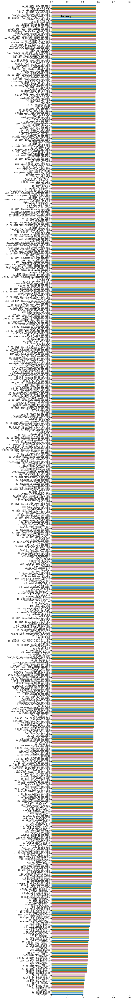

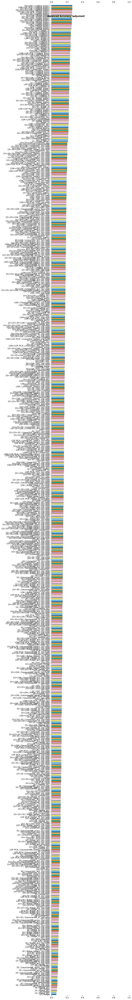

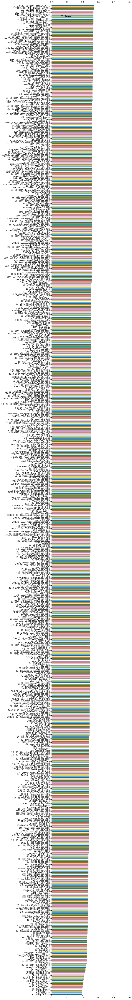

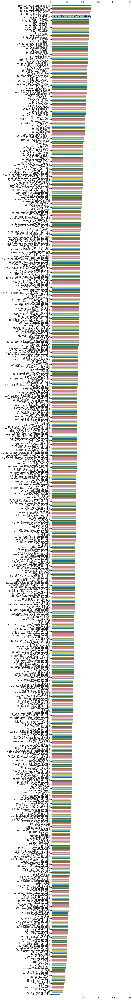

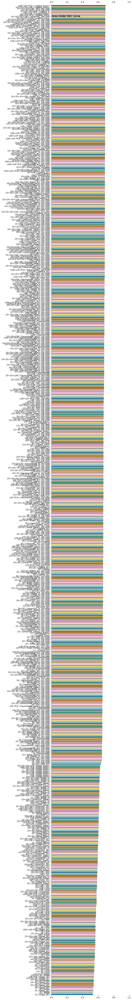

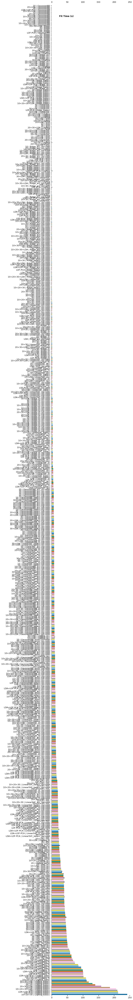

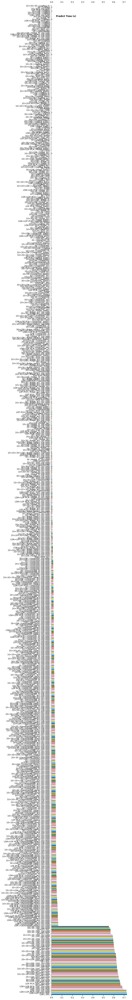

time: 2min 12s


In [25]:
for metric in tqdm(METRICS):
    plot_metric(metric, results_df)

# Discussion

Only some of the tests completed, but we have enough information to observe that although best performance may not be achieved through naively including all crafted features, structural multicollinearity doesn't seem to be too much of a problem. At any rate, some kind of LOF information appears more effective than just LDA components.

LOF20 may be slightly less informative than LOF10 or LOF30, but the best performers were trained on some combination of LDA and one or more LOF score.

It's disappointing to see that better scores were still achieved on the full untransformed features (as shown in a previous notebook). We have to decide whether the boost in training ease is worth the immediate drop in accuracy (that may be ameliorated or reversed by tuning). Maybe we can extract some one-class SVM features and obtain the benefits of SVC classification without the training and predict penalties, just some extra time in feature engineering. Running SVC on the LDA features isn't so bad; if we keep the number of total features < 100-ish, hopefully training (and to a lesser extent predict) won't be prohibitive.

LinearSVC and SGD don't really show up on the radar in terms of performance until LDA features are considered, particullarly for F1 scores. Aren't SGD w/ hinge loss, LinearSVC, and SVC w/ linear kernel roughly equivalent anyways? And isn't SGD w/ log loss very similar to LogReg? GaussianNB only became worth considering again when we introduced LDA components. It approaches the problem a lot differently, so I've been holding onto it in case of ensemble; it's also very fast in comparison. LogReg was supposed to be fast, but it gets really slow in tuning.

The top contenders by performance are LogReg and Ridge. SVC is a top performer as well, but it's quite slow.

Multiply nested cross validation is starting to induce data scarcity effects in the smaller splits. Hyperparameter tuning yielded worse scores on LDA components than when previously evaluated. Something may be different between the two harnesses that I'm not realizing yet. Those should've been the same LDA components on the same splits. Perhaps the difference is in the number of folds used for calibration. This notebook used 3 in places where some previous ones used 5. These results may not be comparable to previous results. If we're gonna calibrate, we might not be able to skimp on the cross validation folds. (more folds = more training data)

But that can't be the only factor. Even vanilla classifiers have different performances. Results may be internally consistent and comparable, but something is up between notebooks. Maybe the LDA components are getting scaled when they shouldn't be?

In [ ]:
print(f"Time elapsed since notebook_begin_time: {time() - notebook_begin_time} s")
_ = gc_collect()

[^top](#Contents)